In [1]:
import numpy as np
import pandas as pd
#from fractions import Fraction
from scipy.stats import entropy
#from typing import List, Dict, Optional
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

## 1. Importation of Symbolic Musical Features

In [2]:
df = pd.read_parquet("datasets/midi_features.parquet")

In [3]:
df.head()

,onset,duration,polyphony,key,local_key,time_signature,tempo,measure,beat_position,beat_fraction,...,track,pitch,pitch_class,pitch_octave,interval_to_prev,is_chord_tone,velocity,is_rest,genre,filename
0,0.0,4.0,23,3,3,4/4,120.0,1,1.0,0.25,...,I AM CANADIAN!,-1,-1,-1,0,0,-1,1,pop,Come On Over (All I Want Is You).mid
1,0.0,4.0,23,3,3,4/4,120.0,1,1.0,0.25,...,I AM CANADIAN!,-1,-1,-1,0,0,-1,1,pop,Come On Over (All I Want Is You).mid
2,0.0,4.0,23,3,3,4/4,120.0,1,1.0,0.25,...,I AM CANADIAN!,-1,-1,-1,0,0,-1,1,pop,Come On Over (All I Want Is You).mid
3,0.0,4.0,23,3,3,4/4,120.0,1,1.0,0.25,...,I AM CANADIAN!,-1,-1,-1,0,0,-1,1,pop,Come On Over (All I Want Is You).mid
4,0.0,4.0,23,3,3,4/4,120.0,1,1.0,0.25,...,I AM CANADIAN!,-1,-1,-1,0,0,-1,1,pop,Come On Over (All I Want Is You).mid


## 2. Exploratory Analysis of Symbolic Musical Features

Here a preliminary audit of the extracted MIDI features is performed to ensure structural integrity, identify potential anomalies, and confirm the plausibility of musical attributes such as pitch, duration, key, and instrumentation.

### 2.1 Global Characterization of the Symbolic Dataset

In [4]:
# Check for missing values
df.isnull().sum()

onset                     0
duration                  0
polyphony                 0
key                       0
local_key                 0
time_signature            0
tempo                     0
measure                   0
beat_position             0
beat_fraction             0
metric_weight             0
articulation_ratio    12327
instrument                0
instrument_family         0
track                     0
pitch                     0
pitch_class               0
pitch_octave              0
interval_to_prev          0
is_chord_tone             0
velocity                  0
is_rest                   0
genre                     0
filename                  0
dtype: int64

In [5]:
# Summary statistics for numerical columns
df.describe()

,onset,duration,polyphony,key,local_key,tempo,measure,beat_position,beat_fraction,metric_weight,articulation_ratio,pitch,pitch_class,pitch_octave,interval_to_prev,is_chord_tone,velocity,is_rest
count,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,626452.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000,638779.000000
mean,267.892058,0.823764,4.998873,10.839801,6.018081,115.721148,66.220006,2.617387,0.673748,0.604923,0.988940,39.148573,3.356644,2.403960,9.928548,0.374814,61.268022,0.327000
std,192.286239,1.044919,3.777656,7.456399,7.046452,23.444394,45.762462,1.238761,0.399286,0.312547,0.069636,30.085538,4.137733,2.621926,12.356673,0.484075,47.032506,0.469118
min,0.000000,0.000000,1.000000,0.000000,0.000000,50.000000,1.000000,1.000000,0.083333,0.200000,0.100000,-1.000000,-1.000000,-1.000000,0.000000,0.000000,-1.000000,0.000000
25%,122.500000,0.250000,2.000000,5.000000,0.000000,98.000000,31.000000,1.500000,0.354167,0.400000,1.000000,-1.000000,-1.000000,-1.000000,0.000000,0.000000,-1.000000,0.000000
50%,234.000000,0.500000,4.000000,9.000000,4.000000,120.000000,59.000000,2.500000,0.625000,0.600000,1.000000,51.000000,2.000000,3.000000,5.000000,0.000000,79.000000,0.000000
75%,364.750000,0.750000,6.000000,18.000000,10.000000,126.000000,91.000000,3.750000,0.937500,1.000000,1.000000,64.000000,7.000000,5.000000,17.000000,1.000000,100.000000,1.000000
max,1330.583333,55.000000,28.000000,23.000000,23.000000,194.000000,274.000000,4.944444,4.833333,1.000000,2.266667,108.000000,11.000000,9.000000,72.000000,1.000000,127.000000,1.000000


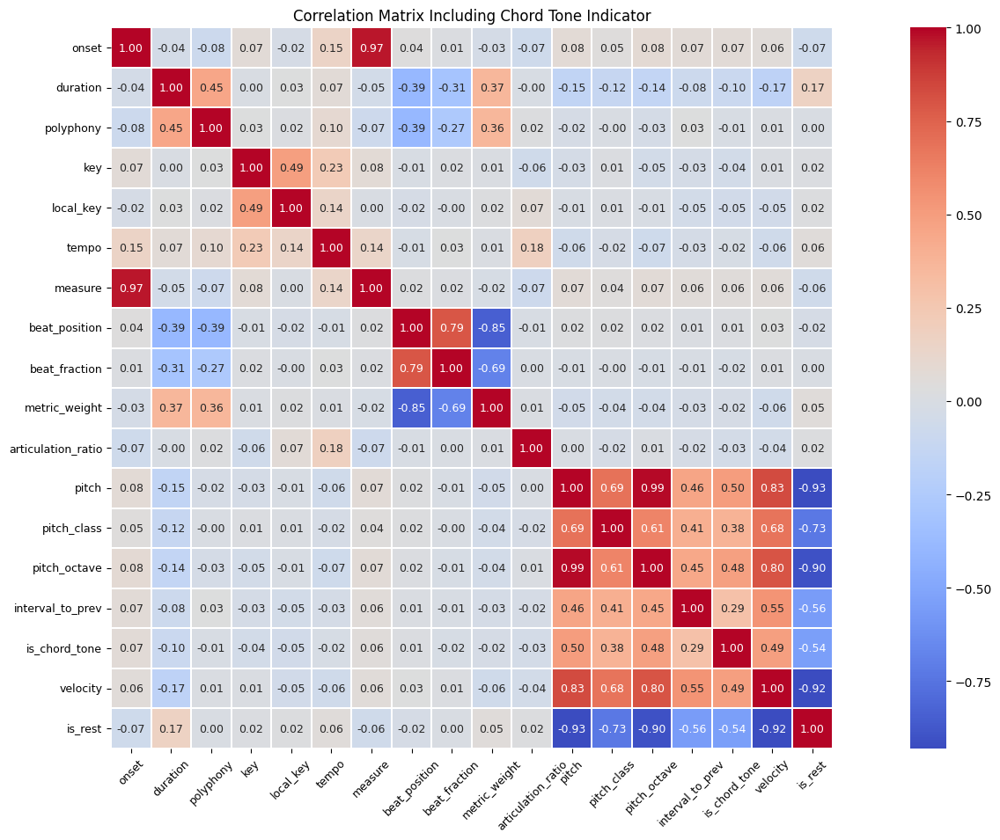

In [6]:
# Compute correlation with other numeric features
numerical_cols = df.select_dtypes(include='number').columns
correlation_matrix = df[numerical_cols].corr()

# Plot
plt.figure(figsize=(18, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.2, square=True, annot_kws={"size": 9})
plt.title("Correlation Matrix Including Chord Tone Indicator")
plt.tight_layout()
plt.xticks(rotation=45, fontsize=9)
plt.yticks(fontsize=9)
plt.show()

### 2.2 Feature-wise Distributional Analysis and Outlier Detection

#### 2.2.1 Pitch

##### 2.2.1.1 Central Tendency and Spread of Pitch Values

In [7]:
# Descriptive stats: proportion and spread of pitch values
df['pitch'].describe()

count    638779.000000
mean         39.148573
std          30.085538
min          -1.000000
25%          -1.000000
50%          51.000000
75%          64.000000
max         108.000000
Name: pitch, dtype: float64

In [8]:
# Exclude rests from analysis
df_notes_only = df[(df['is_rest'] == 0) & (df['pitch'] >= 0)].copy()

In [9]:
df_notes_only['pitch'].describe()

count    429898.000000
mean         58.656163
std          13.460451
min           0.000000
25%          50.000000
50%          60.000000
75%          67.000000
max         108.000000
Name: pitch, dtype: float64

In [10]:
# Central tendency
mean_pitch = df_notes_only['pitch'].mean()
median_pitch = df_notes_only['pitch'].median()
mode_pitch = df_notes_only['pitch'].mode()[0]

# Spread
std_pitch = df_notes_only['pitch'].std()

# Display results
print(f"Mean pitch: {mean_pitch:.1f}")
print(f"Median pitch: {median_pitch:.1f}")
print(f"Mode pitch: {mode_pitch:.1f}")
print(f"Standard deviation: {std_pitch:.1f}")

Mean pitch: 58.7
Median pitch: 60.0
Mode pitch: 62.0
Standard deviation: 13.5


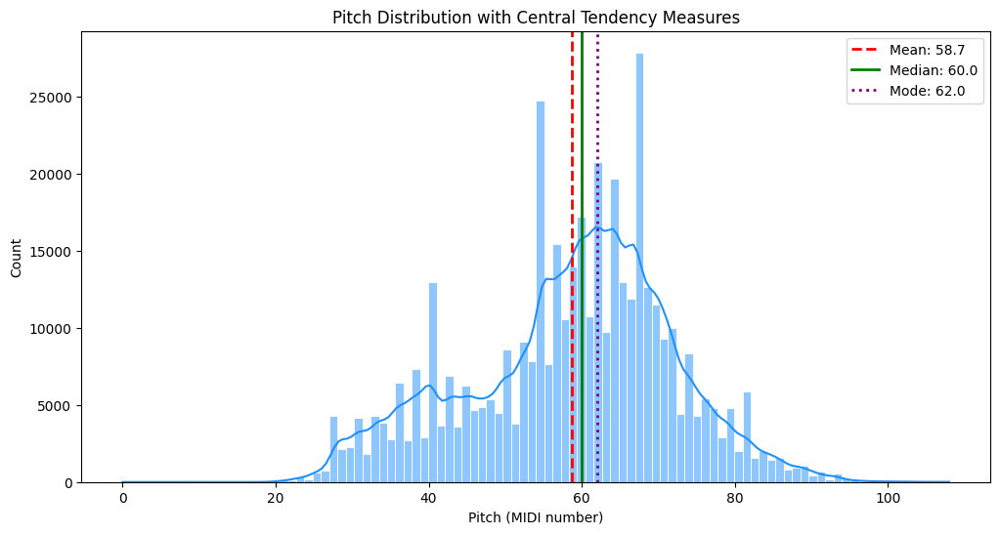

In [11]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['pitch'], bins=100, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_pitch, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_pitch:.1f}')
plt.axvline(median_pitch, color='green', linestyle='-', linewidth=2, label=f'Median: {median_pitch:.1f}')
plt.axvline(mode_pitch, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_pitch:.1f}')

plt.title('Pitch Distribution with Central Tendency Measures')
plt.xlabel('Pitch (MIDI number)')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.2.1.2 Outlier Detection in Pitch Values

In [12]:
# Confirm all values are within the valid MIDI range
valid_range = df_notes_only['pitch'].between(0, 127)
invalid_pitches = df_notes_only[~valid_range]

print(f"Number of invalid pitch values: {len(invalid_pitches)}")

# Count how many values are at the extreme edges
low_extremes = df_notes_only[df_notes_only['pitch'] <= 20]
high_extremes = df_notes_only[df_notes_only['pitch'] >= 110]

print(f"Pitches ≤ 20: {len(low_extremes)}")
print(f"Pitches ≥ 110: {len(high_extremes)}")

Number of invalid pitch values: 0
Pitches ≤ 20: 22
Pitches ≥ 110: 0


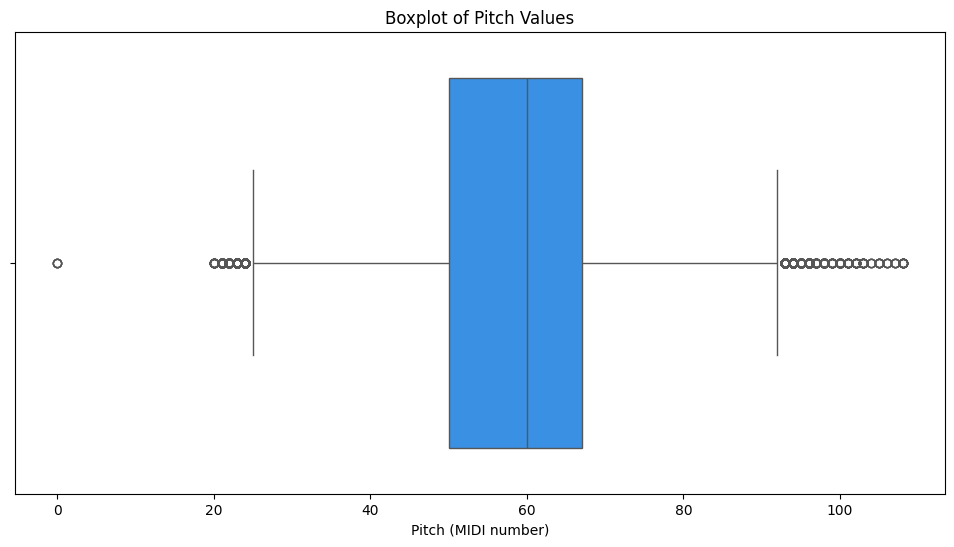

In [13]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_notes_only, x='pitch', color='dodgerblue')
plt.title('Boxplot of Pitch Values')
plt.xlabel('Pitch (MIDI number)')
plt.show()

##### 2.2.1.3 Distribution of Pitch Values over Time

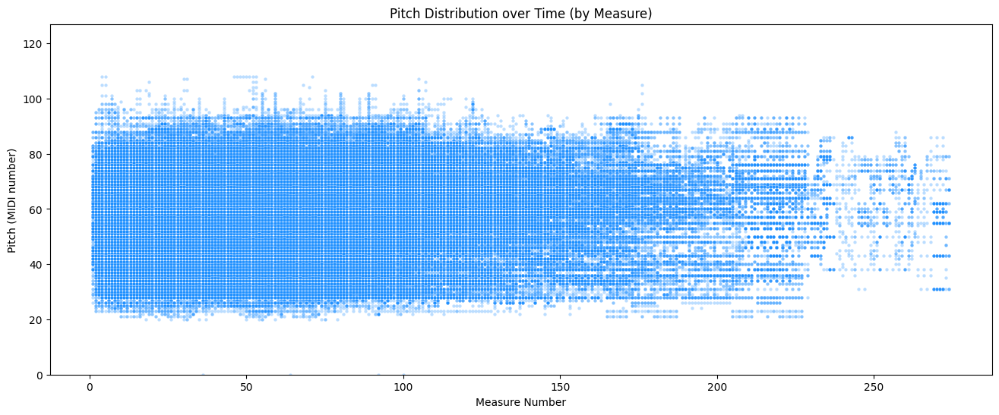

In [14]:
# Confirm global temporal coherence and get visual summary of pitch activity density across the piece's duration

plt.figure(figsize=(16, 6))
sns.scatterplot(data=df_notes_only, x='measure', y='pitch',alpha=0.3, s=10, color='dodgerblue')
plt.title('Pitch Distribution over Time (by Measure)')
plt.xlabel('Measure Number')
plt.ylabel('Pitch (MIDI number)')
plt.ylim(0, 127)
plt.show()

##### 2.2.1.4 Pitch Values in Context: Key, Instrument, and Genre

In [15]:
# Descriptive statistics of pitch values by key
print("Pitch statistics by Key:")
df_notes_only.groupby('key')['pitch'].describe().sort_index()

Pitch statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37542.0,59.368414,13.120191,24.0,53.00,62.0,67.0,108.0
1,11542.0,61.135332,12.069071,25.0,56.00,61.0,68.0,100.0
2,28424.0,57.407930,13.832375,26.0,48.00,61.0,66.0,98.0
3,19869.0,58.618250,13.145749,22.0,46.00,62.0,70.0,94.0
4,8342.0,58.351834,12.740690,23.0,52.00,61.0,68.0,103.0
5,43881.0,61.490827,13.459361,24.0,55.00,63.0,71.0,100.0
6,7158.0,59.972059,14.531856,20.0,55.00,61.0,68.0,94.0
7,38145.0,59.707327,12.038329,26.0,54.00,62.0,67.0,98.0
8,2710.0,60.544280,11.050042,27.0,56.00,61.0,68.0,87.0


In [16]:
# Display pitch distribution across keys, sorted alphabetically by musical key name

# Define mapping from numeric key to musical key name
key_mapping = {
    0: "C", 1: "C#/Db", 2: "D", 3: "D#/Eb", 4: "E", 5: "F", 6: "F#/Gb",
    7: "G", 8: "G#/Ab", 9: "A", 10: "A#/Bb", 11: "B",
    12: "Cm", 13: "C#m/Dbm", 14: "Dm", 15: "D#m/Ebm", 16: "Em", 17: "Fm", 18: "F#m/Gbm",
    19: "Gm", 20: "G#m/Abm", 21: "Am", 22: "A#m/Bbm", 23: "Bm"
}

# Add key names
df['key_name'] = df['key'].map(key_mapping)
df_notes_only['key_name'] = df_notes_only['key'].map(key_mapping)

# Sort keys alphabetically by their musical name
ordered_key_names = sorted(df_notes_only['key_name'].unique())

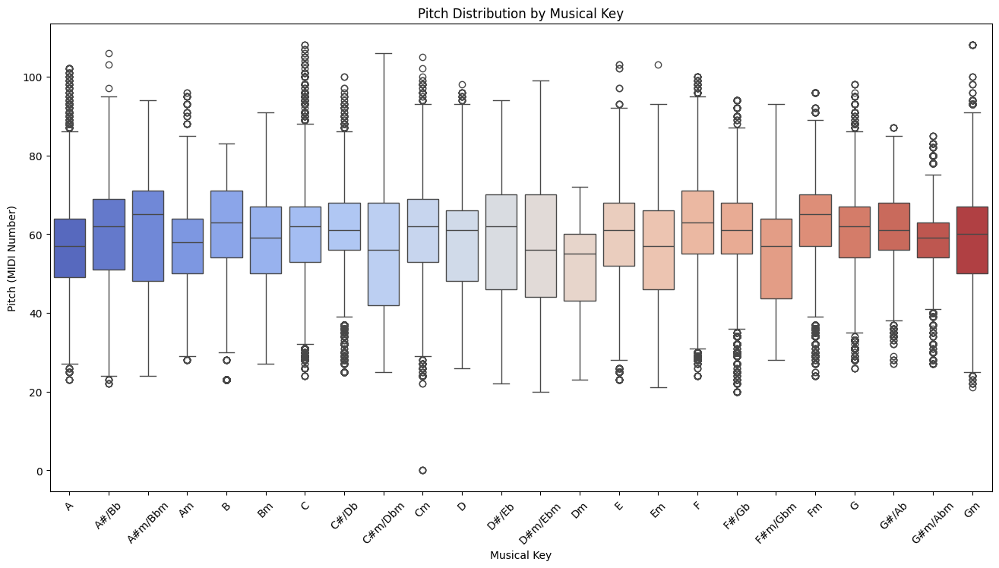

In [17]:
# Plot
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='pitch', order=ordered_key_names, palette='coolwarm')
plt.title('Pitch Distribution by Musical Key')
plt.xticks(rotation=45)
plt.xlabel('Musical Key')
plt.ylabel('Pitch (MIDI Number)')
plt.show()

In [18]:
# Descriptive statistics of pitch values by instrument
print("Pitch statistics by Instrument:")
df_notes_only.groupby('instrument')['pitch'].describe()

Pitch statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,58.762170,15.163369,21.0,48.00,63.0,70.0,100.0
Alto Saxophone,505.0,52.643564,17.578500,28.0,33.00,63.0,67.0,81.0
Bagpipes,4865.0,61.319219,13.356028,25.0,56.00,65.0,70.0,85.0
Banjo,872.0,61.495413,11.835845,37.0,61.00,67.0,71.0,71.0
Baritone Saxophone,1618.0,56.799135,11.051622,33.0,48.00,59.0,64.0,85.0
Bassoon,1729.0,62.702718,12.618631,31.0,50.00,67.0,72.0,83.0
Brass,2936.0,63.085150,15.068664,24.0,50.00,66.0,73.0,96.0
Choir,3971.0,64.112314,11.039840,26.0,61.00,66.0,69.0,93.0
Clarinet,998.0,59.876754,15.863189,25.0,49.00,68.0,68.0,103.0


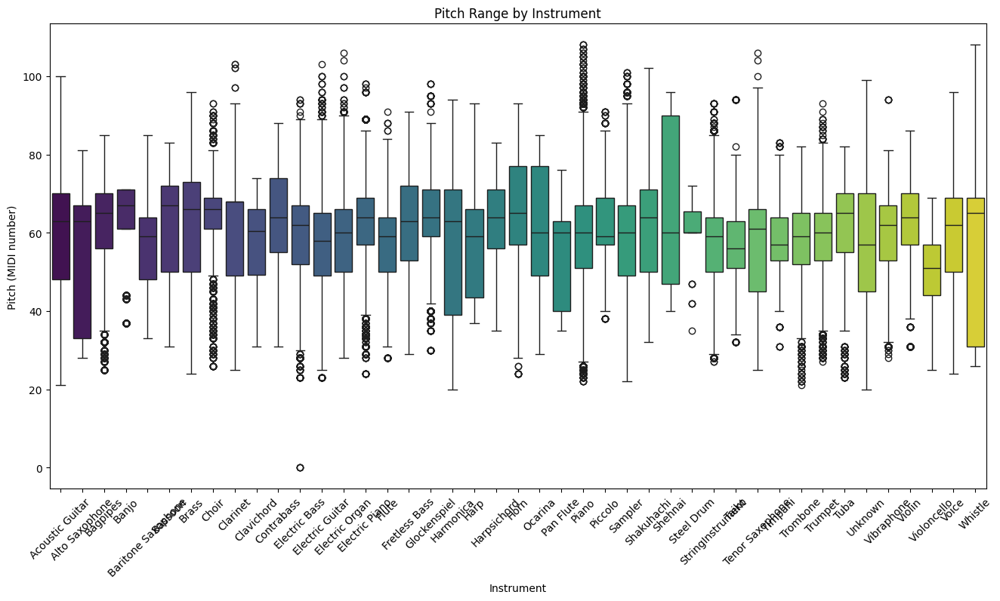

In [19]:
alphabetic_order = sorted(df_notes_only['instrument'].unique())

plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='pitch', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Pitch Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Pitch (MIDI number)')
plt.show()

In [20]:
# Descriptive statistics of pitch values by instrument family
print("Pitch statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['pitch'].describe()

Pitch statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,61.152055,13.057025,0.0,55.0,62.0,70.0,94.0
Brass,28615.0,62.553870,12.842640,21.0,55.0,62.0,71.0,93.0
Electronic,44647.0,58.231639,13.615068,22.0,50.0,61.0,67.0,101.0
Guitar,123066.0,57.091317,13.125764,21.0,48.0,59.0,67.0,103.0
Keyboard,115183.0,58.825825,13.230215,20.0,52.0,60.0,67.0,108.0
Other,26495.0,58.041970,15.508898,20.0,46.0,60.0,70.0,106.0
Percussion,12714.0,60.534608,11.628790,28.0,55.0,62.0,68.0,98.0
Strings,20311.0,58.290483,13.139347,25.0,50.0,59.0,66.0,93.0
Voice,18044.0,59.236145,13.418801,24.0,50.0,62.0,69.0,96.0


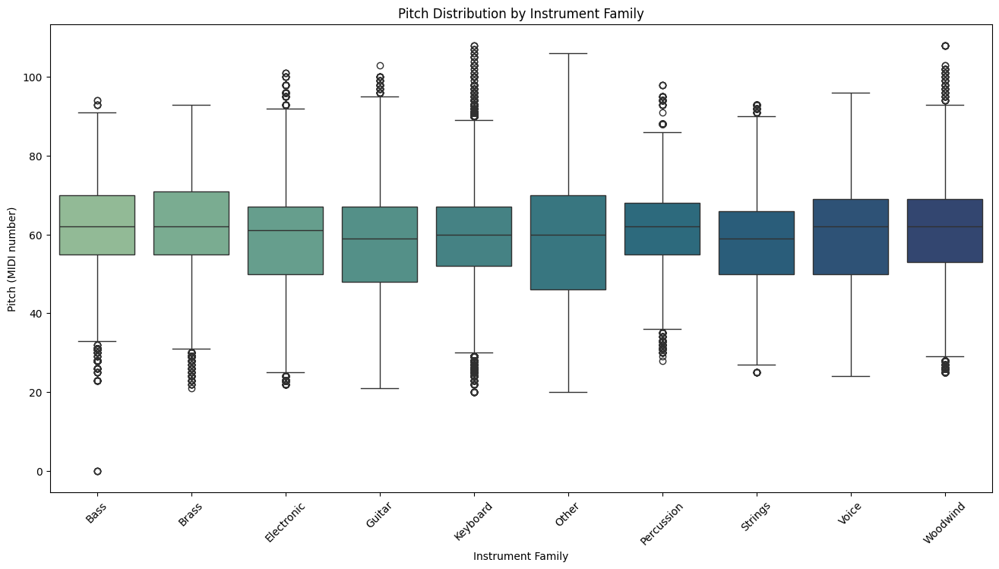

In [21]:
families = sorted(df_notes_only['instrument_family'].unique())

# Filter and plot pitch distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='pitch', palette='crest', order=families)
plt.title('Pitch Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Pitch (MIDI number)')
plt.xticks(rotation=45)
plt.show()

In [22]:
# Descriptive statistics of pitch values by genre
print("Pitch statistics by Genre:")
df_notes_only.groupby('genre')['pitch'].describe()

Pitch statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,54.890760,14.298299,25.0,44.0,57.0,66.0,103.0
blues,35519.0,59.814803,12.537029,22.0,54.0,62.0,69.0,106.0
classical,31269.0,64.418114,12.876346,24.0,55.0,65.0,74.0,100.0
country,34558.0,56.238527,12.146096,23.0,48.0,57.0,64.0,94.0
dance,34253.0,60.239191,15.372269,21.0,48.0,64.0,70.0,94.0
disco,34776.0,58.443294,13.240873,20.0,53.0,61.0,67.0,100.0
heavy_metal,32227.0,52.298632,13.525519,24.0,41.0,52.0,61.0,101.0
jazz,21851.0,59.332433,12.460760,21.0,53.0,61.0,67.0,108.0
new_age,29586.0,59.648753,12.316929,26.0,53.0,60.0,68.0,102.0


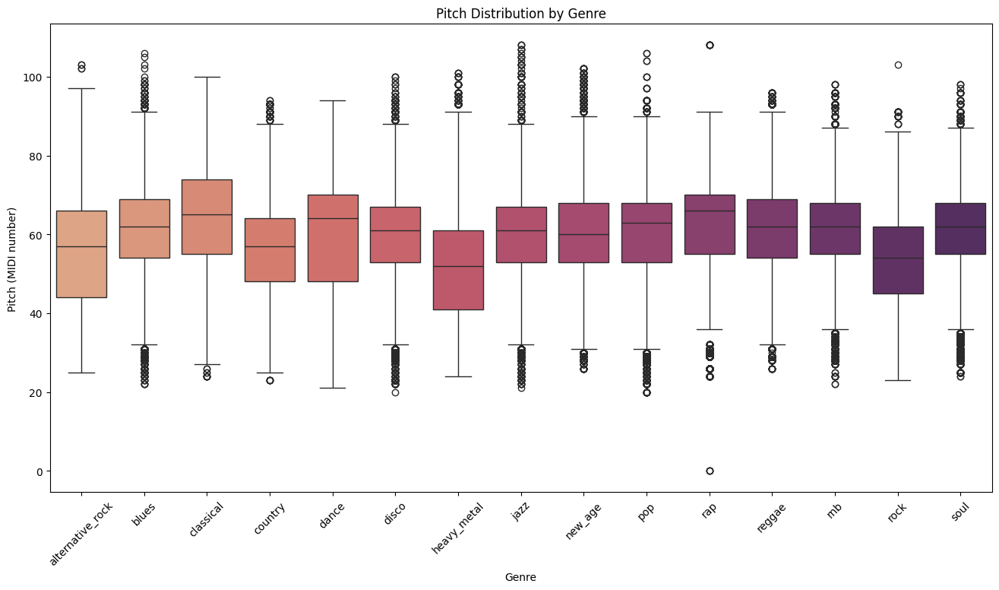

In [23]:
genres_sorted = sorted(df_notes_only['genre'].unique())

plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='pitch', palette='flare', order=genres_sorted)
plt.title('Pitch Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Pitch (MIDI number)')
plt.xticks(rotation=45)
plt.show()

#### 2.2.2 Pitch Class

##### 2.2.2.1 Central Tendency and Spread of Pitch Classes


In [24]:
# Descriptive stats: proportion and spread of pitch classes
df['pitch_class'].describe()

count    638779.000000
mean          3.356644
std           4.137733
min          -1.000000
25%          -1.000000
50%           2.000000
75%           7.000000
max          11.000000
Name: pitch_class, dtype: float64

In [25]:
df_notes_only['pitch_class'].describe()

count    429898.000000
mean          5.473473
std           3.425836
min           0.000000
25%           2.000000
50%           5.000000
75%           9.000000
max          11.000000
Name: pitch_class, dtype: float64

In [26]:
# Central tendency
mean_pitch_class = df_notes_only['pitch_class'].mean()
median_pitch_class = df_notes_only['pitch_class'].median()
mode_pitch_class = df_notes_only['pitch_class'].mode()[0]  

# Spread
std_pitch_class = df_notes_only['pitch_class'].std()

# Display results
print(f"Mean pitch class: {mean_pitch_class:.2f}")
print(f"Median pitch class: {median_pitch_class:.2f}")
print(f"Mode pitch class: {mode_pitch_class:.2f}")
print(f"Standard deviation: {std_pitch_class:.2f}")

Mean pitch class: 5.47
Median pitch class: 5.00
Mode pitch class: 7.00
Standard deviation: 3.43


In [27]:
# Map pitch class numbers to names (0=C, 1=C#, ..., 11=B)
pitch_class_names = {
    0: 'C',
    1: 'C♯/D♭',
    2: 'D',
    3: 'D♯/E♭',
    4: 'E',
    5: 'F',
    6: 'F♯/G♭',
    7: 'G',
    8: 'G♯/A♭',
    9: 'A',
    10: 'A♯/B♭',
    11: 'B'
}

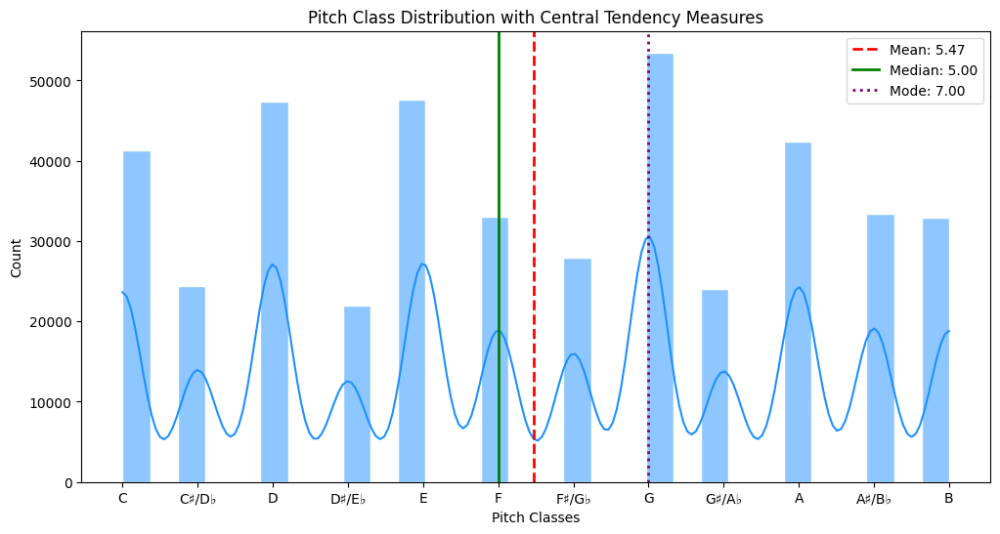

In [28]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['pitch_class'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_pitch_class, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_pitch_class:.2f}')
plt.axvline(median_pitch_class, color='green', linestyle='-', linewidth=2, label=f'Median: {median_pitch_class:.2f}')
plt.axvline(mode_pitch_class, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_pitch_class:.2f}')

plt.title('Pitch Class Distribution with Central Tendency Measures')
plt.xlabel('Pitch Classes')
plt.ylabel('Count')
plt.xticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.legend()
plt.show()

##### 2.2.2.2 Outlier Detection in Pitch Class Values

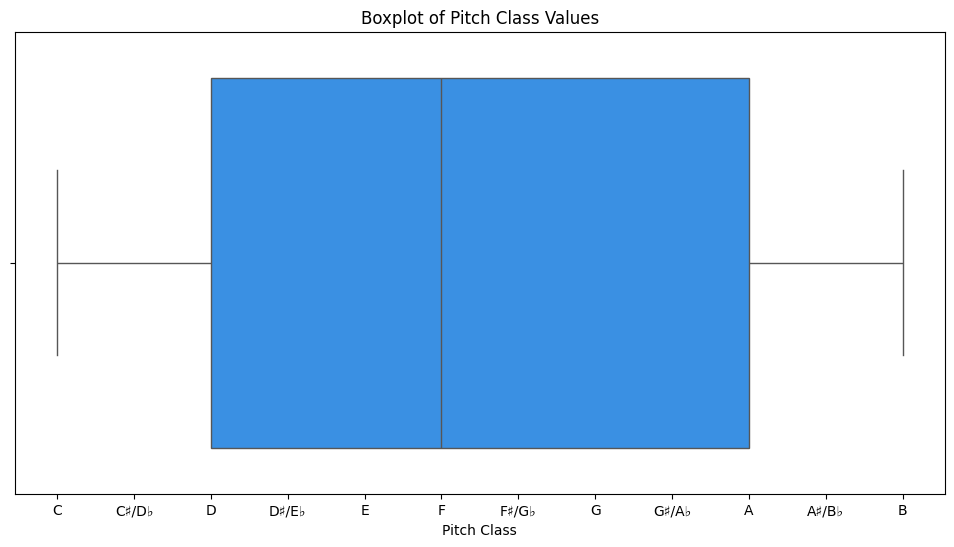

In [29]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_notes_only['pitch_class'], color='dodgerblue')
plt.title('Boxplot of Pitch Class Values')
plt.xlabel('Pitch Class')
plt.xticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.show()

##### 2.2.2.3 Pitch Classes in Context: Key, Instrument, and Genre

In [30]:
# Descriptive statistics of pitch classes by key
print("Pitch Class statistics by Key:")
df_notes_only.groupby('key')['pitch_class'].describe().sort_index()

Pitch Class statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37542.0,5.001465,3.458764,0.0,2.0,5.0,7.0,11.0
1,11542.0,5.145382,3.328973,0.0,1.0,5.0,8.0,11.0
2,28424.0,5.825324,3.192670,0.0,2.0,6.0,9.0,11.0
3,19869.0,5.778147,3.306168,0.0,3.0,7.0,9.0,11.0
4,8342.0,6.508152,3.203541,0.0,4.0,7.0,9.0,11.0
5,43881.0,4.801964,3.589794,0.0,2.0,5.0,7.0,11.0
6,7158.0,5.170718,3.524429,0.0,1.0,5.0,8.0,11.0
7,38145.0,5.347280,3.418379,0.0,2.0,6.0,9.0,11.0
8,2710.0,4.990037,3.459876,0.0,2.0,5.0,8.0,11.0


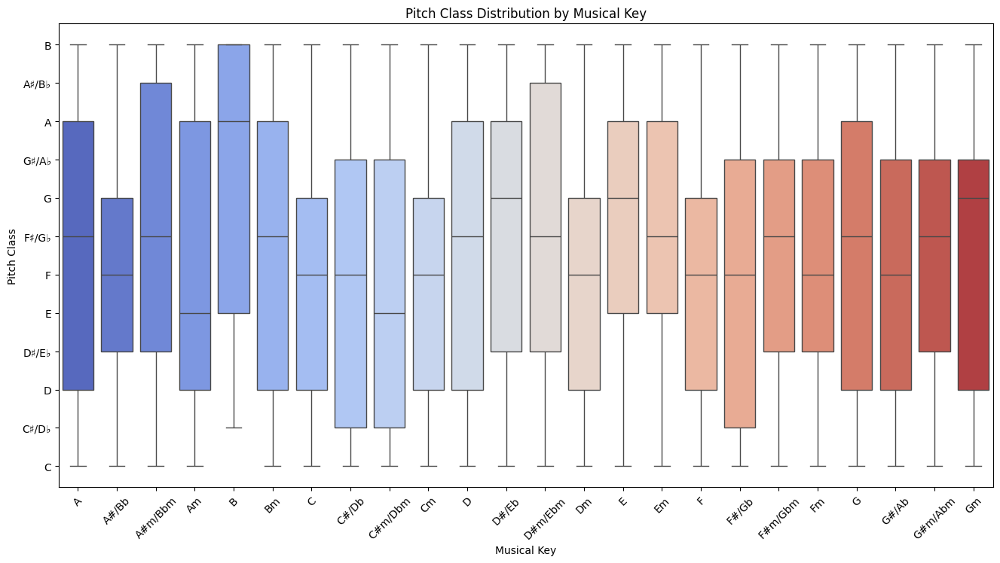

In [31]:
# Pitch Class distribution keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='pitch_class', order=ordered_key_names, palette='coolwarm')
plt.title('Pitch Class Distribution by Musical Key')
plt.xlabel('Musical Key')
plt.xticks(rotation=45)
plt.yticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.ylabel('Pitch Class')
plt.show()

In [32]:
# Descriptive statistics of pitch classes by instrument
print("Pitch Class statistics by Instrument:")
df_notes_only.groupby('instrument')['pitch_class'].describe()

Pitch Class statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,5.568480,3.490127,0.0,3.0,5.0,9.0,11.0
Alto Saxophone,505.0,5.689109,3.182975,0.0,3.0,6.0,8.0,11.0
Bagpipes,4865.0,5.100514,3.278715,0.0,1.0,5.0,8.0,11.0
Banjo,872.0,6.834862,3.559922,1.0,6.0,7.0,11.0,11.0
Baritone Saxophone,1618.0,4.868356,3.358497,0.0,2.0,5.0,7.0,11.0
Bassoon,1729.0,5.839792,3.439845,0.0,2.0,7.0,7.0,11.0
Brass,2936.0,5.006131,3.459569,0.0,2.0,5.0,8.0,11.0
Choir,3971.0,6.149081,3.262401,0.0,4.0,6.0,9.0,11.0
Clarinet,998.0,7.067134,2.666427,1.0,6.0,8.0,8.0,11.0


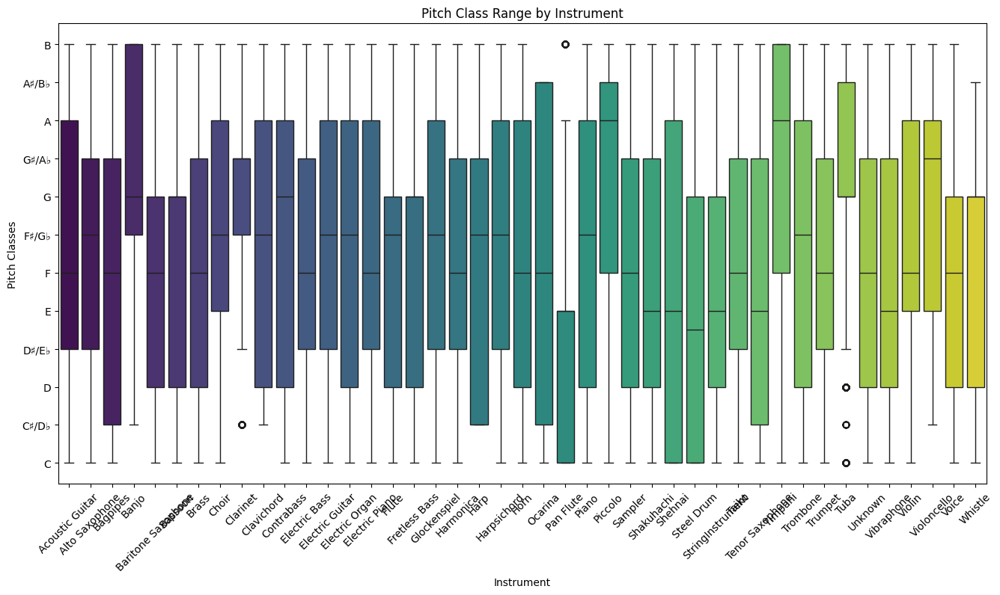

In [33]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='pitch_class', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Pitch Class Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Pitch Classes')
plt.yticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.show()

In [34]:
# Descriptive statistics of pitch classes by instrument family
print("Pitch Class statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['pitch_class'].describe()

Pitch Class statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,5.553292,3.373223,0.0,2.0,6.0,8.0,11.0
Brass,28615.0,5.530910,3.398584,0.0,3.0,5.0,9.0,11.0
Electronic,44647.0,5.370036,3.310499,0.0,3.0,5.0,8.0,11.0
Guitar,123066.0,5.639803,3.487272,0.0,3.0,6.0,9.0,11.0
Keyboard,115183.0,5.530148,3.373356,0.0,2.0,6.0,9.0,11.0
Other,26495.0,5.150934,3.367119,0.0,2.0,5.0,8.0,11.0
Percussion,12714.0,5.821063,3.550292,0.0,3.0,6.0,9.0,11.0
Strings,20311.0,4.977894,3.399591,0.0,2.0,4.0,8.0,11.0
Voice,18044.0,4.758646,3.633686,0.0,2.0,5.0,7.0,11.0


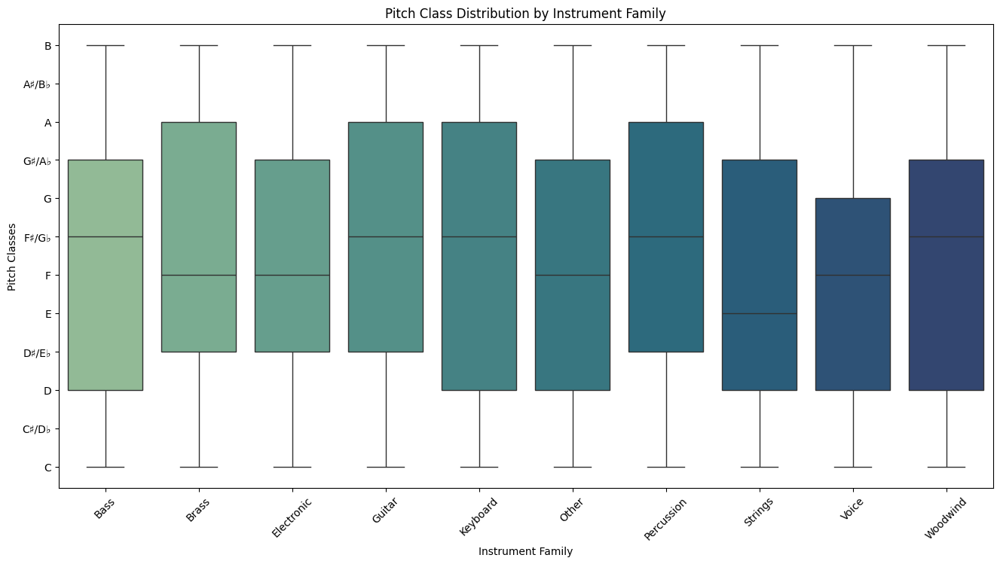

In [35]:
# Filter and plot pitch classes distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='pitch_class', palette='crest', order=families)
plt.title('Pitch Class Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Pitch Classes')
plt.xticks(rotation=45)
plt.yticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.show()

In [36]:
# Descriptive statistics of pitch classes by genre
print("Pitch Class statistics by Genre:")
df_notes_only.groupby('genre')['pitch_class'].describe()

Pitch Class statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,5.880430,3.469027,0.0,3.0,6.0,9.0,11.0
blues,35519.0,5.015288,3.569698,0.0,2.0,5.0,8.0,11.0
classical,31269.0,5.387508,3.397052,0.0,2.0,5.0,8.0,11.0
country,34558.0,5.619625,3.384081,0.0,3.0,6.0,9.0,11.0
dance,34253.0,5.657461,3.528152,0.0,3.0,5.0,9.0,11.0
disco,34776.0,5.427766,3.461496,0.0,2.0,6.0,9.0,11.0
heavy_metal,32227.0,5.320011,3.290025,0.0,2.0,5.0,8.0,11.0
jazz,21851.0,5.348634,3.417870,0.0,2.0,5.0,8.0,11.0
new_age,29586.0,5.727033,3.489987,0.0,2.0,6.0,9.0,11.0


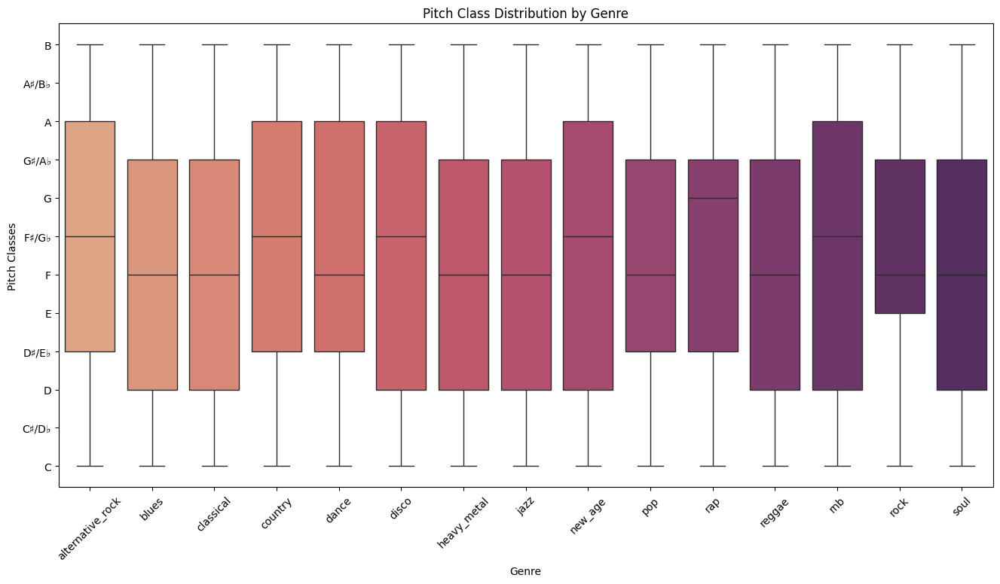

In [37]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='pitch_class', palette='flare', order=genres_sorted)
plt.title('Pitch Class Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Pitch Classes')
plt.xticks(rotation=45)
plt.yticks(ticks=np.arange(0, 12), labels=[pitch_class_names[i] for i in range(12)])
plt.show()

##### 2.2.2.4 Circular Visualization of Pitch Class Usage Aligned with Tonal Hierarchy

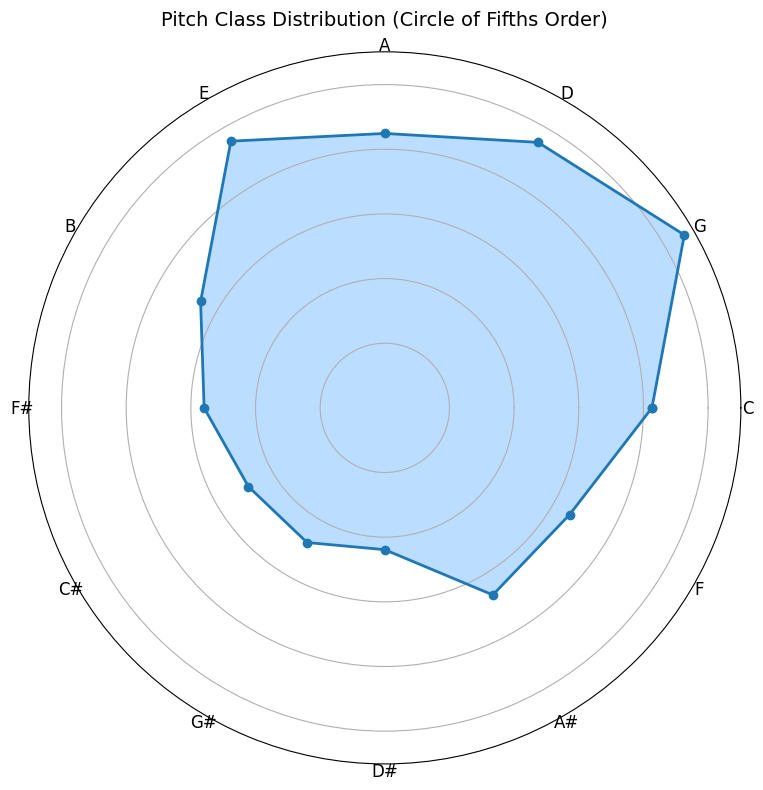

In [38]:
# Map pitch class numbers to names (0=C, 1=C#, ..., 11=B)
pitch_class_names_circle = {
    0: 'C', 1: 'C#', 2: 'D', 3: 'D#', 4: 'E', 5: 'F',
    6: 'F#', 7: 'G', 8: 'G#', 9: 'A', 10: 'A#', 11: 'B'
}

# Reorder pitch classes by Circle of Fifths
fifths_order = ['C', 'G', 'D', 'A', 'E', 'B', 'F#', 'C#', 'G#', 'D#', 'A#', 'F']

# Count occurrences for each pitch class
pitch_counts = df['pitch_class'].map(pitch_class_names_circle).value_counts().reindex(fifths_order, fill_value=0)

# Set up circular plot
angles = np.linspace(0, 2 * np.pi, 12, endpoint=False)
values = pitch_counts.values
labels = pitch_counts.index

# Repeat the first value to close the circle
angles = np.concatenate([angles, [angles[0]]])
values = np.concatenate([values, [values[0]]])

# Plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, values, 'o-', linewidth=2)
ax.fill(angles, values, alpha=0.3, color='dodgerblue')

# Add pitch class labels
for angle, label in zip(angles[:-1], labels):
    ax.text(angle, max(values)*1.05, label, ha='center', va='center', fontsize=12)

# Remove radial labels for clarity
ax.set_yticklabels([])
ax.set_xticks([])

ax.set_title('Pitch Class Distribution (Circle of Fifths Order)', fontsize=14, pad=20)
plt.tight_layout()
plt.show()

#### 2.2.3 Pitch Octave

##### 2.2.3.1 Distribution of Pitch Octaves and Measures of Central Tendency

In [39]:
# Descriptive stats: proportion and spread of pitch octaves
df['pitch_octave'].describe()

count    638779.000000
mean          2.403960
std           2.621926
min          -1.000000
25%          -1.000000
50%           3.000000
75%           5.000000
max           9.000000
Name: pitch_octave, dtype: float64

In [40]:
df_notes_only['pitch_octave'].describe()

count    429898.000000
mean          4.057893
std           1.359883
min          -1.000000
25%           3.000000
50%           4.000000
75%           5.000000
max           9.000000
Name: pitch_octave, dtype: float64

In [41]:
# Central tendency
mean_pitch_octave = df_notes_only['pitch_octave'].mean()
median_pitch_octave = df_notes_only['pitch_octave'].median()
mode_pitch_octave = df_notes_only['pitch_octave'].mode()[0]  

# Spread
std_pitch_octave = df_notes_only['pitch_octave'].std()

# Display results
print(f"Mean pitch octave: {mean_pitch_octave:.2f}")
print(f"Median pitch octave: {median_pitch_octave:.2f}")
print(f"Mode pitch octave: {mode_pitch_octave:.2f}")
print(f"Standard deviation: {std_pitch_octave:.2f}")

Mean pitch octave: 4.06
Median pitch octave: 4.00
Mode pitch octave: 5.00
Standard deviation: 1.36


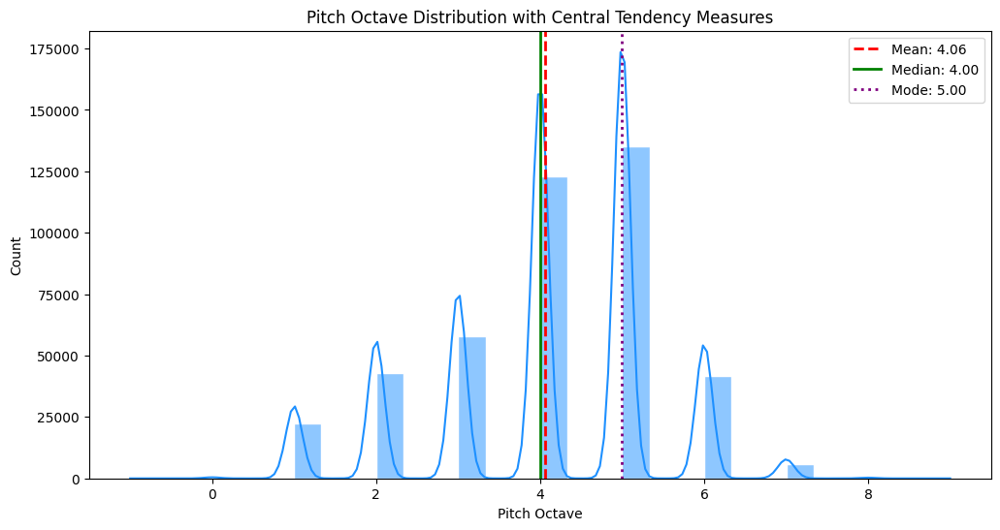

In [42]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['pitch_octave'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_pitch_octave, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_pitch_octave:.2f}')
plt.axvline(median_pitch_octave, color='green', linestyle='-', linewidth=2, label=f'Median: {median_pitch_octave:.2f}')
plt.axvline(mode_pitch_octave, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_pitch_octave:.2f}')

plt.title('Pitch Octave Distribution with Central Tendency Measures')
plt.xlabel('Pitch Octave')
plt.ylabel('Count') 
plt.legend()
plt.show()

##### 2.3.3.2 Detection of Anomalous Octave Assignments via Boxplot Inspection

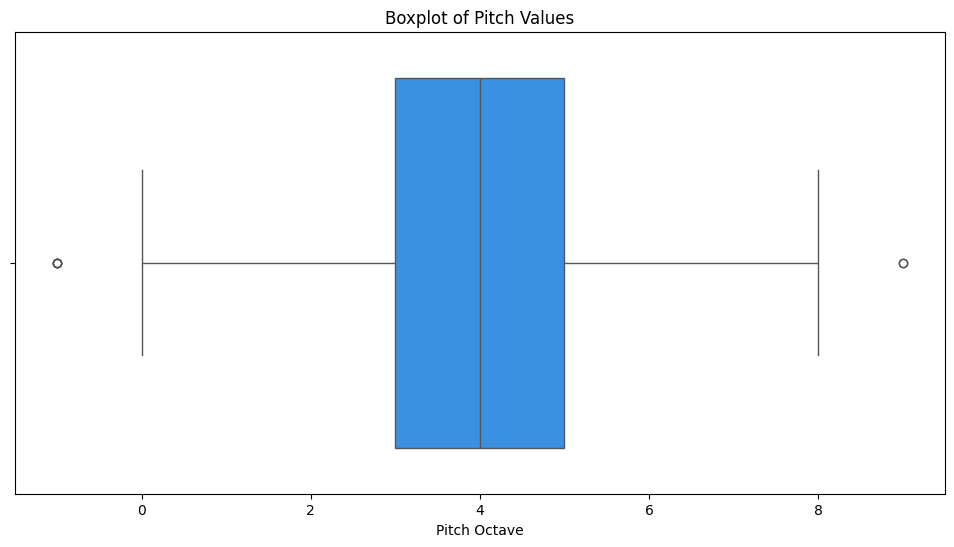

In [43]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_notes_only, x='pitch_octave', color='dodgerblue')
plt.title('Boxplot of Pitch Values')
plt.xlabel('Pitch Octave')
plt.show()

In [44]:
df_notes_only[df_notes_only['pitch_octave'] < 0][['filename', 'pitch_octave', 'instrument']]

,filename,pitch_octave,instrument
599902,The Real Slim Shady.mid,-1,Electric Bass
600908,The Real Slim Shady.mid,-1,Electric Bass
601912,The Real Slim Shady.mid,-1,Electric Bass
602263,The Real Slim Shady.mid,-1,Electric Bass


##### 2.3.3.3 Pitch Octave Values in Context: Key, Instrument, and Genre

In [45]:
# Descriptive statistics pitch by key
print("Pitch Octave statistics by Key:")
df_notes_only.groupby('key')['pitch_octave'].describe().sort_index()

Pitch Octave statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37542.0,4.151457,1.340837,1.0,4.0,4.0,5.0,9.0
1,11542.0,4.356784,1.299149,1.0,4.0,5.0,5.0,8.0
2,28424.0,3.990184,1.387697,1.0,3.0,4.0,5.0,8.0
3,19869.0,3.954603,1.421934,0.0,3.0,4.0,5.0,7.0
4,8342.0,3.948693,1.212869,0.0,3.0,4.0,5.0,7.0
5,43881.0,4.448736,1.344669,1.0,4.0,5.0,5.0,8.0
6,7158.0,4.435317,1.276148,1.0,4.0,5.0,5.0,7.0
7,38145.0,4.179316,1.187086,1.0,4.0,4.0,5.0,8.0
8,2710.0,4.026199,1.095839,1.0,4.0,4.0,5.0,7.0


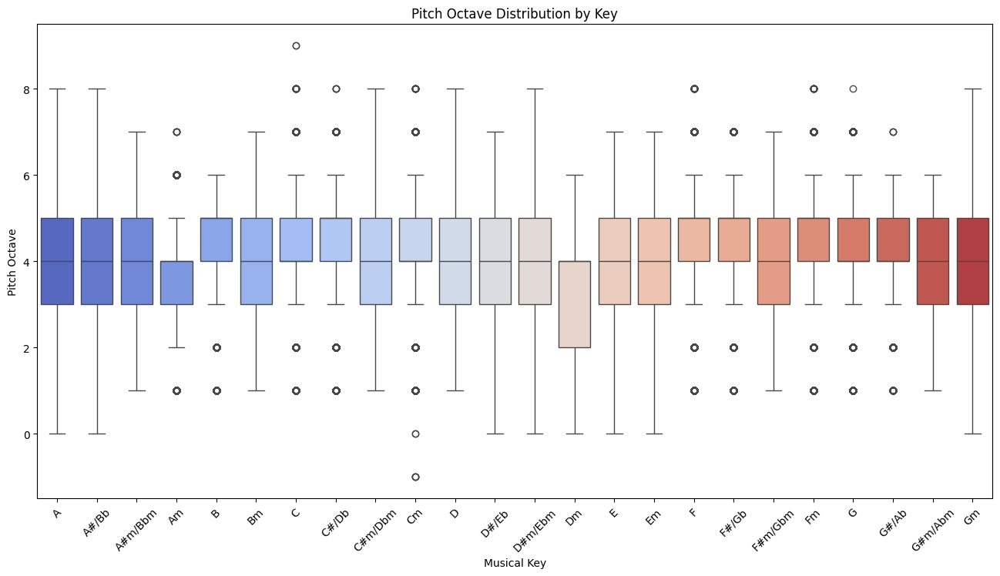

In [46]:
# Pitch Octave distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='pitch_octave', order=ordered_key_names, palette='coolwarm')
plt.title('Pitch Octave Distribution by Key')
plt.xlabel('Musical Key')
plt.xticks(rotation = 45)
plt.ylabel('Pitch Octave')
plt.show()

In [47]:
# Descriptive statistics of pitch octave values by instrument
print("Pitch Octave statistics by Instrument:")
df_notes_only.groupby('instrument')['pitch_octave'].describe()

Pitch Octave statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,4.024179,1.584976,0.0,3.00,5.0,5.0,8.0
Alto Saxophone,505.0,3.085149,1.684040,1.0,1.00,4.0,4.0,6.0
Bagpipes,4865.0,4.437821,1.387758,1.0,4.00,5.0,5.0,6.0
Banjo,872.0,4.443807,1.066797,2.0,5.00,5.0,5.0,5.0
Baritone Saxophone,1618.0,3.660692,1.179793,1.0,3.00,4.0,5.0,7.0
Bassoon,1729.0,3.825333,1.018137,1.0,3.00,4.0,5.0,5.0
Brass,2936.0,4.660082,1.393678,1.0,4.00,5.0,6.0,8.0
Choir,3971.0,4.436918,1.173913,1.0,4.00,5.0,5.0,7.0
Clarinet,998.0,3.649299,1.238489,1.0,3.00,4.0,4.0,7.0


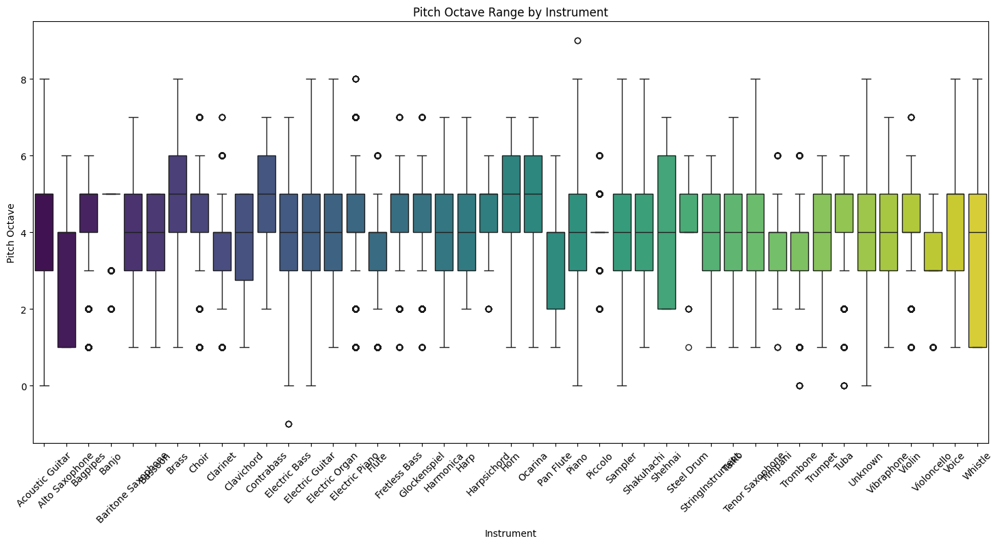

In [48]:
plt.figure(figsize=(18, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='pitch_octave', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Pitch Octave Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Pitch Octave')
plt.show()

In [49]:
# Descriptive statistics of pitch octave values by instrument family
print("Pitch Octave statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['pitch_octave'].describe()

Pitch Octave statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,4.417743,1.237133,-1.0,4.0,5.0,5.0,7.0
Brass,28615.0,4.466049,1.253565,0.0,4.0,4.0,5.0,7.0
Electronic,44647.0,4.069232,1.352749,0.0,3.0,4.0,5.0,8.0
Guitar,123066.0,3.904247,1.339818,0.0,3.0,4.0,5.0,8.0
Keyboard,115183.0,4.104034,1.362620,0.0,3.0,4.0,5.0,9.0
Other,26495.0,3.873561,1.557053,0.0,3.0,4.0,5.0,8.0
Percussion,12714.0,4.104688,1.184859,1.0,4.0,4.0,5.0,7.0
Strings,20311.0,3.970509,1.242909,1.0,3.0,4.0,5.0,7.0
Voice,18044.0,4.120816,1.417709,1.0,3.0,5.0,5.0,8.0


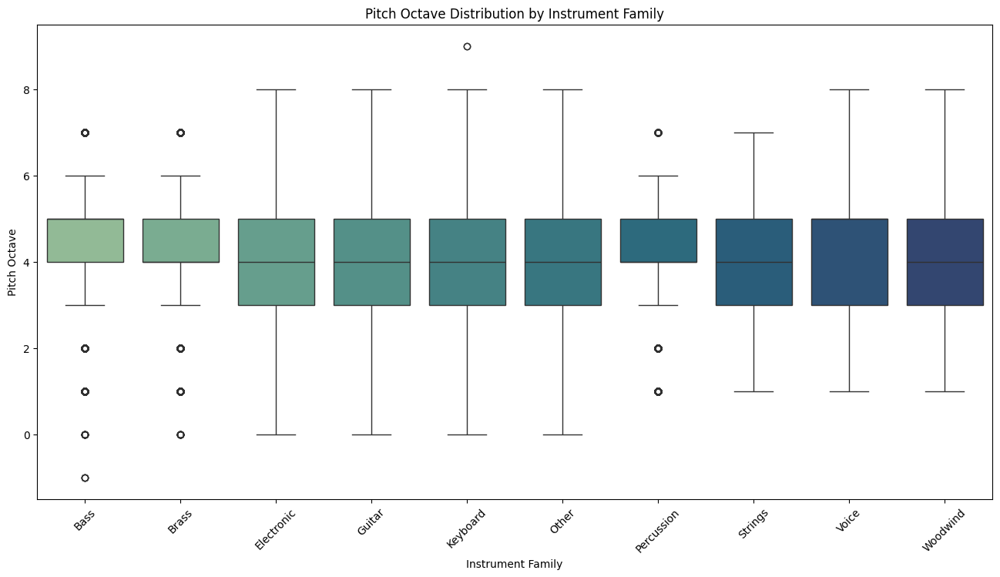

In [50]:
# Filter and plot pitch octave distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='pitch_octave', palette='crest', order=families)
plt.title('Pitch Octave Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Pitch Octave')
plt.xticks(rotation=45)
plt.show()

In [51]:
# Descriptive statistics of pitch octave values by genre
print("Pitch Octave statistics by Genre:")
df_notes_only.groupby('genre')['pitch_octave'].describe()

Pitch Octave statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,3.644875,1.380034,1.0,3.0,4.0,5.0,7.0
blues,35519.0,4.191250,1.287294,0.0,4.0,4.0,5.0,8.0
classical,31269.0,4.760626,1.151186,1.0,4.0,5.0,6.0,8.0
country,34558.0,3.864923,1.269504,0.0,3.0,4.0,5.0,7.0
dance,34253.0,4.051236,1.541507,0.0,3.0,4.0,5.0,7.0
disco,34776.0,4.045462,1.439078,0.0,3.0,4.0,5.0,8.0
heavy_metal,32227.0,3.413287,1.319481,1.0,3.0,3.0,4.0,8.0
jazz,21851.0,4.027779,1.289424,0.0,3.0,4.0,5.0,9.0
new_age,29586.0,4.061752,1.265288,1.0,3.0,4.0,5.0,8.0


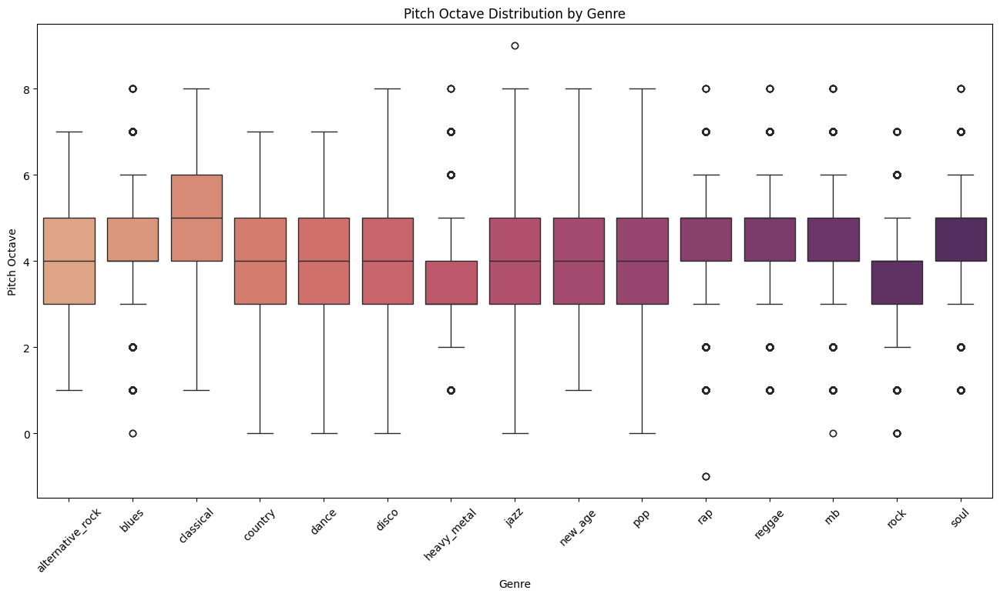

In [52]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='pitch_octave', palette='flare', order=genres_sorted)
plt.title('Pitch Octave Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Pitch Octave')
plt.xticks(rotation=45)
plt.show()

#### 2.3.4 Onset

##### 2.3.4.1 Temporal Distribution of Note Onsets and Measures of Central Tendency


In [53]:
# Descriptive stats: proportion and spread of onset values
df['onset'].describe()

count    638779.000000
mean        267.892058
std         192.286239
min           0.000000
25%         122.500000
50%         234.000000
75%         364.750000
max        1330.583333
Name: onset, dtype: float64

In [54]:
# Central tendency
mean_onset = df['onset'].mean()
median_onset = df['onset'].median()
mode_onset = df['onset'].mode()[0]  

# Spread
std_onset = df['onset'].std()

# Display results
print(f"Mean onset: {mean_onset:.1f}")
print(f"Median onset: {median_onset:.1f}")
print(f"Mode onset: {mode_onset:.1f}")
print(f"Standard deviation: {std_onset:.1f}")
print(f"Average number of events per piece: {len(df) / df['filename'].nunique():.1f}")

Mean onset: 267.9
Median onset: 234.0
Mode onset: 24.0
Standard deviation: 192.3
Average number of events per piece: 5323.2


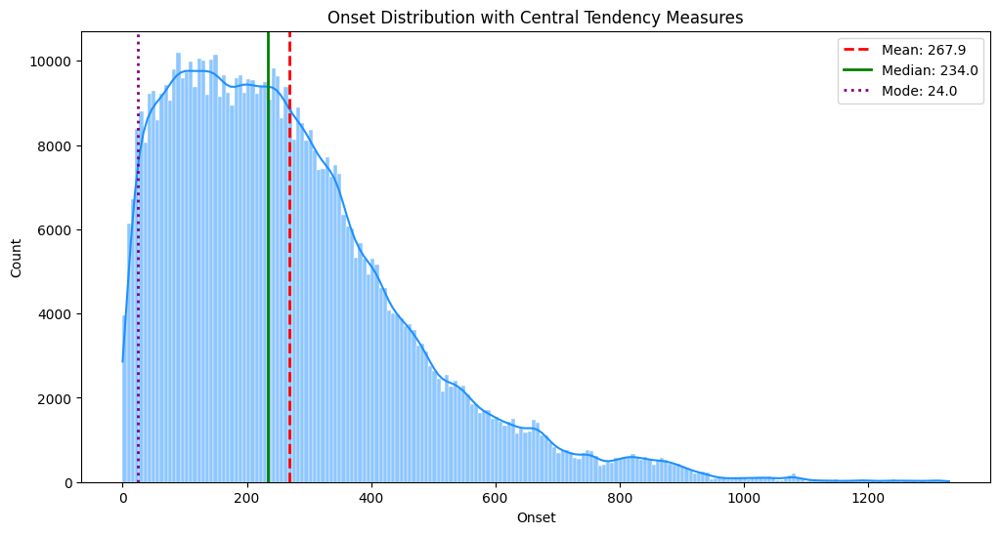

In [55]:
plt.figure(figsize=(12, 6))
sns.histplot(df['onset'], bins=200, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_onset, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_onset:.1f}')
plt.axvline(median_onset, color='green', linestyle='-', linewidth=2, label=f'Median: {median_onset:.1f}')
plt.axvline(mode_onset, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_onset:.1f}')

plt.title('Onset Distribution with Central Tendency Measures')
plt.xlabel('Onset')
plt.ylabel('Count')
plt.legend()
plt.show()

In [56]:
# Descriptive statistics per piece
piece_stats = df.groupby('filename')['onset'].agg([
    'count', 'min', 'max', 'mean', 'std'
]).round(2)

print("Statistics per piece:")
print(piece_stats.describe())

# Check pieces starting at onset=0
starts_at_zero = df.groupby('filename')['onset'].min() == 0
print(f"Pieces starting at onset=0: {starts_at_zero.sum()}/{len(starts_at_zero)} ({starts_at_zero.mean()*100:.1f}%)")

# Identify potentially problematic pieces
problematic_pieces = piece_stats[
    (piece_stats['min'] != 0) |  
    (piece_stats['count'] < 10) | 
    (piece_stats['max'] > 2000)  
]
print(f"\nPotentially problematic pieces: {len(problematic_pieces)}")
if len(problematic_pieces) > 0:
    print(problematic_pieces.head())

Statistics per piece:
              count         min          max        mean         std
count    120.000000  120.000000   120.000000  120.000000  120.000000
mean    5323.158333    0.006250   471.713750  237.986667  130.074500
std     3084.710708    0.039195   190.778014   94.157726   54.602165
min      708.000000    0.000000   149.750000   84.910000   39.360000
25%     3375.750000    0.000000   351.480000  174.202500   95.755000
50%     4897.500000    0.000000   435.085000  222.610000  120.980000
75%     6651.250000    0.000000   566.835000  269.030000  147.545000
max    20049.000000    0.250000  1330.580000  639.740000  390.260000
Pieces starting at onset=0: 117/120 (97.5%)

Potentially problematic pieces: 3
                       count   min     max    mean     std
filename                                                  
Hey Lover.mid           2600  0.25  419.83  202.78  120.94
No Scrubs.mid           1582  0.25  291.00  148.68   86.47
Rivers Of Babylon.mid   3601  0.25  566.08

In [57]:
# Check their exact pattern
problematic_pieces = ['Hey Lover.mid', 'No Scrubs.mid', 'Rivers Of Babylon.mid']

for piece in problematic_pieces:
    piece_data = df[df['filename'] == piece]['onset'].sort_values()
    print(f"\n{piece}:")
    print(f"  First onsets: {piece_data.head(10).values}")
    print(f"  Pattern of differences: {np.diff(piece_data.head(10).values)}")


Hey Lover.mid:
  First onsets: [0.25 1.25 1.5  2.25 3.25 4.   4.   4.   4.   4.  ]
  Pattern of differences: [1.   0.25 0.75 1.   0.75 0.   0.   0.   0.  ]

No Scrubs.mid:
  First onsets: [0.25 1.25 1.75 2.25 3.25 4.   4.   4.   4.25 4.5 ]
  Pattern of differences: [1.   0.5  0.5  1.   0.75 0.   0.   0.25 0.25]

Rivers Of Babylon.mid:
  First onsets: [0.25 1.25 2.25 4.   4.   4.25 4.5  4.75 5.   5.25]
  Pattern of differences: [1.   1.   1.75 0.   0.25 0.25 0.25 0.25 0.25]


##### 2.3.4.2 Temporal Resolution Analysis and Rhythmic Quantization Validation

In [58]:
# Verify MIDI quantization consistency
all_onsets = df['onset'].values
decimal_parts = all_onsets % 1
unique_subdivisions = np.unique(decimal_parts)

print("Temporal subdivisions used:")
print(f"Unique decimal parts: \n {unique_subdivisions}")
print(f"\n Probable resolution: {1/np.gcd.reduce((unique_subdivisions[unique_subdivisions > 0] * 100).astype(int))} quarter note")

Temporal subdivisions used:
Unique decimal parts: 
 [0.         0.08333333 0.08333333 0.08333333 0.08333333 0.08333333
 0.08333333 0.08333333 0.08333333 0.08333333 0.16666667 0.16666667
 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667
 0.16666667 0.25       0.33333333 0.33333333 0.33333333 0.33333333
 0.33333333 0.33333333 0.33333333 0.33333333 0.33333333 0.33333333
 0.33333333 0.33333333 0.41666667 0.41666667 0.41666667 0.41666667
 0.41666667 0.41666667 0.41666667 0.41666667 0.41666667 0.41666667
 0.5        0.58333333 0.58333333 0.58333333 0.58333333 0.58333333
 0.58333333 0.58333333 0.58333333 0.58333333 0.58333333 0.58333333
 0.66666667 0.66666667 0.66666667 0.66666667 0.66666667 0.66666667
 0.66666667 0.66666667 0.66666667 0.66666667 0.66666667 0.66666667
 0.75       0.83333333 0.83333333 0.83333333 0.83333333 0.83333333
 0.83333333 0.83333333 0.83333333 0.83333333 0.83333333 0.83333333
 0.91666667 0.91666667 0.91666667 0.91666667 0.91666667 0.91666667
 0.9166666

In [59]:
subdivisions_clean = np.unique(np.round(decimal_parts, 8))
print("Main subdivisions:")
for sub in subdivisions_clean:
    fraction = f"{int(sub*12)}/12" if sub > 0 else "0"
    print(f"{sub:.8f} = {fraction}")

Main subdivisions:
0.00000000 = 0
0.08333333 = 0/12
0.16666667 = 2/12
0.25000000 = 3/12
0.33333333 = 3/12
0.41666667 = 5/12
0.50000000 = 6/12
0.58333333 = 6/12
0.66666667 = 8/12
0.75000000 = 9/12
0.83333333 = 9/12
0.91666667 = 11/12


In [60]:
# Data Engineering
df['subdivision_12'] = (df['onset'] * 12) % 12  
df_notes_only['subdivision_12'] = (df_notes_only['onset'] * 12) % 12  

df['beat_type_detailed'] = df['subdivision_12'].map({
    0: 'beat',           
    1: 'triplet_1',      
    2: 'eighth_ternary',   
    3: 'quarter',        
    4: 'triplet_2',      
    6: 'half',           
    8: 'triplet_3',      
    9: 'dotted',         
}).fillna('other')

df_notes_only['beat_type_detailed'] = df_notes_only['subdivision_12'].map({
    0: 'beat',           
    1: 'triplet_1',      
    2: 'eighth_ternary',   
    3: 'quarter',        
    4: 'triplet_2',      
    6: 'half',           
    8: 'triplet_3',      
    9: 'dotted',         
}).fillna('other')

print("Distribution of rhythmic positions:")
print(df['beat_type_detailed'].value_counts().head(10))

Distribution of rhythmic positions:
beat_type_detailed
beat              247409
half              135615
dotted             94898
quarter            88130
other              24250
triplet_3          21746
triplet_2          16324
triplet_1           5311
eighth_ternary      5096
Name: count, dtype: int64


Maximum quantization error: 0.00
The data are well quantized.


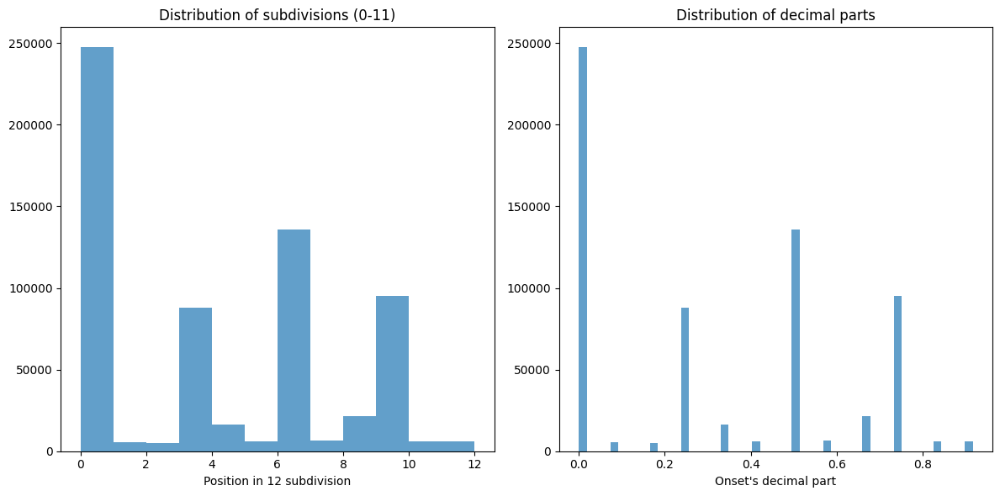

In [61]:
# Verify quantization consistency
onset_12ths = df['onset'] * 12
quantization_errors = onset_12ths - np.round(onset_12ths)
max_error = np.abs(quantization_errors).max()

print(f"Maximum quantization error: {max_error:.2f}")
print(f"The data {'are' if max_error < 1e-10 else 'are not'} well quantized.")

# Distribution of rhythmic positions
plt.figure(figsize=(12, 6))
plt.subplot(1,2,1)
plt.hist(df['subdivision_12'], bins=12, range=(0,12), alpha=0.7)
plt.title('Distribution of subdivisions (0-11)')
plt.xlabel('Position in 12 subdivision')

plt.subplot(1,2,2)
plt.hist(decimal_parts, bins=50, alpha=0.7)
plt.title('Distribution of decimal parts')
plt.xlabel("Onset's decimal part")
plt.tight_layout()

In [62]:
# Analyze rhythmic complexity by piece
rhythmic_complexity = df.groupby('filename')['subdivision_12'].nunique()
print("Rhythmic complexity (number of different subdivisions per piece):")
print(rhythmic_complexity.describe())

# Most rhythmically complex pieces
complex_pieces = rhythmic_complexity.nlargest(5)
print(f"\nMost rhythmically rich pieces:")
print(complex_pieces)

Rhythmic complexity (number of different subdivisions per piece):
count    120.000000
mean       9.483333
std        2.599235
min        4.000000
25%        7.750000
50%       10.000000
75%       12.000000
max       12.000000
Name: subdivision_12, dtype: float64

Most rhythmically rich pieces:
filename
A Shot of Rhythm and Blues.mid    12
All Blues.mid                     12
All I Wanna Do.mid                12
Amarok.mid                        12
Basin Street Blues.mid            12
Name: subdivision_12, dtype: int64


##### 2.3.4.3 Cumulative Density of Note Onsets

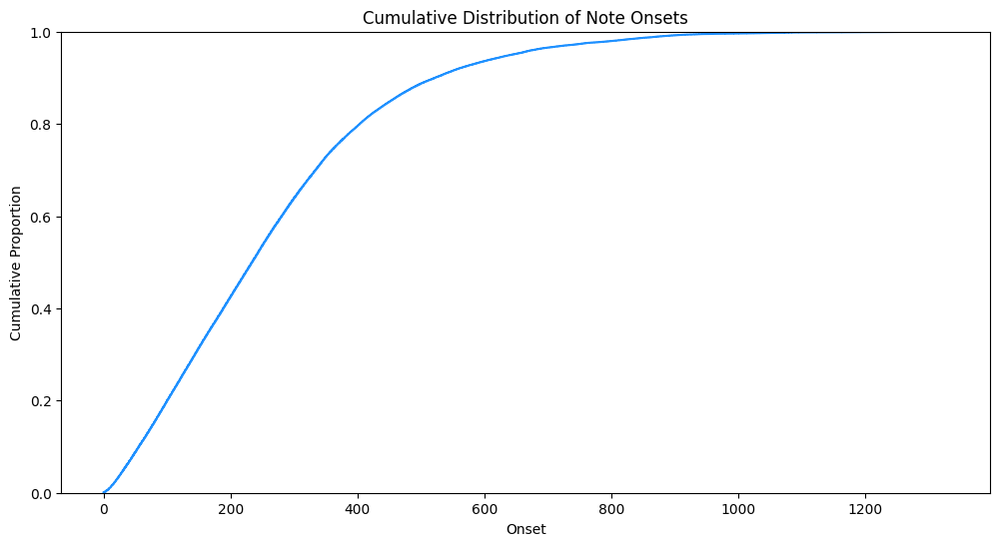

In [63]:
plt.figure(figsize=(12, 6))
sns.ecdfplot(df['onset'], color='dodgerblue')  
plt.title("Cumulative Distribution of Note Onsets")
plt.xlabel("Onset")
plt.ylabel("Cumulative Proportion")
plt.show()

##### 2.3.4.4 Outlier Detection in Onset Values

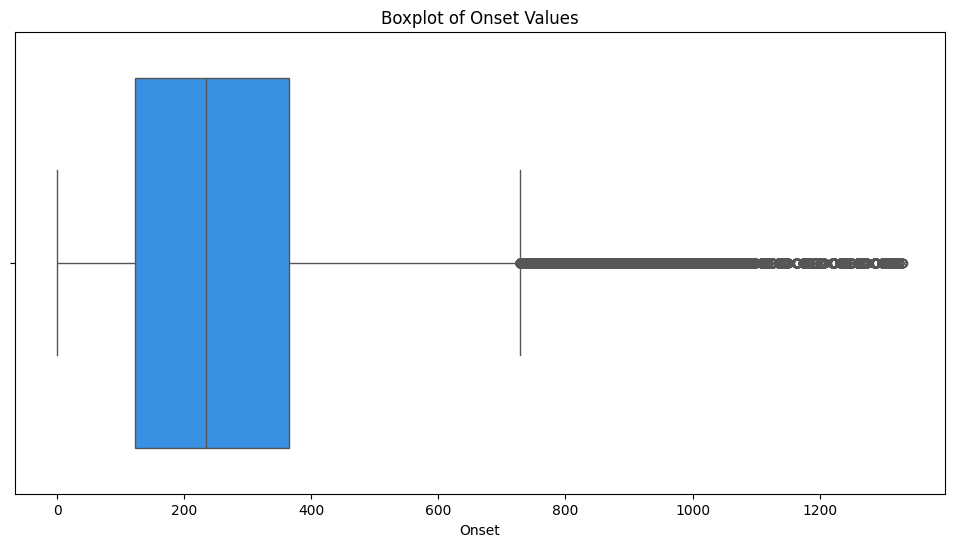

In [64]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['onset'], color='dodgerblue')
plt.title('Boxplot of Onset Values')
plt.xlabel('Onset')
plt.show()

##### 2.3.4.5 Onset in Context: Key, Instrument, and Genre

In [65]:
# Descriptive statistics of onset values by key
print("Onset statistics by Key:")
df.groupby('key')['onset'].describe().sort_index()

Onset statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,57405.0,238.747486,141.225505,0.0,121.000000,228.000000,351.500000,615.416667
1,16127.0,207.486245,133.455108,0.0,97.250000,192.333333,290.000000,697.416667
2,41409.0,257.556455,166.727717,0.0,124.000000,231.333333,356.000000,688.250000
3,30638.0,210.096378,121.116831,0.0,108.750000,204.500000,299.000000,496.000000
4,12523.0,182.862367,96.777143,0.0,106.875000,183.250000,259.500000,590.500000
5,61610.0,335.332653,235.201710,0.0,145.250000,275.750000,508.250000,962.250000
6,9799.0,295.043729,164.491767,0.0,164.000000,282.666667,408.000000,619.000000
7,53848.0,287.967224,227.524017,0.0,123.000000,236.500000,392.875000,1094.750000
8,4606.0,171.070633,94.904330,0.0,92.000000,171.000000,244.000000,355.166667


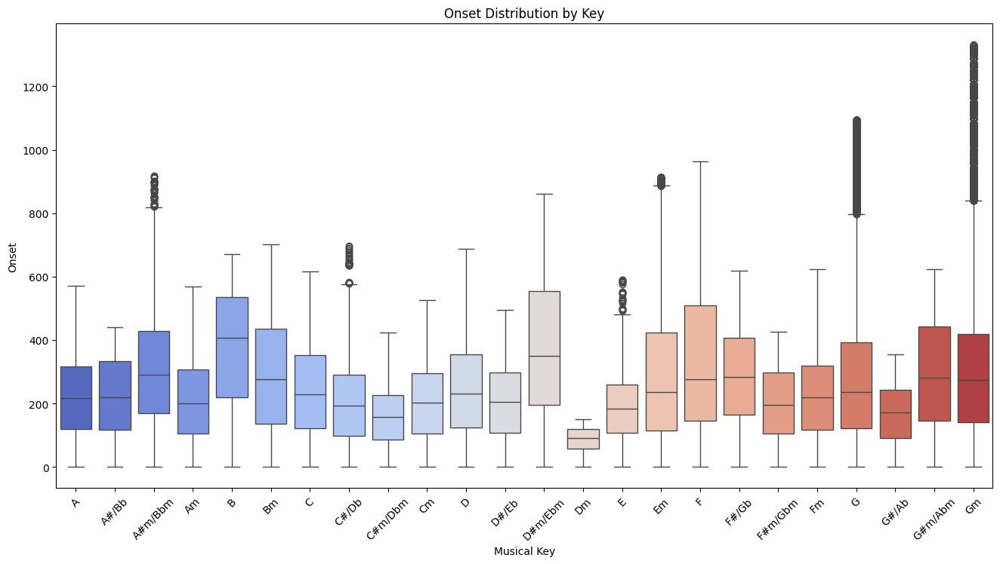

In [66]:
# Onset distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='key_name', y='onset', order=ordered_key_names, palette='coolwarm')
plt.title('Onset Distribution by Key')
plt.xlabel('Musical Key')
plt.xticks(rotation=45)
plt.ylabel('Onset')
plt.show()



In [67]:
# Descriptive statistics of onset values by instrument
print("Onset statistics by Instrument:")
df.groupby('instrument')['onset'].describe()

Onset statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Accordion,1.0,1.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000
Acoustic Guitar,46426.0,319.332303,237.919683,0.000000,132.500000,264.750000,440.000000,912.333333
Alto Saxophone,1028.0,212.051313,39.742708,1.000000,181.125000,212.000000,245.750000,276.250000
Bagpipes,6887.0,198.344369,105.620290,1.000000,108.000000,198.500000,290.500000,387.750000
Banjo,1849.0,193.562556,111.914940,0.000000,96.833333,193.500000,290.750000,387.333333
Baritone Saxophone,3007.0,132.344502,71.142100,1.000000,72.500000,131.500000,195.375000,255.500000
Bassoon,2606.0,129.148024,69.358737,2.500000,69.000000,129.000000,188.000000,248.750000
Brass,4105.0,163.340844,101.712612,1.000000,77.666667,138.583333,251.000000,367.500000
Choir,6964.0,303.046166,157.765849,0.000000,156.000000,325.250000,431.000000,574.833333


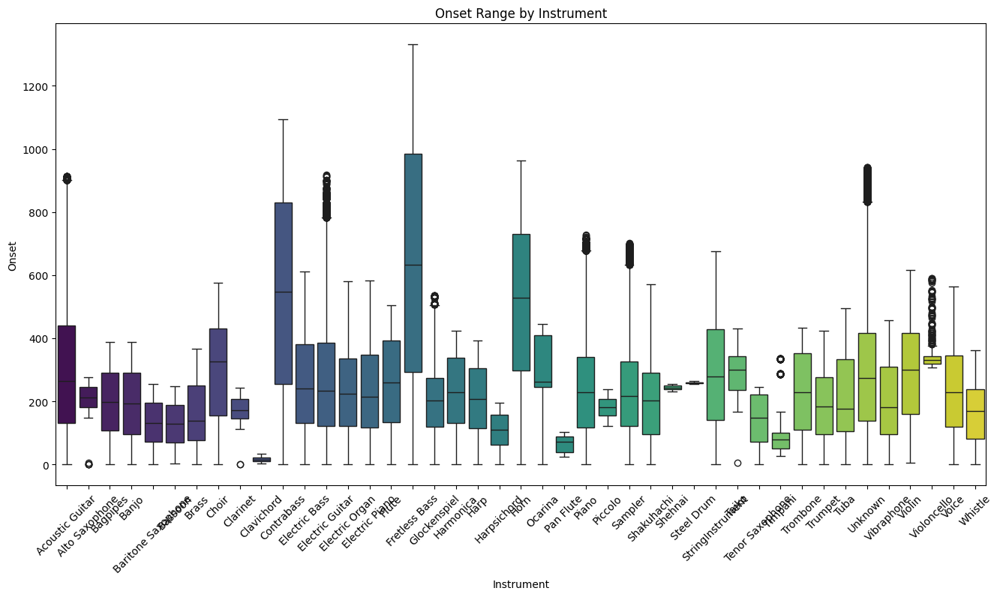

In [68]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='instrument', y='onset', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Onset Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Onset')
plt.show()

In [69]:
# Descriptive statistics of onset by instrument family
print("Onset statistics by Instrument Family:")
df.groupby('instrument_family')['onset'].describe()

Onset statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,31939.0,430.096374,321.716241,0.0,172.750000,348.000,608.875000,1330.583333
Brass,37900.0,319.398342,234.288014,0.0,128.000000,274.000,427.250000,962.250000
Electronic,65980.0,243.717243,150.643712,0.0,126.000000,223.125,340.000000,701.000000
Guitar,186869.0,281.186996,201.159984,0.0,124.000000,241.500,392.000000,918.000000
Keyboard,168338.0,240.118055,149.208418,0.0,117.666667,224.000,340.000000,728.250000
Other,41407.0,274.921096,211.823584,0.0,115.041667,231.500,376.583333,941.750000
Percussion,20276.0,203.638090,114.518548,0.0,103.729167,202.000,290.562500,536.000000
Strings,28659.0,286.513518,177.946873,0.0,140.000000,273.500,407.000000,675.666667
Voice,28384.0,241.019838,143.962954,0.0,120.000000,229.250,345.250000,564.500000


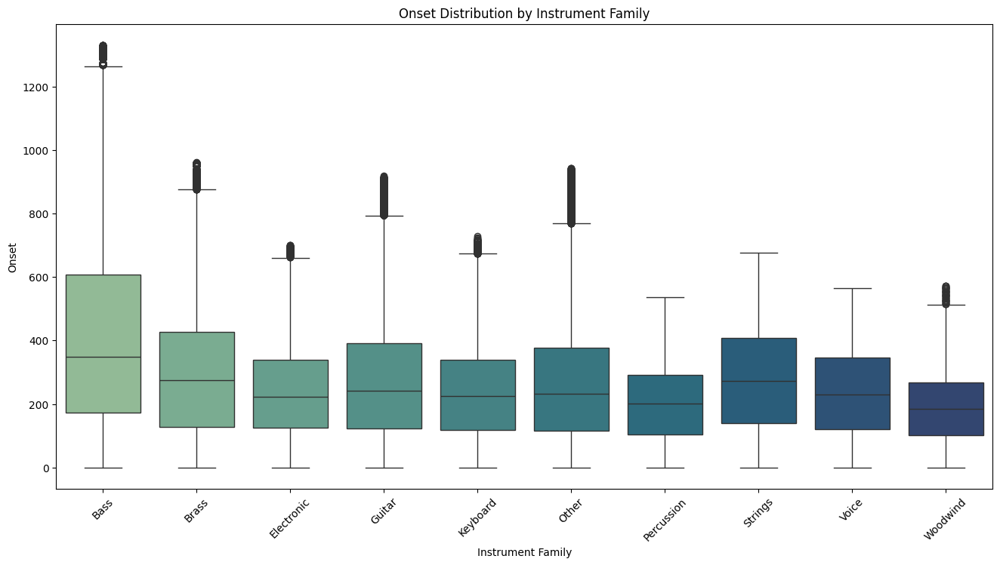

In [70]:
# Filter and plot onset distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='instrument_family', y='onset', palette='crest', order=families)
plt.title('Onset Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Onset')
plt.xticks(rotation=45)
plt.show()

In [71]:
# Descriptive statistics of onset by genre
print("Onset statistics by Genre:")
df.groupby('genre')['onset'].describe()

Onset statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,28830.0,204.768545,138.637662,0.0,98.000000,184.000000,278.000000,644.833333
blues,54451.0,292.686154,199.251052,0.0,136.000000,252.250000,418.500000,830.000000
classical,36582.0,410.340985,293.374440,0.0,147.416667,352.125000,645.250000,1094.750000
country,54072.0,231.945807,141.072839,0.0,117.250000,215.000000,329.250000,619.000000
dance,54471.0,346.734753,230.497518,0.0,162.500000,304.000000,484.625000,918.000000
disco,51138.0,291.849616,178.306690,0.0,143.416667,272.500000,434.000000,693.083333
heavy_metal,41747.0,319.724192,213.920985,0.0,152.916667,285.000000,440.500000,941.750000
jazz,33181.0,226.660235,151.712335,0.0,100.000000,202.333333,336.000000,728.250000
new_age,41925.0,279.651348,174.794333,0.0,140.000000,264.000000,372.750000,701.000000


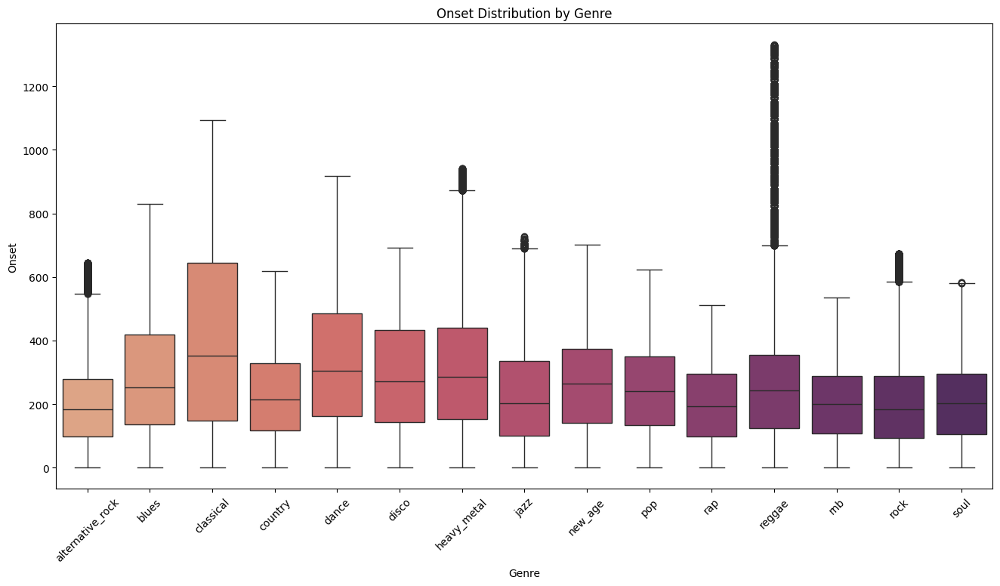

In [72]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='genre', y='onset', palette='flare', order=genres_sorted)
plt.title('Onset Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Onset')
plt.xticks(rotation=45)
plt.show()

##### 2.3.4.6. Temporal Segmentation of Musical Events by Genre, Instrument, and Instrument Family

In [73]:
# Function to assign section based on onset quantiles
def add_temporal_sections(dataframe, notes_only=False):
    """Add temporal_section based on onset quartiles"""
    valid_data = dataframe.dropna(subset=['onset'])
    if not notes_only:
        valid_data = valid_data[valid_data['is_rest'] == 0]
    
    # Compute quartiles on all events
    q1, q3 = valid_data["onset"].quantile([0.25, 0.75])
    
    def classify(onset):
        if pd.isna(onset):
            return np.nan
        elif onset <= q1:
            return "intro"
        elif onset <= q3:
            return "middle"
        else:
            return "late"
    
    if notes_only:
        dataframe["temporal_section"] = dataframe["onset"].apply(classify)
    else:
        dataframe["temporal_section"] = np.where(
            dataframe["is_rest"] == 0,
            dataframe["onset"].apply(classify),
            np.nan
        )

add_temporal_sections(df)
add_temporal_sections(df_notes_only, notes_only=True)

# Count and normalize per genre
genre_section_counts = df_notes_only.groupby(["genre", "temporal_section"]).size().unstack(fill_value=0)

# Reorder the columns explicitly
ordered_columns = ["intro", "middle", "late"]
genre_section_counts = genre_section_counts[ordered_columns]

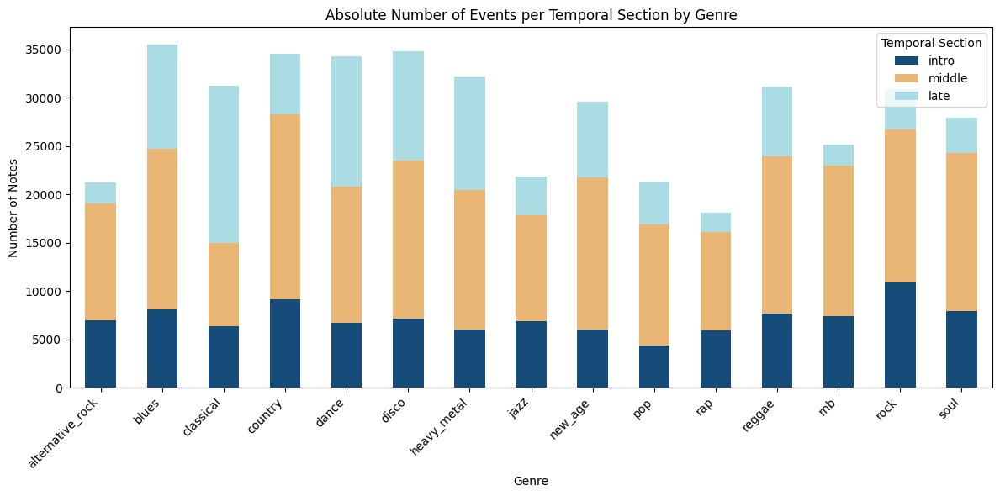

In [74]:
# Define color palette in the same order
colors = ["#154c79", "#eab676", "#abdbe3"]

# Plot stacked bar chart using absolute counts
genre_section_counts.plot(kind="bar", stacked=True, figsize=(12, 6), color=colors)

plt.title("Absolute Number of Events per Temporal Section by Genre")
plt.xlabel("Genre")
plt.ylabel("Number of Notes")
plt.legend(title="Temporal Section", loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

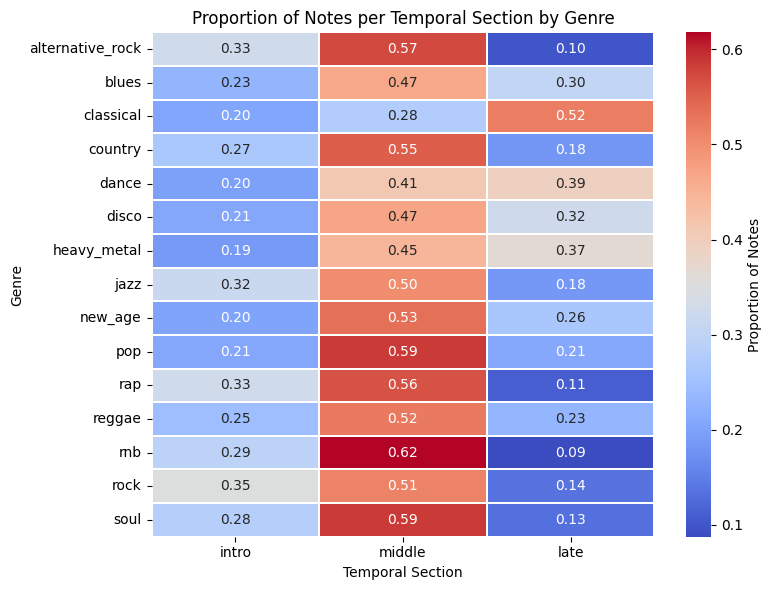

In [75]:
# Normalize to get proportions within each genre
genre_section_props = genre_section_counts.div(genre_section_counts.sum(axis=1), axis=0)

# Plot heatmap of proportions
plt.figure(figsize=(8, 6))
sns.heatmap(genre_section_props, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Proportion of Notes'}, linecolor='white', linewidths=0.2)
plt.title("Proportion of Notes per Temporal Section by Genre")
plt.xlabel("Temporal Section")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()

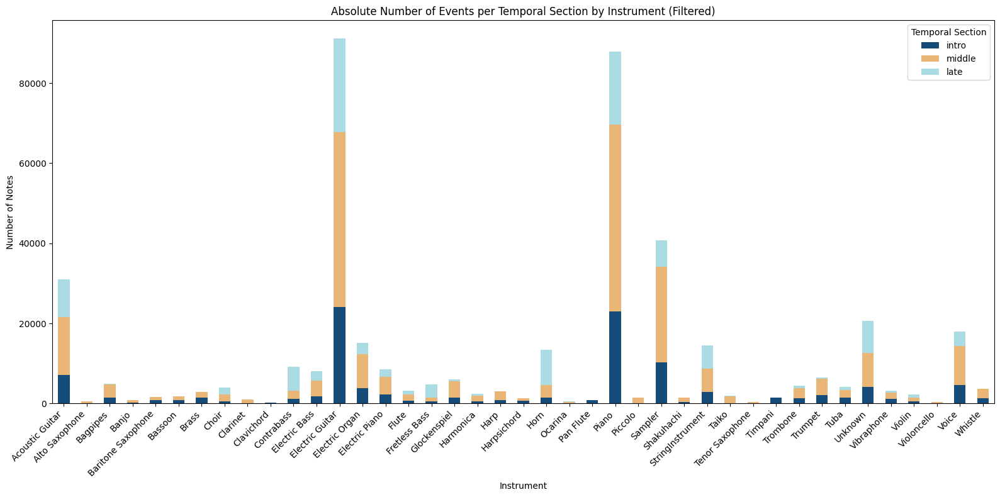

In [76]:
# Count raw number of note events per instrument and temporal section
instrument_section_counts = df_notes_only.groupby(['instrument', 'temporal_section']).size().unstack(fill_value=0)

# Filter instruments with a minimum number of total events to avoid clutter
min_total_events = 100
instrument_section_counts = instrument_section_counts[instrument_section_counts.sum(axis=1) >= min_total_events]

# Ensure consistent column order
instrument_section_counts = instrument_section_counts[ordered_columns].sort_index()

# Plot stacked bar chart using absolute counts
instrument_section_counts.plot(kind="bar", stacked=True, figsize=(16, 8), color=colors)

plt.title("Absolute Number of Events per Temporal Section by Instrument (Filtered)")
plt.xlabel("Instrument")
plt.ylabel("Number of Notes")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Temporal Section", loc="upper right")
plt.tight_layout()
plt.show()

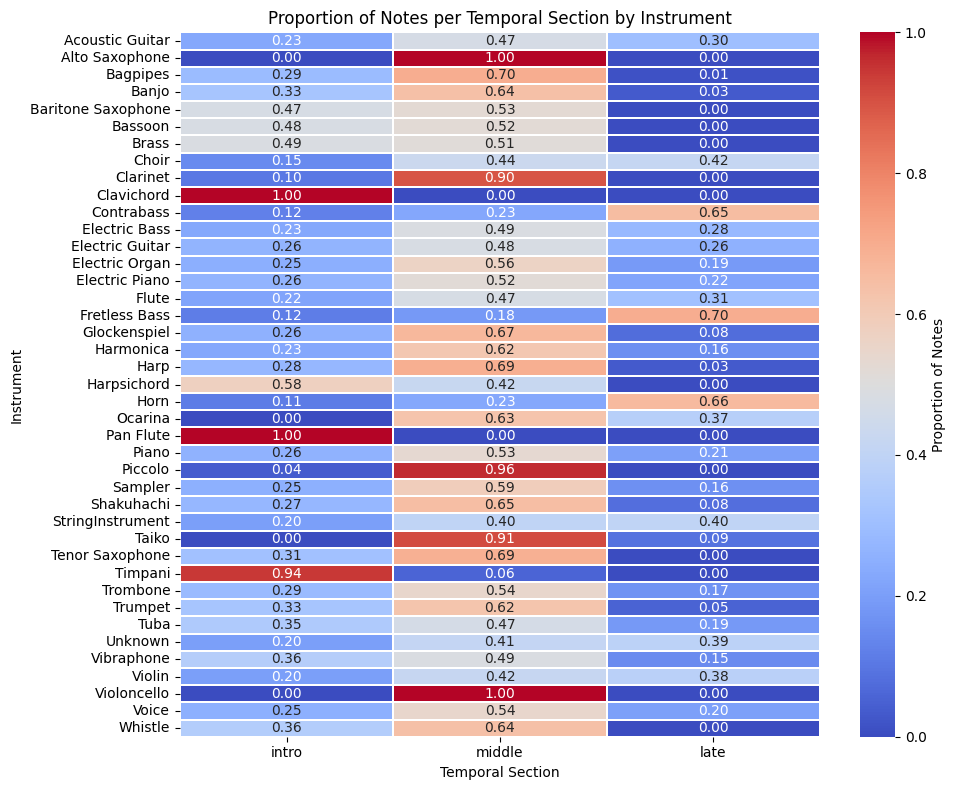

In [77]:
# Normalize to proportions
instrument_section_props = instrument_section_counts.div(instrument_section_counts.sum(axis=1), axis=0)

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(instrument_section_props, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Proportion of Notes'}, linecolor='white', linewidths=0.2)

plt.title("Proportion of Notes per Temporal Section by Instrument")
plt.xlabel("Temporal Section")
plt.ylabel("Instrument")
plt.tight_layout()
plt.show()

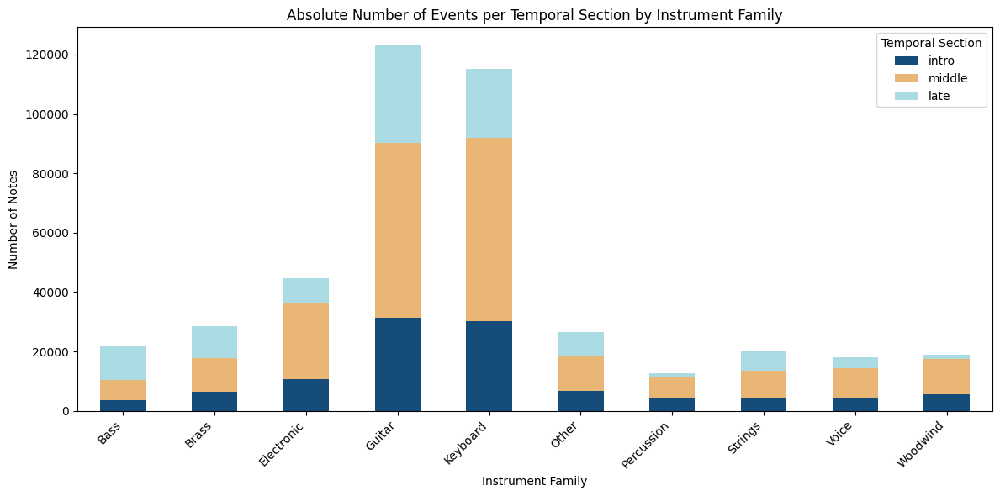

In [78]:
# Count raw number of note events per instrument family and temporal section (exclude rests)
family_section_counts = df_notes_only.groupby(['instrument_family', 'temporal_section']).size().unstack(fill_value=0)

# Ensure consistent column order
family_section_counts = family_section_counts[ordered_columns]

# Plot stacked bar chart using absolute counts
family_section_counts.plot(kind="bar", stacked=True, figsize=(12, 6), color=colors)

plt.title("Absolute Number of Events per Temporal Section by Instrument Family")
plt.xlabel("Instrument Family")
plt.ylabel("Number of Notes")
plt.legend(title="Temporal Section", loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

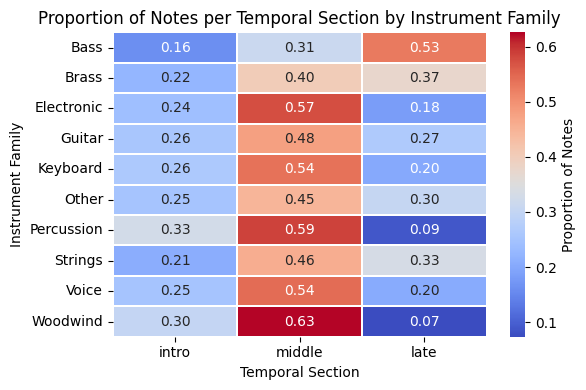

In [79]:
# Normalize to proportions
family_section_props = family_section_counts.div(family_section_counts.sum(axis=1), axis=0)

# Plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(family_section_props, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Proportion of Notes'}, linecolor='white', linewidths=0.2)

plt.title("Proportion of Notes per Temporal Section by Instrument Family")
plt.xlabel("Temporal Section")
plt.ylabel("Instrument Family")
plt.tight_layout()
plt.show()

#### 2.3.5 Duration

##### 2.3.5.1 Central Tendency and Spread of Duration


In [80]:
df['duration'].describe()

count    638779.000000
mean          0.823764
std           1.044919
min           0.000000
25%           0.250000
50%           0.500000
75%           0.750000
max          55.000000
Name: duration, dtype: float64

In [81]:
# Descriptive stats: proportion and spread of duration values for actual notes only
df_notes_only['duration'].describe()

count    429898.000000
mean          0.701894
std           0.863409
min           0.000000
25%           0.250000
50%           0.500000
75%           0.666667
max          55.000000
Name: duration, dtype: float64

In [82]:
# Verify extreme values
print(df_notes_only[df_notes_only['duration'] > 50][['filename', 'instrument']])

                       filename instrument
333375  Fantaisie impromptu.mid      Piano


In [83]:
# Check for non-positive durations
null_duration = df_notes_only[df_notes_only['duration'] <= 0]

print(f"Non-positive durations found: {len(null_duration)}")
print(f"Unique values: {null_duration['duration'].unique()}")

if len(null_duration) > 0:
    print(f"\nDetails:")
    print(null_duration[['filename', 'genre', 'duration', 'pitch', 'onset']])
    print(f"\nBy genre: {null_duration['genre'].value_counts().to_dict()}")
    print(f"By file: {null_duration['filename'].value_counts().to_dict()}")

Non-positive durations found: 10
Unique values: [0.]

Details:
                     filename  genre  duration  pitch       onset
98557   Rivers Of Babylon.mid  disco       0.0     40  192.666667
474172  Can't Help Myself.mid   soul       0.0     64   68.500000
474324  Can't Help Myself.mid   soul       0.0     55   81.500000
474557  Can't Help Myself.mid   soul       0.0     64  100.750000
475036  Can't Help Myself.mid   soul       0.0     52  137.250000
475091  Can't Help Myself.mid   soul       0.0     52  141.500000
475128  Can't Help Myself.mid   soul       0.0     52  144.500000
475387  Can't Help Myself.mid   soul       0.0     67  168.500000
475807  Can't Help Myself.mid   soul       0.0     69  203.000000
475993  Can't Help Myself.mid   soul       0.0     67  219.500000

By genre: {'soul': 9, 'disco': 1}
By file: {"Can't Help Myself.mid": 9, 'Rivers Of Babylon.mid': 1}


In [84]:
# Check whether these zeros are MIDI artifacts or real music
print(f"\n1. Same instrument pattern:")
print(null_duration['instrument'].value_counts())

print(f"\n2. Abnormally high velocity (artifacts):")
print(f"Ghost notes velocity: {null_duration['velocity'].mean():.1f}")
print(f"Normal notes velocity: {df_notes_only[df_notes_only['duration'] > 0]['velocity'].mean():.1f}")

print(f"\n3. Proof of duplicates - Same pitch/time patterns:")
for _, row in null_duration.head(3).iterrows():
    # Find nearby notes with same pitch in same file
    same_file = df_notes_only[df_notes_only['filename'] == row['filename']]
    same_pitch_nearby = same_file[
        (same_file['pitch'] == row['pitch']) & 
        (abs(same_file['onset'] - row['onset']) < 0.5) &
        (same_file['duration'] > 0)
    ]
    print(f"Ghost: pitch {row['pitch']} at {row['onset']:.2f} -> Normal duplicates: {len(same_pitch_nearby)}")

print(f"\nThese are MIDI artifacts (duplicates/triggers), not real musical notes")
print(f"Safe to filter: Only {len(null_duration)}/{len(df_notes_only)} ({100*len(null_duration)/len(df_notes_only):.3f}%)")


1. Same instrument pattern:
instrument
Baritone Saxophone    9
Sampler               1
Name: count, dtype: int64

2. Abnormally high velocity (artifacts):
Ghost notes velocity: 108.4
Normal notes velocity: 91.5

3. Proof of duplicates - Same pitch/time patterns:
Ghost: pitch 40 at 192.67 -> Normal duplicates: 2
Ghost: pitch 64 at 68.50 -> Normal duplicates: 0
Ghost: pitch 55 at 81.50 -> Normal duplicates: 0

These are MIDI artifacts (duplicates/triggers), not real musical notes
Safe to filter: Only 10/429898 (0.002%)


In [85]:
# Data Engineering
df = df[df['duration'] > 0]
df_notes_only = df_notes_only[df_notes_only['duration'] > 0 ]

In [86]:
# Central tendency
mean_duration = df_notes_only['duration'].mean()
median_duration = df_notes_only['duration'].median()
mode_duration = df_notes_only['duration'].mode()[0]  

# Spread
std_duration = df_notes_only['duration'].std()

# Display results
print(f"Mean duration: {mean_duration:.2f}")
print(f"Median duration: {median_duration:.2f}")
print(f"Mode duration: {mode_duration:.2f}")
print(f"Standard deviation: {std_duration:.2f}")

Mean duration: 0.70
Median duration: 0.50
Mode duration: 0.25
Standard deviation: 0.86


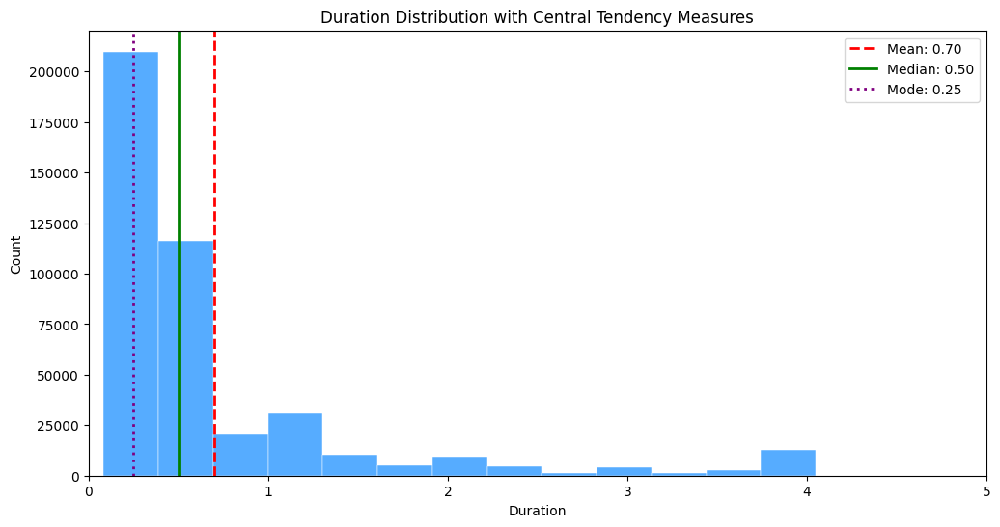

In [87]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['duration'], bins=180, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_duration, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_duration:.2f}')
plt.axvline(median_duration, color='green', linestyle='-', linewidth=2, label=f'Median: {median_duration:.2f}')
plt.axvline(mode_duration, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_duration:.2f}')

plt.title('Duration Distribution with Central Tendency Measures')
plt.xlabel('Duration')
plt.ylabel('Count')
plt.xlim(0, 5)  
plt.legend()
plt.show()

##### 2.3.5.2 Outlier Detection in Duration Values

In [88]:
# Determine thresholds for outliers
df_notes_only['duration'].quantile([0.95, 0.99])

0.95    3.0
0.99    4.0
Name: duration, dtype: float64

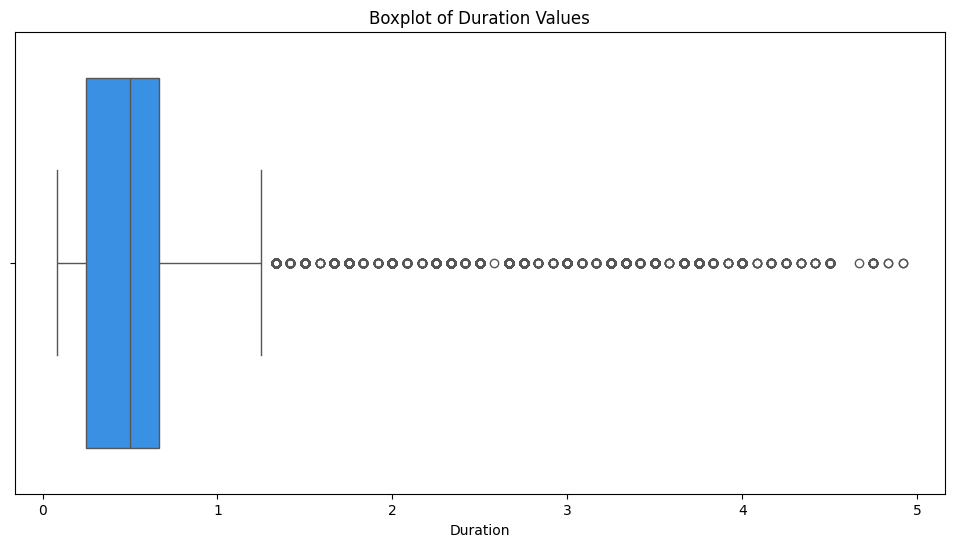

In [89]:
# Filter outlier for better visualization
df_filtered = df_notes_only[df_notes_only['duration'] < 5]

plt.figure(figsize=(12, 6))
sns.boxplot(x=df_filtered['duration'], color='dodgerblue')
plt.title('Boxplot of Duration Values')
plt.xlabel('Duration')
plt.show()

##### 2.3.5.3 Duration in Context: Key, Instrument, and Genre

In [90]:
# Descriptive statistics of duration values by key
print("Duration statistics by Key:")
df_filtered.groupby('key')['duration'].describe().sort_index()

Duration statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37489.0,0.802804,0.808038,0.083333,0.250000,0.500000,1.000000,4.916667
1,11535.0,0.529403,0.491219,0.083333,0.250000,0.500000,0.500000,4.000000
2,28421.0,0.732205,1.017416,0.083333,0.250000,0.250000,0.500000,4.000000
3,19692.0,0.694478,0.737954,0.083333,0.250000,0.500000,0.750000,4.750000
4,8342.0,0.624131,0.634311,0.166667,0.250000,0.500000,0.500000,4.000000
5,43794.0,0.599664,0.706875,0.083333,0.250000,0.333333,0.500000,4.500000
6,7151.0,1.081376,1.123983,0.166667,0.500000,0.500000,1.000000,4.500000
7,38130.0,0.721774,0.818683,0.083333,0.250000,0.500000,0.666667,4.166667
8,2709.0,0.651901,0.721434,0.083333,0.250000,0.333333,0.666667,4.250000


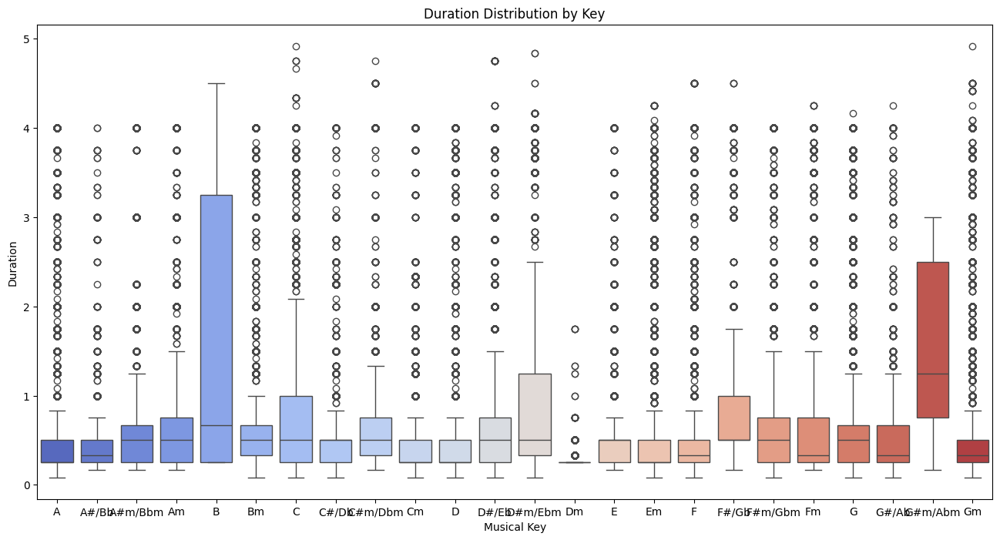

In [91]:
# Duration distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_filtered, x='key_name', y='duration', order=ordered_key_names, palette='coolwarm')
plt.title('Duration Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Duration')
plt.show()


In [92]:
# Descriptive statistics of duration values by instrument
print("Duration statistics by Instrument:")
df_filtered.groupby('instrument')['duration'].describe()

Duration statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31059.0,0.621012,0.792277,0.083333,0.250000,0.333333,0.500000,4.000000
Alto Saxophone,505.0,1.254455,1.352569,0.166667,0.416667,0.500000,2.000000,4.000000
Bagpipes,4865.0,0.659010,0.579692,0.166667,0.500000,0.500000,0.500000,4.000000
Banjo,872.0,0.486334,0.174462,0.250000,0.333333,0.500000,0.666667,0.750000
Baritone Saxophone,1609.0,0.763311,0.690888,0.166667,0.250000,0.500000,1.000000,4.000000
Bassoon,1729.0,0.726190,0.588337,0.250000,0.500000,0.500000,0.750000,3.000000
Brass,2925.0,0.765014,0.692706,0.250000,0.333333,0.500000,0.750000,4.916667
Choir,3969.0,1.664945,1.530744,0.166667,0.250000,1.000000,3.500000,4.000000
Clarinet,998.0,0.583667,0.585592,0.250000,0.250000,0.500000,0.500000,4.000000


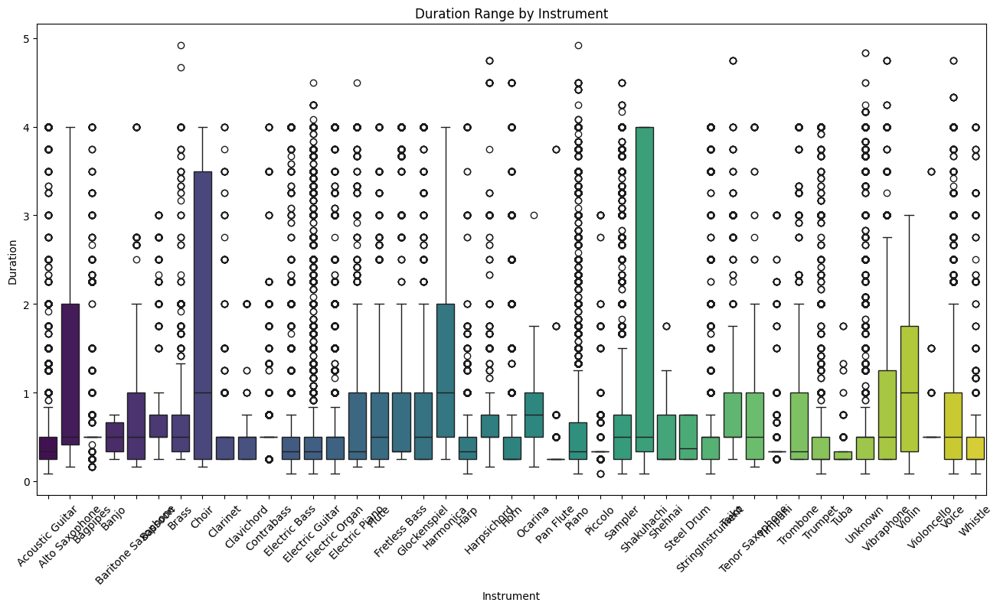

In [93]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_filtered, x='instrument', y='duration', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Duration Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Duration')
plt.show()

In [94]:
# Descriptive statistics of duration by instrument family
print("Duration statistics by Instrument Family:")
df_filtered.groupby('instrument_family')['duration'].describe()

Duration statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21916.0,0.667735,0.743891,0.083333,0.25,0.500000,0.500000,4.000000
Brass,28558.0,0.580526,0.683950,0.083333,0.25,0.250000,0.500000,4.500000
Electronic,44619.0,0.899975,1.039511,0.083333,0.25,0.500000,1.000000,4.500000
Guitar,122947.0,0.632624,0.773358,0.083333,0.25,0.333333,0.500000,4.500000
Keyboard,115083.0,0.675328,0.776459,0.083333,0.25,0.333333,0.666667,4.916667
Other,26417.0,0.692124,0.794976,0.083333,0.25,0.500000,0.666667,4.916667
Percussion,12547.0,0.834310,0.937471,0.250000,0.25,0.500000,1.000000,4.750000
Strings,20310.0,0.665173,0.736544,0.083333,0.25,0.500000,0.500000,4.000000
Voice,18007.0,0.788485,0.784271,0.083333,0.25,0.500000,1.000000,4.750000


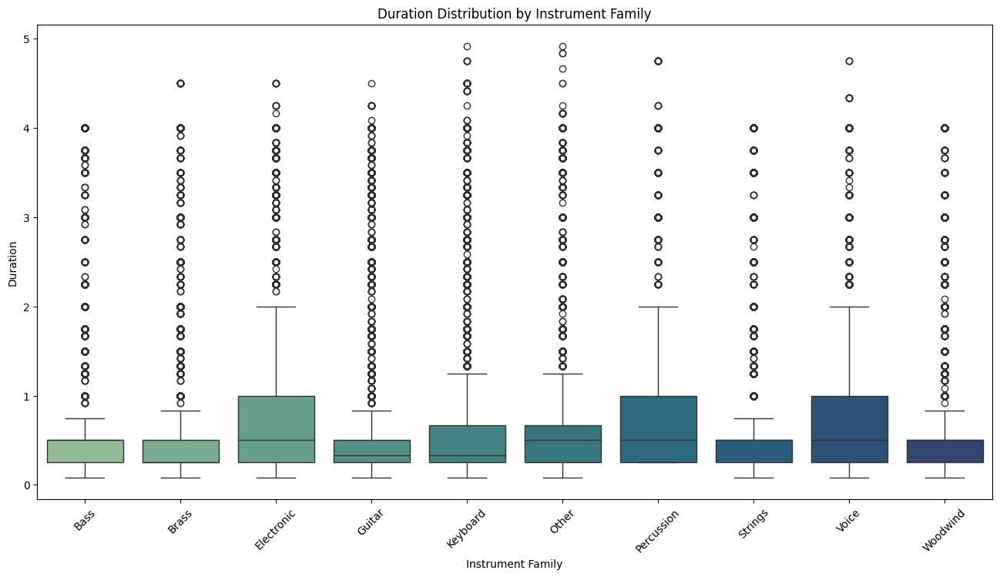

In [95]:
# Filter and plot duration distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_filtered, x='instrument_family', y='duration', palette='crest', order=families)
plt.title('Duration Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Duration')
plt.xticks(rotation=45)
plt.show()

In [96]:
# Descriptive statistics of duration by genre
print("Duration statistics by Genre:")
df_filtered.groupby('genre')['duration'].describe()

Duration statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21153.0,0.823520,0.933594,0.083333,0.250000,0.500000,0.750000,4.250000
blues,35480.0,0.570317,0.570576,0.083333,0.250000,0.333333,0.666667,4.750000
classical,31205.0,0.554609,0.548844,0.083333,0.250000,0.500000,0.500000,4.750000
country,34549.0,0.727788,0.772060,0.083333,0.250000,0.500000,0.750000,4.500000
dance,34212.0,0.598048,0.750815,0.166667,0.250000,0.500000,0.500000,4.000000
disco,34711.0,0.728876,1.009202,0.083333,0.250000,0.250000,0.500000,4.833333
heavy_metal,32222.0,0.757929,0.772895,0.083333,0.250000,0.500000,1.000000,4.250000
jazz,21803.0,0.761726,0.765622,0.083333,0.250000,0.500000,1.000000,4.916667
new_age,29406.0,0.945635,1.133460,0.083333,0.333333,0.500000,1.000000,4.750000


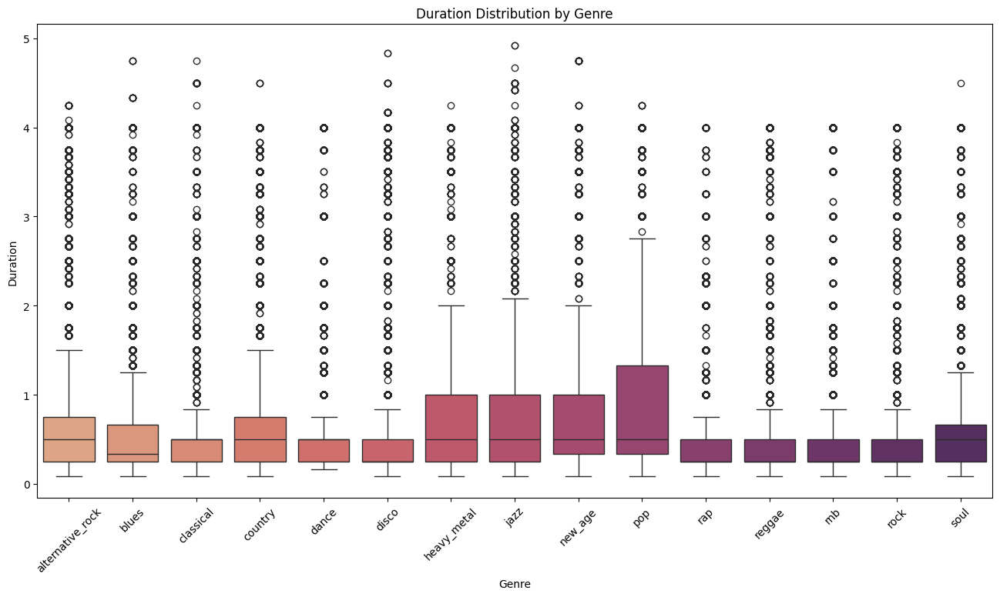

In [97]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_filtered, x='genre', y='duration', palette='flare', order=genres_sorted)
plt.title('Duration Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Duration')
plt.xticks(rotation=45)
plt.show()

##### 2.3.5.4 Metric Weight vs Note Duration

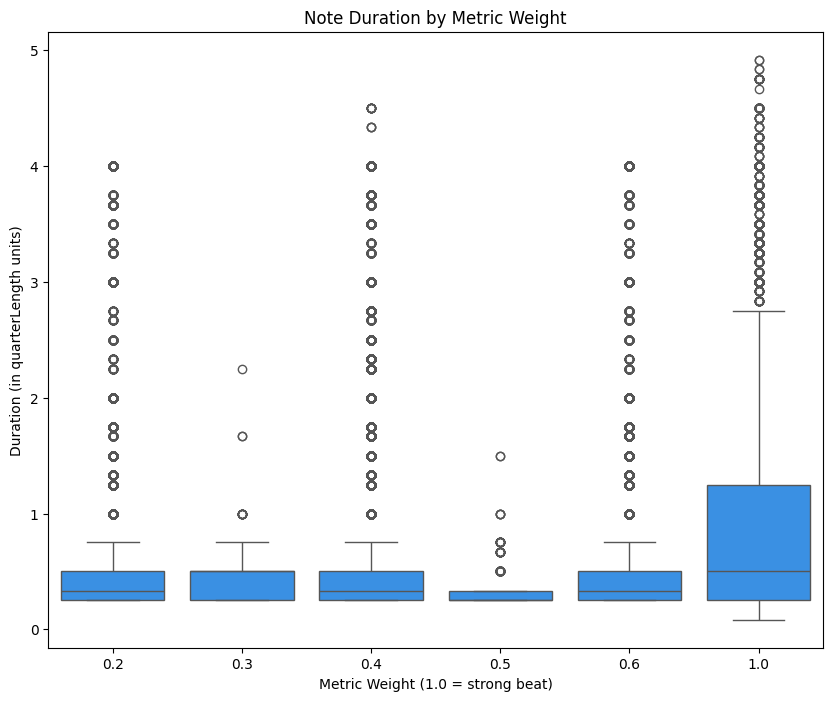

In [98]:
# Set the figure size
plt.figure(figsize=(10, 8))

# Create a boxplot showing how note duration varies with metric weight
sns.boxplot(data=df_filtered, x="metric_weight", y="duration", color='dodgerblue')

# Add a descriptive title and axis labels
plt.title("Note Duration by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Duration (in quarterLength units)")
plt.show()

##### 2.3.5.5 Average Note Duration by Polyphony and Metric Weight

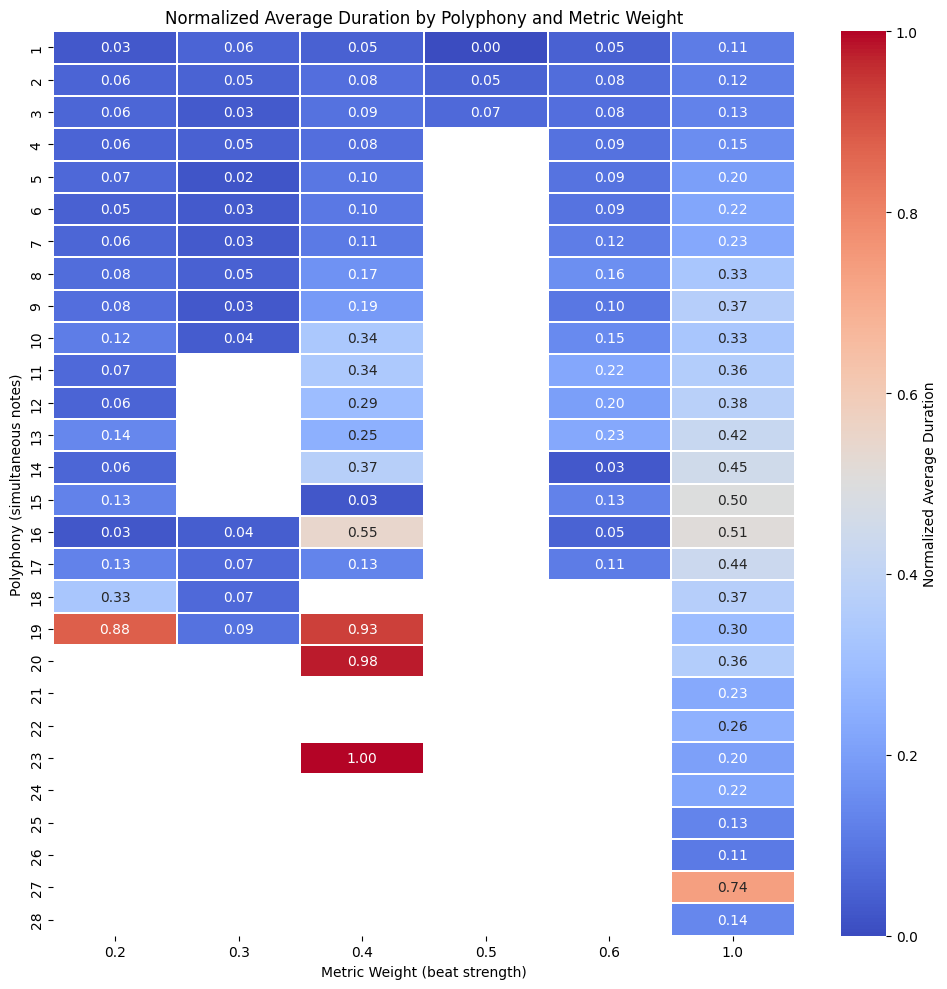

In [99]:
# Create the pivot table
pivot = df_filtered.pivot_table(
    values="duration",
    index="polyphony",
    columns="metric_weight",
    aggfunc="mean"
)

# Apply global min-max normalization
normalized_pivot = (pivot - pivot.min().min()) / (pivot.max().max() - pivot.min().min())

# Plot the heatmap
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(normalized_pivot, cmap='coolwarm', annot=True, fmt=".2f", ax=ax, linewidths=0.2, cbar_kws={"label": "Normalized Average Duration"})

# Add title and labels
plt.title("Normalized Average Duration by Polyphony and Metric Weight")
plt.xlabel("Metric Weight (beat strength)")
plt.ylabel("Polyphony (simultaneous notes)")
plt.tight_layout()
plt.show()

#### 2.3.6 Melodic Motion: Interval Between Consecutive Notes (in Semitones)

##### 2.3.6.1 Central Tendency and Spread of Interval Between Consecutive Notes (in Semitones)

In [100]:
# Descriptive stats: proportion and spread of intervals between consecutive notes
df['interval_to_prev'].describe()

count    638769.000000
mean          9.928492
std          12.356700
min           0.000000
25%           0.000000
50%           5.000000
75%          17.000000
max          72.000000
Name: interval_to_prev, dtype: float64

In [101]:
# Descriptive stats: proportion and spread of intervals between actual notes only
df_notes_only['interval_to_prev'].describe()

count    429888.000000
mean         14.752710
std          12.478314
min           0.000000
25%           4.000000
50%          12.000000
75%          24.000000
max          72.000000
Name: interval_to_prev, dtype: float64

In [102]:
# Central tendency
mean_interval_to_prev = df_notes_only['interval_to_prev'].mean()
median_interval_to_prev = df_notes_only['interval_to_prev'].median()
mode_interval_to_prev = df_notes_only['interval_to_prev'].mode()[0]  

# Spread
std_interval_to_prev = df_notes_only['interval_to_prev'].std()

# Display results
print(f"Mean interval between consecutive notes: {mean_interval_to_prev:.2f}")
print(f"Median interval between consecutive notes: {median_interval_to_prev:.2f}")
print(f"Mode interval between consecutive notes: {mode_interval_to_prev:.2f}")
print(f"Standard deviation of intervals between consecutive notes: {std_interval_to_prev:.2f}")

Mean interval between consecutive notes: 14.75
Median interval between consecutive notes: 12.00
Mode interval between consecutive notes: 0.00
Standard deviation of intervals between consecutive notes: 12.48


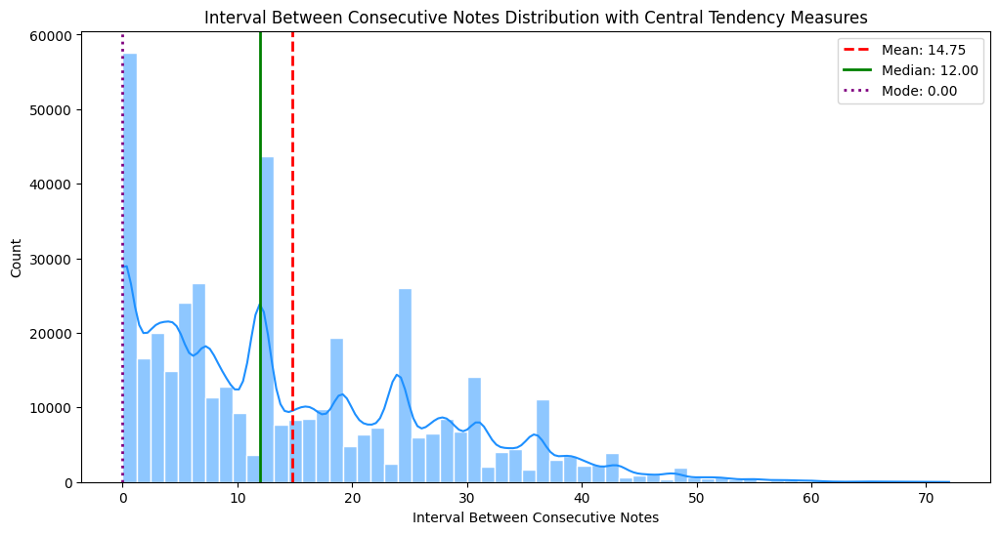

In [103]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['interval_to_prev'], bins=60, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_interval_to_prev, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_interval_to_prev:.2f}')
plt.axvline(median_interval_to_prev, color='green', linestyle='-', linewidth=2, label=f'Median: {median_interval_to_prev:.2f}')
plt.axvline(mode_interval_to_prev, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_interval_to_prev:.2f}')

plt.title('Interval Between Consecutive Notes Distribution with Central Tendency Measures')
plt.xlabel('Interval Between Consecutive Notes')
plt.ylabel('Count')
plt.legend()
plt.show()

In [104]:
# Identifying Extreme Melodic Leaps

# Count the number of intervals greater than 2 octaves (i.e., > 24 semitones), which may indicate abrupt jumps or anomalies
extreme_intervals = df_notes_only[df_notes_only['interval_to_prev'] > 24].copy()

print(f"Number of intervals > 24 semitones: {len(extreme_intervals)}")
print("\n Top 20 Most Extreme Intervals")
top_extreme = extreme_intervals.nlargest(20, 'interval_to_prev')[
    ['filename', 'genre', 'interval_to_prev', 'pitch']
]
print(top_extreme)

print("\n Distribution By Genre")
genre_counts = extreme_intervals['genre'].value_counts()
print(genre_counts)

print("\n Distribution By Piece")
piece_counts = extreme_intervals['filename'].value_counts().head(10)
print(piece_counts)

print("\n Extreme Intervals Statistics")
print(extreme_intervals['interval_to_prev'].describe())

# Context verification: examine consecutive notes for a few cases
print("\n Context Examples (first 5 cases)")
for idx in extreme_intervals.index[:5]:
    # Get a few notes before and after
    context = df_notes_only.loc[max(0, idx-2):idx+2, ['pitch', 'interval_to_prev', 'filename']]
    print(f"\nPiece: {df_notes_only.loc[idx, 'filename']}")
    print(f"Extreme interval: {df_notes_only.loc[idx, 'interval_to_prev']} semitones")
    print("Context:")
    print(context)
    print("-" * 50)

Number of intervals > 24 semitones: 90288

 Top 20 Most Extreme Intervals
                            filename    genre  interval_to_prev  pitch
357757                      Down.mid     rock                72    103
402826       Return to Innocence.mid  new_age                72    100
402825       Return to Innocence.mid  new_age                71     99
637746  I Only Have Eyes For You.mid     jazz                71     36
402824       Return to Innocence.mid  new_age                70     98
26976        Say You'll Be There.mid      pop                69     20
27825        Say You'll Be There.mid      pop                69     20
108302                  Le Freak.mid    disco                69     31
162255        Basin Street Blues.mid    blues                69     22
86660           Magnolia forever.mid    disco                68     26
162263        Basin Street Blues.mid    blues                68     23
449078        Get Ready for This.mid    dance                68     23
449

In [105]:
# Comparison of intervals by genre to validate if dance/disco are really different

# Percentage of intervals >24 by genre
print("Percentage of Intervals >24 By Genre")
genre_stats = []
for genre in df['genre'].unique():
    genre_data = df[df['genre'] == genre]
    total_intervals = len(genre_data)
    extreme_intervals = len(genre_data[genre_data['interval_to_prev'] > 24])
    percentage = (extreme_intervals / total_intervals) * 100
    genre_stats.append({
        'genre': genre,
        'total': total_intervals,
        'extreme': extreme_intervals,
        'percentage': percentage
    })

genre_df = pd.DataFrame(genre_stats).sort_values('percentage', ascending=False)
print(genre_df)

# Detailed statistics by genre
print("\n Median and Mean of Intervals By Genre")
interval_by_genre = df.groupby('genre')['interval_to_prev'].agg(['mean', 'median', 'std', 'max']).round(2)
interval_by_genre = interval_by_genre.sort_values('median', ascending=False)
print(interval_by_genre)

# Focus on electronic vs acoustic genres
print("\n Comparison Electronic vs. Acoustic Genres")
electronic_genres = ['dance', 'disco', 'new_age', 'rnb', 'rap']
acoustic_genres = ['classical', 'blues', 'country', 'jazz']

for category, genres in [('Electronic', electronic_genres), ('Acoustic', acoustic_genres)]:
    data = df[df['genre'].isin(genres)]
    total = len(data)
    extreme = len(data[data['interval_to_prev'] > 24])
    pct = (extreme / total) * 100
    median = data['interval_to_prev'].median()
    print(f"{category}: {extreme}/{total} ({pct:.1f}%) - median: {median}")

# Specific test: genres with the most intervals >36 and >48
print("\n Genres With More Large Jumps")
for threshold in [36, 48]:
    print(f"\nIntervals >{threshold} semitones:")
    extreme_by_genre = df[df['interval_to_prev'] > threshold].groupby('genre').size().sort_values(ascending=False)
    print(extreme_by_genre.head(8))

Percentage of Intervals >24 By Genre
               genre  total  extreme  percentage
5                rnb  37920     6712   17.700422
6             reggae  46331     8109   17.502320
2              disco  51137     8482   16.586816
11              soul  45599     7526   16.504748
10             dance  54471     8767   16.094803
0                pop  37118     5595   15.073549
1        heavy_metal  41747     6221   14.901670
4   alternative_rock  28830     4155   14.412071
7          classical  36582     5152   14.083429
3              blues  54451     7262   13.336761
13               rap  32462     4071   12.540817
12           country  54072     6417   11.867510
14              jazz  33181     3908   11.777825
9            new_age  41925     4533   10.812165
8               rock  42943     3378    7.866241

 Median and Mean of Intervals By Genre
                   mean  median    std  max
genre                                      
classical         11.39     8.0  11.86   65
heavy_m

##### 2.3.6.2 Outlier Detection in Intervals Between Consecutive Notes (in Semitones)


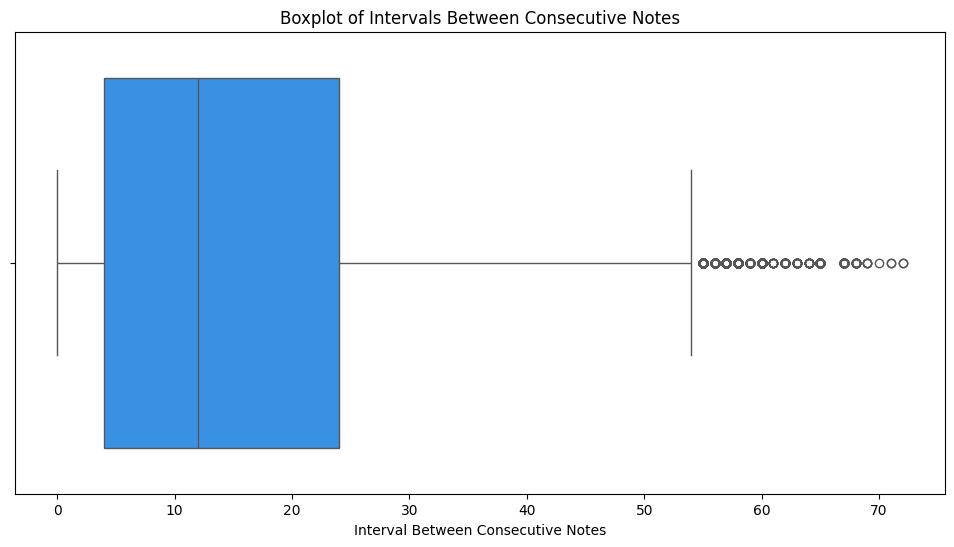

In [106]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_notes_only['interval_to_prev'], color='dodgerblue')
plt.title('Boxplot of Intervals Between Consecutive Notes')
plt.xlabel('Interval Between Consecutive Notes')
plt.show()

##### 2.3.6.3 Interval Between Consecutive Notes in Context: Key, Instrument, and Genre

In [107]:
# Descriptive statistics of intervals between consecutive notes by key
print("Interval Between Consecutive Notes statistics by Key:")
df_notes_only.groupby('key')['interval_to_prev'].describe().sort_index()

Interval Between Consecutive Notes statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37533.0,15.774998,12.962368,0.0,5.0,12.0,25.0,71.0
1,11542.0,15.826980,12.656142,0.0,5.0,12.0,25.0,60.0
2,28424.0,15.960491,12.735354,0.0,5.0,12.0,25.0,60.0
3,19869.0,14.954854,12.153539,0.0,4.0,12.0,24.0,62.0
4,8342.0,13.465955,12.800583,0.0,3.0,9.0,24.0,56.0
5,43881.0,15.083407,12.563716,0.0,4.0,12.0,24.0,72.0
6,7158.0,16.614138,13.718523,0.0,5.0,13.0,24.0,69.0
7,38144.0,12.848128,10.838037,0.0,4.0,12.0,20.0,55.0
8,2710.0,13.829151,10.882063,0.0,5.0,12.0,21.0,51.0


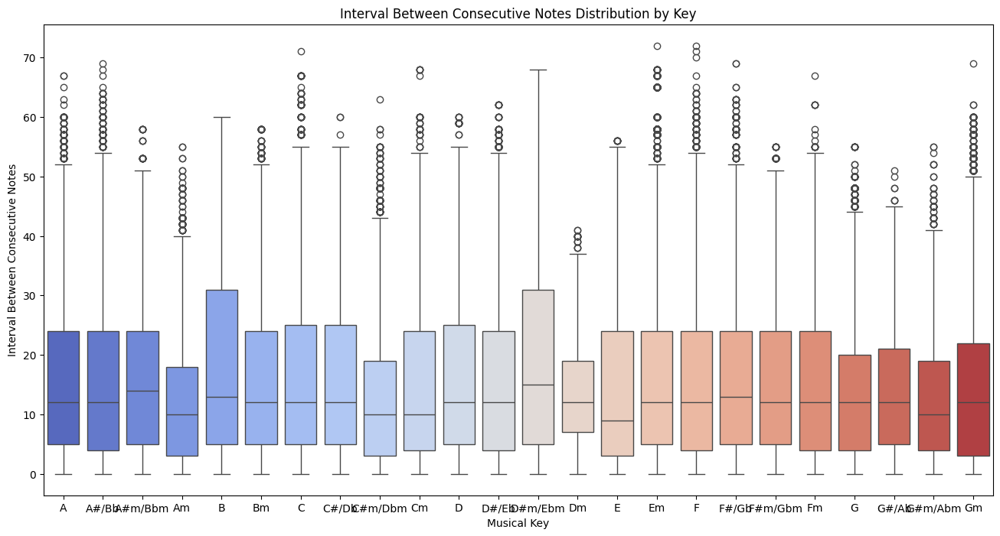

In [108]:
# Interval between consecutive notes distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='interval_to_prev', order=ordered_key_names, palette='coolwarm')
plt.title('Interval Between Consecutive Notes Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Interval Between Consecutive Notes')
plt.show()

In [109]:
# Descriptive statistics of interval between consecutive notes values by instrument
print("Interval Between Consecutive Notes statistics by Instrument:")
df_notes_only.groupby('instrument')['interval_to_prev'].describe()

Interval Between Consecutive Notes statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,15.664263,13.571180,0.0,5.0,12.0,26.0,72.0
Alto Saxophone,505.0,23.312871,15.661636,0.0,4.0,30.0,36.0,45.0
Bagpipes,4865.0,22.095786,13.726395,0.0,9.0,22.0,34.0,60.0
Banjo,872.0,14.793578,12.272118,0.0,4.0,10.0,27.0,34.0
Baritone Saxophone,1609.0,15.808577,9.703472,0.0,9.0,14.0,24.0,48.0
Bassoon,1729.0,9.181029,10.809438,0.0,0.0,4.0,16.0,46.0
Brass,2936.0,17.316417,14.415034,0.0,5.0,12.0,28.0,63.0
Choir,3971.0,10.245782,11.150495,0.0,2.0,7.0,14.0,60.0
Clarinet,998.0,17.357715,12.758512,0.0,9.0,17.0,24.0,53.0


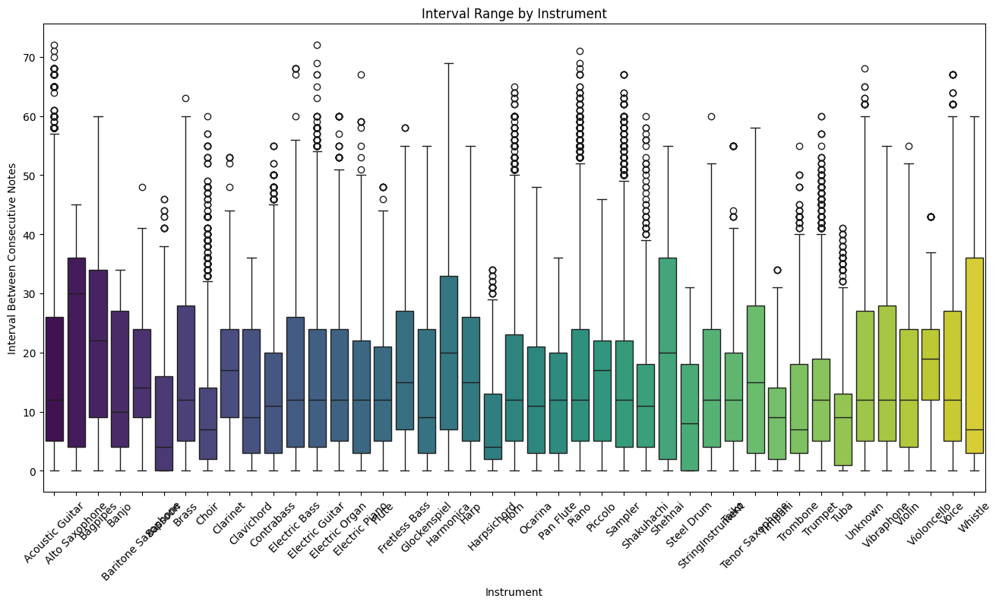

In [110]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='interval_to_prev', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Interval Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Interval Between Consecutive Notes')
plt.show()

In [111]:
# Descriptive statistics of intervals between consecutive notes by instrument family
print("Interval Between Consecutive Notes statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['interval_to_prev'].describe()

Interval Between Consecutive Notes statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,14.732812,12.383622,0.0,4.0,12.0,24.0,68.0
Brass,28615.0,13.182282,11.517943,0.0,4.0,12.0,21.0,65.0
Electronic,44646.0,13.514537,11.998708,0.0,4.0,12.0,21.0,67.0
Guitar,123066.0,14.595217,12.426576,0.0,4.0,12.0,24.0,72.0
Keyboard,115183.0,14.886164,12.105233,0.0,5.0,12.0,24.0,71.0
Other,26486.0,17.277920,14.772244,0.0,5.0,12.0,27.0,68.0
Percussion,12714.0,13.471999,11.452097,0.0,4.0,10.0,22.0,55.0
Strings,20311.0,14.588745,11.804396,0.0,4.0,12.0,24.0,60.0
Voice,18044.0,16.535912,13.539557,0.0,5.0,12.0,27.0,67.0


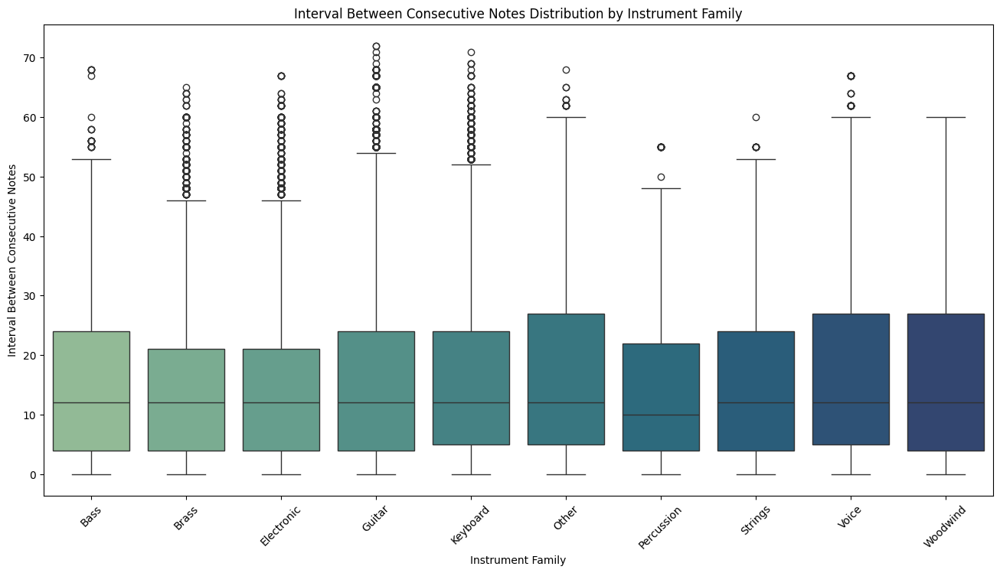

In [112]:
# Filter and plot interval between consecutive notes distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='interval_to_prev', palette='crest', order=families)
plt.title('Interval Between Consecutive Notes Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Interval Between Consecutive Notes')
plt.xticks(rotation=45)
plt.show()

In [113]:
# Descriptive statistics of intervals between consecutive notes by genre
print("Interval Between Consecutive Notes statistics by Genre:")
df_notes_only.groupby('genre')['interval_to_prev'].describe()

Interval Between Consecutive Notes statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,14.465120,12.358609,0.0,4.0,12.0,24.0,58.0
blues,35519.0,14.008756,12.134544,0.0,4.0,12.0,23.0,69.0
classical,31269.0,13.329815,11.776882,0.0,3.0,10.0,20.0,65.0
country,34558.0,14.708548,11.431257,0.0,5.0,12.0,22.0,67.0
dance,34253.0,16.677196,13.515872,0.0,5.0,12.0,26.0,68.0
disco,34775.0,15.381797,13.059244,0.0,4.0,12.0,24.0,69.0
heavy_metal,32227.0,15.194650,12.737132,0.0,5.0,12.0,24.0,67.0
jazz,21851.0,13.863942,11.256133,0.0,5.0,12.0,21.0,71.0
new_age,29586.0,12.349997,11.735201,0.0,2.0,9.0,19.0,72.0


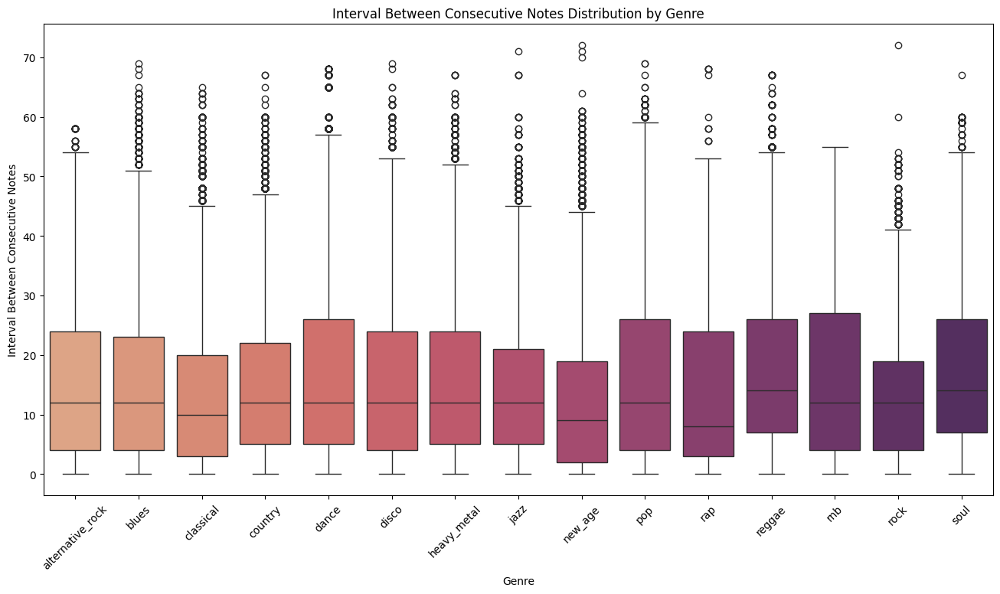

In [114]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='interval_to_prev', palette='flare', order=genres_sorted)
plt.title('Interval Between Consecutive Notes Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Interval Between Consecutive Notes')
plt.xticks(rotation=45)
plt.show()

##### 2.3.6.4 Metric Weight vs Interval Between Consecutive Notes (in Semitones)

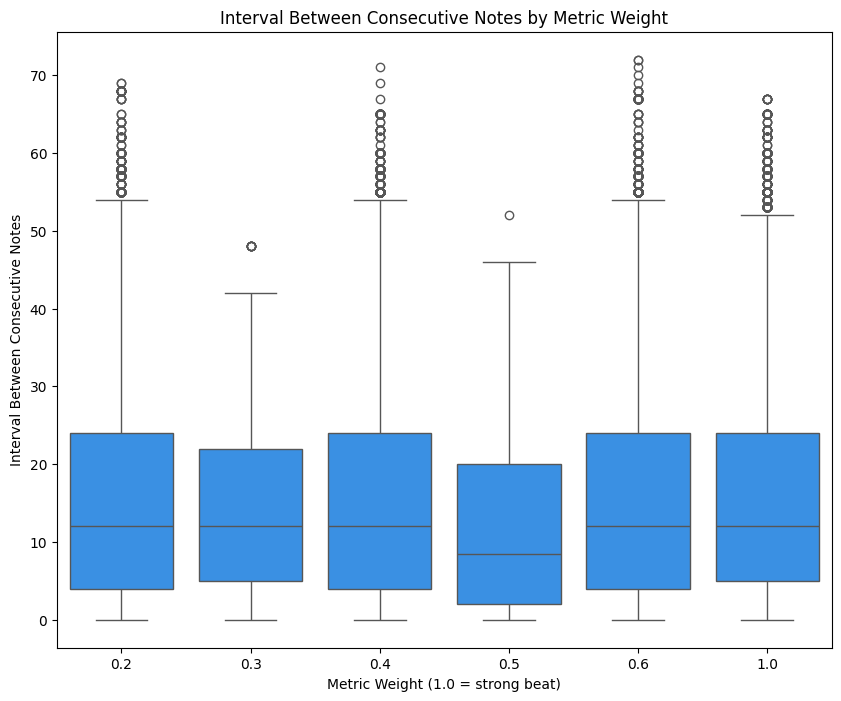

In [115]:
# Set the figure size
plt.figure(figsize=(10, 8))

# Create a boxplot showing how note duration varies with metric weight
sns.boxplot(data=df_notes_only, x="metric_weight", y="interval_to_prev", color='dodgerblue')

# Add a descriptive title and axis labels
plt.title("Interval Between Consecutive Notes by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Interval Between Consecutive Notes")
plt.show()

##### 2.3.6.5 Average Interval Between Consecutive Notes by Polyphony and Metric Weight

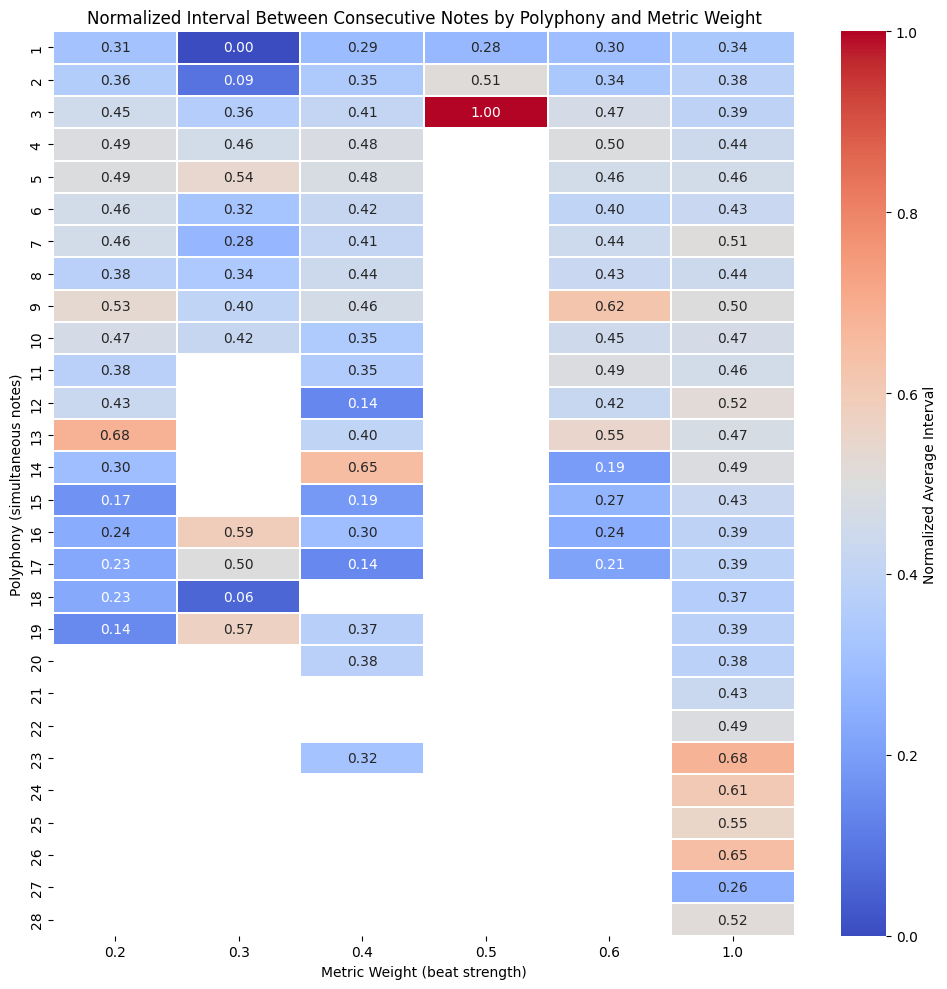

In [116]:
# Create a pivot table: rows = polyphony, columns = metric weight
pivot = df_notes_only.pivot_table(
    values="interval_to_prev",
    index="polyphony",
    columns="metric_weight",
    aggfunc="mean"
)

# Normalize globally using min-max scaling
normalized_pivot = (pivot - pivot.min().min()) / (pivot.max().max() - pivot.min().min())

# Plot the normalized heatmap
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(normalized_pivot, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.2, ax=ax, cbar_kws={"label": "Normalized Average Interval"})

plt.title("Normalized Interval Between Consecutive Notes by Polyphony and Metric Weight")
plt.xlabel("Metric Weight (beat strength)")
plt.ylabel("Polyphony (simultaneous notes)")
plt.tight_layout()
plt.show()

#### 2.3.7 Polyphony

##### 2.3.7.1 Central Tendency and Spread of Polyphony


In [117]:
# Descriptive stats: proportion and spread of polyphony
df['polyphony'].describe()

count    638769.000000
mean          4.998890
std           3.777682
min           1.000000
25%           2.000000
50%           4.000000
75%           6.000000
max          28.000000
Name: polyphony, dtype: float64

In [118]:
# Descriptive stats: proportion and spread of polyphony for actual notes only
df_notes_only['polyphony'].describe()

count    429888.000000
mean          4.994666
std           3.393482
min           1.000000
25%           3.000000
50%           4.000000
75%           6.000000
max          28.000000
Name: polyphony, dtype: float64

In [119]:
# Central tendency
mean_polyphony = df_notes_only['polyphony'].mean()
median_polyphony = df_notes_only['polyphony'].median()
mode_polyphony = df_notes_only['polyphony'].mode()[0]  

# Spread
std_polyphony = df_notes_only['polyphony'].std()

# Display results
print(f"Mean polyphony: {mean_polyphony:.2f}")
print(f"Median polyphony: {median_polyphony:.2f}")
print(f"Mode polyphony: {mode_polyphony:.2f}")
print(f"Standard polyphony: {std_polyphony:.2f}")

Mean polyphony: 4.99
Median polyphony: 4.00
Mode polyphony: 3.00
Standard polyphony: 3.39


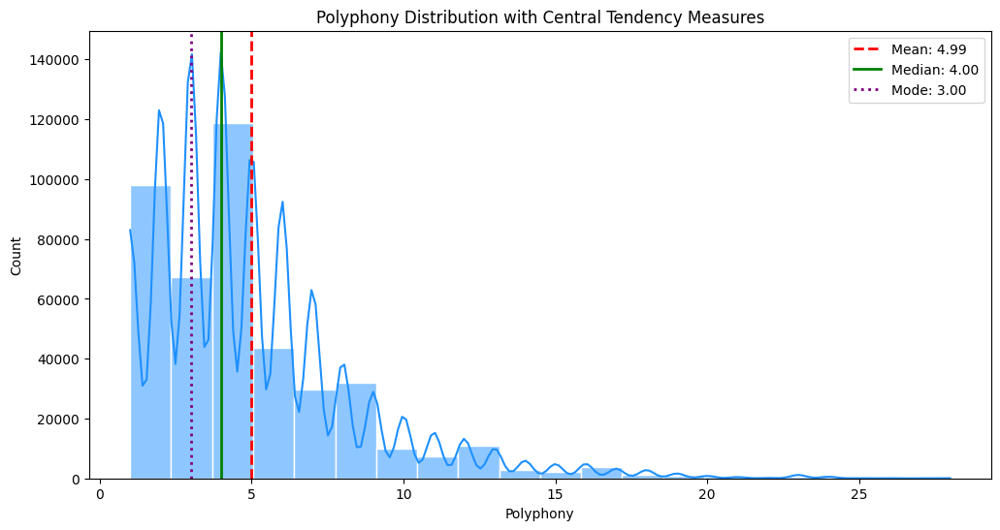

In [120]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['polyphony'], bins=20, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_polyphony, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_polyphony:.2f}')
plt.axvline(median_polyphony, color='green', linestyle='-', linewidth=2, label=f'Median: {median_polyphony:.2f}')
plt.axvline(mode_polyphony, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_polyphony:.2f}')

plt.title('Polyphony Distribution with Central Tendency Measures')
plt.xlabel('Polyphony')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.3.7.2 Outlier Detection in Polyphony Values

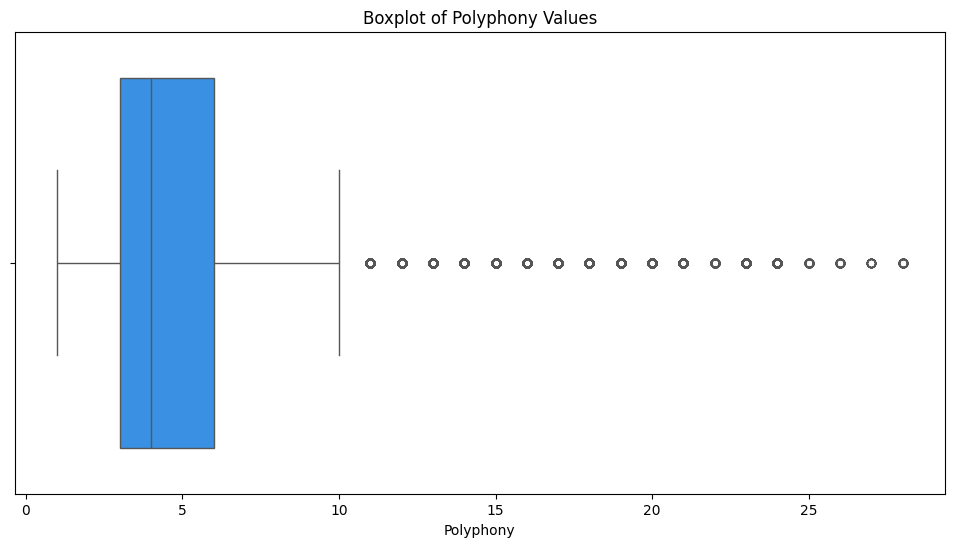

In [121]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_notes_only['polyphony'], color='dodgerblue')
plt.title('Boxplot of Polyphony Values')
plt.xlabel('Polyphony')
plt.show()

##### 2.3.7.3 Polyphony in Context: Key, Instrument, and Genre

In [122]:
# Descriptive statistics of polyphony values by key
print("Polyphony statistics by Key:")
df_notes_only.groupby('key')['polyphony'].describe().sort_index()

Polyphony statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37533.0,4.858924,3.117029,1.0,3.0,4.0,6.0,21.0
1,11542.0,4.521747,2.547734,1.0,2.0,5.0,6.0,10.0
2,28424.0,4.777969,3.099198,1.0,3.0,4.0,6.0,21.0
3,19869.0,6.252252,4.670294,1.0,3.0,5.0,8.0,28.0
4,8342.0,4.820307,2.603053,1.0,3.0,4.0,6.0,15.0
5,43881.0,4.553770,3.126363,1.0,2.0,4.0,6.0,19.0
6,7158.0,3.622381,2.108629,1.0,2.0,3.0,4.0,12.0
7,38144.0,4.119075,2.807191,1.0,2.0,4.0,6.0,18.0
8,2710.0,3.328413,2.342390,1.0,1.0,3.0,4.0,13.0


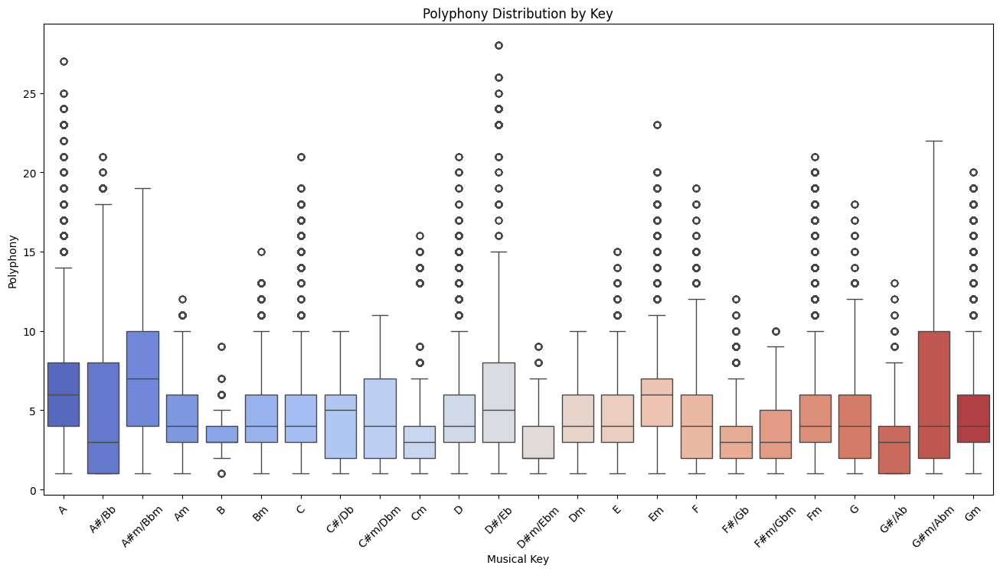

In [123]:
# Polyphony distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='polyphony', order=ordered_key_names, palette='coolwarm')
plt.title('Polyphony Distribution by Key')
plt.xlabel('Musical Key')
plt.xticks(rotation=45)
plt.ylabel('Polyphony')
plt.show()

In [124]:
# Descriptive statistics of polyphony values by instrument
print("Polyphony statistics by Instrument:")
df_notes_only.groupby('instrument')['polyphony'].describe()

Polyphony statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,6.200483,3.164052,1.0,4.00,6.0,8.0,19.0
Alto Saxophone,505.0,5.055446,3.320346,1.0,2.00,3.0,9.0,12.0
Bagpipes,4865.0,5.677903,1.984431,1.0,4.00,5.0,7.0,12.0
Banjo,872.0,1.610092,0.488009,1.0,1.00,2.0,2.0,2.0
Baritone Saxophone,1609.0,4.750155,1.373968,1.0,4.00,5.0,6.0,8.0
Bassoon,1729.0,5.275882,2.331026,1.0,3.00,5.0,8.0,9.0
Brass,2936.0,3.969687,2.041503,1.0,2.00,3.0,5.0,11.0
Choir,3971.0,6.582977,5.481579,1.0,2.00,4.0,12.0,21.0
Clarinet,998.0,3.637275,2.163037,1.0,2.00,3.0,5.0,9.0


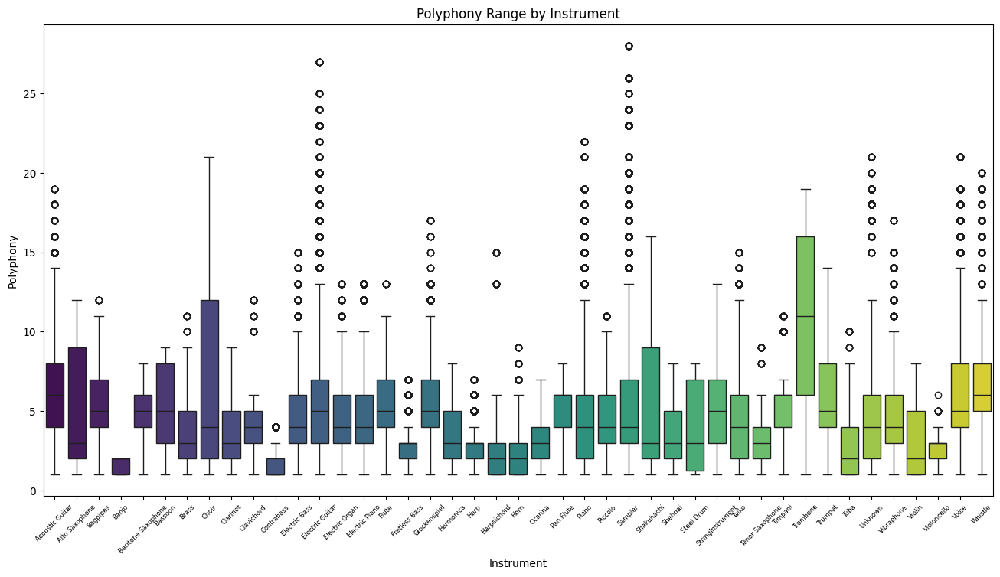

In [125]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='polyphony', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Polyphony Range by Instrument')
plt.xlabel('Instrument')
plt.xticks(fontsize=6)
plt.ylabel('Polyphony')
plt.show()

In [126]:
# Descriptive statistics of polyphony by instrument family
print("Polyphony statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['polyphony'].describe()

Polyphony statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,3.127546,2.250139,1.0,2.0,3.0,4.0,15.0
Brass,28615.0,4.399755,4.178206,1.0,2.0,3.0,6.0,19.0
Electronic,44646.0,5.581463,4.503717,1.0,3.0,4.0,7.0,28.0
Guitar,123066.0,5.576106,3.239128,1.0,3.0,5.0,7.0,27.0
Keyboard,115183.0,4.452419,2.864141,1.0,2.0,4.0,6.0,22.0
Other,26486.0,4.529940,3.109175,1.0,2.0,4.0,6.0,21.0
Percussion,12714.0,5.509517,3.239264,1.0,3.0,5.0,7.0,17.0
Strings,20311.0,4.668160,2.734208,1.0,3.0,4.0,6.0,13.0
Voice,18044.0,6.297329,3.779620,1.0,4.0,5.0,8.0,21.0


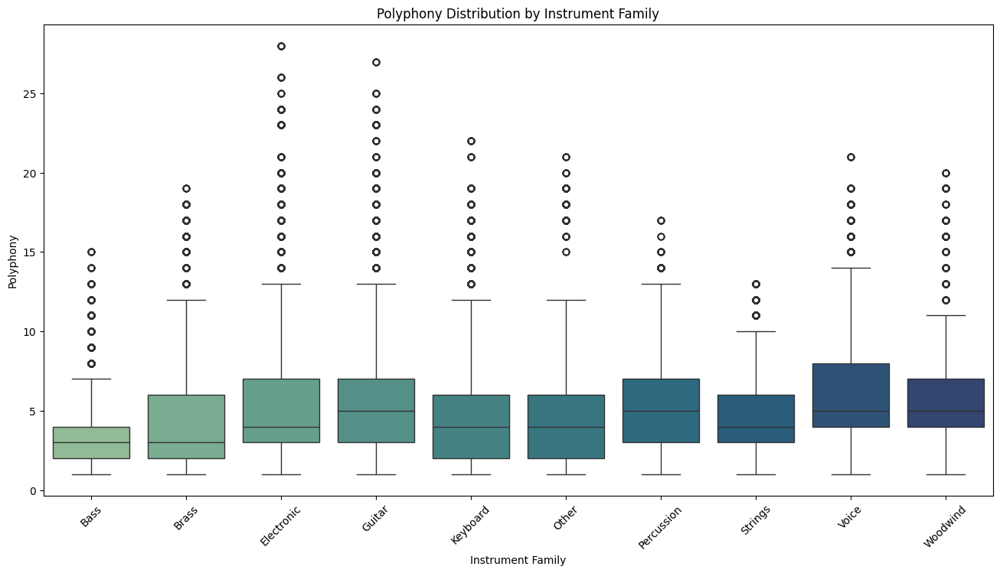

In [127]:
# Filter and plot polyphony distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='polyphony', palette='crest', order=families)
plt.title('Polyphony Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Polyphony')
plt.xticks(rotation=45)
plt.show()

In [128]:
# Descriptive statistics of polyphony by genre
print("Polyphony statistics by Genre:")
df_notes_only.groupby('genre')['polyphony'].describe()

Polyphony statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,4.938918,3.100730,1.0,3.0,4.0,7.0,23.0
blues,35519.0,5.021341,3.429188,1.0,2.0,5.0,7.0,21.0
classical,31269.0,2.028303,1.431632,1.0,1.0,2.0,2.0,9.0
country,34558.0,5.995631,3.702607,1.0,3.0,5.0,7.0,27.0
dance,34253.0,6.009371,3.322139,1.0,3.0,5.0,8.0,19.0
disco,34775.0,4.834651,2.673976,1.0,3.0,4.0,6.0,16.0
heavy_metal,32227.0,4.217333,2.180149,1.0,3.0,4.0,5.0,13.0
jazz,21851.0,5.361311,4.372352,1.0,2.0,4.0,8.0,19.0
new_age,29586.0,5.853782,3.937450,1.0,3.0,4.0,8.0,21.0


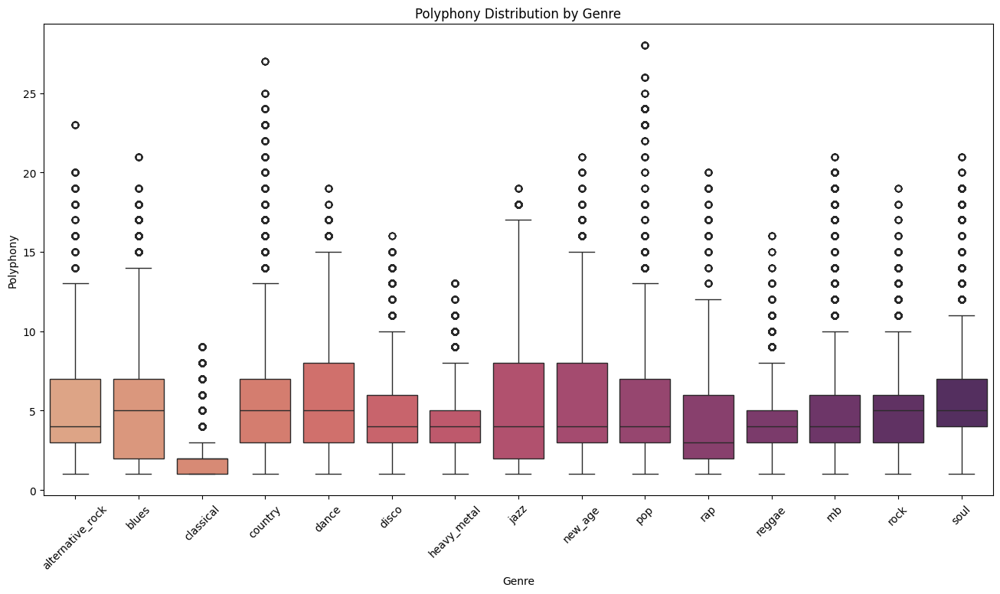

In [129]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='polyphony', palette='flare', order=genres_sorted)
plt.title('Polyphony Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Polyphony')
plt.xticks(rotation=45)
plt.show()

##### 2.3.7.4 Polyphony Anomaly Verification

In [130]:
# Wind instruments with high polyphony
print("Wind instruments - high polyphony analysis")
wind_instruments = ['Tenor Saxophone', 'Trombone', 'Trumpet', 'Flute', 'Clarinet']
for instrument in wind_instruments:
    if instrument in df['instrument'].values:
        data = df[df['instrument'] == instrument]['polyphony']
        high_poly = data[data > 8]  # Polyphony > 8 for wind instrument
        print(f"{instrument}:")
        print(f"  Total notes: {len(data)}")
        print(f"  Polyphony > 8: {len(high_poly)} ({len(high_poly)/len(data)*100:.1f}%)")
        print(f"  Max polyphony: {data.max()}")
        print(f"  Median: {data.median()}")
        print()

Wind instruments - high polyphony analysis
Tenor Saxophone:
  Total notes: 752
  Polyphony > 8: 18 (2.4%)
  Max polyphony: 9
  Median: 2.0

Trombone:
  Total notes: 7353
  Polyphony > 8: 4380 (59.6%)
  Max polyphony: 19
  Median: 11.0

Trumpet:
  Total notes: 9855
  Polyphony > 8: 1725 (17.5%)
  Max polyphony: 14
  Median: 5.0

Flute:
  Total notes: 6266
  Polyphony > 8: 412 (6.6%)
  Max polyphony: 13
  Median: 4.0

Clarinet:
  Total notes: 1136
  Polyphony > 8: 54 (4.8%)
  Max polyphony: 9
  Median: 3.0



In [131]:
# Classical genre - low polyphony analysis
print("Classical genre - detailed analysis")
classical = df[df['genre'] == 'classical']
print(f"Total classical notes: {len(classical)}")
print(f"Median polyphony: {classical['polyphony'].median()}")
print(f"Mean polyphony: {classical['polyphony'].mean():.2f}")

Classical genre - detailed analysis
Total classical notes: 36582
Median polyphony: 2.0
Mean polyphony: 2.07


In [132]:
# Instrument distribution in classical
print("\nInstruments in classical (top 10):")
classical_instruments = classical['instrument'].value_counts().head(10)
print(classical_instruments)


Instruments in classical (top 10):
instrument
Horn                14336
Contrabass          10126
Piano                6957
Bassoon              2605
Unknown              1269
Harpsichord          1264
Flute                  18
StringInstrument        5
Oboe                    1
Clarinet                1
Name: count, dtype: int64


In [133]:
# Comparison with Jazz (high polyphony reference)
print("\nClassical vs Jazz comparison")
jazz = df[df['genre'] == 'jazz']
print(f"Classical - Median: {classical['polyphony'].median()}")
print(f"Jazz - Median: {jazz['polyphony'].median()}")



Classical vs Jazz comparison
Classical - Median: 2.0
Jazz - Median: 3.0


In [134]:
# Cross-verification: wind instruments in classical
print("\nWind instruments in classical genre")
classical_wind = classical[classical['instrument'].isin(wind_instruments)]
if len(classical_wind) > 0:
    print(f"Wind instrument notes in classical: {len(classical_wind)}")
    print("Distribution by instrument:")
    print(classical_wind['instrument'].value_counts())
else:
    print("No wind instruments found in classical from this list")


Wind instruments in classical genre
Wind instrument notes in classical: 19
Distribution by instrument:
instrument
Flute       18
Clarinet     1
Name: count, dtype: int64


##### 2.3.7.5 Polyphonic Density Across Metric Accents

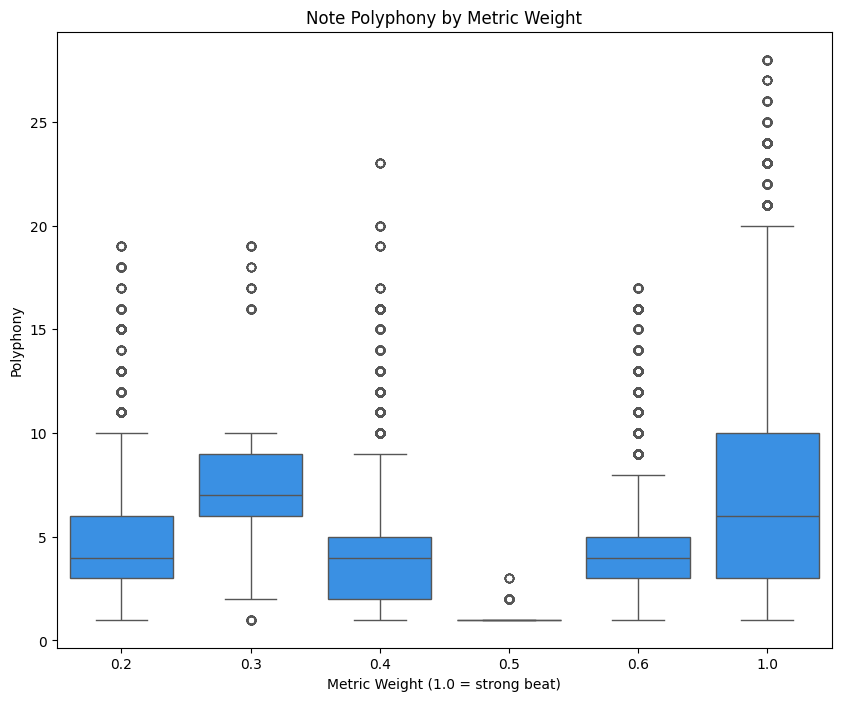

In [135]:
# Set the figure size
plt.figure(figsize=(10, 8))

# Create a boxplot showing how note duration varies with metric weight
sns.boxplot(data=df_notes_only, x="metric_weight", y="polyphony", color='dodgerblue')

# Add a descriptive title and axis labels
plt.title("Note Polyphony by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Polyphony")
plt.show()

##### 2.3.7.6 Proportion of Chord Tones by Polyphony and Metric Weight

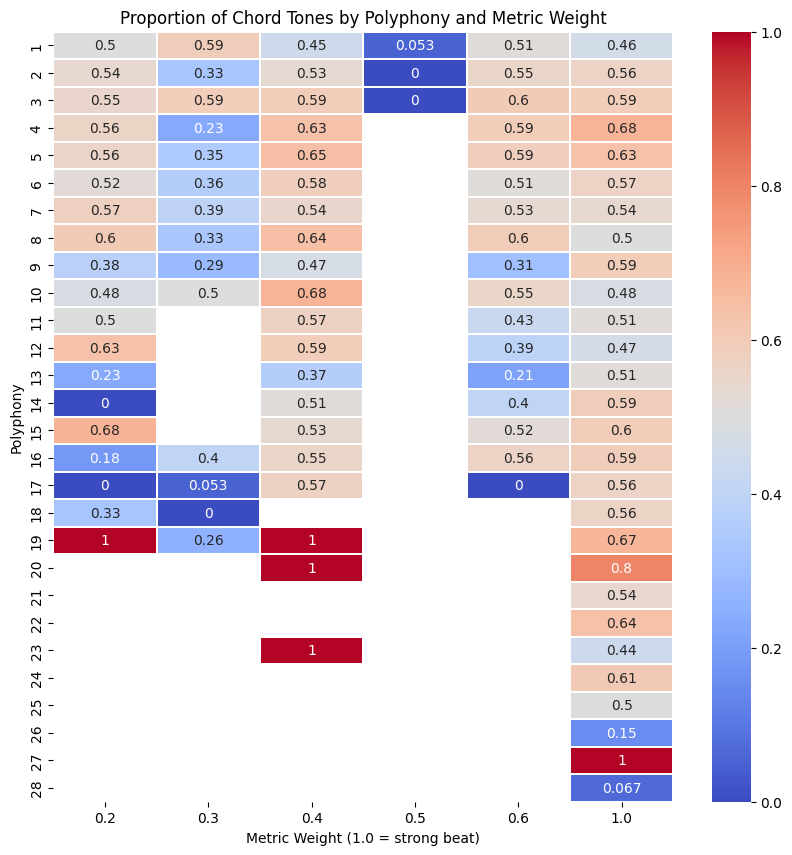

In [136]:
pivot = df_notes_only.pivot_table(values="is_chord_tone", index="polyphony", columns="metric_weight", aggfunc="mean")
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(pivot, ax=ax, cmap="coolwarm", annot=True, linewidths=0.2)
plt.title("Proportion of Chord Tones by Polyphony and Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Polyphony")
plt.show()

##### 2.3.7.7 Polyphonic Density Across Musical Sections

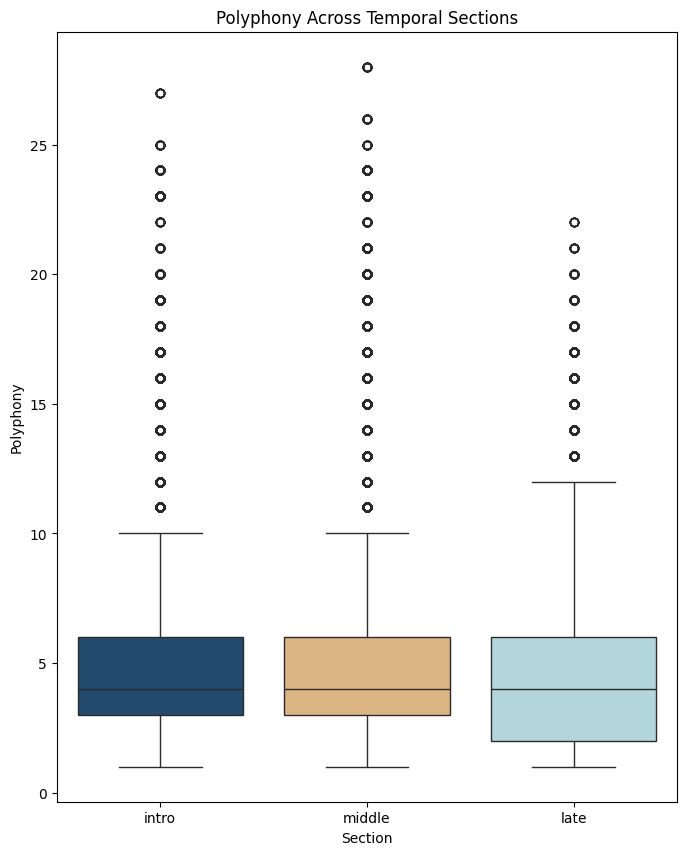

In [137]:
plt.figure(figsize=(8, 10))
sns.boxplot(data=df_notes_only, x="temporal_section", y="polyphony", palette=colors)
plt.title("Polyphony Across Temporal Sections")
plt.xlabel("Section")
plt.ylabel("Polyphony")
plt.show()

##### 2.3.7.8 Effect of Polyphony on Note Duration

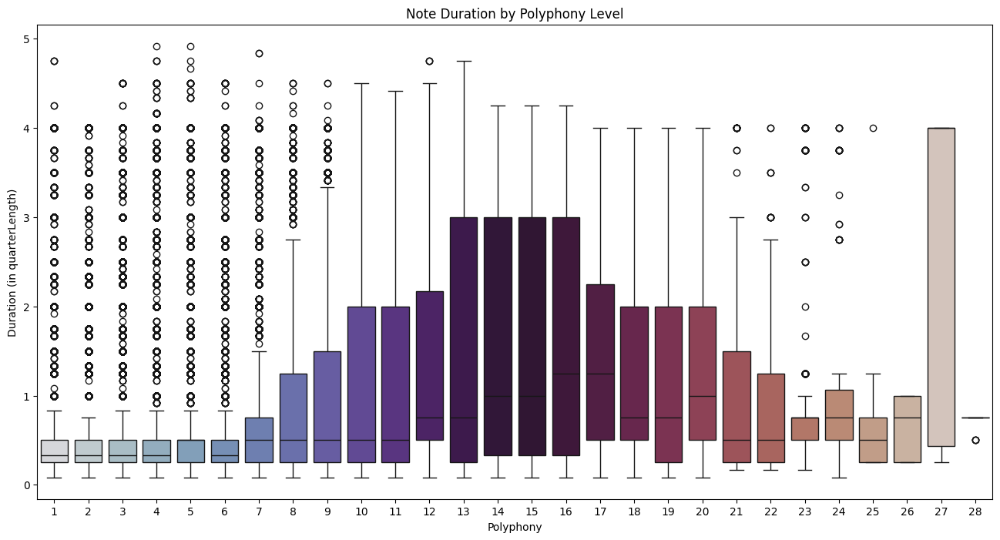

In [138]:
plt.figure(figsize=(16, 8))

# Create a boxplot to visualize how note duration changes with polyphony
sns.boxplot(data=df_filtered, x="polyphony", y="duration", palette='twilight')

# Add a descriptive title and labels
plt.title("Note Duration by Polyphony Level")
plt.xlabel("Polyphony")
plt.ylabel("Duration (in quarterLength)")
plt.show()

#### 2.3.8 Chord Tone Indicator

##### 2.3.8.1 Summary statistics and Distribution of Chord Tones (is_chord_tone)


In [139]:
# Descriptive stats: proportion and spread of chord vs non-chord tones
df['is_chord_tone'].describe()

count    638769.000000
mean          0.374808
std           0.484074
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: is_chord_tone, dtype: float64

In [140]:
df_notes_only['is_chord_tone'].describe()

count    429888.000000
mean          0.556926
std           0.496749
min           0.000000
25%           0.000000
50%           1.000000
75%           1.000000
max           1.000000
Name: is_chord_tone, dtype: float64

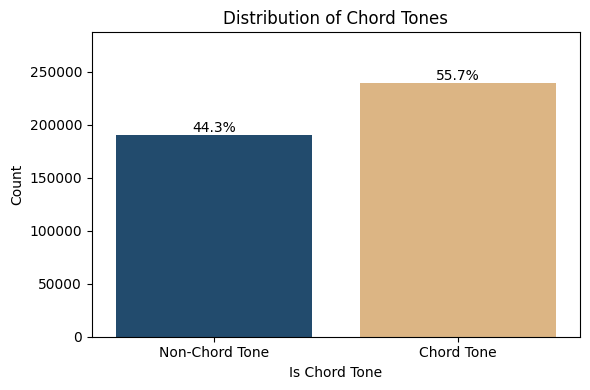

In [141]:
# Count the number of occurrences for each mode
total_chord_tones = df_notes_only['is_chord_tone'].value_counts().sum()
custom_labels = ["Non-Chord Tone", "Chord Tone"]

# Plot distribution of chord tones
plt.figure(figsize=(6, 4))
ax = sns.countplot(data=df_notes_only, x='is_chord_tone', palette=colors)
ax.set_xticklabels(custom_labels)
plt.title("Distribution of Chord Tones")
plt.xlabel("Is Chord Tone")
plt.ylabel("Count")

# Annotate bars with percentage labels
for p in ax.patches:
    count = p.get_height()
    percentage = 100 * count / total_chord_tones
    ax.annotate(f'{percentage:.1f}%', 
                (p.get_x() + p.get_width() / 2, count),
                ha='center', va='bottom', fontsize=10)
plt.ylim(0, max(df_notes_only['is_chord_tone'].value_counts()) * 1.2)
plt.tight_layout()
plt.show()

##### 2.3.8.2 Chord Tone Indicator in Context: Key, Instrument, and Genre

In [142]:
# Descriptive statistics of chord tones by key
print("Chord Tone Indicator statistics by Key:")
df_notes_only.groupby('key')['is_chord_tone'].describe().sort_index()

Chord Tone Indicator statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,37533.0,0.548477,0.497651,0.0,0.0,1.0,1.0,1.0
1,11542.0,0.620603,0.485258,0.0,0.0,1.0,1.0,1.0
2,28424.0,0.602730,0.489341,0.0,0.0,1.0,1.0,1.0
3,19869.0,0.566209,0.495609,0.0,0.0,1.0,1.0,1.0
4,8342.0,0.419324,0.493478,0.0,0.0,0.0,1.0,1.0
5,43881.0,0.629771,0.482871,0.0,0.0,1.0,1.0,1.0
6,7158.0,0.669181,0.470541,0.0,0.0,1.0,1.0,1.0
7,38144.0,0.633730,0.481791,0.0,0.0,1.0,1.0,1.0
8,2710.0,0.408856,0.491713,0.0,0.0,0.0,1.0,1.0


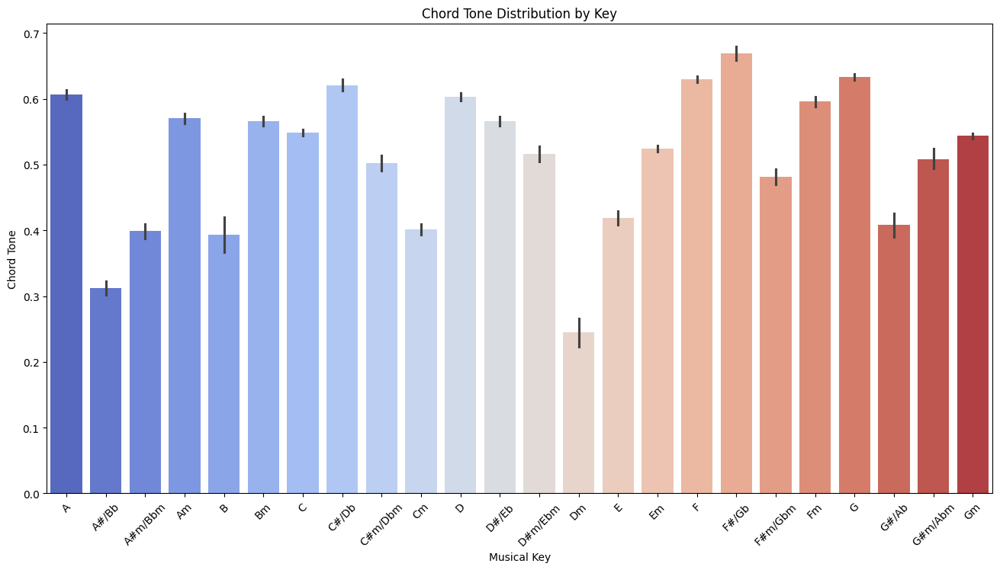

In [143]:
# Plot the results
plt.figure(figsize=(16, 8))
sns.barplot(data=df_notes_only, x='key_name', y='is_chord_tone', order=ordered_key_names, palette='coolwarm')
plt.title('Chord Tone Distribution by Key')
plt.xlabel('Musical Key')
plt.xticks(rotation=45)
plt.ylabel('Chord Tone')
plt.show()

In [144]:
# Descriptive statistics of chord tones by instrument
print("Chord Tone Indicator statistics by Instrument:")
df_notes_only.groupby('instrument')['is_chord_tone'].describe()

Chord Tone Indicator statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,0.455988,0.498067,0.0,0.0,0.0,1.0,1.0
Alto Saxophone,505.0,0.550495,0.497937,0.0,0.0,1.0,1.0,1.0
Bagpipes,4865.0,0.843988,0.362904,0.0,1.0,1.0,1.0,1.0
Banjo,872.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
Baritone Saxophone,1609.0,0.333748,0.471697,0.0,0.0,0.0,1.0,1.0
Bassoon,1729.0,0.322730,0.467656,0.0,0.0,0.0,1.0,1.0
Brass,2936.0,0.485354,0.499871,0.0,0.0,0.0,1.0,1.0
Choir,3971.0,0.594309,0.491087,0.0,0.0,1.0,1.0,1.0
Clarinet,998.0,0.105210,0.306978,0.0,0.0,0.0,0.0,1.0


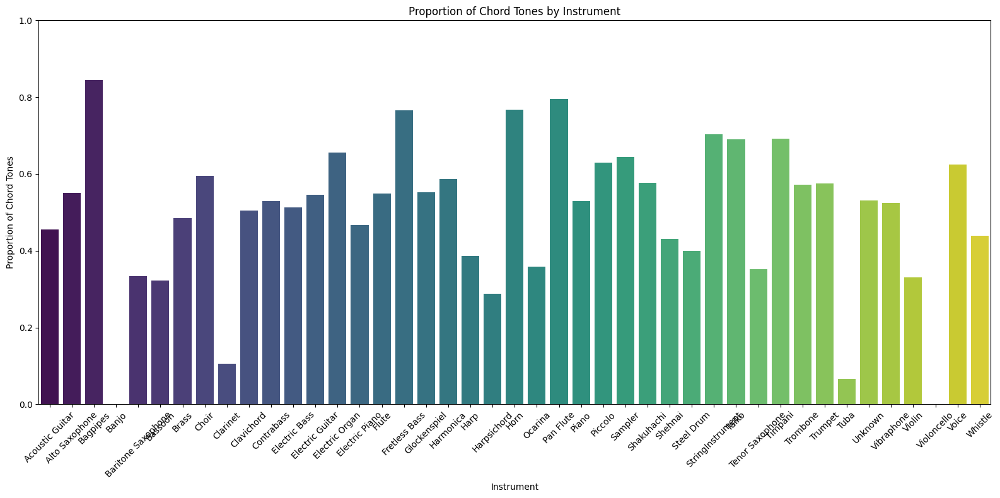

In [145]:
# Compute proportion of chord tones by instrument
chord_tone_by_instr = (
    df_notes_only.groupby('instrument')['is_chord_tone']
    .mean()
    .sort_index()  
    .reset_index()
)

# Plot
plt.figure(figsize=(16, 8))
sns.barplot(data=chord_tone_by_instr, x='instrument', y='is_chord_tone', palette='viridis')
plt.xticks(rotation=45)
plt.title('Proportion of Chord Tones by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Proportion of Chord Tones')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

In [146]:
# Descriptive statistics of chord tone indicator by instrument family
print("Chord Tone Indicator statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['is_chord_tone'].describe()

Chord Tone Indicator statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,0.574436,0.494439,0.0,0.0,1.0,1.0,1.0
Brass,28615.0,0.591648,0.491538,0.0,0.0,1.0,1.0,1.0
Electronic,44646.0,0.639251,0.480223,0.0,0.0,1.0,1.0,1.0
Guitar,123066.0,0.519494,0.499622,0.0,0.0,1.0,1.0,1.0
Keyboard,115183.0,0.540106,0.498391,0.0,0.0,1.0,1.0,1.0
Other,26486.0,0.509968,0.499910,0.0,0.0,1.0,1.0,1.0
Percussion,12714.0,0.583137,0.493059,0.0,0.0,1.0,1.0,1.0
Strings,20311.0,0.599429,0.490026,0.0,0.0,1.0,1.0,1.0
Voice,18044.0,0.624917,0.484158,0.0,0.0,1.0,1.0,1.0


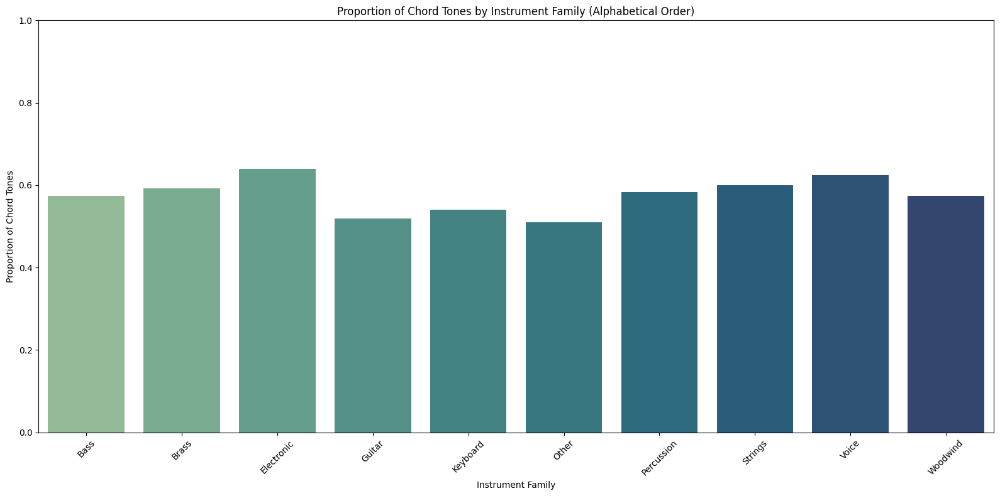

In [147]:
# Compute proportion of chord tones by instrument family (alphabetical order)
chord_tone_by_instr_fam = (
    df_notes_only.groupby('instrument_family')['is_chord_tone']
    .mean()
    .reset_index()
    .sort_values('instrument_family')  
)

# Plot
plt.figure(figsize=(16, 8))
sns.barplot(data=chord_tone_by_instr_fam, x='instrument_family', y='is_chord_tone', palette='crest')
plt.xticks(rotation=45)
plt.title('Proportion of Chord Tones by Instrument Family (Alphabetical Order)')
plt.xlabel('Instrument Family')
plt.ylabel('Proportion of Chord Tones')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

In [148]:
# Descriptive statistics of chord tones by genre
print("Chord tones statistics by Genre:")
df_notes_only.groupby('genre')['is_chord_tone'].describe()

Chord tones statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,0.545965,0.497894,0.0,0.0,1.0,1.0,1.0
blues,35519.0,0.527830,0.499232,0.0,0.0,1.0,1.0,1.0
classical,31269.0,0.557453,0.496696,0.0,0.0,1.0,1.0,1.0
country,34558.0,0.634007,0.481715,0.0,0.0,1.0,1.0,1.0
dance,34253.0,0.446005,0.497083,0.0,0.0,0.0,1.0,1.0
disco,34775.0,0.660072,0.473691,0.0,0.0,1.0,1.0,1.0
heavy_metal,32227.0,0.646166,0.478166,0.0,0.0,1.0,1.0,1.0
jazz,21851.0,0.554391,0.497044,0.0,0.0,1.0,1.0,1.0
new_age,29586.0,0.642500,0.479272,0.0,0.0,1.0,1.0,1.0


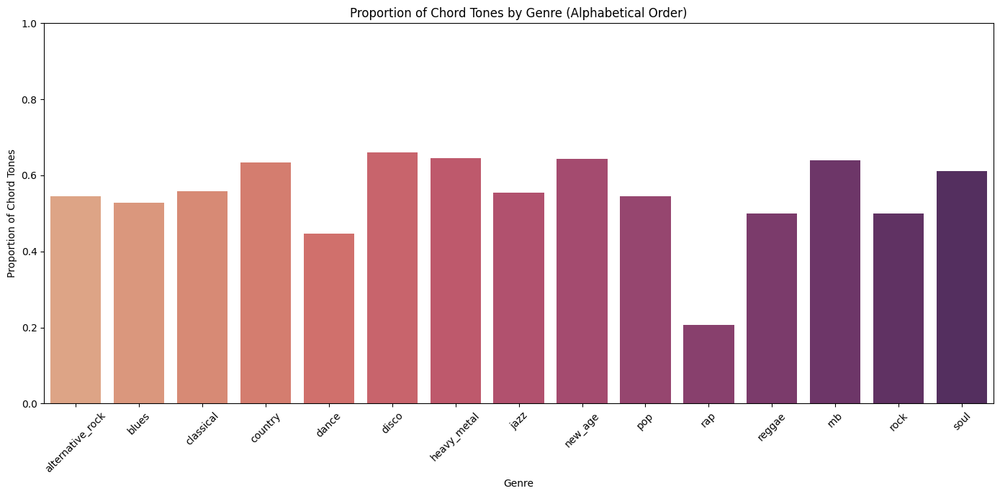

In [149]:
# Compute proportion of chord tones by genre (alphabetical order)
chord_tone_by_genre = (
    df_notes_only.groupby('genre')['is_chord_tone']
    .mean()
    .reset_index()
    .sort_values('genre') 
)

# Plot
plt.figure(figsize=(14, 7))
sns.barplot(data=chord_tone_by_genre, x='genre', y='is_chord_tone', palette='flare')
plt.xticks(rotation=45)
plt.title('Proportion of Chord Tones by Genre (Alphabetical Order)')
plt.xlabel('Genre')
plt.ylabel('Proportion of Chord Tones')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

##### 2.3.8.3 Evolution of Chord Tones Over Measures

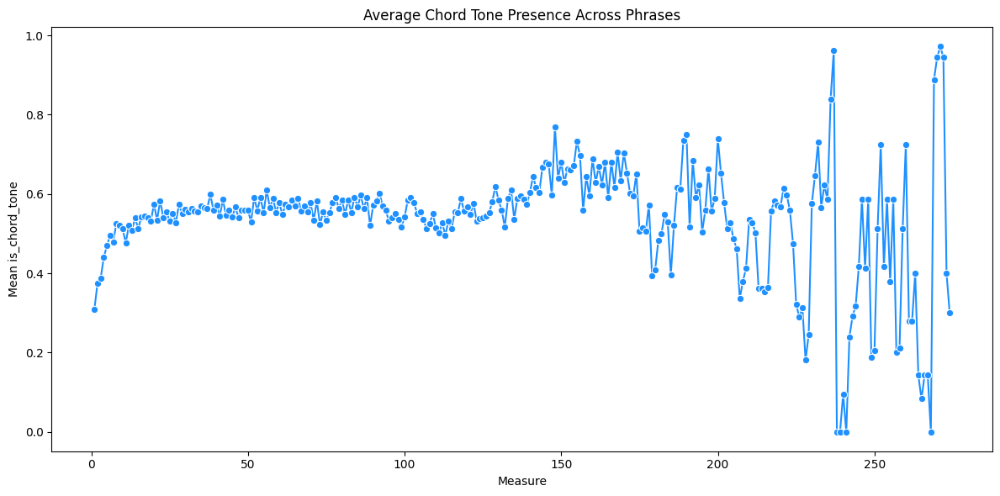

In [150]:
# Average chord tone presence per phrase 
chord_tone_by_phrase = df_notes_only.groupby("measure")["is_chord_tone"].mean().reset_index()

# Line plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=chord_tone_by_phrase, x="measure", y="is_chord_tone", marker="o", color='dodgerblue')
plt.title("Average Chord Tone Presence Across Phrases")
plt.xlabel("Measure")
plt.ylabel("Mean is_chord_tone")
plt.tight_layout()
plt.show()

##### 2.3.8.4 Relationship Between Chord Tones and Polyphony

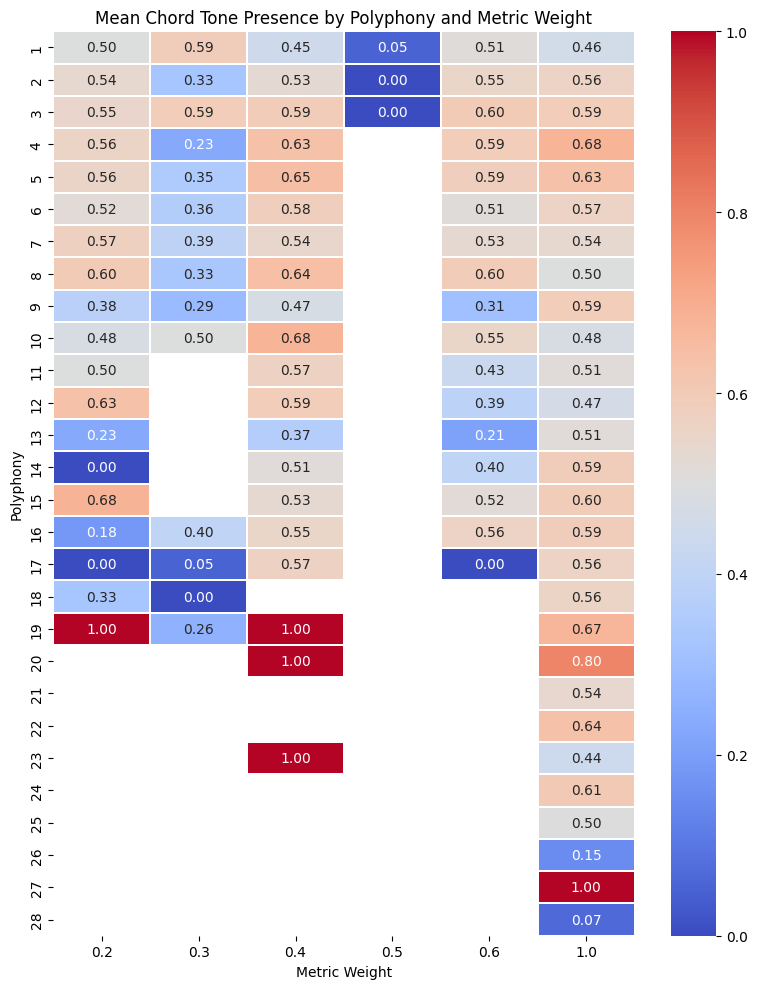

In [151]:
# Create a heatmap showing mean chord tone by polyphony and metric weight
chord_tones_pivot = df_notes_only.pivot_table(values='is_chord_tone', index='polyphony', columns='metric_weight', aggfunc='mean')
chord_tones_pivot = chord_tones_pivot.sort_index().sort_index(axis=1)

# Plot
plt.figure(figsize=(8, 10))
sns.heatmap(chord_tones_pivot, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.2)
plt.title("Mean Chord Tone Presence by Polyphony and Metric Weight")
plt.xlabel("Metric Weight")
plt.ylabel("Polyphony")
plt.tight_layout()
plt.show()

##### 2.3.8.5 Verification of Observed chord_tone Patterns

In [152]:
# Temporal evolution by genre
for genre in ['jazz', 'classical', 'rap', 'disco']:
    genre_data = df_notes_only[df_notes_only['genre'] == genre]
    if len(genre_data) > 0:
        print(f"\n{genre.upper()}:")
        print(f"  Early measures (0-50): {genre_data[genre_data['measure'] <= 50]['is_chord_tone'].mean():.3f}")
        print(f"  Middle (51-150): {genre_data[(genre_data['measure'] > 50) & (genre_data['measure'] <= 150)]['is_chord_tone'].mean():.3f}")
        print(f"  Late (150+): {genre_data[genre_data['measure'] > 150]['is_chord_tone'].mean():.3f}")



JAZZ:
  Early measures (0-50): 0.527
  Middle (51-150): 0.580
  Late (150+): 0.463

CLASSICAL:
  Early measures (0-50): 0.481
  Middle (51-150): 0.563
  Late (150+): 0.641

RAP:
  Early measures (0-50): 0.242
  Middle (51-150): 0.169
  Late (150+): nan

DISCO:
  Early measures (0-50): 0.634
  Middle (51-150): 0.662
  Late (150+): 0.847


In [153]:
# Polyphony and metric weight interaction
high_poly = df_notes_only[df_notes_only['polyphony'] >= 8]
low_poly = df_notes_only[df_notes_only['polyphony'] <= 2]

print(f"High polyphony (8+) chord tones: {high_poly['is_chord_tone'].mean():.3f}")
print(f"Low polyphony (1-2) chord tones: {low_poly['is_chord_tone'].mean():.3f}")

print(f"\nStrong beats (weight=1.0): {df_notes_only[df_notes_only['metric_weight'] == 1.0]['is_chord_tone'].mean():.3f}")
print(f"Weak beats (weight<0.5): {df_notes_only[df_notes_only['metric_weight'] < 0.5]['is_chord_tone'].mean():.3f}")


High polyphony (8+) chord tones: 0.519
Low polyphony (1-2) chord tones: 0.515

Strong beats (weight=1.0): 0.559
Weak beats (weight<0.5): 0.557


In [154]:
# Check extreme peaks/drops
extreme_high = df_notes_only.groupby('measure')['is_chord_tone'].mean()
print(f"Measures with >90% chord tones: {sum(extreme_high > 0.9)}")
print(f"Measures with <10% chord tones: {sum(extreme_high < 0.1)}")
print(f"Most harmonic measure: {extreme_high.idxmax()} ({extreme_high.max():.3f})")
print(f"Least harmonic measure: {extreme_high.idxmin()} ({extreme_high.min():.3f})")

Measures with >90% chord tones: 4
Measures with <10% chord tones: 6
Most harmonic measure: 271 (0.972)
Least harmonic measure: 238 (0.000)


#### 2.3.9 Key

##### 2.3.9.1 Central Tendency and Spread of Key



In [155]:
# Descriptive stats: proportion and spread of keys
df['key'].describe()

count    638769.000000
mean         10.839959
std           7.456345
min           0.000000
25%           5.000000
50%           9.000000
75%          18.000000
max          23.000000
Name: key, dtype: float64

In [156]:
# Central tendency
mean_key = df['key'].mean()
median_key = df['key'].median()
mode_key = df['key'].mode()[0]  

# Spread
std_key = df['key'].std()

# Display results
print(f"Mean key: {mean_key:.2f}")
print(f"Median key: {median_key:.2f}")
print(f"Mode key: {mode_key:.2f}")
print(f"Standard key: {std_key:.2f}")

Mean key: 10.84
Median key: 9.00
Mode key: 19.00
Standard key: 7.46


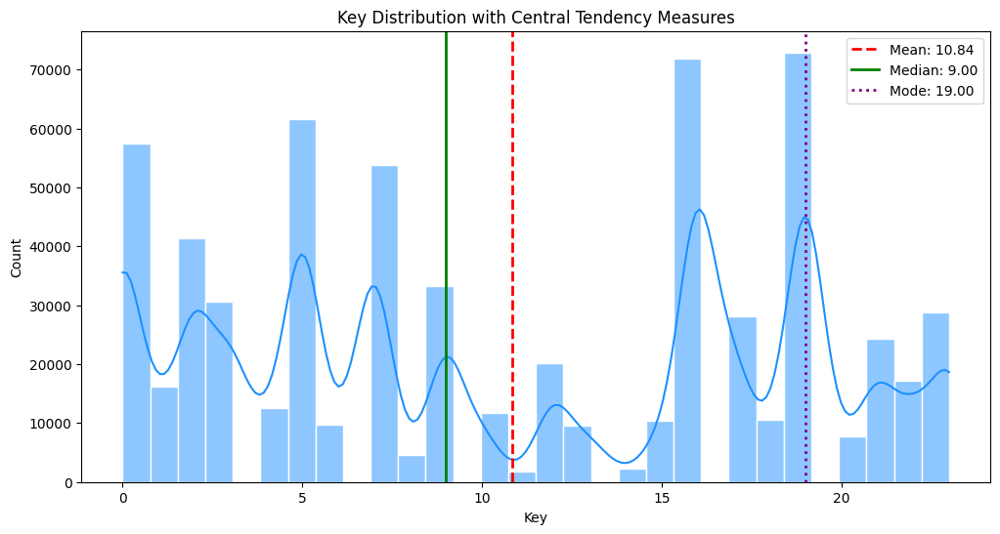

In [157]:
plt.figure(figsize=(12, 6))
sns.histplot(df['key'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_key, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_key:.2f}')
plt.axvline(median_key, color='green', linestyle='-', linewidth=2, label=f'Median: {median_key:.2f}')
plt.axvline(mode_key, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_key:.2f}')

plt.title('Key Distribution with Central Tendency Measures')
plt.xlabel('Key')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.3.9.2 Key Mode Distribution: Major vs Minor

In [158]:
# Create a new column that labels each key as Major (0–11) or Minor (12–23)
df["key_mode"] = df["key"].apply(lambda x: "Major" if x < 12 else "Minor")
df_notes_only["key_mode"] = df_notes_only["key"].apply(lambda x: "Major" if x < 12 else "Minor")

# Count the number of occurrences for each mode
total_key_modes = df['key_mode'].value_counts().sum()

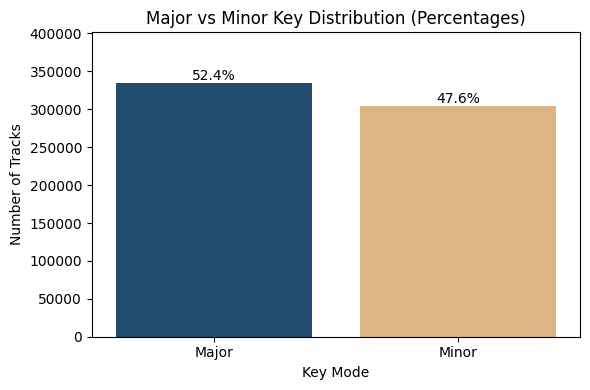

In [159]:
# Create the countplot
plt.figure(figsize=(6, 4))
ax = sns.countplot(data=df, x='key_mode', palette=colors)
plt.title("Major vs Minor Key Distribution (Percentages)")
plt.xlabel("Key Mode")
plt.ylabel("Number of Tracks")

# Annotate bars with percentage labels
for p in ax.patches:
    count = p.get_height()
    percentage = 100 * count / total_key_modes
    ax.annotate(f'{percentage:.1f}%', 
                (p.get_x() + p.get_width() / 2, count),
                ha='center', va='bottom', fontsize=10)
plt.ylim(0, max(df['key_mode'].value_counts()) * 1.2)
plt.tight_layout()
plt.show()

##### 2.9.3.3 Genre Distribution Across Keys

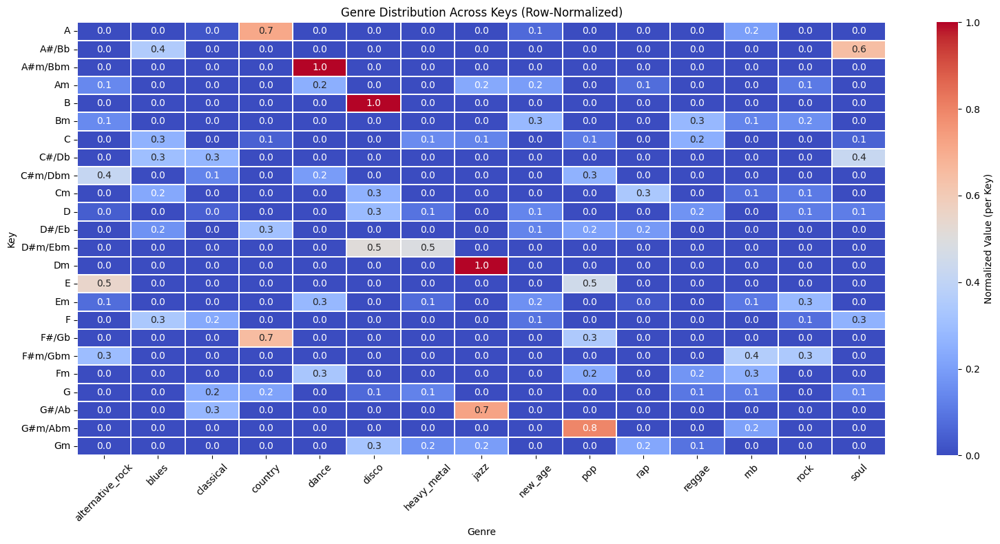

In [161]:
# Compute raw counts
heatmap_data = pd.crosstab(df["key_name"], df["genre"])

# Normalize by row (proportions per key_name)
normalized_data = heatmap_data.div(heatmap_data.sum(axis=1), axis=0)

# Plot the heatmap with normalized values as annotations
plt.figure(figsize=(16, 8))
sns.heatmap(normalized_data, cmap="coolwarm", annot=True, fmt=".1f", linewidths=0.2, cbar_kws={'label': 'Normalized Value (per Key)'})
plt.title("Genre Distribution Across Keys (Row-Normalized)")
plt.xlabel("Genre")
plt.xticks(rotation=45)
plt.ylabel("Key")
plt.tight_layout()
plt.show()

#### 2.3.10 Local Key

##### 2.3.10.1 Central Tendency and Spread of Local Key



In [177]:
# Descriptive stats: proportion and spread of local keys
df['local_key'].describe()

count    638769.000000
mean          6.018165
std           7.046471
min           0.000000
25%           0.000000
50%           4.000000
75%          10.000000
max          23.000000
Name: local_key, dtype: float64

In [192]:
df_notes_only['local_key'].describe()

count    429888.000000
mean          5.909807
std           6.885269
min           0.000000
25%           0.000000
50%           4.000000
75%           9.000000
max          23.000000
Name: local_key, dtype: float64

In [193]:
# Central tendency
mean_local_key = df_notes_only['local_key'].mean()
median_local_key = df_notes_only['local_key'].median()
mode_local_key = df_notes_only['local_key'].mode()[0]  

# Spread
std_local_key = df_notes_only['local_key'].std()

# Display results
print(f"Mean local key: {mean_local_key:.2f}")
print(f"Median local key: {median_local_key:.2f}")
print(f"Mode local key: {mode_local_key:.2f}")
print(f"Standard local key: {std_local_key:.2f}")

Mean local key: 5.91
Median local key: 4.00
Mode local key: 0.00
Standard local key: 6.89


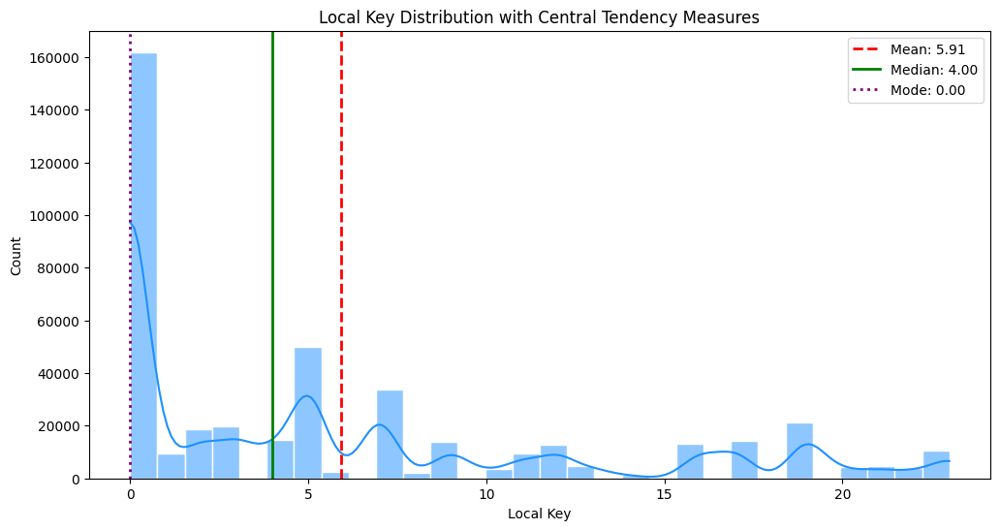

In [194]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['local_key'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_local_key, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_local_key:.2f}')
plt.axvline(median_local_key, color='green', linestyle='-', linewidth=2, label=f'Median: {median_local_key:.2f}')
plt.axvline(mode_local_key, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_local_key:.2f}')

plt.title('Local Key Distribution with Central Tendency Measures')
plt.xlabel('Local Key')
plt.ylabel('Count')
plt.legend()
plt.show()

In [195]:
# Check distribution of local keys to make sure 0 is not overrepresented
identical = (df_notes_only['key'] == df_notes_only['local_key']).sum()
print(f"Tonal stability ratio: {identical/len(df):.2%}")
print(f"Proportion of modulated events (local_key ≠ key): {1-(identical/len(df)):.2%}")

# Distribution of global keys
print("\n", df_notes_only['key'].value_counts().head())

Tonal stability ratio: 38.34%
Proportion of modulated events (local_key ≠ key): 61.66%

 key
16    51693
19    47161
5     43881
7     38144
0     37533
Name: count, dtype: int64


##### 2.3.10.2 Local Key in Context: Instrument and Genre

In [196]:
# Descriptive statistics of local keys by instrument
print("Local Key statistics by Instrument:")
df_notes_only.groupby('instrument')['local_key'].describe()

Local Key statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,31060.0,4.481938,5.621968,0.0,0.0,3.0,7.0,23.0
Alto Saxophone,505.0,7.000000,0.000000,7.0,7.0,7.0,7.0,7.0
Bagpipes,4865.0,0.099281,1.508000,0.0,0.0,0.0,0.0,23.0
Banjo,872.0,16.000000,0.000000,16.0,16.0,16.0,16.0,16.0
Baritone Saxophone,1609.0,0.049720,0.443319,0.0,0.0,0.0,0.0,4.0
Bassoon,1729.0,7.000000,0.000000,7.0,7.0,7.0,7.0,7.0
Brass,2936.0,1.948229,1.781232,0.0,0.0,2.0,4.0,4.0
Choir,3971.0,5.194158,7.542479,2.0,2.0,2.0,2.0,23.0
Clarinet,998.0,4.000000,0.000000,4.0,4.0,4.0,4.0,4.0


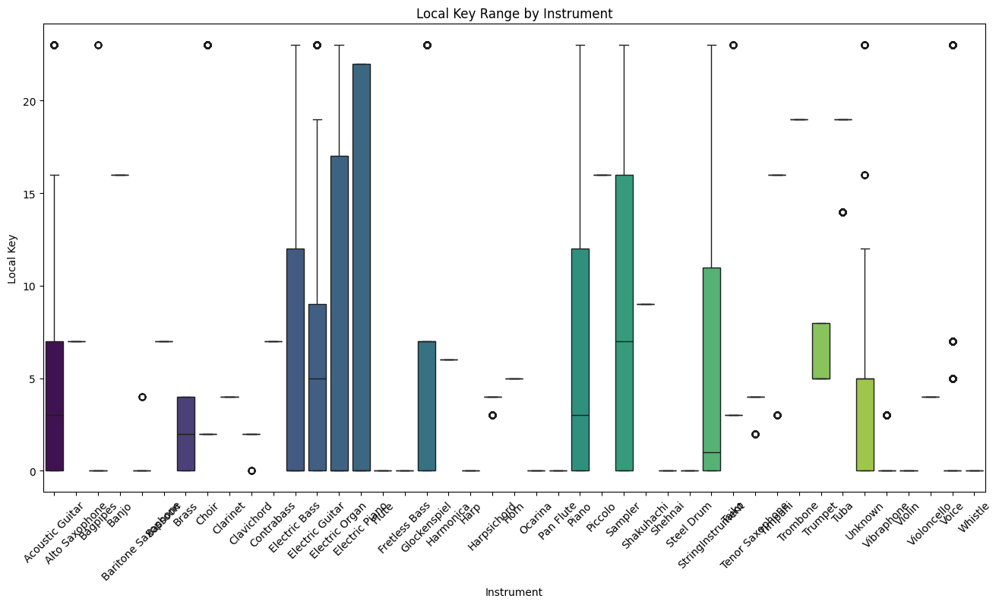

In [197]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='local_key', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Local Key Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Local Key')
plt.show()

In [198]:
# Descriptive statistics of local key by instrument family
print("Local Key statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['local_key'].describe()

Local Key statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,21992.0,5.228083,5.762720,0.0,0.0,7.0,7.0,23.0
Brass,28615.0,9.348768,6.120728,5.0,5.0,5.0,19.0,19.0
Electronic,44646.0,7.717130,7.510170,0.0,0.0,7.0,13.0,23.0
Guitar,123066.0,6.205695,6.658442,0.0,0.0,5.0,9.0,23.0
Keyboard,115183.0,6.496158,7.817264,0.0,0.0,2.0,12.0,23.0
Other,26486.0,3.161293,2.626012,0.0,0.0,5.0,5.0,23.0
Percussion,12714.0,4.749331,5.492285,0.0,0.0,3.0,7.0,23.0
Strings,20311.0,3.801290,6.928942,0.0,0.0,0.0,5.0,23.0
Voice,18044.0,1.468023,3.179865,0.0,0.0,0.0,0.0,23.0


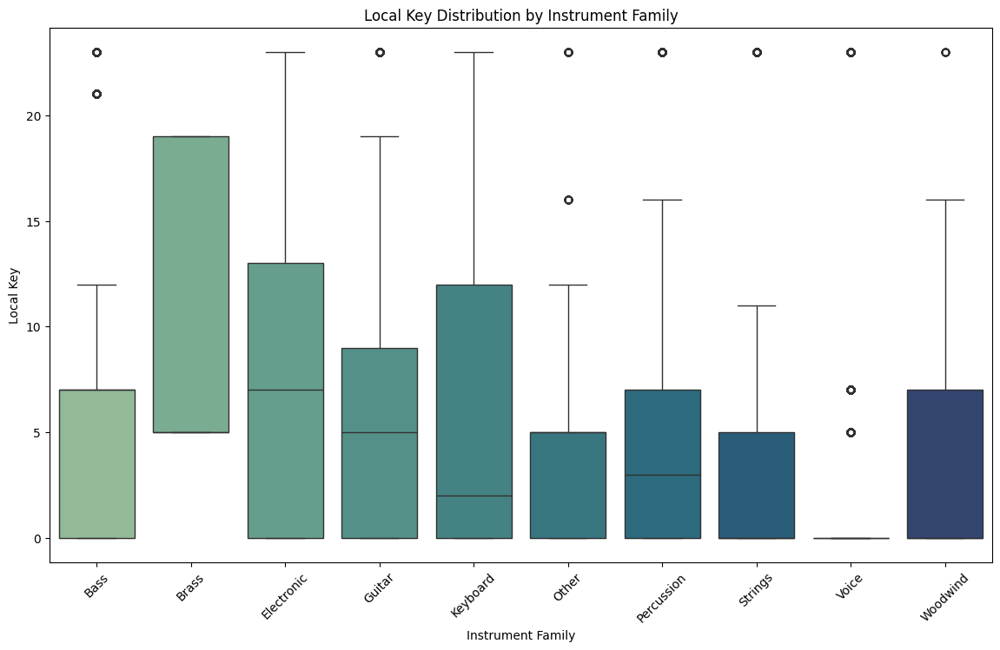

In [199]:
# Filter and plot local key distribution by instrument family
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df_notes_only,
    x='instrument_family',
    y='local_key',
    palette='crest',
    order=families
)
plt.title('Local Key Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Local Key')
plt.xticks(rotation=45)
plt.show()

In [200]:
# Descriptive statistics of local key by genre
print("Local key statistics by Genre:")
df_notes_only.groupby('genre')['local_key'].describe()

Local key statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,21201.0,5.437527,6.698315,0.0,0.0,0.0,13.0,16.0
blues,35519.0,4.005574,4.015283,0.0,0.0,3.0,5.0,12.0
classical,31269.0,5.053184,2.078636,0.0,5.0,5.0,7.0,9.0
country,34558.0,4.677007,4.005728,0.0,0.0,4.0,9.0,11.0
dance,34253.0,8.565352,9.544867,0.0,0.0,0.0,17.0,22.0
disco,34775.0,5.308239,7.485453,0.0,0.0,0.0,12.0,19.0
heavy_metal,32227.0,2.314178,4.887526,0.0,0.0,0.0,5.0,19.0
jazz,21851.0,12.067457,6.879108,0.0,7.0,14.0,19.0,19.0
new_age,29586.0,11.090482,7.803984,2.0,4.0,9.0,16.0,23.0


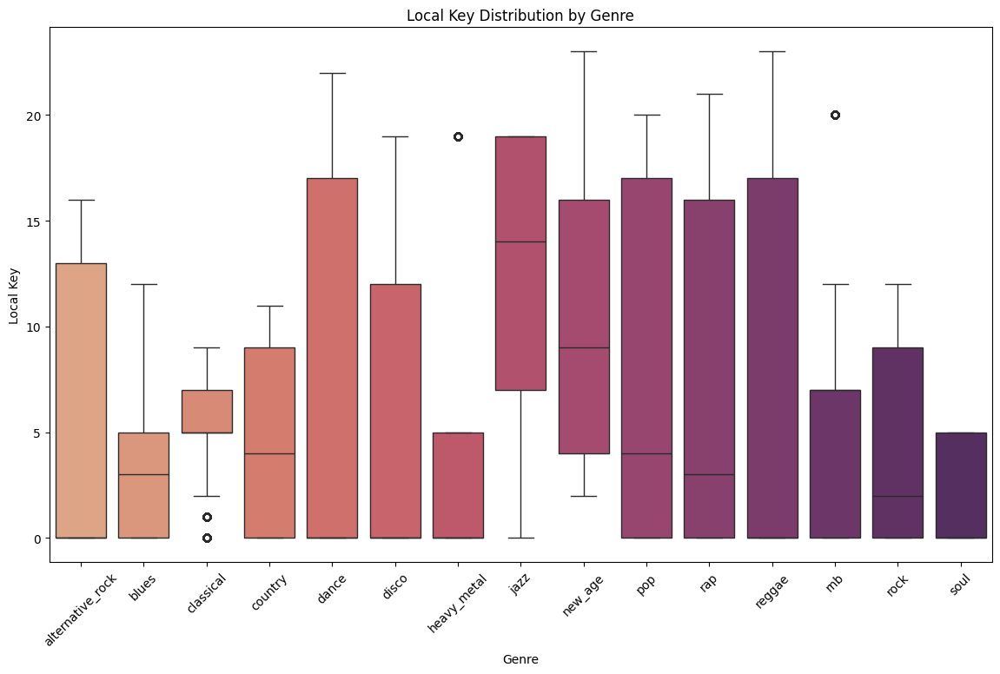

In [201]:
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df_notes_only,
    x='genre',
    y='local_key',
    palette='flare',
    order=genres_sorted
)
plt.title('Local Key Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Local Key')
plt.xticks(rotation=45)
plt.show()

##### 2.3.10.3 Local Key Summary Statistics by Temporal Section

In [202]:
# Summary statistics of local_key by temporal section
stats_temporal = df_notes_only.groupby('temporal_section')['local_key'].describe()

print("Local key statistics by temporal segment:")
print("\n", stats_temporal)

Local key statistics by temporal segment:

                      count      mean       std  min  25%  50%  75%   max
temporal_section                                                        
intro             107669.0  5.944822  6.655246  0.0  0.0  4.0  9.0  23.0
late              107474.0  5.939241  7.258264  0.0  0.0  5.0  7.0  23.0
middle            214745.0  5.877520  6.806371  0.0  0.0  4.0  9.0  23.0


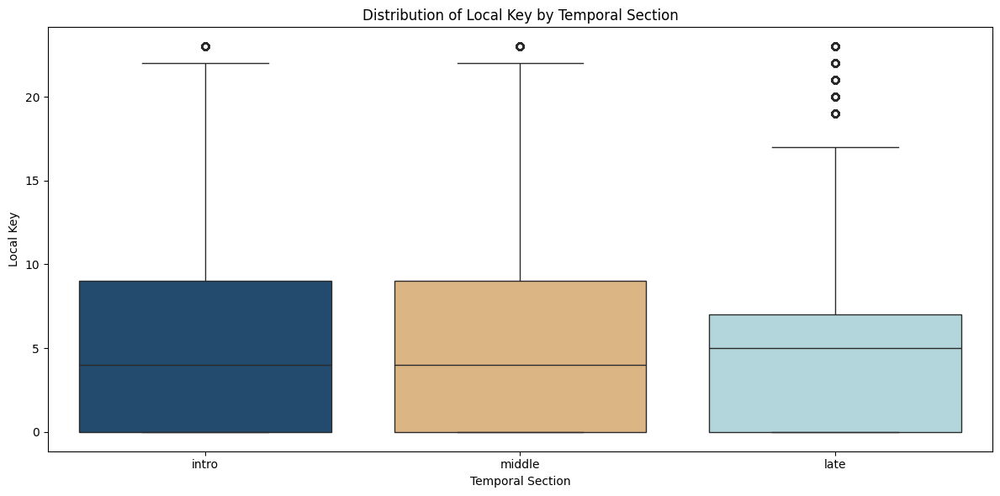

In [203]:
# Plot a boxplot of local_key distribution across temporal sections
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_notes_only, x='temporal_section', y='local_key', palette=colors)

# Set the plot title and axis labels in English
plt.title("Distribution of Local Key by Temporal Section")
plt.xlabel("Temporal Section")
plt.ylabel("Local Key")
plt.tight_layout()
plt.show()

##### 2.3.10.5 Distribution of Average Tonal Centers Across Measures

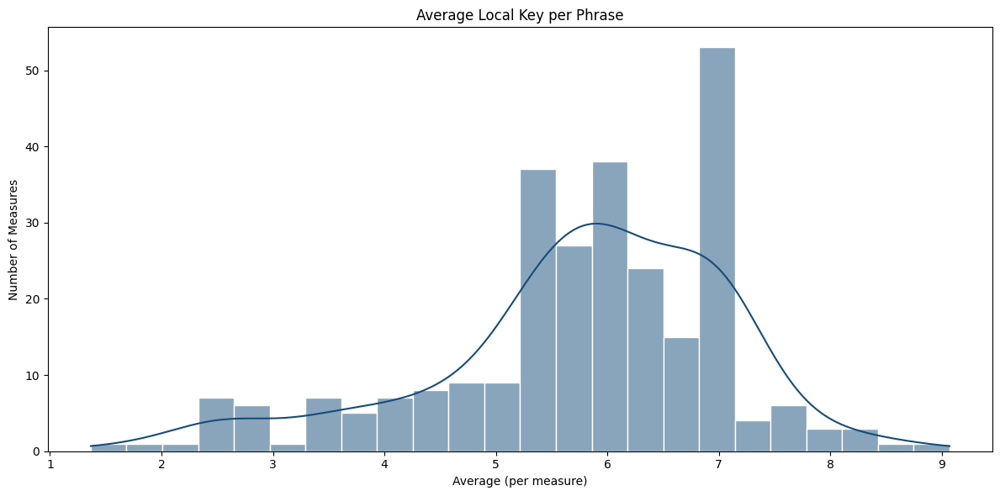

In [204]:
measure_stats = df_notes_only.groupby('measure')['local_key'].agg(['mean', 'std', 'count'])

# Plot the histogram
plt.figure(figsize=(12, 6))
sns.histplot(measure_stats['mean'], bins=24, kde=True, color=colors[0], edgecolor='white')
plt.title("Average Local Key per Phrase")
plt.xlabel("Average (per measure)")
plt.ylabel("Number of Measures")
plt.tight_layout()
plt.show()

##### 2.3.10.6 Local Key Entropy per Measure

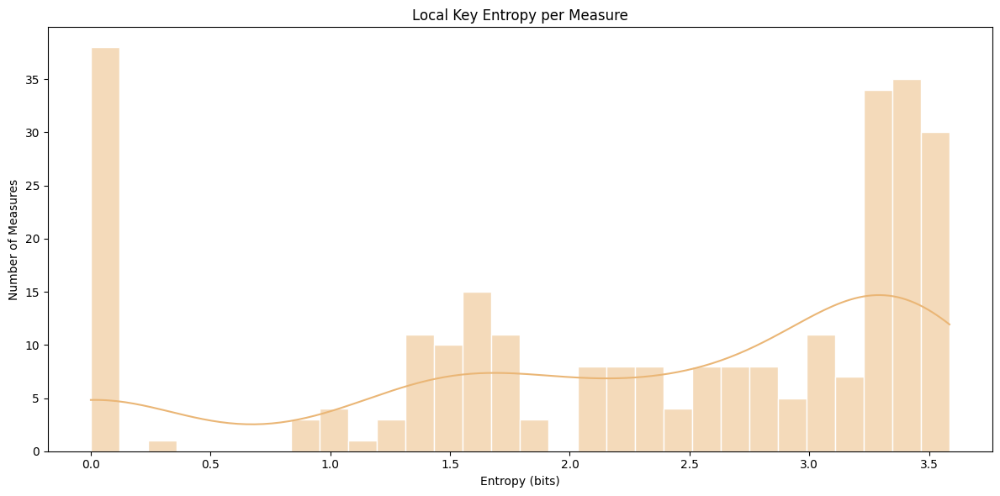

In [205]:
# Compute entropy of local_key distribution within each measure
def compute_local_key_entropy(group):
    return entropy(group['local_key'].value_counts(normalize=True), base=2)

# Apply entropy computation for each phrase
entropy_by_measure = df_notes_only.groupby('measure').apply(compute_local_key_entropy)

# Plot histogram of entropy values
plt.figure(figsize=(12, 6))
sns.histplot(entropy_by_measure, bins=30, color=colors[1], edgecolor='white', kde=True)
plt.title("Local Key Entropy per Measure")
plt.xlabel("Entropy (bits)")
plt.ylabel("Number of Measures")
plt.tight_layout()
plt.show()

In [206]:
# Simple anomaly detection for local_key feature
import pandas as pd
import numpy as np

# Assuming your dataframe is called 'df'
def check_local_key_anomalies(df):
    # Filter out silences (assuming local_key != -1 or similar for silences)
    active_data = df[df['local_key'].notna() & (df['local_key'] >= 0)]
    
    print("=== LOCAL KEY ANOMALY CHECK ===")
    
    # 1. Check for impossible values (should be 0-23 for chromatic scale)
    invalid_keys = active_data[active_data['local_key'] > 23]
    print(f"Invalid keys (>23): {len(invalid_keys)} rows")
    if len(invalid_keys) > 0:
        print(f"Invalid values: {sorted(invalid_keys['local_key'].unique())}")
    
    # 2. Check for extreme outliers (Z-score > 3)
    z_scores = np.abs((active_data['local_key'] - active_data['local_key'].mean()) / active_data['local_key'].std())
    extreme_outliers = active_data[z_scores > 3]
    print(f"Extreme outliers (Z-score > 3): {len(extreme_outliers)} rows ({len(extreme_outliers)/len(active_data)*100:.2f}%)")
    
    # 3. Check distribution by file
    file_stats = active_data.groupby('filename')['local_key'].agg(['count', 'mean', 'std', 'min', 'max'])
    suspicious_files = file_stats[(file_stats['std'] > 10) | (file_stats['mean'] > 15)]
    print(f"Files with suspicious stats: {len(suspicious_files)}")
    
    # 4. Check for duplicate consecutive values (potential parsing errors)
    active_data_sorted = active_data.sort_values(['filename', 'onset'])
    consecutive_duplicates = 0
    for filename in active_data_sorted['filename'].unique():
        file_data = active_data_sorted[active_data_sorted['filename'] == filename]
        duplicates = (file_data['local_key'].diff() == 0).sum()
        if duplicates > len(file_data) * 0.8:  # More than 80% identical
            consecutive_duplicates += 1
    print(f"Files with >80% identical consecutive keys: {consecutive_duplicates}")
    
    # 5. Genre-specific anomalies
    genre_stats = active_data.groupby('genre')['local_key'].agg(['mean', 'std'])
    print("\nGenre means (flagging if mean > 12 or std > 8):")
    for genre, stats in genre_stats.iterrows():
        if stats['mean'] > 12 or stats['std'] > 8:
            print(f"  {genre}: mean={stats['mean']:.2f}, std={stats['std']:.2f} *SUSPICIOUS*")
    
    return {
        'invalid_keys': invalid_keys,
        'extreme_outliers': extreme_outliers,
        'suspicious_files': suspicious_files
    }

In [207]:
# Run the check
anomalies = check_local_key_anomalies(df_notes_only)

=== LOCAL KEY ANOMALY CHECK ===
Invalid keys (>23): 0 rows
Extreme outliers (Z-score > 3): 0 rows (0.00%)
Files with suspicious stats: 21
Files with >80% identical consecutive keys: 120

Genre means (flagging if mean > 12 or std > 8):
  dance: mean=8.57, std=9.54 *SUSPICIOUS*
  jazz: mean=12.07, std=6.88 *SUSPICIOUS*
  reggae: mean=6.00, std=8.99 *SUSPICIOUS*


In [208]:
# Deep investigation of local_key anomalies
import pandas as pd
import numpy as np

def investigate_anomalies(df):
    active_data = df[df['local_key'].notna() & (df['local_key'] >= 0)]
    
    print("=== DEEP ANOMALY INVESTIGATION ===\n")
    
    # 1. Investigate consecutive duplicates
    print("1. CONSECUTIVE DUPLICATES ANALYSIS:")
    file_duplicate_stats = []
    
    for filename in active_data['filename'].unique():
        file_data = active_data[active_data['filename'] == filename].sort_values('onset')
        if len(file_data) > 1:
            unique_ratio = len(file_data['local_key'].unique()) / len(file_data)
            most_common_key = file_data['local_key'].mode().iloc[0]
            most_common_ratio = (file_data['local_key'] == most_common_key).sum() / len(file_data)
            
            file_duplicate_stats.append({
                'filename': filename,
                'total_notes': len(file_data),
                'unique_keys': len(file_data['local_key'].unique()),
                'unique_ratio': unique_ratio,
                'most_common_key': most_common_key,
                'most_common_ratio': most_common_ratio,
                'genre': file_data['genre'].iloc[0]
            })
    
    dup_df = pd.DataFrame(file_duplicate_stats)
    
    # Show worst cases
    worst_cases = dup_df.nsmallest(5, 'unique_ratio')
    print("5 files with lowest key diversity:")
    for _, row in worst_cases.iterrows():
        print(f"  {row['filename']}: {row['unique_keys']}/{row['total_notes']} unique ({row['unique_ratio']:.3f}) - {row['genre']}")
    
    # 2. Check if it's genre-specific
    print(f"\n2. GENRE PATTERNS:")
    genre_diversity = dup_df.groupby('genre')['unique_ratio'].agg(['mean', 'std', 'min', 'max'])
    for genre, stats in genre_diversity.iterrows():
        if stats['mean'] < 0.1:  # Less than 10% diversity
            print(f"  {genre}: avg diversity {stats['mean']:.3f} *LOW DIVERSITY*")
    
    # 3. Check temporal patterns
    print(f"\n3. TEMPORAL PATTERNS:")
    for filename in worst_cases['filename'].head(3):
        file_data = active_data[active_data['filename'] == filename].sort_values('onset')
        key_changes = (file_data['local_key'].diff() != 0).sum()
        duration = file_data['onset'].max() - file_data['onset'].min()
        print(f"  {filename}: {key_changes} key changes over {duration:.1f} beats")
        print(f"    Key sequence: {file_data['local_key'].head(10).tolist()}...")
    
    # 4. Check for stuck values
    print(f"\n4. STUCK VALUES CHECK:")
    stuck_files = dup_df[dup_df['most_common_ratio'] > 0.95]  # >95% same key
    print(f"Files with >95% identical keys: {len(stuck_files)}")
    if len(stuck_files) > 0:
        print("Sample stuck files:")
        for _, row in stuck_files.head(3).iterrows():
            print(f"  {row['filename']}: {row['most_common_ratio']:.3f} stuck on key {row['most_common_key']}")
    
    # 5. Cross-check with other features
    print(f"\n5. CORRELATION CHECK:")
    if 'key' in df.columns:
        key_mismatch = active_data[active_data['local_key'] != active_data['key']]
        print(f"Local key != global key: {len(key_mismatch)}/{len(active_data)} ({len(key_mismatch)/len(active_data)*100:.1f}%)")
    
    return dup_df, stuck_files

In [209]:
# Run investigation
dup_analysis, stuck_analysis = investigate_anomalies(df_notes_only)

=== DEEP ANOMALY INVESTIGATION ===

1. CONSECUTIVE DUPLICATES ANALYSIS:
5 files with lowest key diversity:
  Get Ready for This.mid: 1/13630 unique (0.000) - dance
  Symphony No. 6 in F major, Op. 68 "Pastoral": V. Allegretto.mid: 1/13424 unique (0.000) - classical
  Why I Sing the Blues.mid: 1/10380 unique (0.000) - blues
  Good Times.mid: 1/9255 unique (0.000) - disco
  Serenade D-Dur KV 250 (248b) "Haffner-Serenade" - 1. Allegro maestoso - Allegro molto.mid: 1/9168 unique (0.000) - classical

2. GENRE PATTERNS:
  alternative_rock: avg diversity 0.000 *LOW DIVERSITY*
  blues: avg diversity 0.000 *LOW DIVERSITY*
  classical: avg diversity 0.001 *LOW DIVERSITY*
  country: avg diversity 0.000 *LOW DIVERSITY*
  dance: avg diversity 0.000 *LOW DIVERSITY*
  disco: avg diversity 0.000 *LOW DIVERSITY*
  heavy_metal: avg diversity 0.000 *LOW DIVERSITY*
  jazz: avg diversity 0.000 *LOW DIVERSITY*
  new_age: avg diversity 0.000 *LOW DIVERSITY*
  pop: avg diversity 0.000 *LOW DIVERSITY*
  rap: a

#### 2.3.11 Time Signature

##### 2.3.11.1 Feature Transformation: Encoding Metrical Structure from time_signature for Quantitative Analysis

In [ ]:
# Get unique time signature values in the dataset
df['time_signature'].unique()

array(['4/4', '3/4', '6/4'], dtype=object)

In [ ]:
# Function to convert time_signature into two numerical features
def encode_time_signature(ts):

    try:
        if '/' not in ts:
            return [None, None]
        numerator, denominator = map(int, ts.split('/'))
        nb_beats = numerator

        # Ternary if it's a multiple of 3 and numerator >= 6
        if numerator % 3 == 0 and numerator >= 6:
            rhythmic_division = 1
        else:
            rhythmic_division = 0

        return [nb_beats, rhythmic_division]
    except:
        return [None, None]

In [ ]:
df[['nb_beats', 'rhythmic_division']] = df['time_signature'].apply(lambda x: pd.Series(encode_time_signature(x)))
df_notes_only[['nb_beats', 'rhythmic_division']] = df_notes_only['time_signature'].apply(lambda x: pd.Series(encode_time_signature(x)))

##### 2.3.11.2 Central Tendency and Spread of Time Signature Values

In [ ]:
# Descriptive stats
print(df['time_signature'].describe())
print("\n", df['time_signature'].value_counts())

count     223830
unique         3
top          4/4
freq      211775
Name: time_signature, dtype: object

 time_signature
4/4    211775
3/4      8031
6/4      4024
Name: count, dtype: int64


In [ ]:
print(df['nb_beats'].describe())

count    223830.000000
mean          4.000076
std           0.328317
min           3.000000
25%           4.000000
50%           4.000000
75%           4.000000
max           6.000000
Name: nb_beats, dtype: float64


In [ ]:
print(df['rhythmic_division'].describe())
print("\n", df['rhythmic_division'].value_counts())

count    223830.000000
mean          0.017978
std           0.132871
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: rhythmic_division, dtype: float64

 rhythmic_division
0    219806
1      4024
Name: count, dtype: int64


##### 2.3.11.3 Time Signature Values in Context: Key, Instrument, and Genre

In [ ]:
# Descriptive statistics of time signature values by key
print("Time Signature statistics by Key:")
df.groupby('key')[['nb_beats', 'rhythmic_division']].describe().sort_index()

Time Signature statistics by Key:


nb_beats                                             rhythmic_division  \
       count     mean       std  min  25%  50%  75%  max             count   
key                                                                          
0    11652.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0           11652.0   
1    12046.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0           12046.0   
2     6587.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0            6587.0   
3    32432.0  4.24815  0.659344  4.0  4.0  4.0  4.0  6.0           32432.0   
4    17937.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0           17937.0   
5    11837.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0           11837.0   
6     6411.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0            6411.0   
7     2628.0  3.00000  0.000000  3.0  3.0  3.0  3.0  3.0            2628.0   
9     5482.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0            5482.0   
10    4128.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0            4128.0   
11    1710.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0            1710.0   
12   15126.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0           15126.0   
13    5878.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0            5878.0   
14    6510.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0            6510.0   
15    2142.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0            2142.0   
16   12767.0  3.57680  0.494086  3.0  3.0  4.0  4.0  4.0           12767.0   
17   12124.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0           12124.0   
19   19248.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0           19248.0   
21   12860.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0           12860.0   
23   24325.0  4.00000  0.000000  4.0  4.0  4.0  4.0  4.0           24325.0   

                                                  
         mean       std  min  25%  50%  75%  max  
key                                               
0    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
1    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
2    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
3    0.124075  0.329672  0.0  0.0  0.0  0.0  1.0  
4    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
5    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
6    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
7    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
9    0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
10   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
11   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
12   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
13   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
14   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
15   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
16   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
17   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
19   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
21   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0  
23   0.000000  0.000000  0.0  0.0  0.0  0.0  0.0

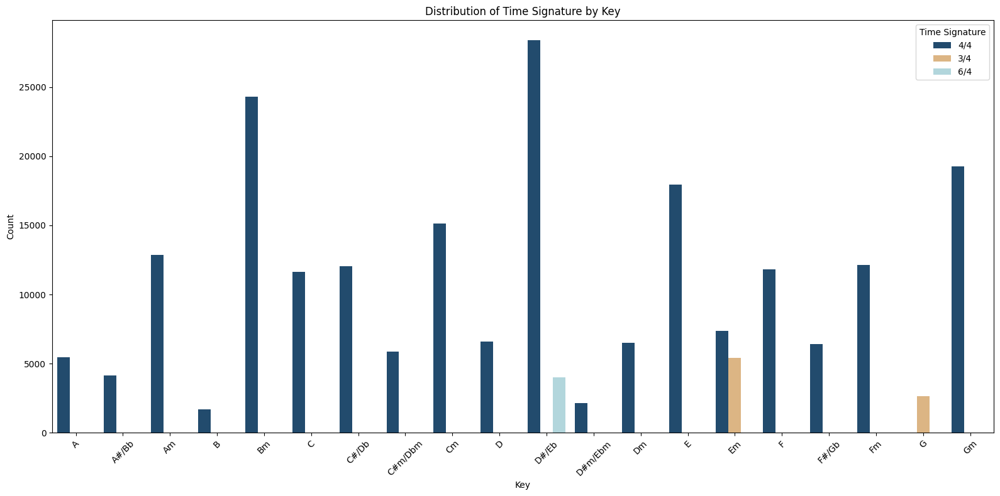

In [ ]:
# Count plot for time signature by key
plt.figure(figsize=(16, 8))
sns.countplot(x=df['key_name'], hue=df['time_signature'], order=ordered_key_names, palette=colors)
plt.title('Distribution of Time Signature by Key')
plt.xlabel('Key')
plt.ylabel('Count')
plt.legend(title='Time Signature')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# Descriptive statistics of time signature values by instrument
print("Time Signature statistics by Instrument:")
df.groupby('instrument')[['nb_beats', 'rhythmic_division']].describe().sort_index()

Time Signature statistics by Instrument:


nb_beats                                               \
                    count      mean       std  min  25%  50%  75%  max   
instrument                                                               
Acoustic Guitar   18986.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Bagpipes           6886.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Bassoon            2605.0  3.000000  0.000000  3.0  3.0  3.0  3.0  3.0   
Brass                 3.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Celesta            6501.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Choir              2805.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Clarinet           1134.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Electric Bass      6534.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Electric Guitar   21234.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Electric Organ     4461.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Flute                18.0  3.000000  0.000000  3.0  3.0  3.0  3.0  3.0   
Fretless Bass         1.0  4.000000       NaN  4.0  4.0  4.0  4.0  4.0   
Glockenspiel        288.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Harp                  1.0  4.000000       NaN  4.0  4.0  4.0  4.0  4.0   
Harpsichord         170.0  6.000000  0.000000  6.0  6.0  6.0  6.0  6.0   
Oboe                  1.0  4.000000       NaN  4.0  4.0  4.0  4.0  4.0   
Ocarina             856.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Piano             55255.0  3.973088  0.161827  3.0  4.0  4.0  4.0  4.0   
Piccolo            1879.0  3.000000  0.000000  3.0  3.0  3.0  3.0  3.0   
Sampler           40007.0  3.993876  0.078017  3.0  4.0  4.0  4.0  4.0   
Shamisen              1.0  4.000000       NaN  4.0  4.0  4.0  4.0  4.0   
StringInstrument  10135.0  3.999704  0.017203  3.0  4.0  4.0  4.0  4.0   
Taiko              2832.0  5.869350  0.494284  4.0  6.0  6.0  6.0  6.0   
Timpani            1838.0  3.166485  0.687019  3.0  3.0  3.0  3.0  6.0   
Trombone           7349.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Tuba                  8.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Unknown            6854.0  3.991538  0.091607  3.0  4.0  4.0  4.0  4.0   
Vibraphone         1105.0  6.000000  0.000000  6.0  6.0  6.0  6.0  6.0   
Violoncello         463.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Voice             17476.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Whistle            6144.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   

                 rhythmic_division                                          \
                             count      mean       std  min  25%  50%  75%   
instrument                                                                   
Acoustic Guitar            18986.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Bagpipes                    6886.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Bassoon                     2605.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Brass                          3.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Celesta                     6501.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Choir                       2805.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Clarinet                    1134.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Electric Bass               6534.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Electric Guitar            21234.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Electric Organ              4461.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Flute                         18.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Fretless Bass                  1.0  0.000000       NaN  0.0  0.0  0.0  0.0   
Glockenspiel                 288.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Harp                           1.0  0.000000       NaN  0.0  0.0  0.0  0.0   
Harpsichord                  170.0  1.000000  0.000000  1.0  1.0  1.0  1.0   
Oboe                           1.0  0.000000       NaN  0.0  0.0  0.0  0.0   
Ocarina           

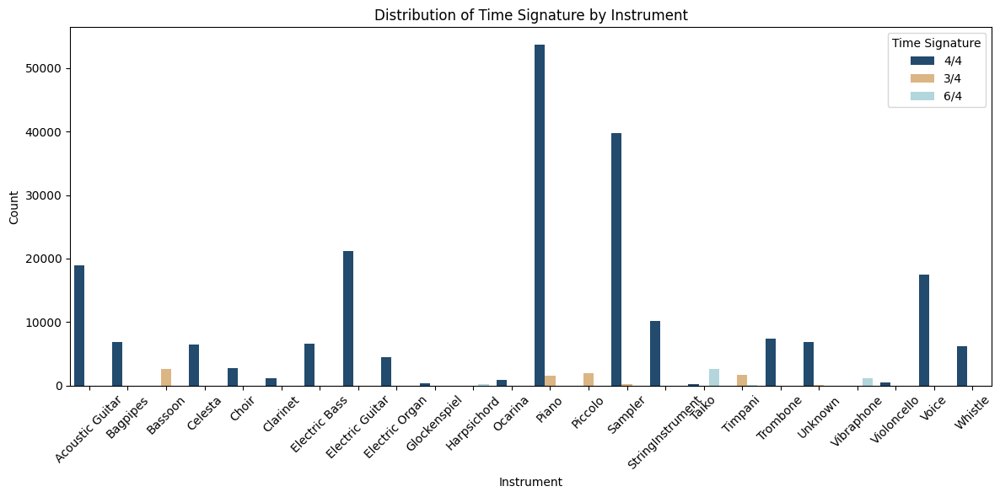

In [ ]:
# Count plot for time signature by instrument
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='instrument', hue='time_signature', palette=colors, order=alphabetic_order)
plt.title('Distribution of Time Signature by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Count')
plt.legend(title='Time Signature')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# Descriptive statistics of time signature values by instrument family
print("Time Signature statistics by Instrument Family:")
df.groupby('instrument_family')[['nb_beats', 'rhythmic_division']].describe().sort_index()

Time Signature statistics by Instrument Family:


nb_beats                                               \
                     count      mean       std  min  25%  50%  75%  max   
instrument_family                                                         
Bass                6535.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Brass               7357.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Electronic         40007.0  3.993876  0.078017  3.0  4.0  4.0  4.0  4.0   
Guitar             40220.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Keyboard           66387.0  3.982723  0.179844  3.0  4.0  4.0  4.0  6.0   
Other              15707.0  4.137009  0.516083  3.0  4.0  4.0  4.0  6.0   
Percussion          4958.0  4.758774  1.411607  3.0  3.0  6.0  6.0  6.0   
Strings            10598.0  3.999717  0.016823  3.0  4.0  4.0  4.0  4.0   
Voice              20281.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
Woodwind           11780.0  3.617827  0.485939  3.0  3.0  4.0  4.0  4.0   

                  rhythmic_division                                          \
                              count      mean       std  min  25%  50%  75%   
instrument_family                                                             
Bass                         6535.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Brass                        7357.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Electronic                  40007.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Guitar                      40220.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Keyboard                    66387.0  0.002561  0.050539  0.0  0.0  0.0  0.0   
Other                       15707.0  0.070351  0.255745  0.0  0.0  0.0  0.0   
Percussion                   4958.0  0.554457  0.497076  0.0  0.0  1.0  1.0   
Strings                     10598.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Voice                       20281.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
Woodwind                    11780.0  0.000000  0.000000  0.0  0.0  0.0  0.0   

                        
                   max  
instrument_family       
Bass               0.0  
Brass              0.0  
Electronic         0.0  
Guitar             0.0  
Keyboard           1.0  
Other              1.0  
Percussion         1.0  
Strings            0.0  
Voice              0.0  
Woodwind           0.0

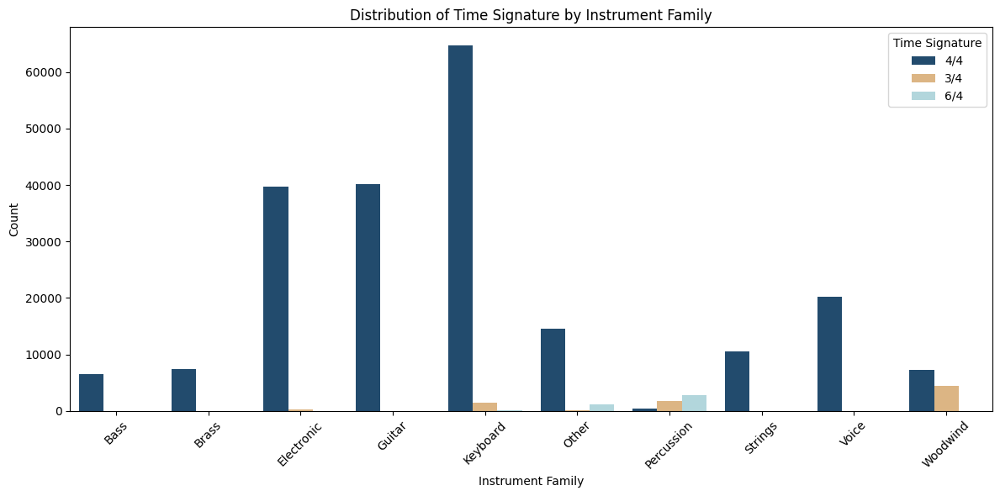

In [ ]:
# Count plot for time signature by instrument family
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='instrument_family', hue='time_signature', palette=colors, order=families)
plt.title('Distribution of Time Signature by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Count')
plt.legend(title='Time Signature')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

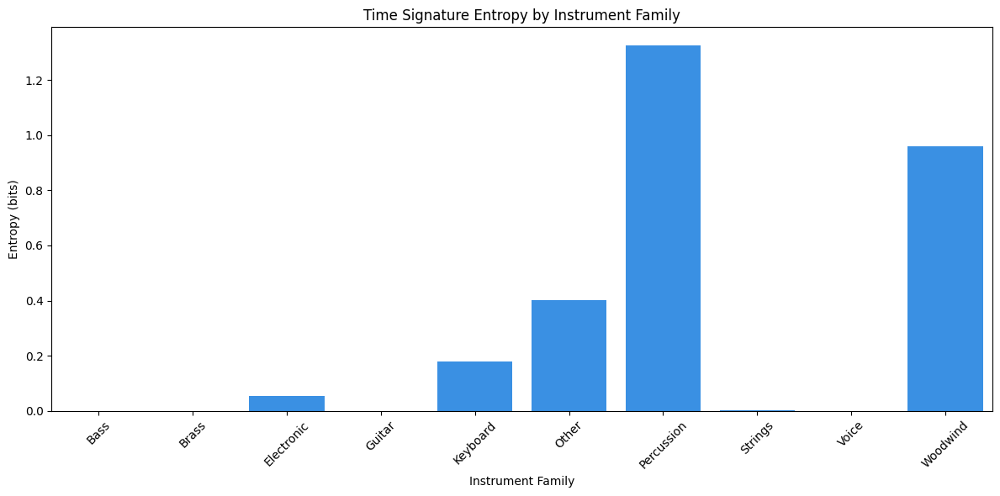

In [ ]:
# Compute entropy of time_signature distribution per instrument family
def compute_ts_entropy(group):
    return entropy(group['time_signature'].value_counts(normalize=True), base=2)

ts_entropy_by_instrfam = df.groupby('instrument_family').apply(compute_ts_entropy)

plt.figure(figsize=(12, 6))
sns.barplot(x=ts_entropy_by_instrfam.index, y=ts_entropy_by_instrfam.values, color='dodgerblue')
plt.title("Time Signature Entropy by Instrument Family")
plt.xlabel("Instrument Family")
plt.ylabel("Entropy (bits)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

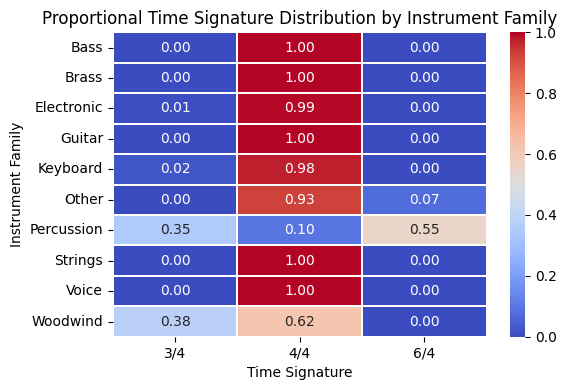

In [ ]:
# Crosstab and normalize by instrument family
ts_instrfam_ratio = (
    pd.crosstab(df['instrument_family'], df['time_signature'], normalize='index')
)

# Plot
plt.figure(figsize=(6, 4))
sns.heatmap(ts_instrfam_ratio, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.2)
plt.title("Proportional Time Signature Distribution by Instrument Family")
plt.xlabel("Time Signature")
plt.ylabel("Instrument Family")
plt.tight_layout()
plt.show()

In [ ]:
# Descriptive statistics of time signature values by genre
print("Time Signature statistics by Genre:")
df.groupby('genre')[['nb_beats', 'rhythmic_division']].describe().sort_index()

Time Signature statistics by Genre:


nb_beats                                               \
                    count      mean       std  min  25%  50%  75%  max   
genre                                                                    
alternative_rock   8878.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
blues             10184.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
classical         10173.0  3.741669  0.437738  3.0  3.0  4.0  4.0  4.0   
country           20690.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
dance              9658.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
disco             13343.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
heavy_metal       10838.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
jazz              15127.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
new_age           17543.0  4.150772  1.096740  3.0  3.0  4.0  4.0  6.0   
pop               17299.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
rap               20989.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
reggae            22552.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
rnb               18310.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
rock               9565.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   
soul              18681.0  4.000000  0.000000  4.0  4.0  4.0  4.0  4.0   

                 rhythmic_division                                          \
                             count      mean       std  min  25%  50%  75%   
genre                                                                        
alternative_rock            8878.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
blues                      10184.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
classical                  10173.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
country                    20690.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
dance                       9658.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
disco                      13343.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
heavy_metal                10838.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
jazz                       15127.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
new_age                    17543.0  0.229379  0.420446  0.0  0.0  0.0  0.0   
pop                        17299.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
rap                        20989.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
reggae                     22552.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
rnb                        18310.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
rock                        9565.0  0.000000  0.000000  0.0  0.0  0.0  0.0   
soul                       18681.0  0.000000  0.000000  0.0  0.0  0.0  0.0   

                       
                  max  
genre                  
alternative_rock  0.0  
blues             0.0  
classical         0.0  
country           0.0  
dance             0.0  
disco             0.0  
heavy_metal       0.0  
jazz              0.0  
new_age           1.0  
pop               0.0  
rap               0.0  
reggae            0.0  
rnb               0.0  
rock              0.0  
soul              0.0

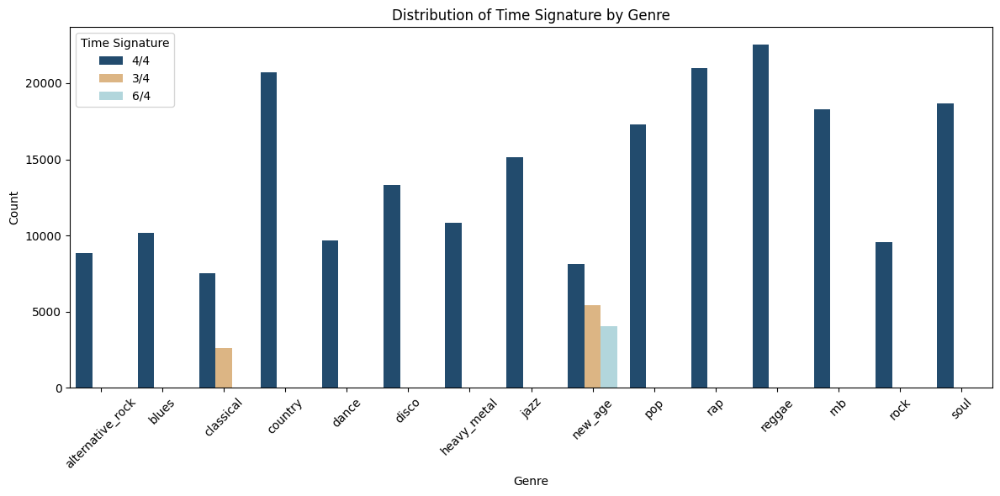

In [ ]:
# Count plot for time signature by genre
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='genre', hue='time_signature', palette=colors, order=genres_sorted)
plt.title('Distribution of Time Signature by Genre')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.legend(title='Time Signature')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

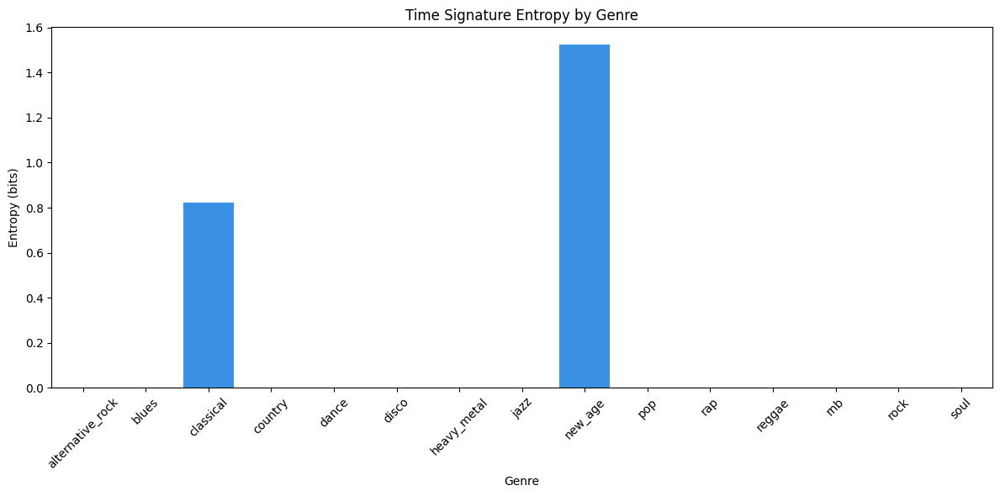

In [ ]:
ts_entropy_by_genre = df.groupby('genre').apply(compute_ts_entropy)

# Plot results
plt.figure(figsize=(12, 6))
sns.barplot(x=ts_entropy_by_genre.index, y=ts_entropy_by_genre.values, color='dodgerblue')
plt.title("Time Signature Entropy by Genre")
plt.xlabel("Genre")
plt.ylabel("Entropy (bits)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### 2.3.11.4 Temporal Distribution of Metrical Signatures Across Musical Sections

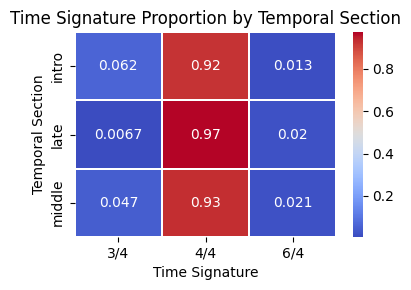

In [ ]:
# Compute normalized distribution of time signatures across temporal sections
ts_temporal = pd.crosstab(df['temporal_section'], df['time_signature'], normalize='index')

# Visualize as a heatmap for easy comparison across sections and signatures
plt.figure(figsize=(4, 3))
sns.heatmap(ts_temporal, annot=True, cmap="coolwarm", linewidths=0.2)
plt.title("Time Signature Proportion by Temporal Section")
plt.xlabel("Time Signature")
plt.ylabel("Temporal Section")
plt.tight_layout()
plt.show()

##### 2.3.11.5 Intra-Phrasal Rhythmic Modulation: Number of Time Signature Changes per Measure

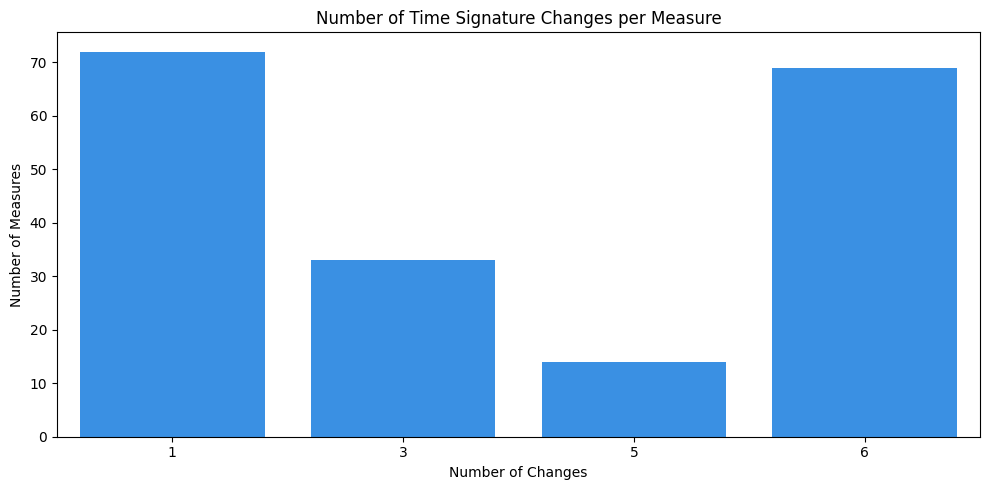

In [ ]:
# Count number of time_signature changes within each measure
# A change is detected when a time_signature differs from the previous one
df['ts_change'] = df.groupby('measure')['time_signature'].transform(lambda x: (x != x.shift()).astype(int))
ts_change_stats = df.groupby('measure')['ts_change'].sum() - 1
ts_change_stats = ts_change_stats.clip(lower=0)  


# Count how many changes occur per measure (excluding initial NaNs)
ts_change_stats = df.groupby('measure')['ts_change'].sum().value_counts().sort_index()

# Plot the distribution of number of time signature changes per phrase
plt.figure(figsize=(10, 5))
sns.barplot(x=ts_change_stats.index, y=ts_change_stats.values, color='dodgerblue')
plt.title("Number of Time Signature Changes per Measure")
plt.xlabel("Number of Changes")
plt.ylabel("Number of Measures")
plt.tight_layout()
plt.show()

#### 2.3.12 Measure

##### 2.3.12.1 Central Tendency and Spread of Measures

In [ ]:
# Descriptive stats: proportion and spread of measures
df['measure'].describe()

count    223830.000000
mean         56.610919
std          35.340081
min           1.000000
25%          29.000000
50%          53.000000
75%          79.000000
max         188.000000
Name: measure, dtype: float64

In [ ]:
# Central tendency
mean_measure = df['measure'].mean()
median_measure = df['measure'].median()
mode_measure = df['measure'].mode()[0]  

# Spread
std_measure = df['measure'].std()

# Display results
print(f"Mean measure: {mean_measure:.2f}")
print(f"Median measure: {median_measure:.2f}")
print(f"Mode measure: {mode_measure:.2f}")
print(f"Standard measure: {std_measure:.2f}")

Mean measure: 56.61
Median measure: 53.00
Mode measure: 37.00
Standard measure: 35.34


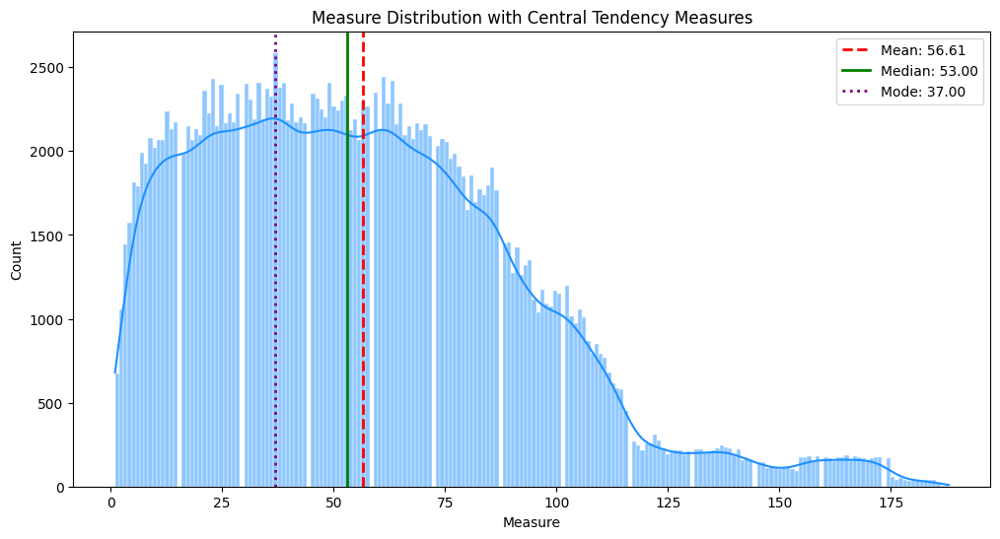

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(df['measure'], bins=200, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_measure, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_measure:.2f}')
plt.axvline(median_measure, color='green', linestyle='-', linewidth=2, label=f'Median: {median_measure:.2f}')
plt.axvline(mode_measure, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_measure:.2f}')

plt.title('Measure Distribution with Central Tendency Measures')
plt.xlabel('Measure')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.3.12.2 Identification of Temporal Outliers in Measure Counts

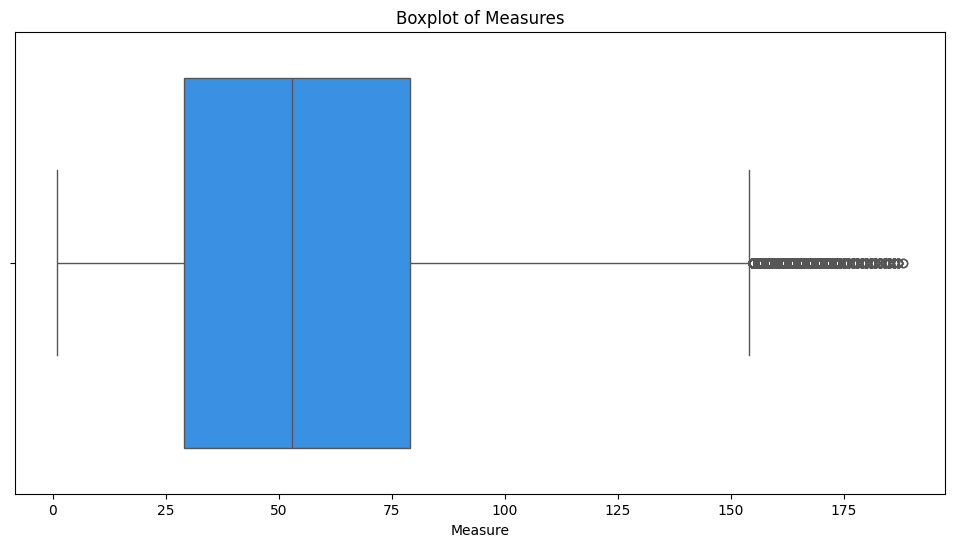

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['measure'], color='dodgerblue')
plt.title('Boxplot of Measures')
plt.xlabel('Measure')
plt.show()

In [ ]:
# Identify files with measures greater than 150
extreme_mesures = df[df['measure'] > 150]['filename'].unique()

# Verify tempo of files with extreme measures
for i in extreme_mesures:
    print(f"File: {i}, Tempo: {df[df['filename'] == i]['tempo'].unique()}")

File: I'm a Slave for You.mid, Tempo: [208.]
File: Amarok.mid, Tempo: [133.]


In [ ]:
# Modification of tempo for "I'm a Slave for You.mid" as it was incorrectly set to 208 (double-tempo)
mask = df['filename'] == "I'm a Slave for You.mid"
df.loc[mask, 'tempo'] = 110
df.loc[mask, 'measure'] = df.loc[mask, 'measure'] // 2

df_notes_only.loc[mask, 'tempo'] = 110
df_notes_only.loc[mask, 'measure'] = df_notes_only.loc[mask, 'measure'] // 2

##### 2.3.12.3 Measure in Context: Key, Instrument, and Genre

In [ ]:
# Descriptive statistics of measure by key
print("Measure statistics by Key:")
df.groupby('key')['measure'].describe().sort_index()

Measure statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,11652.0,60.948249,32.770595,1.0,33.0,61.0,91.0,116.0
1,12046.0,60.436161,35.718997,1.0,31.0,58.0,84.0,146.0
2,6587.0,44.241081,25.133525,1.0,23.0,44.0,64.0,109.0
3,32432.0,54.143901,31.387120,1.0,28.0,52.0,78.0,123.0
4,17937.0,51.436862,29.645084,1.0,27.0,50.0,77.0,112.0
5,11837.0,52.734139,29.397105,1.0,29.0,53.0,72.0,117.0
6,6411.0,76.972235,39.237807,1.0,45.0,78.0,115.0,141.0
7,2628.0,43.304033,23.328116,1.0,23.0,43.0,63.0,83.0
9,5482.0,47.489967,22.877548,1.0,29.0,48.0,67.0,88.0


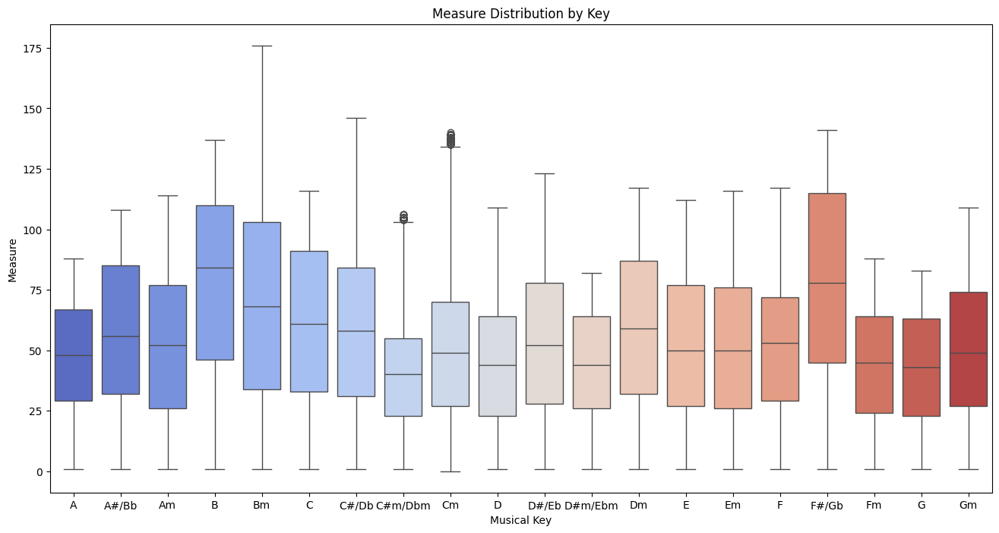

In [ ]:
# Measure distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='key_name', y='measure', order=ordered_key_names, palette='coolwarm')
plt.title('Measure Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Measure')
plt.show()


In [ ]:
# Descriptive statistics of measure by instrument
print("Measure statistics by Instrument:")
df.groupby('instrument')['measure'].describe()

Measure statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,18986.0,55.330717,35.254221,1.0,27.0,52.0,76.00,155.0
Bagpipes,6886.0,50.160180,26.397455,1.0,28.0,50.0,73.00,97.0
Bassoon,2605.0,43.671785,23.098636,2.0,24.0,44.0,63.00,83.0
Brass,3.0,0.666667,0.577350,0.0,0.5,1.0,1.00,1.0
Celesta,6501.0,60.235195,33.137892,1.0,32.0,59.0,87.00,117.0
Choir,2805.0,62.166488,31.812167,0.0,33.0,62.0,89.00,115.0
Clarinet,1134.0,43.462963,9.549515,19.0,36.0,43.0,51.75,61.0
Electric Bass,6534.0,57.565044,38.668957,0.0,30.0,50.0,76.00,153.0
Electric Guitar,21234.0,55.475605,34.523679,1.0,26.0,51.0,79.00,141.0


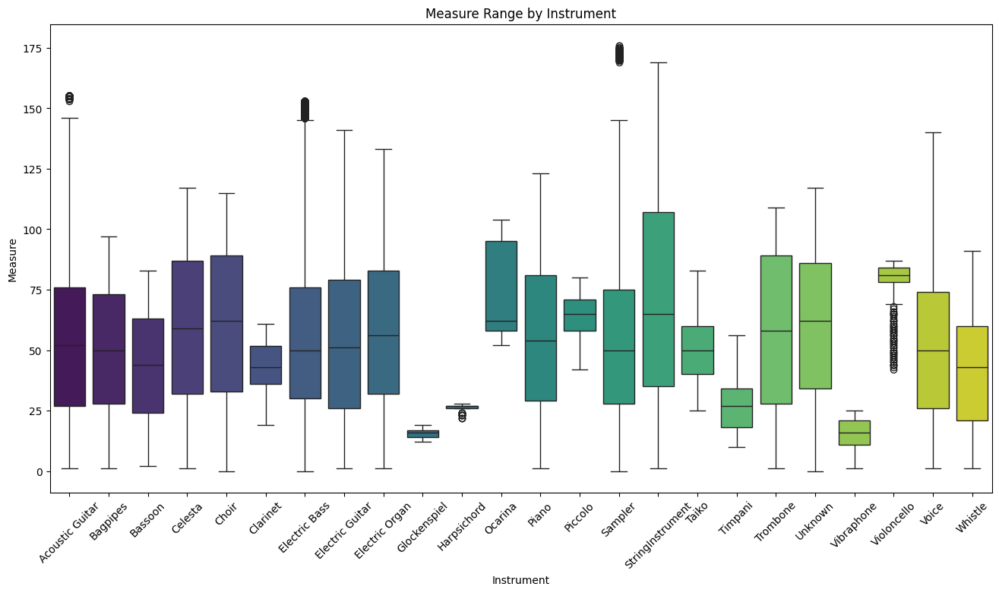

In [ ]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='instrument', y='measure', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Measure Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Measure')
plt.show()

In [ ]:
# Descriptive statistics of measure by instrument family
print("Measure statistics by Instrument Family:")
df.groupby('instrument_family')['measure'].describe()

Measure statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,6535.0,57.556389,38.672328,0.0,30.0,50.0,76.00,153.0
Brass,7357.0,57.226859,32.417919,1.0,28.0,58.0,89.00,109.0
Electronic,40007.0,54.136776,34.662999,0.0,28.0,50.0,75.00,176.0
Guitar,40220.0,55.407210,34.870082,1.0,27.0,52.0,78.00,155.0
Keyboard,66387.0,56.457906,31.765876,1.0,29.0,55.0,82.00,133.0
Other,15707.0,53.171261,30.784711,0.0,25.0,55.0,78.00,117.0
Percussion,4958.0,39.561718,17.423632,10.0,27.0,38.0,53.75,83.0
Strings,10598.0,75.540196,49.387887,1.0,36.0,67.0,104.00,169.0
Voice,20281.0,53.687146,32.201108,0.0,27.0,51.0,78.00,140.0


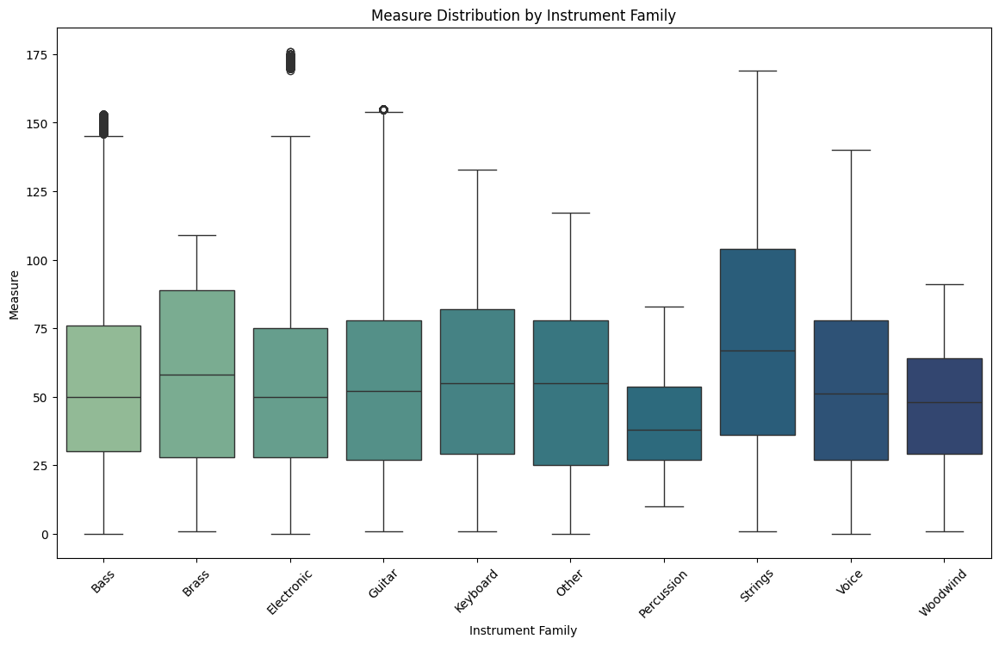

In [ ]:
# Filter and plot measure distribution by instrument family
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='instrument_family',
    y='measure',
    palette='crest',
    order=families
)
plt.title('Measure Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Measure')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Descriptive statistics of measure by genre
print("Measure statistics by Genre:")
df.groupby('genre')['measure'].describe()

Measure statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,8878.0,41.577833,24.301530,1.0,21.0,40.0,58.00,109.0
blues,10184.0,50.680381,27.499259,1.0,27.0,50.0,73.25,108.0
classical,10173.0,53.680625,31.309520,1.0,28.0,51.0,79.00,115.0
country,20690.0,64.398260,35.581327,1.0,35.0,62.0,89.00,141.0
dance,9658.0,68.814040,39.010772,1.0,37.0,65.0,99.00,146.0
disco,13343.0,55.626696,32.676489,1.0,28.0,54.0,77.00,137.0
heavy_metal,10838.0,53.861690,29.736112,1.0,29.0,54.0,77.00,114.0
jazz,15127.0,54.469822,30.753048,1.0,28.0,54.0,82.00,109.0
new_age,17543.0,79.267001,52.893239,1.0,34.0,64.0,132.00,176.0


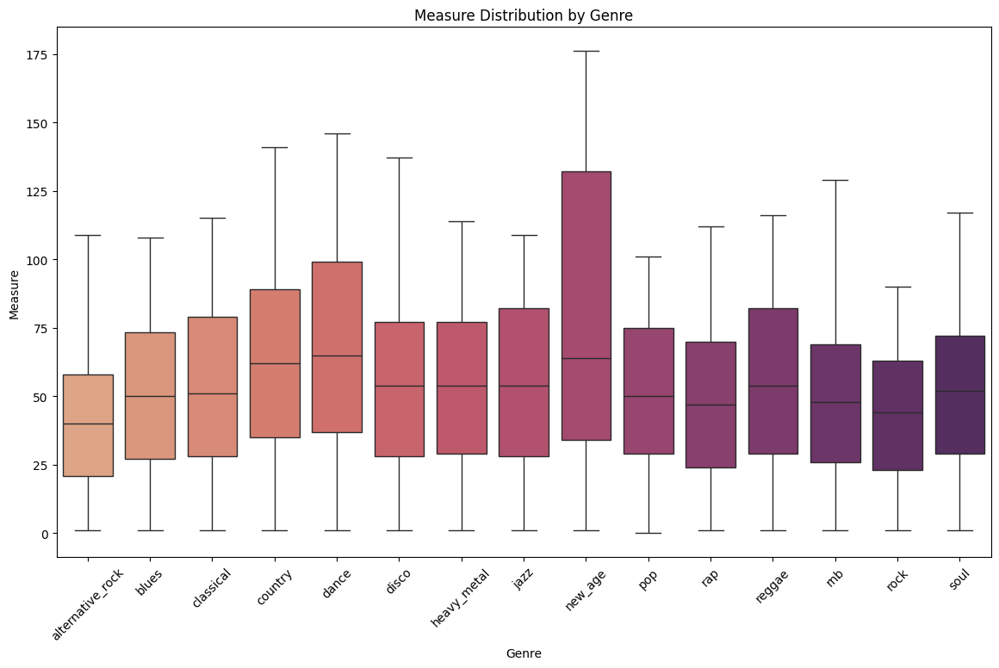

In [ ]:
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='genre',
    y='measure',
    palette='flare',
    order=genres_sorted
)
plt.title('Measure Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Measure')
plt.xticks(rotation=45)
plt.show()

##### 2.3.12.4 Metric Weight vs Measure

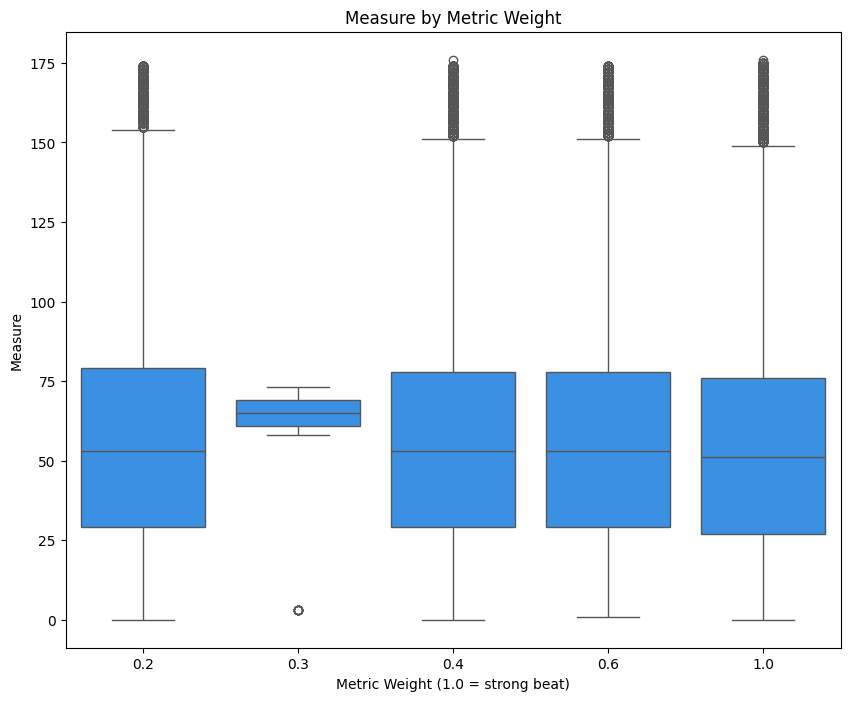

In [ ]:
# Set the figure size
plt.figure(figsize=(10, 8))

# Create a boxplot showing how measure varies with metric weight
sns.boxplot(data=df, x="metric_weight", y="measure", color='dodgerblue')
plt.title("Measure by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Measure")
plt.show()

##### 2.3.12.5 Distribution of Measure Indices Across Temporal Sections

<Axes: xlabel='temporal_section', ylabel='measure'>

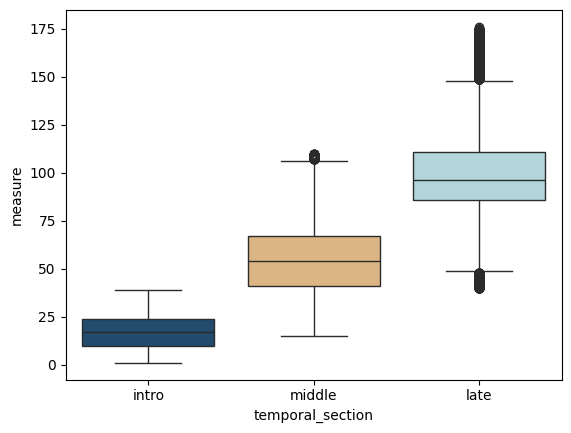

In [ ]:
sns.boxplot(data=df, x="temporal_section", y="measure", palette=colors)

#### 2.3.13 Beat Position

##### 2.3.13.1 Feature Transformation: Encoding Beat Positions for Quantitative Analysis

In [ ]:
# Cleaning function to parse string fractions like "5/3" into float
def parse_fraction(val):
    try:
        if isinstance(val, (int, float)):
            return float(val)
        if isinstance(val, Fraction):
            return float(val)
        return float(Fraction(str(val).strip()))
    except:
        return None

# Apply the conversion to the 'beat_position' column
df['beat_position_float'] = df['beat_position'].apply(parse_fraction)
df_notes_only['beat_position_float'] = df_notes_only['beat_position'].apply(parse_fraction)

# Check the success rate of the conversion
nan_ratio = df['beat_position_float'].isna().mean()
print(f"NaN rate after parsing: {nan_ratio:.2%}")

NaN rate after parsing: 0.00%


In [ ]:
df['division_label'] = df['rhythmic_division'].map({0: 'Binary', 1: 'Ternary'})
df_notes_only['division_label'] = df_notes_only['rhythmic_division'].map({0: 'Binary', 1: 'Ternary'})

##### 2.3.13.2 Central Tendency and Spread of Beat Position


In [ ]:
df['beat_position_float'].describe()

count    223830.00000
mean          2.61179
std           1.22783
min           1.00000
25%           1.50000
50%           2.50000
75%           3.75000
max           7.00000
Name: beat_position_float, dtype: float64

In [ ]:
# Central tendency
mean_beat_position_float = df['beat_position_float'].mean()
median_beat_position_float = df['beat_position_float'].median()
mode_vals = df['beat_position_float'].mode()
mode_beat_position_float = mode_vals.iloc[0] if not mode_vals.empty else np.nan

# Spread
std_beat_position_float = df['beat_position_float'].std()

# Display results
print(f"Mean beat position: {mean_beat_position_float:.2f}")
print(f"Median beat position: {median_beat_position_float:.2f}")
print(f"Mode beat position: {mode_beat_position_float:.2f}")
print(f"Standard beat position: {std_beat_position_float:.2f}")

Mean beat position: 2.61
Median beat position: 2.50
Mode beat position: 1.00
Standard beat position: 1.23


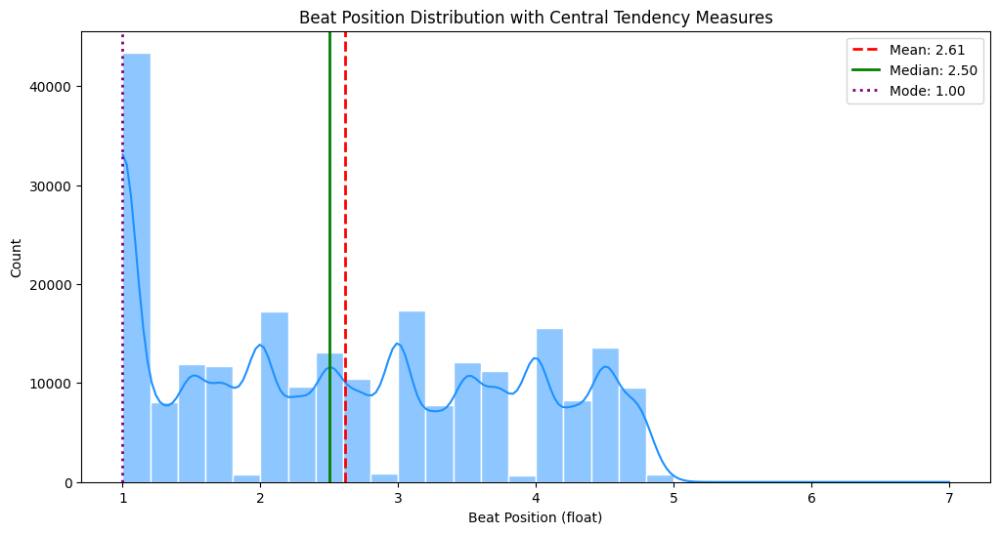

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(df['beat_position_float'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_beat_position_float, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_beat_position_float:.2f}')
plt.axvline(median_beat_position_float, color='green', linestyle='-', linewidth=2, label=f'Median: {median_beat_position_float:.2f}')
plt.axvline(mode_beat_position_float, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_beat_position_float:.2f}')

plt.title('Beat Position Distribution with Central Tendency Measures')
plt.xlabel('Beat Position (float)')
plt.ylabel('Count')
plt.legend()
plt.show()

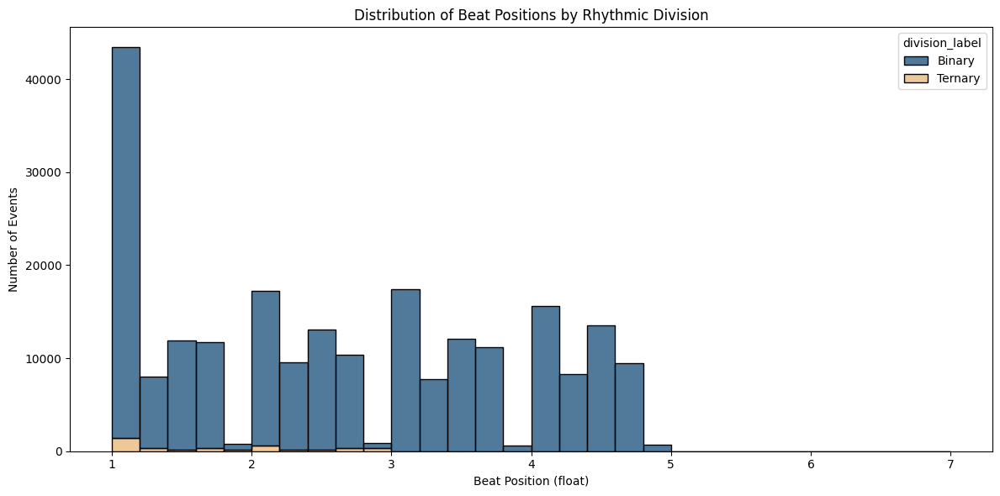

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='beat_position_float', hue='division_label', bins=30, multiple='stack', palette=colors)
plt.title("Distribution of Beat Positions by Rhythmic Division")
plt.xlabel("Beat Position (float)")
plt.ylabel("Number of Events")
plt.tight_layout()
plt.show()

##### 2.3.13.3 Outlier Detection in Beat Positions


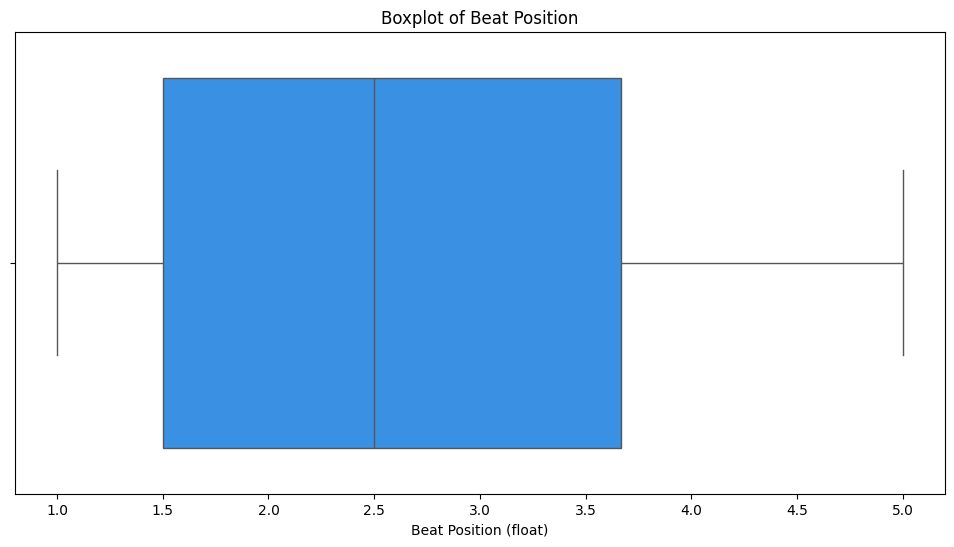

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_notes_only['beat_position_float'], color='dodgerblue')
plt.title('Boxplot of Beat Position')
plt.xlabel('Beat Position (float)')
plt.show()

##### 2.3.13.4 Beat Position in Context: Key, Instrument, and Genre

In [ ]:
# Descriptive statistics of beat position by key
print("Beat Position statistics by Key:")
df.groupby('key')['beat_position_float'].describe().sort_index()

Beat Position statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,11652.0,2.656583,1.236641,1.0,1.500000,2.500000,3.750000,4.916667
1,12046.0,2.729910,1.230724,1.0,1.500000,2.750000,4.000000,4.750000
2,6587.0,2.615379,1.164433,1.0,1.750000,2.500000,3.500000,7.000000
3,32432.0,2.546842,1.226343,1.0,1.500000,2.500000,3.666667,4.916667
4,17937.0,2.605257,1.215521,1.0,1.500000,2.500000,3.750000,4.916667
5,11837.0,2.673714,1.236662,1.0,1.500000,2.750000,3.750000,4.916667
6,6411.0,2.841873,1.218172,1.0,1.750000,2.750000,4.000000,4.916667
7,2628.0,2.174150,0.936548,1.0,1.000000,2.000000,3.000000,3.750000
9,5482.0,2.679040,1.228023,1.0,1.500000,2.500000,4.000000,4.916667


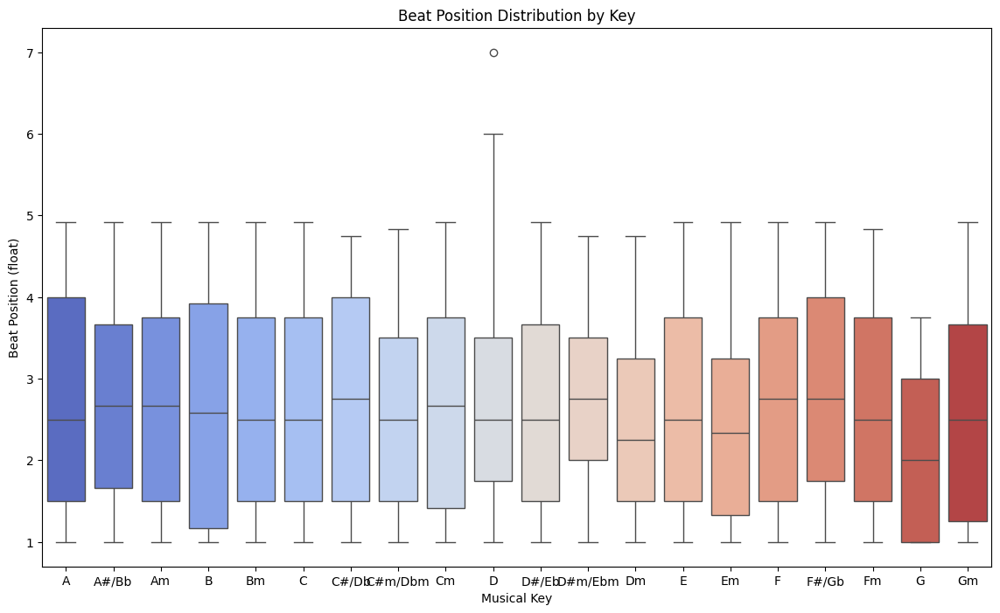

In [ ]:
# Beat position distribution across keys to show tonal variation.
plt.figure(figsize=(14,8))
sns.boxplot(x=df['key_name'], y=df['beat_position_float'], order=ordered_key_names, palette='coolwarm')
plt.title('Beat Position Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Beat Position (float)')
plt.show()

In [ ]:
# Descriptive statistics of beat position values by instrument
print("Beat position statistics by Instrument:")
df.groupby('instrument')['beat_position_float'].describe()

Beat position statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,18986.0,2.771863,1.205922,1.000000,1.666667,2.750000,3.750000,4.750000
Bagpipes,6886.0,2.731775,1.239995,1.000000,1.500000,2.750000,4.000000,4.750000
Bassoon,2605.0,2.181286,0.936108,1.000000,1.000000,2.000000,3.000000,3.750000
Brass,3.0,2.888889,1.539601,2.000000,2.000000,2.000000,3.333333,4.666667
Celesta,6501.0,2.443381,1.138996,1.000000,1.500000,2.250000,3.250000,4.750000
Choir,2805.0,2.509507,1.255170,1.000000,1.000000,2.500000,3.583333,4.833333
Clarinet,1134.0,2.514771,1.230206,1.000000,1.500000,2.375000,3.500000,4.750000
Electric Bass,6534.0,2.530329,1.239751,1.000000,1.500000,2.333333,3.500000,4.916667
Electric Guitar,21234.0,2.727006,1.229456,1.000000,1.666667,2.666667,3.750000,4.916667


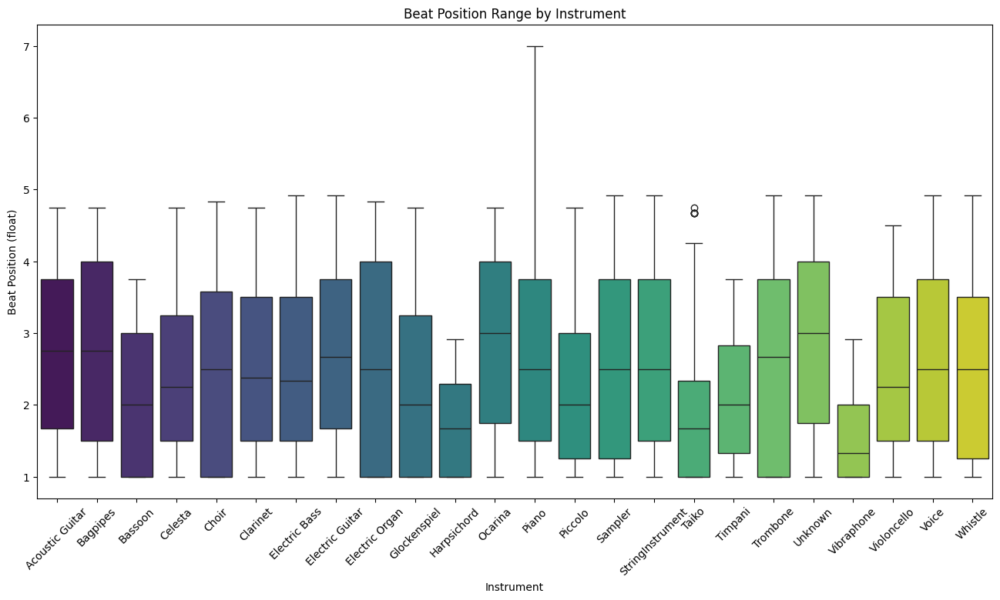

In [ ]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='instrument', y='beat_position_float', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Beat Position Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Beat Position (float)')
plt.show()

In [ ]:
# Descriptive statistics of beat position by instrument family
print("Beat Position statistics by Instrument Family:")
df.groupby('instrument_family')['beat_position_float'].describe()

Beat Position statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,6535.0,2.530362,1.239660,1.0,1.500000,2.333333,3.500000,4.916667
Brass,7357.0,2.586120,1.281596,1.0,1.000000,2.666667,3.750000,4.916667
Electronic,40007.0,2.571469,1.255355,1.0,1.250000,2.500000,3.750000,4.916667
Guitar,40220.0,2.748181,1.218594,1.0,1.666667,2.750000,3.750000,4.916667
Keyboard,66387.0,2.628449,1.219164,1.0,1.500000,2.500000,3.750000,7.000000
Other,15707.0,2.676545,1.229976,1.0,1.500000,2.666667,3.750000,4.916667
Percussion,4958.0,1.906145,0.810458,1.0,1.000000,1.833333,2.583333,4.750000
Strings,10598.0,2.626769,1.258909,1.0,1.500000,2.500000,3.750000,4.916667
Voice,20281.0,2.647766,1.231988,1.0,1.500000,2.500000,3.750000,4.916667


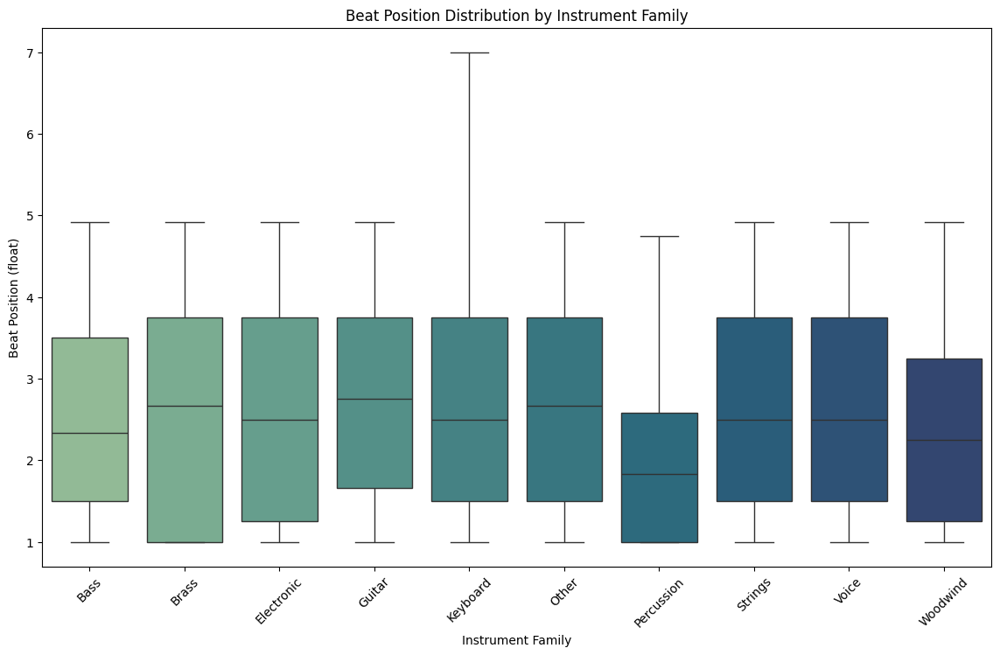

In [ ]:
# Filter and plot beat position distribution by instrument family
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='instrument_family',
    y='beat_position_float',
    palette='crest',
    order=families
)
plt.title('Beat Position Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Beat Position (float)')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Descriptive statistics of beat position by genre
print("Beat Position statistics by Genre:")
df.groupby('genre')['beat_position_float'].describe()

Beat Position statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,8878.0,2.582789,1.174606,1.0,1.500000,2.500000,3.500000,4.750000
blues,10184.0,2.757135,1.236011,1.0,1.583333,2.750000,3.750000,4.916667
classical,10173.0,2.576395,1.163991,1.0,1.500000,2.500000,3.500000,4.916667
country,20690.0,2.754000,1.208733,1.0,1.750000,2.750000,3.750000,4.916667
dance,9658.0,2.775290,1.218641,1.0,1.666667,2.750000,3.916667,4.916667
disco,13343.0,2.517075,1.214938,1.0,1.333333,2.500000,3.500000,4.916667
heavy_metal,10838.0,2.619256,1.272685,1.0,1.250000,2.500000,3.750000,4.916667
jazz,15127.0,2.626446,1.256461,1.0,1.333333,2.666667,3.750000,4.916667
new_age,17543.0,2.204901,1.103979,1.0,1.000000,2.000000,3.000000,4.916667


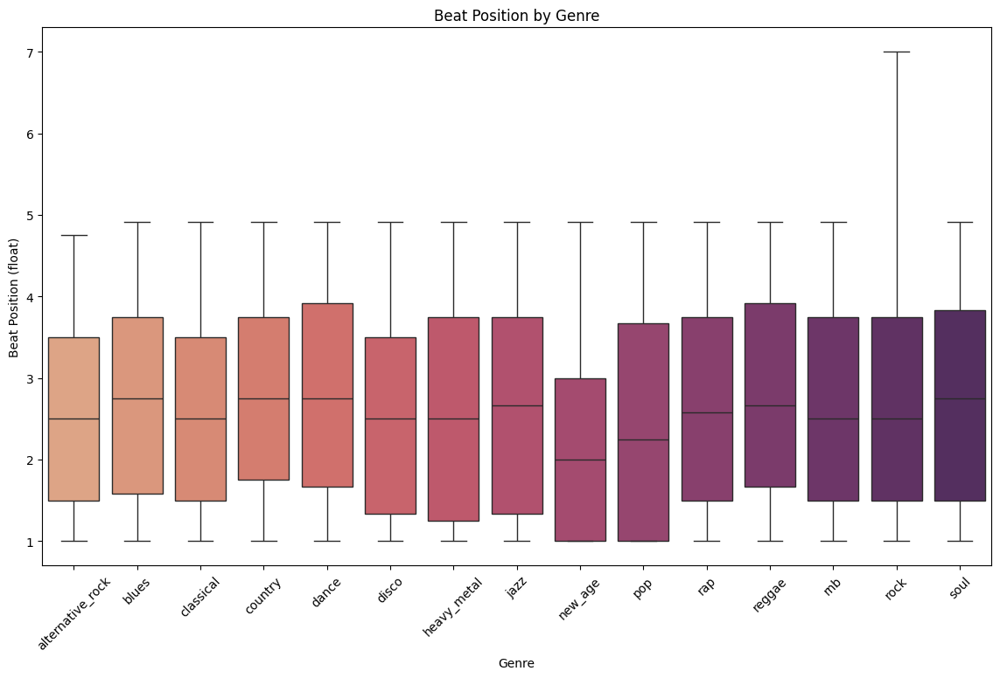

In [ ]:
plt.figure(figsize=(14,8))
sns.boxplot(
    data=df,
    x='genre',
    y='beat_position_float',
    palette='flare',
    order=genres_sorted
)
plt.title('Beat Position by Genre')
plt.xlabel('Genre')
plt.ylabel('Beat Position (float)')
plt.xticks(rotation=45)
plt.show()

##### 2.3.13.5 Beat Position vs. Metric Weight and Chord Tone

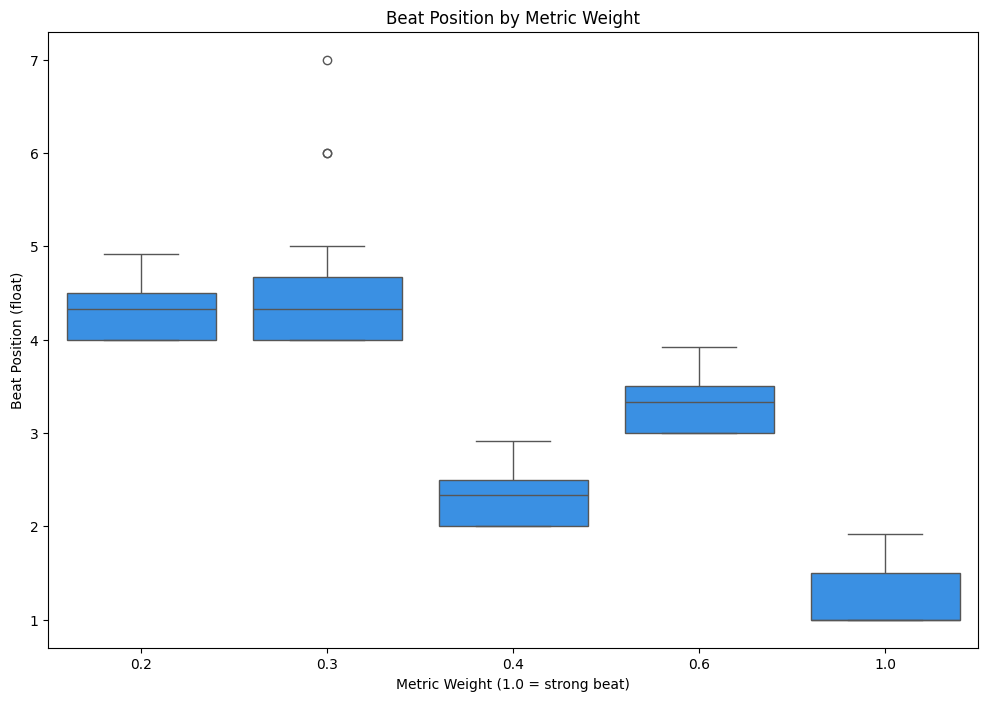

In [ ]:
# Set the figure size
plt.figure(figsize=(12, 8))

# Create a boxplot showing how beat position varies with metric weight
sns.boxplot(data=df, x="metric_weight", y="beat_position_float", color='dodgerblue')
plt.title("Beat Position by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Beat Position (float)")
plt.show()

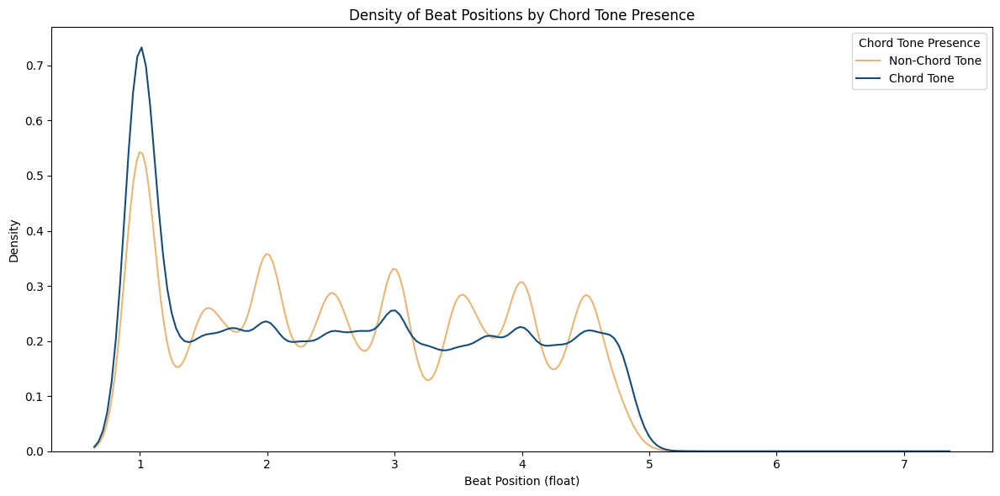

In [ ]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df, x="beat_position_float", hue="is_chord_tone", common_norm=False, palette=colors)
plt.title("Density of Beat Positions by Chord Tone Presence")
plt.xlabel("Beat Position (float)")
plt.ylabel("Density")
plt.legend(labels=custom_labels, title="Chord Tone Presence")
plt.tight_layout()
plt.show()

#### 2.3.14 Beat Fraction

##### 2.3.14.1 Feature Transformation: Encoding Beat Fractions for Quantitative Analysis

In [ ]:
df['beat_fraction_float'] = df['beat_fraction'].apply(lambda x: float(Fraction(str(x).strip())))
df_notes_only['beat_fraction_float'] = df_notes_only['beat_fraction'].apply(lambda x: float(Fraction(str(x).strip())))

nan_ratio = df['beat_fraction_float'].isna().mean()
assert nan_ratio < 0.01, f"Too many invalid beat_fraction values: {nan_ratio:.2%}"

##### 2.3.14.2 Central Tendency and Spread of Beat Fraction


In [ ]:
df['beat_fraction_float'].describe()

count    223830.000000
mean          0.656772
std           0.310969
min           0.166667
25%           0.375000
50%           0.625000
75%           0.937500
max           1.750000
Name: beat_fraction_float, dtype: float64

In [ ]:
# Central tendency
mean_beat_fraction_float = df['beat_fraction_float'].mean()
median_beat_fraction_float = df['beat_fraction_float'].median()
mode_beat_fraction_float = df['beat_fraction_float'].mode()[0]

# Spread
std_beat_fraction_float = df['beat_fraction_float'].std()

# Display results
print(f"Mean beat fraction: {mean_beat_fraction_float:.2f}")
print(f"Median beat fraction: {median_beat_fraction_float:.2f}")
print(f"Mode beat fraction: {mode_beat_fraction_float:.2f}")
print(f"Standard beat fraction: {std_beat_fraction_float:.2f}")

Mean beat fraction: 0.66
Median beat fraction: 0.62
Mode beat fraction: 0.25
Standard beat fraction: 0.31


In [ ]:
df[df['beat_position_float'] > df['nb_beats']][['time_signature', 'beat_position', 'beat_position_float', 'nb_beats']].sample(10)

,time_signature,beat_position,beat_position_float,nb_beats
157370,4/4,4.5,4.500000,4
128435,4/4,14/3,4.666667,4
183837,4/4,4.75,4.750000,4
133855,3/4,3.25,3.250000,3
12989,4/4,4.5,4.500000,4
67181,4/4,4.25,4.250000,4
104326,4/4,53/12,4.416667,4
223257,4/4,49/12,4.083333,4
24880,4/4,4.25,4.250000,4
66273,4/4,4.5,4.500000,4


In [ ]:
# Filter out invalid beat positions
df_rhythm = df[df['beat_position_float'] <= df['nb_beats']].copy()

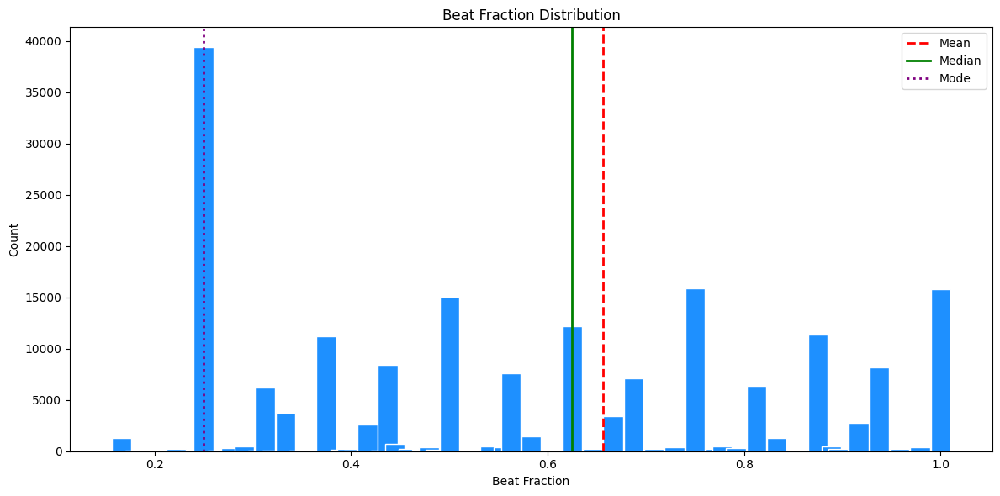

In [ ]:
# Count and sort unique values
beat_fraction_counts = df_rhythm['beat_fraction_float'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
plt.bar(beat_fraction_counts.index, beat_fraction_counts.values, width=0.02, color='dodgerblue', edgecolor='white')

plt.axvline(mean_beat_fraction_float, color='red', linestyle='--', linewidth=2, label='Mean')
plt.axvline(median_beat_fraction_float, color='green', linestyle='-', linewidth=2, label='Median')
plt.axvline(mode_beat_fraction_float, color='purple', linestyle=':', linewidth=2, label='Mode')

plt.title('Beat Fraction Distribution')
plt.xlabel('Beat Fraction')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()

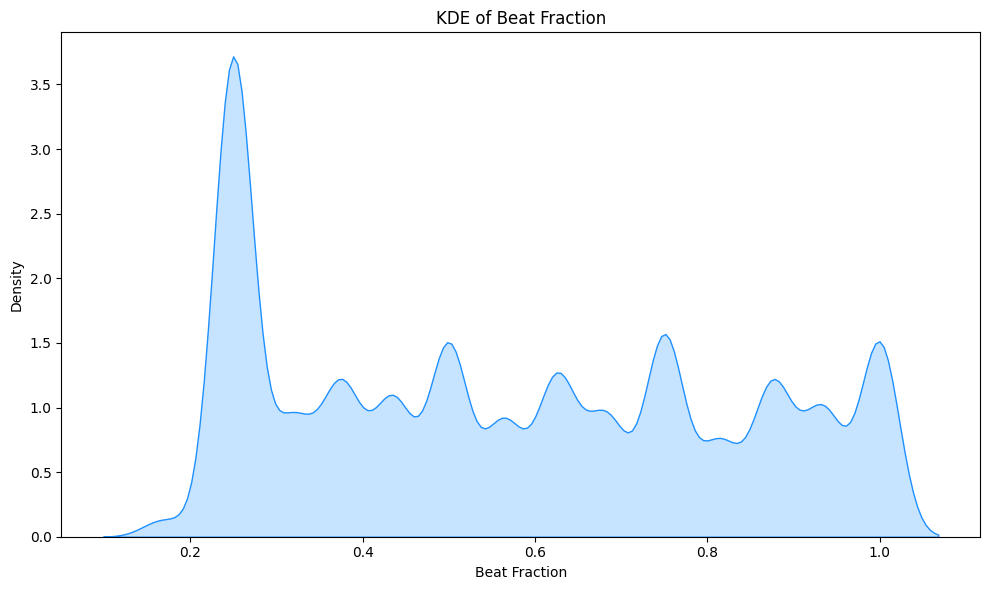

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(df_rhythm['beat_fraction_float'], shade=True, color='dodgerblue')
plt.title("KDE of Beat Fraction")
plt.xlabel("Beat Fraction")
plt.tight_layout()
plt.show()

##### 2.3.14.3 Rhythmic Division and Beat Fraction


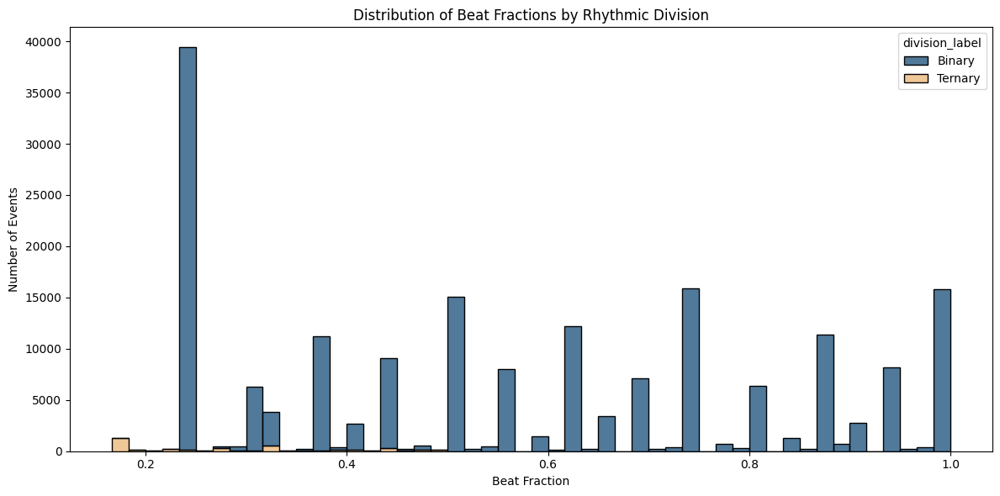

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df_rhythm, x='beat_fraction_float', hue='division_label', bins=50, multiple='stack', palette=colors)
plt.title("Distribution of Beat Fractions by Rhythmic Division")
plt.xlabel("Beat Fraction")
plt.ylabel("Number of Events")
plt.tight_layout()
plt.show()

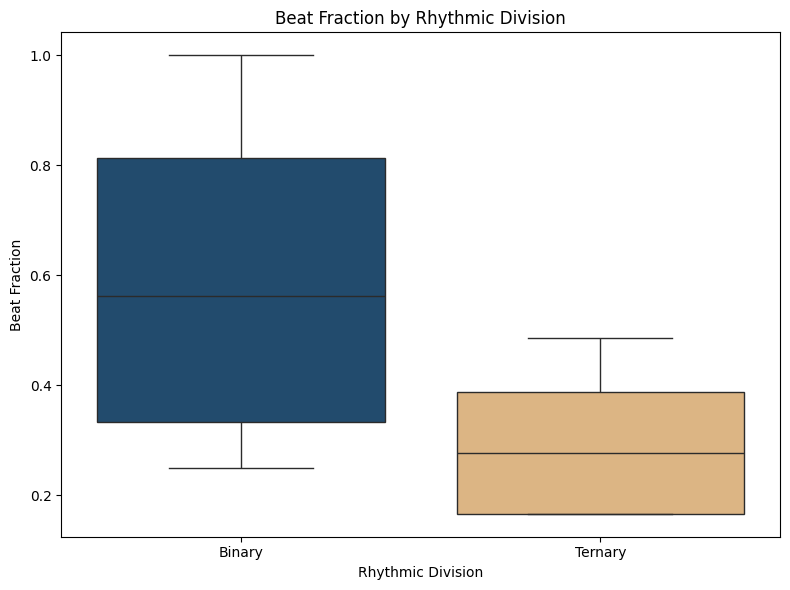

In [ ]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_rhythm, x='division_label', y='beat_fraction_float', palette=colors)
plt.title("Beat Fraction by Rhythmic Division")
plt.xlabel("Rhythmic Division")
plt.ylabel("Beat Fraction")
plt.tight_layout()
plt.show()

##### 2.3.14.4 Outlier Detection in Beat Fraction


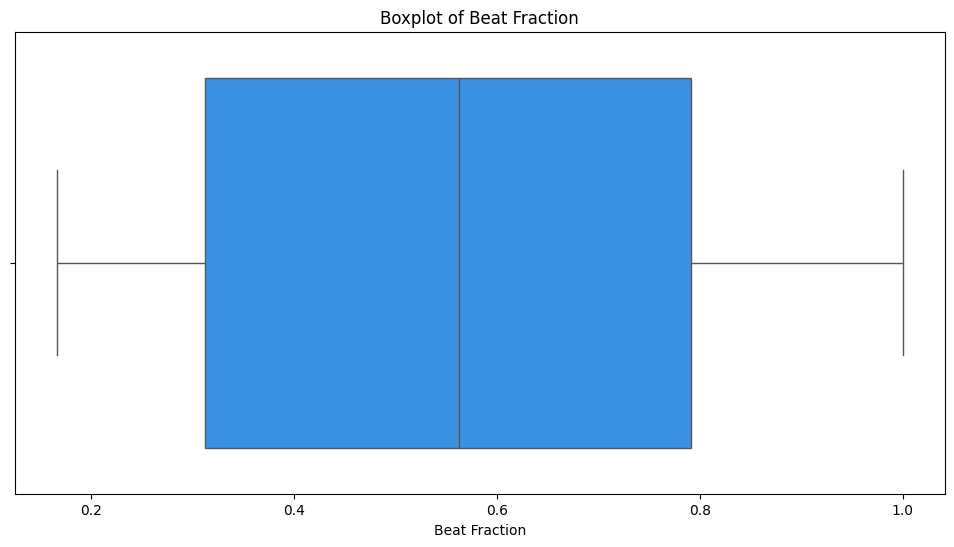

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_rhythm, x='beat_fraction_float', color='dodgerblue')
plt.title('Boxplot of Beat Fraction')
plt.xlabel('Beat Fraction')
plt.show()

##### 2.3.14.5 Beat Fraction in Context: Key, Instrument, and Genre

In [ ]:
# Descriptive statistics of beat position by key
print("Beat Fraction statistics by Key:")
df_rhythm.groupby('key')['beat_fraction_float'].describe().sort_index()

Beat Fraction statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,9894.0,0.583403,0.262595,0.250000,0.312500,0.562500,0.812500,1.0
1,10156.0,0.599931,0.261930,0.250000,0.375000,0.625000,0.875000,1.0
2,5644.0,0.574925,0.234265,0.250000,0.375000,0.562500,0.750000,1.0
3,28116.0,0.540314,0.265580,0.166667,0.250000,0.500000,0.750000,1.0
4,15253.0,0.567278,0.247183,0.250000,0.375000,0.500000,0.750000,1.0
5,9844.0,0.577844,0.256545,0.250000,0.312500,0.562500,0.812500,1.0
6,5171.0,0.609634,0.248386,0.250000,0.375000,0.625000,0.812500,1.0
7,2150.0,0.625090,0.252491,0.333333,0.333333,0.666667,0.833333,1.0
9,4610.0,0.584382,0.256758,0.250000,0.375000,0.541667,0.750000,1.0


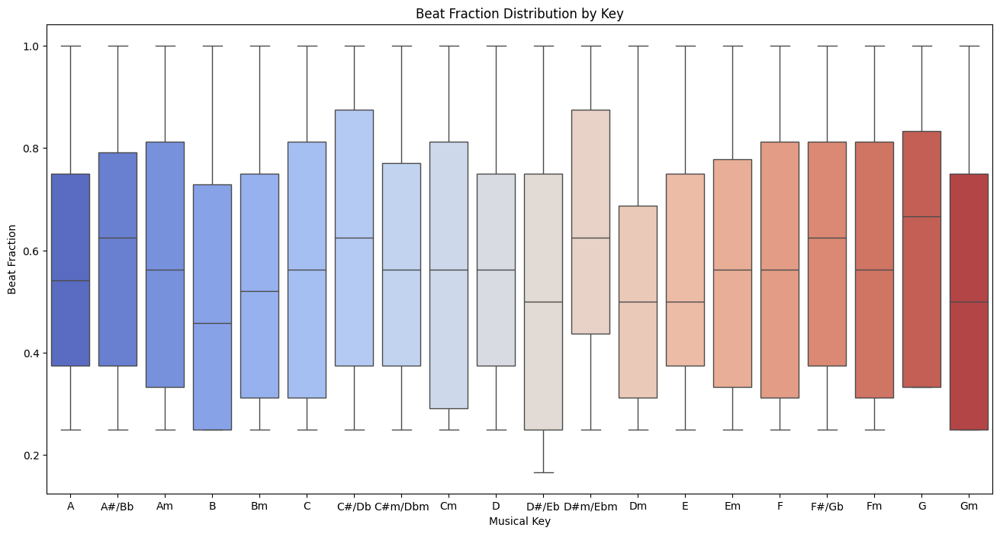

In [ ]:
# Beat fraction distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_rhythm, x='key_name', y='beat_fraction_float', order=ordered_key_names, palette='coolwarm')
plt.title('Beat Fraction Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Beat Fraction')
plt.show()

In [ ]:
# Descriptive statistics of beat fraction values by instrument
print("Beat fraction statistics by Instrument:")
df_rhythm.groupby('instrument')['beat_fraction_float'].describe()

Beat fraction statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,15930.0,0.609083,0.253499,0.250000,0.375000,0.625000,0.875000,1.000000
Bagpipes,5873.0,0.607054,0.270769,0.250000,0.375000,0.625000,0.875000,1.000000
Bassoon,2127.0,0.626926,0.252492,0.333333,0.333333,0.666667,0.833333,1.000000
Brass,2.0,0.500000,0.000000,0.500000,0.500000,0.500000,0.500000,0.500000
Celesta,5751.0,0.545210,0.232503,0.250000,0.312500,0.500000,0.687500,1.000000
Choir,2470.0,0.558502,0.268029,0.250000,0.250000,0.500000,0.750000,1.000000
Clarinet,993.0,0.557779,0.259440,0.250000,0.312500,0.500000,0.750000,1.000000
Electric Bass,5578.0,0.546477,0.248118,0.250000,0.312500,0.500000,0.750000,1.000000
Electric Guitar,17734.0,0.592929,0.254252,0.250000,0.375000,0.562500,0.812500,1.000000


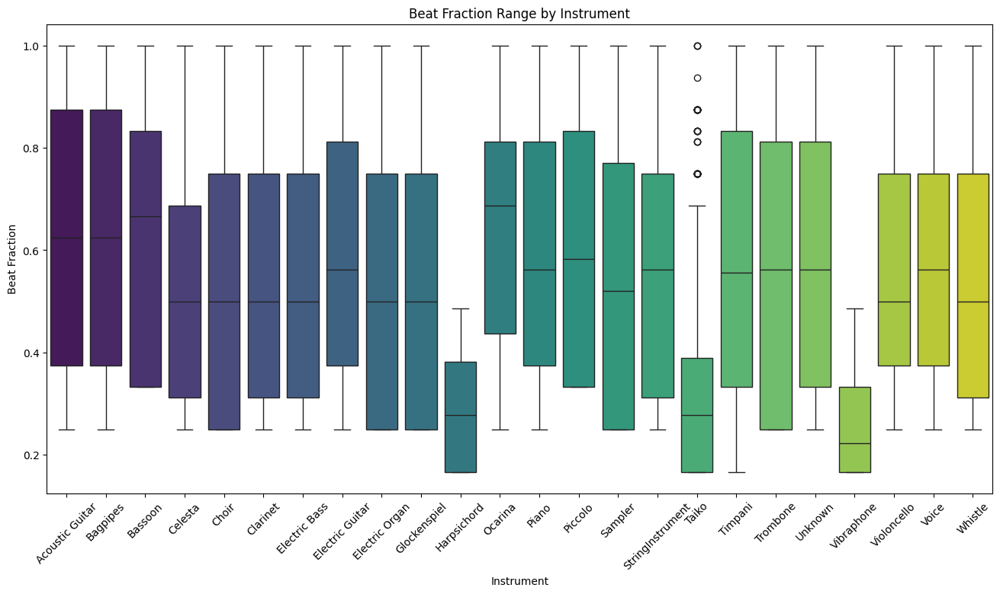

In [ ]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_rhythm, x='instrument', y='beat_fraction_float', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Beat Fraction Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Beat Fraction')
plt.show()

In [ ]:
# Descriptive statistics of beat fraction by instrument family
print("Beat Fraction statistics by Instrument Family:")
df_rhythm.groupby('instrument_family')['beat_fraction_float'].describe()

Beat Fraction statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,5579.0,0.546503,0.248103,0.250000,0.312500,0.500000,0.750000,1.0
Brass,6387.0,0.571963,0.274898,0.250000,0.250000,0.562500,0.812500,1.0
Electronic,34240.0,0.562347,0.262131,0.250000,0.250000,0.520833,0.770833,1.0
Guitar,33664.0,0.600573,0.254020,0.250000,0.375000,0.625000,0.812500,1.0
Keyboard,56379.0,0.577811,0.253168,0.166667,0.333333,0.562500,0.812500,1.0
Other,13310.0,0.577634,0.269573,0.166667,0.312500,0.562500,0.812500,1.0
Percussion,4735.0,0.421886,0.237952,0.166667,0.250000,0.333333,0.500000,1.0
Strings,8817.0,0.561491,0.254179,0.250000,0.312500,0.562500,0.750000,1.0
Voice,16896.0,0.569028,0.248397,0.250000,0.333333,0.541667,0.750000,1.0


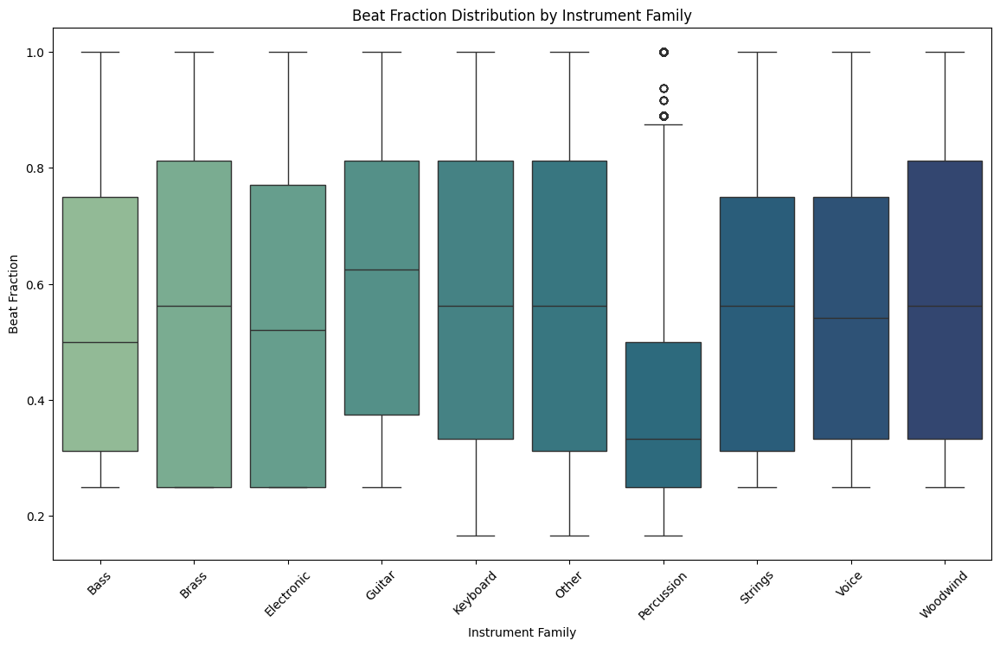

In [ ]:
# Filter and plot beat fraction distribution by instrument family
plt.figure(figsize=(14,8))
sns.boxplot(data=df_rhythm, x='instrument_family', y='beat_fraction_float', palette='crest', order=families)
plt.title('Beat Fraction Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Beat Fraction')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Descriptive statistics of beat fraction by genre
print("Beat Fraction statistics by Genre:")
df_rhythm.groupby('genre')['beat_fraction_float'].describe()

Beat Fraction statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,7877.0,0.585785,0.255142,0.250000,0.375000,0.562500,0.750000,1.0
blues,8338.0,0.591934,0.252403,0.250000,0.375000,0.583333,0.812500,1.0
classical,8553.0,0.604562,0.250476,0.250000,0.375000,0.625000,0.833333,1.0
country,17230.0,0.600695,0.251159,0.250000,0.375000,0.625000,0.812500,1.0
dance,7846.0,0.594201,0.246630,0.250000,0.375000,0.625000,0.812500,1.0
disco,11526.0,0.551207,0.248250,0.250000,0.270833,0.520833,0.750000,1.0
heavy_metal,8960.0,0.556471,0.257242,0.250000,0.312500,0.500000,0.812500,1.0
jazz,13061.0,0.580665,0.267621,0.250000,0.250000,0.583333,0.750000,1.0
new_age,15619.0,0.497550,0.257512,0.166667,0.250000,0.437500,0.666667,1.0


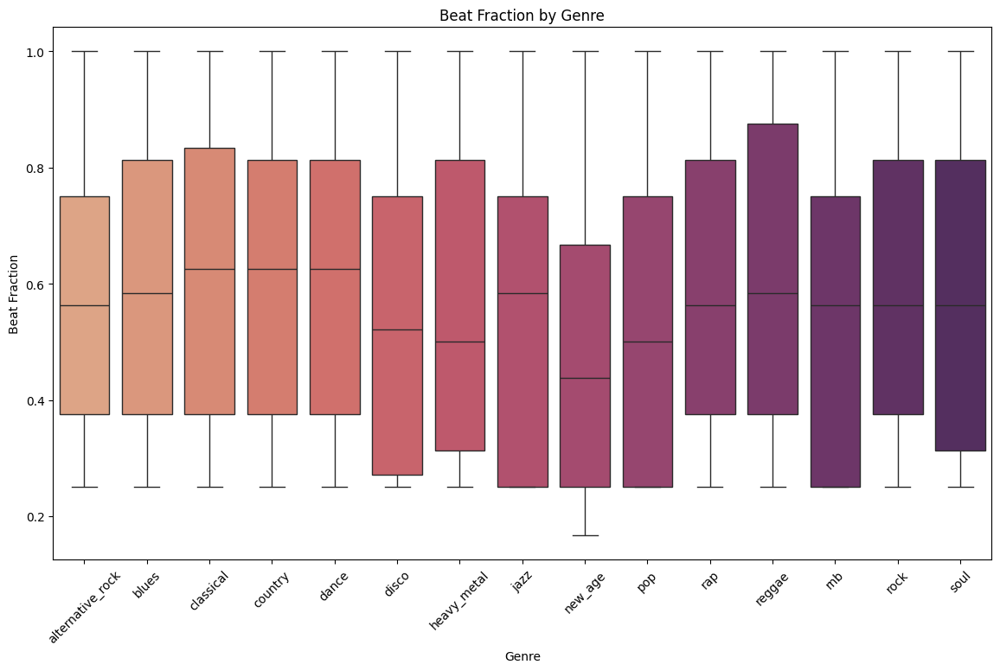

In [ ]:
plt.figure(figsize=(14,8))
sns.boxplot(data=df_rhythm, x='genre', y='beat_fraction_float', palette='flare', order=genres_sorted)
plt.title('Beat Fraction by Genre')
plt.xlabel('Genre')
plt.ylabel('Beat Fraction')
plt.xticks(rotation=45)
plt.show()

##### 2.3.14.6 Beat Fraction vs. Metric Weight and Chord Tone

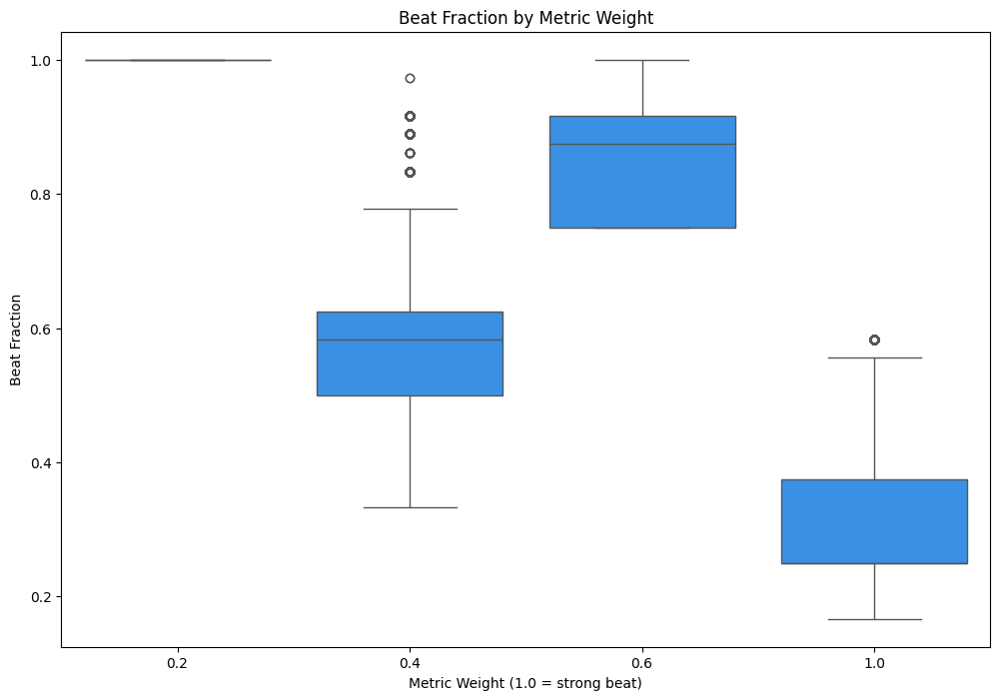

In [ ]:
# Set the figure size
plt.figure(figsize=(12, 8))

# Create a boxplot showing how beat position varies with metric weight
sns.boxplot(data=df_rhythm, x="metric_weight", y="beat_fraction_float", color='dodgerblue')
plt.title("Beat Fraction by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Beat Fraction")
plt.show()

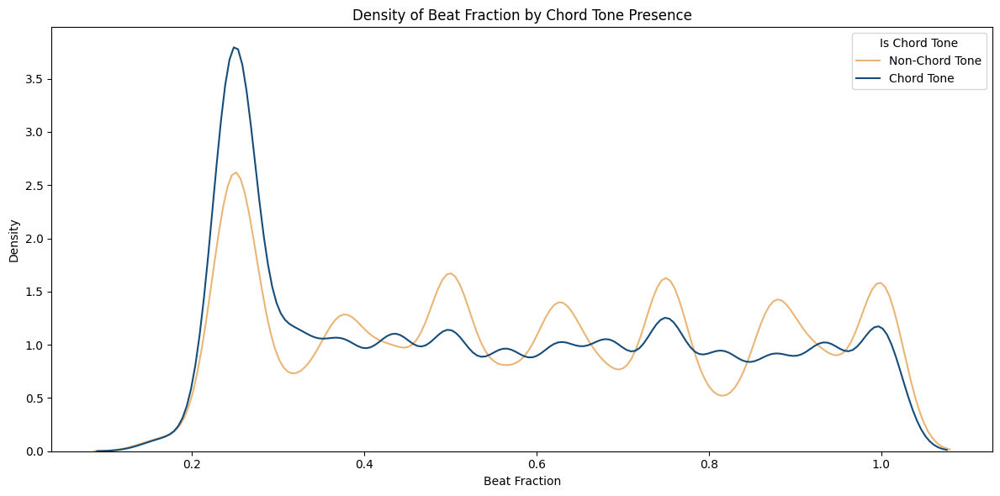

In [ ]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df_rhythm, x="beat_fraction_float", hue="is_chord_tone", common_norm=False, palette=colors)
plt.title("Density of Beat Fraction by Chord Tone Presence")
plt.xlabel("Beat Fraction")
plt.ylabel("Density")
plt.legend(labels=custom_labels, title="Is Chord Tone")
plt.tight_layout()
plt.show()

##### 2.3.14.7 Distribution of Chord Tones Across Beat Fraction Bins

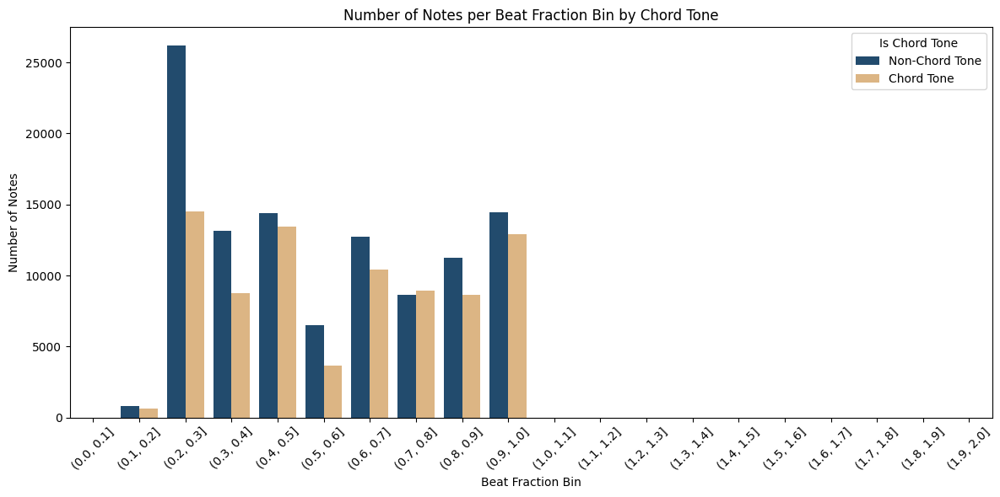

In [ ]:
# Group by binned beat_fraction_float and is_chord_tone without modifying the DataFrame
bins = np.arange(0, 2.1, 0.1)
grouped = (
    df_rhythm.groupby([pd.cut(df_rhythm['beat_fraction_float'], bins=bins), 'is_chord_tone'])
    .size()
    .reset_index(name='count')
)

# Plot grouped barplot
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=grouped, x='beat_fraction_float', y='count', hue='is_chord_tone', palette=colors)

handles, _ = ax.get_legend_handles_labels()
plt.legend(handles=handles, labels=custom_labels, title="Is Chord Tone")

plt.title("Number of Notes per Beat Fraction Bin by Chord Tone")
plt.xlabel("Beat Fraction Bin")
plt.ylabel("Number of Notes")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### 2.3.15 Metric Weight: Rhythmic Hierarchy and Structural Emphasis

##### 2.3.15.1 Central Tendency and Distribution of Rhythmic Weights


In [ ]:
# Descriptive stats: proportion and spread of beat position
df['metric_weight'].describe()

count    223830.000000
mean          0.604978
std           0.312076
min           0.200000
25%           0.400000
50%           0.600000
75%           1.000000
max           1.000000
Name: metric_weight, dtype: float64

In [ ]:
# Central tendency
mean_metric_weight = df['metric_weight'].mean()
median_metric_weight = df['metric_weight'].median()
mode_metric_weight = df['metric_weight'].mode()[0]  

# Spread
std_metric_weight = df['metric_weight'].std()

# Display results
print(f"Mean metric weight: {mean_metric_weight:.2f}")
print(f"Median metric weight: {median_metric_weight:.2f}")
print(f"Mode metric weight: {mode_metric_weight:.2f}")
print(f"Standard metric weight: {std_metric_weight:.2f}")

Mean metric weight: 0.60
Median metric weight: 0.60
Mode metric weight: 1.00
Standard metric weight: 0.31


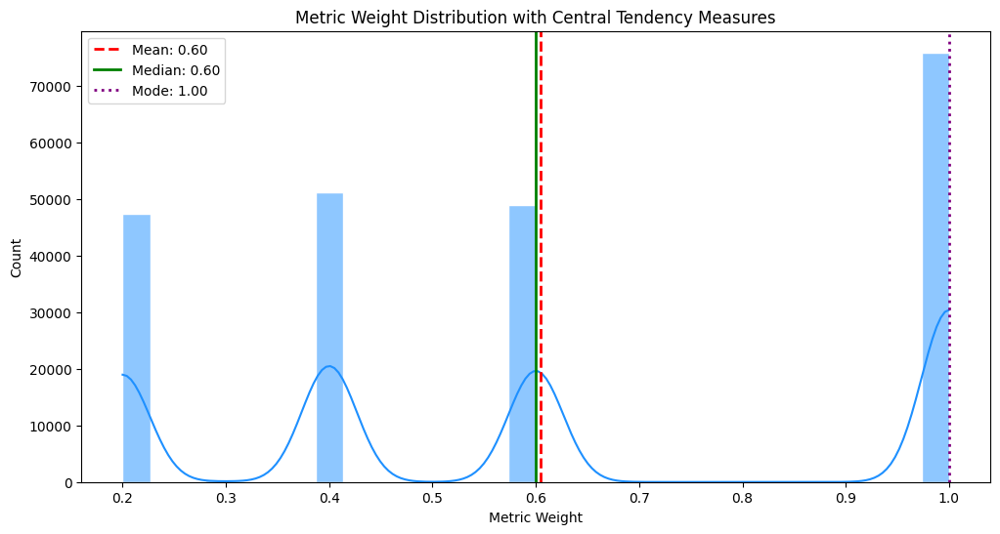

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(df['metric_weight'], bins=30, kde=True, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_metric_weight, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_metric_weight:.2f}')
plt.axvline(median_metric_weight, color='green', linestyle='-', linewidth=2, label=f'Median: {median_metric_weight:.2f}')
plt.axvline(mode_metric_weight, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_metric_weight:.2f}')

plt.title('Metric Weight Distribution with Central Tendency Measures')
plt.xlabel('Metric Weight')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.3.15.2 Outlier Detection in Metric Weight


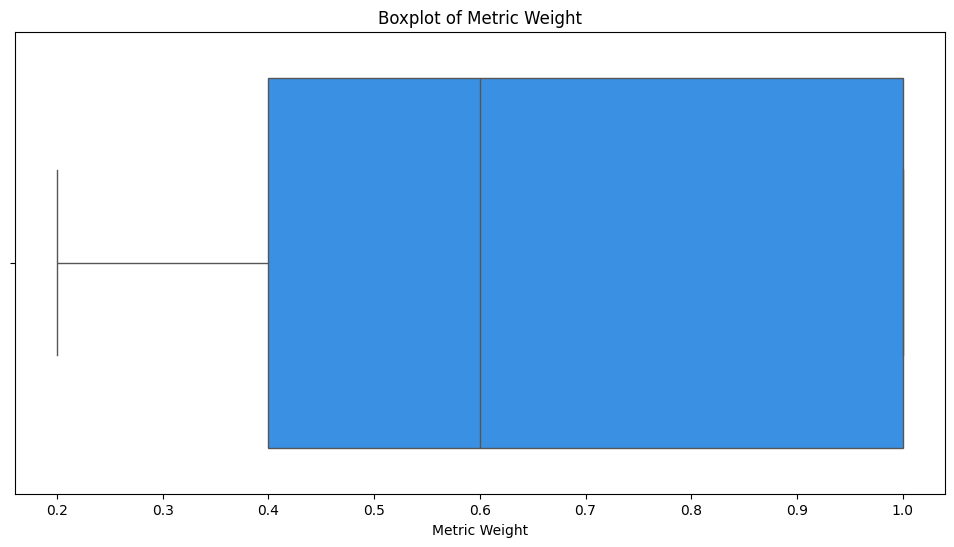

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['metric_weight'], color='dodgerblue')
plt.title('Boxplot of Metric Weight')
plt.xlabel('Metric Weight')
plt.show()

##### 2.3.15.3 Metric Weight in Context: Key, Instrument, and Genre

In [ ]:
# Descriptive statistics of metric weight
print("Metric Weight statistics by Key:")
df.groupby('key')['metric_weight'].describe().sort_index()

Metric Weight statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,11652.0,0.594301,0.318925,0.2,0.4,0.6,1.0,1.0
1,12046.0,0.571858,0.312392,0.2,0.2,0.6,1.0,1.0
2,6587.0,0.594474,0.304865,0.2,0.4,0.6,1.0,1.0
3,32432.0,0.618895,0.314191,0.2,0.4,0.6,1.0,1.0
4,17937.0,0.613090,0.313313,0.2,0.4,0.6,1.0,1.0
5,11837.0,0.574014,0.306757,0.2,0.4,0.6,1.0,1.0
6,6411.0,0.569084,0.306658,0.2,0.2,0.6,1.0,1.0
7,2628.0,0.698402,0.252971,0.4,0.4,0.6,1.0,1.0
9,5482.0,0.571178,0.313675,0.2,0.2,0.6,1.0,1.0


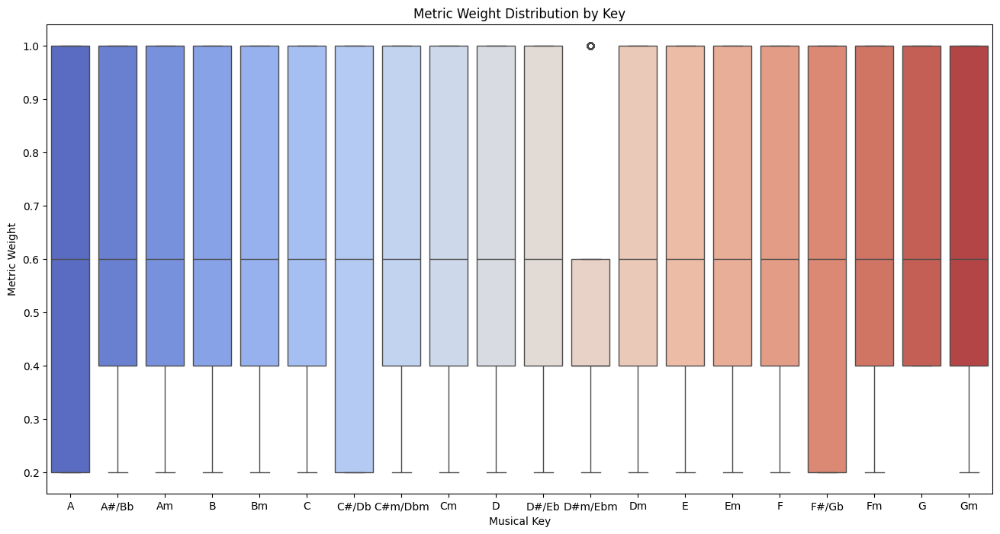

In [ ]:
# Metric weight distribution across keys to show tonal variation.
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='key_name', y='metric_weight', order=ordered_key_names, palette='coolwarm')
plt.title('Metric Weight Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Metric Weight')
plt.show()

In [ ]:
# Descriptive statistics of metric weight by instrument
print("Metric Weight statistics by Instrument:")
df.groupby('instrument')['metric_weight'].describe()

Metric Weight statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,18986.0,0.571105,0.304498,0.2,0.4,0.6,1.0,1.0
Bagpipes,6886.0,0.566744,0.312793,0.2,0.2,0.6,1.0,1.0
Bassoon,2605.0,0.697351,0.252508,0.4,0.4,0.6,1.0,1.0
Brass,3.0,0.333333,0.115470,0.2,0.3,0.4,0.4,0.4
Celesta,6501.0,0.624550,0.302970,0.2,0.4,0.6,1.0,1.0
Choir,2805.0,0.625740,0.320719,0.2,0.4,0.6,1.0,1.0
Clarinet,1134.0,0.634568,0.322070,0.2,0.4,0.6,1.0,1.0
Electric Bass,6534.0,0.609366,0.316839,0.2,0.4,0.6,1.0,1.0
Electric Guitar,21234.0,0.576246,0.310596,0.2,0.4,0.6,1.0,1.0


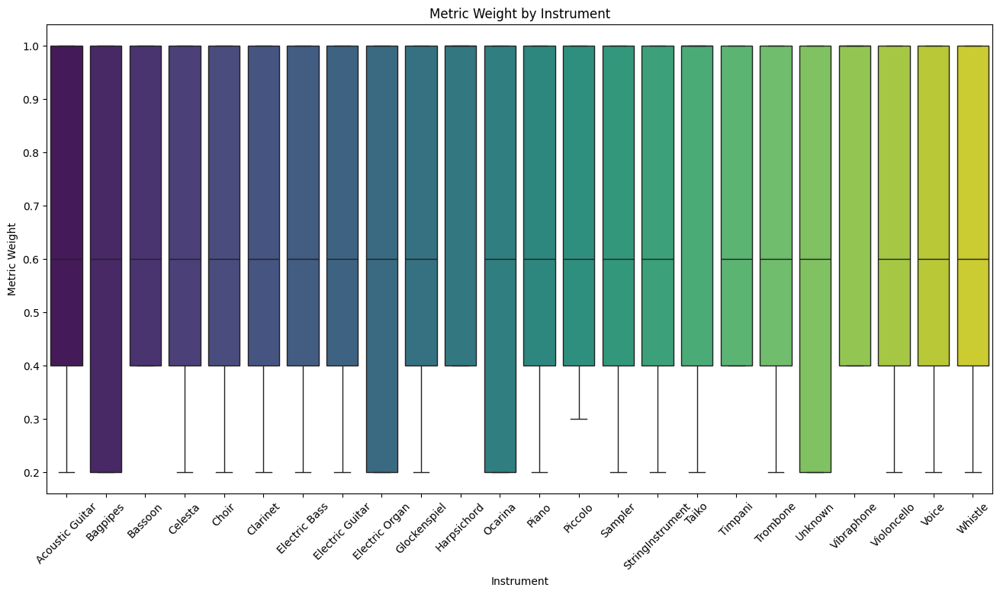

In [ ]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='instrument', y='metric_weight', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Metric Weight by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Metric Weight')
plt.show()

In [ ]:
# Descriptive statistics of metric weight by instrument family
print("Metric Weight statistics by Instrument Family:")
df.groupby('instrument')['metric_weight'].describe()

Metric Weight statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,18986.0,0.571105,0.304498,0.2,0.4,0.6,1.0,1.0
Bagpipes,6886.0,0.566744,0.312793,0.2,0.2,0.6,1.0,1.0
Bassoon,2605.0,0.697351,0.252508,0.4,0.4,0.6,1.0,1.0
Brass,3.0,0.333333,0.115470,0.2,0.3,0.4,0.4,0.4
Celesta,6501.0,0.624550,0.302970,0.2,0.4,0.6,1.0,1.0
Choir,2805.0,0.625740,0.320719,0.2,0.4,0.6,1.0,1.0
Clarinet,1134.0,0.634568,0.322070,0.2,0.4,0.6,1.0,1.0
Electric Bass,6534.0,0.609366,0.316839,0.2,0.4,0.6,1.0,1.0
Electric Guitar,21234.0,0.576246,0.310596,0.2,0.4,0.6,1.0,1.0


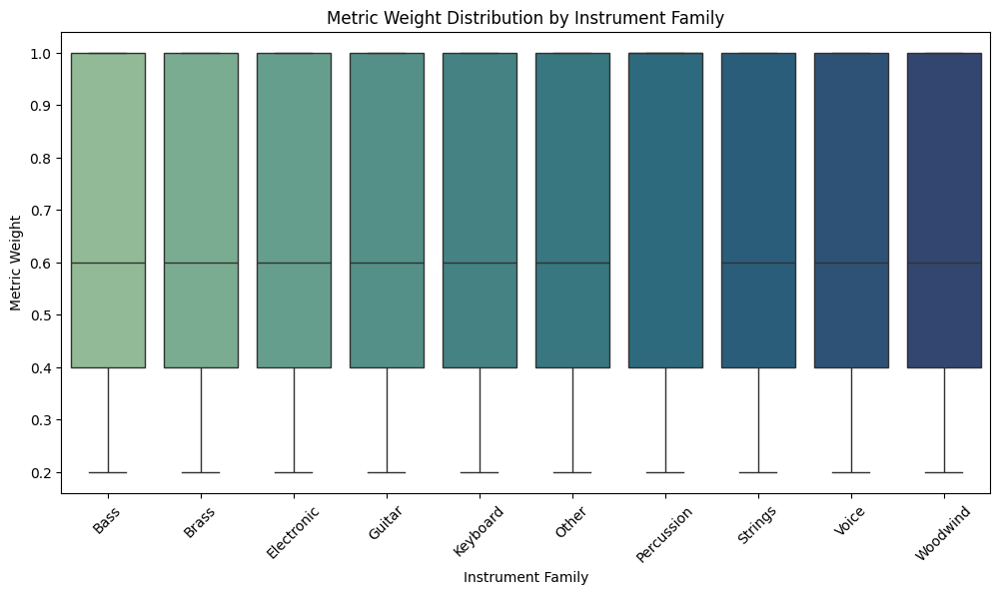

In [ ]:
# Filter and plot metric weight distribution by instrument family
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df,
    x='instrument_family',
    y='metric_weight',
    palette='crest',
    order=families
)
plt.title('Metric Weight Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Metric Weight')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Descriptive statistics of metric weight by genre
print("Metric Weight statistics by Genre:")
df.groupby('genre')['metric_weight'].describe()

Metric Weight statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,8878.0,0.597905,0.309265,0.2,0.4,0.6,1.0,1.0
blues,10184.0,0.583896,0.311071,0.2,0.4,0.6,1.0,1.0
classical,10173.0,0.619365,0.296006,0.2,0.4,0.6,1.0,1.0
country,20690.0,0.571107,0.306235,0.2,0.4,0.6,1.0,1.0
dance,9658.0,0.571443,0.309192,0.2,0.4,0.6,1.0,1.0
disco,13343.0,0.623338,0.311847,0.2,0.4,0.6,1.0,1.0
heavy_metal,10838.0,0.609522,0.320764,0.2,0.4,0.6,1.0,1.0
jazz,15127.0,0.608422,0.312388,0.2,0.4,0.6,1.0,1.0
new_age,17543.0,0.674252,0.305877,0.2,0.4,0.6,1.0,1.0


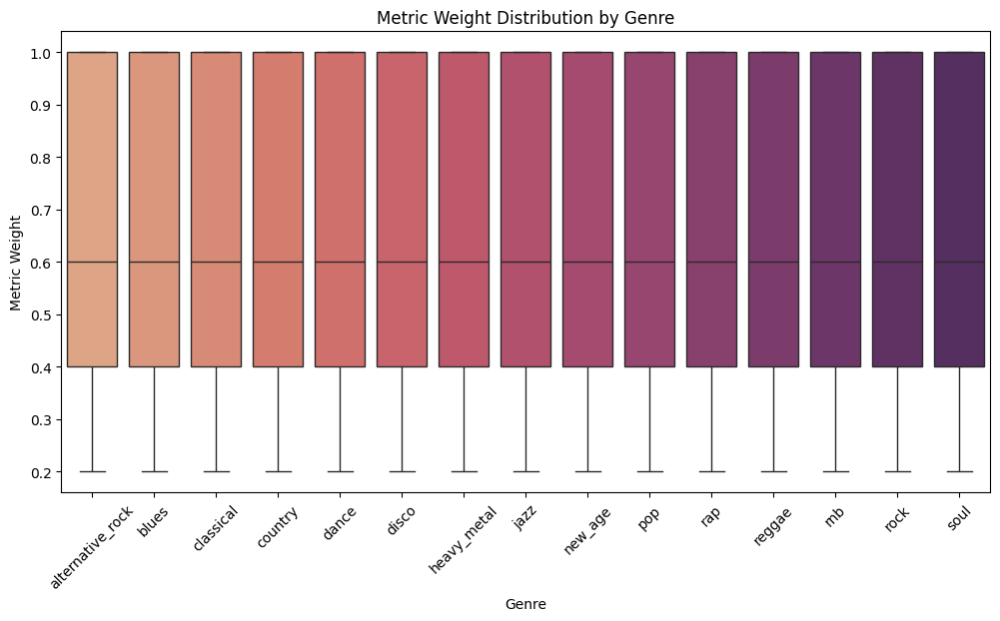

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df,
    x='genre',
    y='metric_weight',
    palette='flare',
    order=genres_sorted
)
plt.title('Metric Weight Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Metric Weight')
plt.xticks(rotation=45)
plt.show()

##### 2.3.15.4 Metric Strength and Harmonic Anchoring: Chord Tone Likelihood by Weight

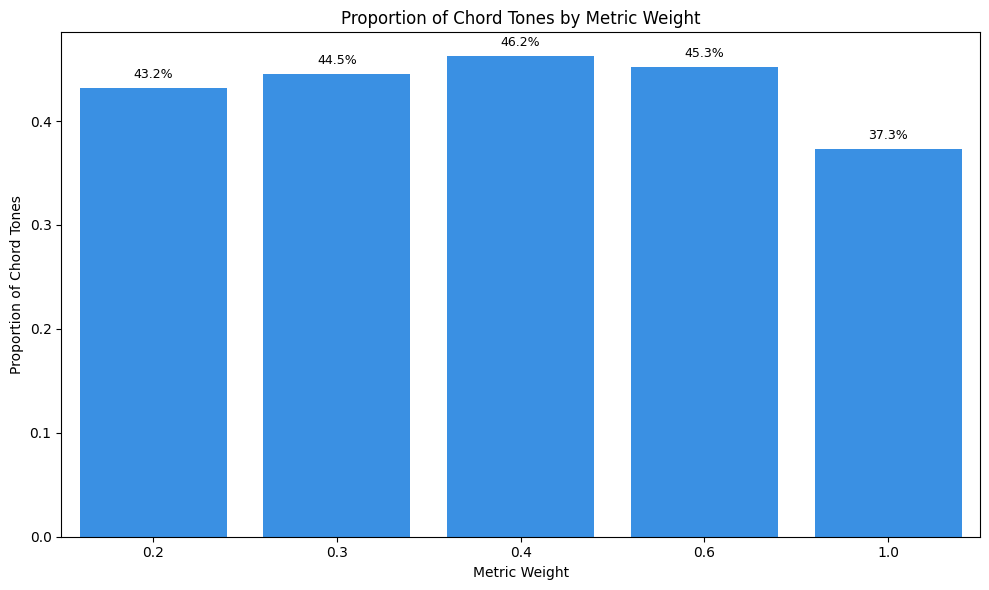

In [ ]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=df, x='metric_weight', y='is_chord_tone', estimator='mean', ci=None, color='dodgerblue')

# Add percentage annotations on top of bars
for bar in ax.patches:
    height = bar.get_height()
    if not np.isnan(height):  
        ax.annotate(f'{height * 100:.1f}%',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 5),
                    textcoords='offset points',
                    ha='center',
                    va='bottom',
                    fontsize=9,
                    color='black')

plt.title("Proportion of Chord Tones by Metric Weight")
plt.xlabel("Metric Weight")
plt.ylabel("Proportion of Chord Tones")
plt.tight_layout()
plt.show()

##### 2.3.15.5 Kernel Density Estimation of Metric Weight Distributions Conditioned on Chord Tone Presence

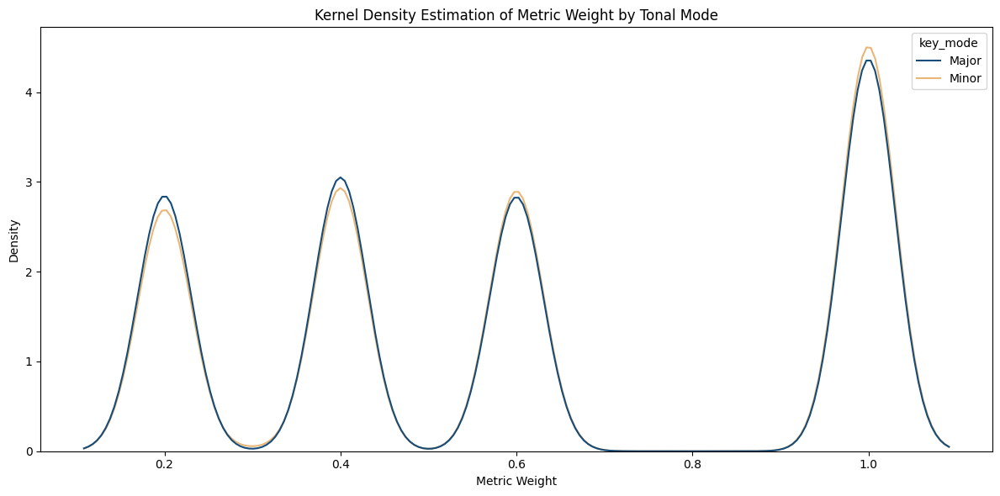

In [ ]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df, x='metric_weight', hue='key_mode', common_norm=False, palette=colors)

plt.title("Kernel Density Estimation of Metric Weight by Tonal Mode")
plt.xlabel("Metric Weight")
plt.ylabel("Density")
plt.tight_layout()
plt.show()

##### 2.3.15.6 Kernel Density Estimation of Metric Weight Distributions Conditioned on Chord Tone Presence

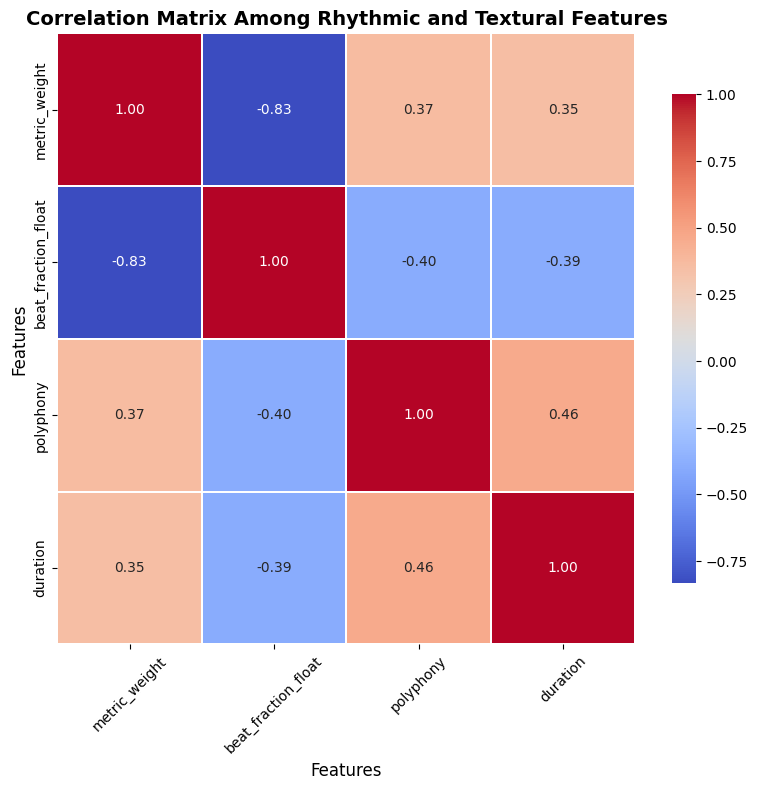

In [ ]:
plt.figure(figsize=(8, 8))
metric_weight_corr = df[['metric_weight', 'beat_fraction_float', 'polyphony', 'duration']].corr()
sns.heatmap(metric_weight_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.2, cbar_kws={"shrink": 0.8})

plt.title("Correlation Matrix Among Rhythmic and Textural Features", fontsize=14, fontweight='bold')
plt.xlabel("Features", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### 2.3.15.7 Metric Weight of Sound vs Silence: Rhythmic Emphasis Across Note Types

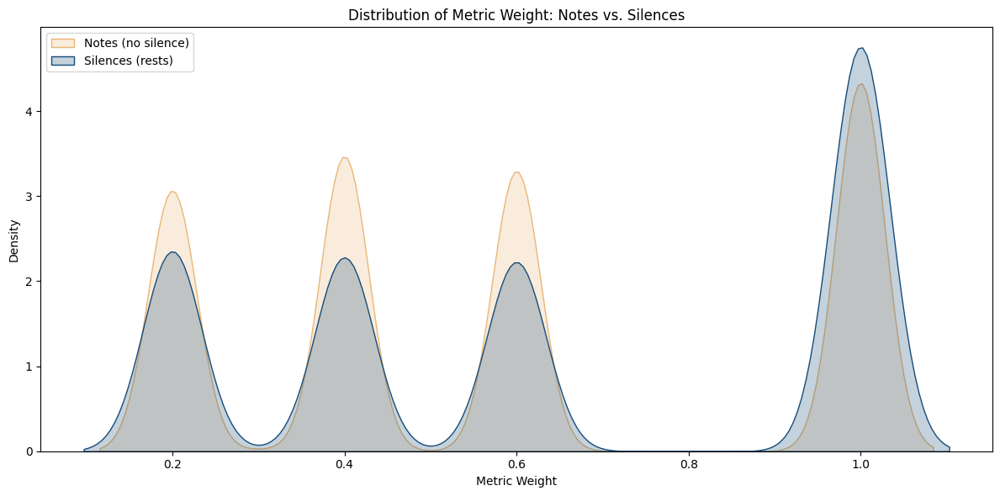

In [ ]:
# Distribution of Metric Weight for Notes and Silences
plt.figure(figsize=(12, 6))
sns.kdeplot(df_notes_only['metric_weight'], label='Notes (no silence)', fill=True, color=colors[1])
sns.kdeplot(df[df['is_rest'] == 1]['metric_weight'], label='Silences (rests)', fill=True, color=colors[0])
plt.title("Distribution of Metric Weight: Notes vs. Silences")
plt.xlabel("Metric Weight")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()


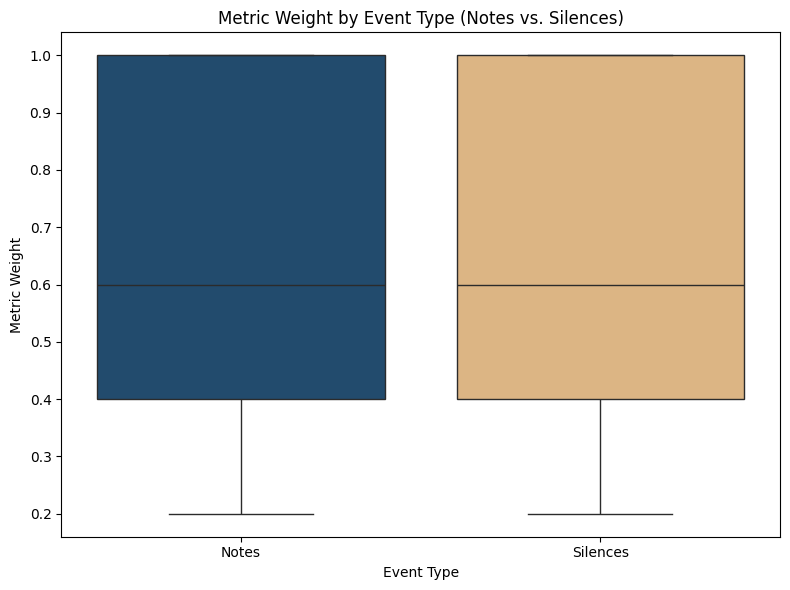

In [ ]:
# Comparison of Metric Weight Between Notes and Silences (Boxplot)
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='is_rest', y='metric_weight', palette=colors)
plt.xticks([0, 1], ['Notes', 'Silences'])
plt.title("Metric Weight by Event Type (Notes vs. Silences)")
plt.xlabel("Event Type")
plt.ylabel("Metric Weight")
plt.tight_layout()
plt.show()

#### 2.3.16 Articulation Ratio

##### 2.3.16.1 Central Tendency and Spread of Articulation Ratio


In [ ]:
df['articulation_ratio'].describe()

count    223830.000000
mean          0.196053
std           0.243339
min           0.013889
25%           0.062500
50%           0.125000
75%           0.187500
max           4.708333
Name: articulation_ratio, dtype: float64

In [ ]:
df_notes_only['articulation_ratio'].describe()

count    150814.000000
mean          0.152647
std           0.165386
min           0.020833
25%           0.062500
50%           0.111111
75%           0.166667
max           4.708333
Name: articulation_ratio, dtype: float64

In [ ]:
# Central tendency
mean_articulation_ratio = df_notes_only['articulation_ratio'].mean()
median_articulation_ratio = df_notes_only['articulation_ratio'].median()
mode_articulation_ratio = df_notes_only['articulation_ratio'].mode()[0]

# Spread
std_articulation_ratio = df_notes_only['articulation_ratio'].std()

# Display results
print(f"Mean articulation ratio: {mean_articulation_ratio:.2f}")
print(f"Median articulation ratio: {median_articulation_ratio:.2f}")
print(f"Mode articulation ratio: {mode_articulation_ratio:.2f}")
print(f"Standard articulation ratio: {std_articulation_ratio:.2f}")

Mean articulation ratio: 0.15
Median articulation ratio: 0.11
Mode articulation ratio: 0.06
Standard articulation ratio: 0.17


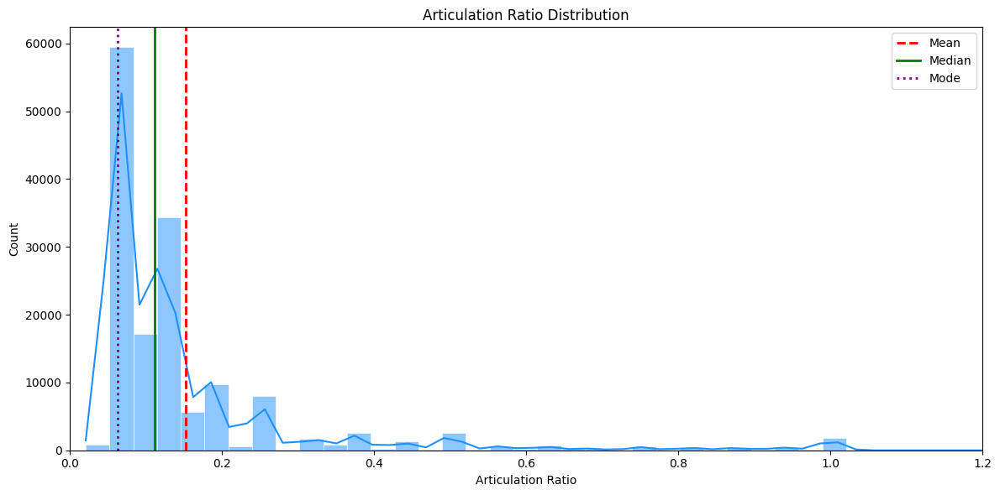

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['articulation_ratio'], bins=150, kde=True, color='dodgerblue', edgecolor='white')

plt.axvline(mean_articulation_ratio, color='red', linestyle='--', linewidth=2, label='Mean')
plt.axvline(median_articulation_ratio, color='green', linestyle='-', linewidth=2, label='Median')
plt.axvline(mode_articulation_ratio, color='purple', linestyle=':', linewidth=2, label='Mode')

plt.title('Articulation Ratio Distribution')
plt.xlabel('Articulation Ratio')
plt.ylabel('Count')
plt.xlim(0, 1.2)
plt.legend()
plt.tight_layout()
plt.show()

##### 2.3.16.2 Outlier Detection in Articulation Ratio


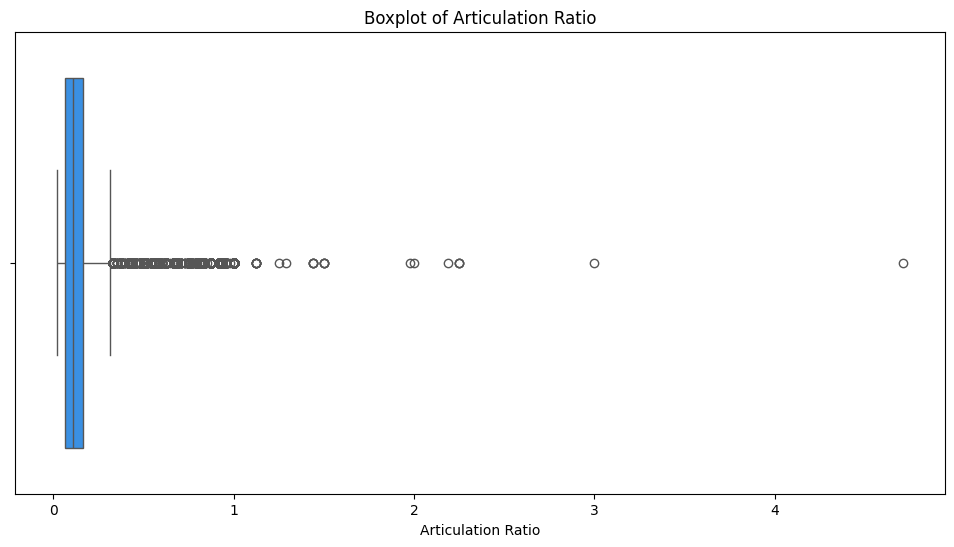

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_notes_only, x='articulation_ratio', color='dodgerblue')
plt.title('Boxplot of Articulation Ratio')
plt.xlabel('Articulation Ratio')
plt.show()

##### 2.3.16.3 Articulation Ratio in Context: Key, Instrument, and Genre

In [ ]:
# Descriptive statistics of articulation ratio by key
print("Articulation Ratio statistics by Key:")
df_notes_only.groupby('key')['articulation_ratio'].describe().sort_index()

Articulation Ratio statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,7878.0,0.128184,0.120662,0.020833,0.062500,0.062500,0.125000,1.000000
1,8535.0,0.151377,0.116676,0.041667,0.125000,0.125000,0.125000,1.000000
2,5075.0,0.131667,0.137365,0.020833,0.062500,0.062500,0.125000,3.000000
3,20526.0,0.158092,0.161564,0.041667,0.062500,0.125000,0.187500,4.708333
4,12090.0,0.104601,0.101820,0.041667,0.062500,0.062500,0.125000,1.000000
5,7353.0,0.161468,0.179828,0.020833,0.062500,0.125000,0.166667,1.000000
6,4806.0,0.223536,0.222480,0.041667,0.125000,0.125000,0.250000,2.250000
7,1729.0,0.242063,0.196112,0.083333,0.166667,0.166667,0.250000,1.000000
9,3803.0,0.147679,0.140492,0.041667,0.062500,0.125000,0.166667,1.291667


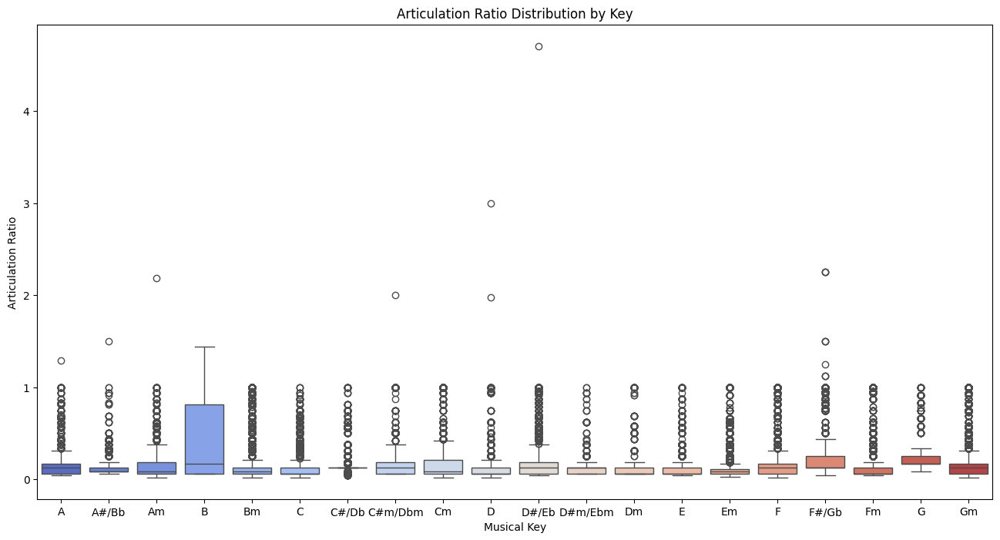

In [ ]:
# Articulation ratio distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='articulation_ratio', order=ordered_key_names, palette='coolwarm')
plt.title('Articulation Ratio Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Articulation Ratio')
plt.show()

In [ ]:
# Descriptive statistics of articulation ratio values by instrument
print("Articulation Ratio statistics by Instrument:")
df_notes_only.groupby('instrument')['articulation_ratio'].describe()

Articulation Ratio statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,13103.0,0.138198,0.110427,0.041667,0.062500,0.125000,0.166667,1.000000
Bagpipes,4865.0,0.164752,0.144923,0.041667,0.125000,0.125000,0.125000,1.000000
Bassoon,1729.0,0.242063,0.196112,0.083333,0.166667,0.166667,0.250000,1.000000
Celesta,4496.0,0.097021,0.117478,0.062500,0.062500,0.062500,0.125000,1.000000
Choir,1537.0,0.206381,0.164416,0.062500,0.125000,0.166667,0.250000,1.000000
Clarinet,998.0,0.145917,0.146398,0.062500,0.062500,0.125000,0.125000,1.000000
Electric Bass,3903.0,0.131176,0.143686,0.020833,0.062500,0.083333,0.125000,1.000000
Electric Guitar,15118.0,0.113948,0.126741,0.020833,0.062500,0.062500,0.125000,2.250000
Electric Organ,2280.0,0.235864,0.243434,0.062500,0.125000,0.125000,0.250000,1.000000


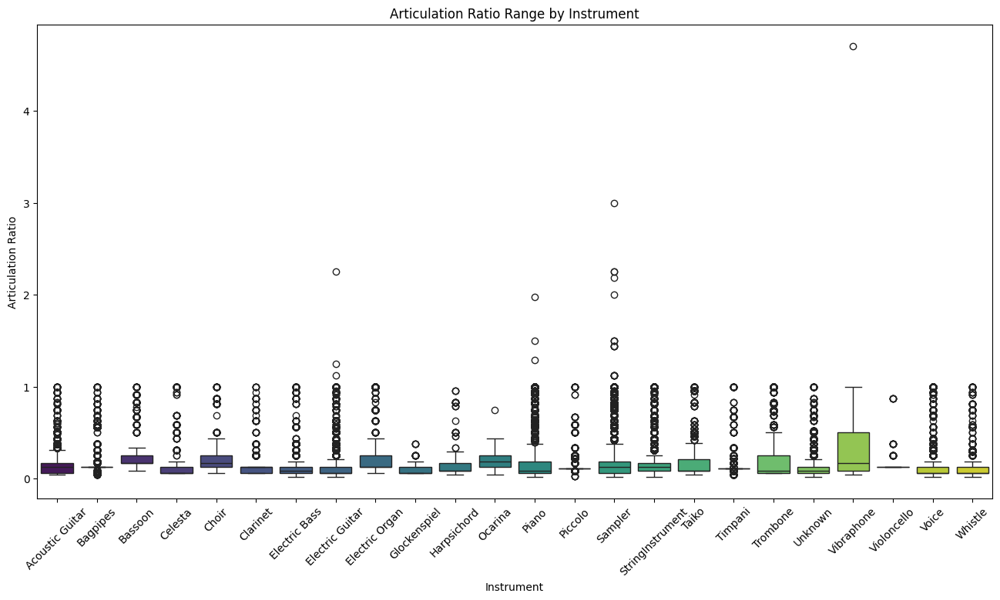

In [ ]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='articulation_ratio', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Articulation Ratio Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Articulation Ratio')
plt.show()

In [ ]:
# Descriptive statistics of articulation ratio by instrument family
print("Articulation Ratio statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['articulation_ratio'].describe()

Articulation Ratio statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,3903.0,0.131176,0.143686,0.020833,0.062500,0.083333,0.125000,1.000000
Brass,4529.0,0.200325,0.204068,0.062500,0.062500,0.083333,0.250000,1.000000
Electronic,26781.0,0.185678,0.211177,0.020833,0.062500,0.125000,0.187500,3.000000
Guitar,28221.0,0.125207,0.120053,0.020833,0.062500,0.083333,0.125000,2.250000
Keyboard,45757.0,0.145802,0.146278,0.020833,0.062500,0.083333,0.166667,1.979167
Other,10323.0,0.161566,0.159151,0.020833,0.062500,0.125000,0.125000,4.708333
Percussion,3637.0,0.180519,0.208284,0.041667,0.083333,0.111111,0.125000,1.000000
Strings,6812.0,0.185069,0.211648,0.020833,0.083333,0.125000,0.125000,1.000000
Voice,13006.0,0.127367,0.144493,0.020833,0.062500,0.062500,0.125000,1.000000


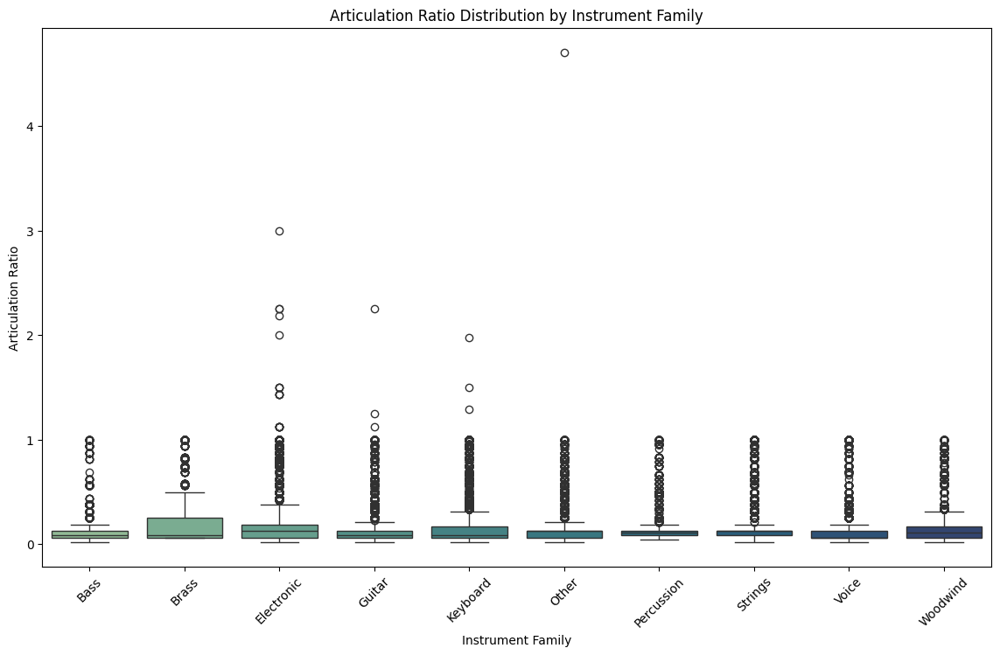

In [ ]:
# Filter and plot articulation ratio distribution by instrument family
plt.figure(figsize=(14,8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='articulation_ratio', palette='crest', order=families)
plt.title('Articulation Ratio Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Articulation Ratio')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Descriptive statistics of articulation ratio by genre
print("Articulation Ratio statistics by Genre:")
df_notes_only.groupby('genre')['articulation_ratio'].describe()

Articulation Ratio statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,7460.0,0.141739,0.121999,0.062500,0.062500,0.125000,0.125000,3.000000
blues,6788.0,0.161523,0.183237,0.020833,0.062500,0.083333,0.166667,1.500000
classical,6371.0,0.155759,0.159401,0.041667,0.062500,0.111111,0.187500,1.291667
country,14654.0,0.184886,0.175551,0.041667,0.083333,0.125000,0.187500,2.250000
dance,6910.0,0.142469,0.127024,0.020833,0.062500,0.125000,0.125000,2.000000
disco,9062.0,0.163678,0.231099,0.020833,0.062500,0.062500,0.125000,1.437500
heavy_metal,6189.0,0.164671,0.176248,0.020833,0.062500,0.125000,0.125000,2.187500
jazz,9756.0,0.197998,0.173375,0.020833,0.083333,0.166667,0.250000,1.000000
new_age,12816.0,0.181005,0.203571,0.020833,0.083333,0.111111,0.166667,4.708333


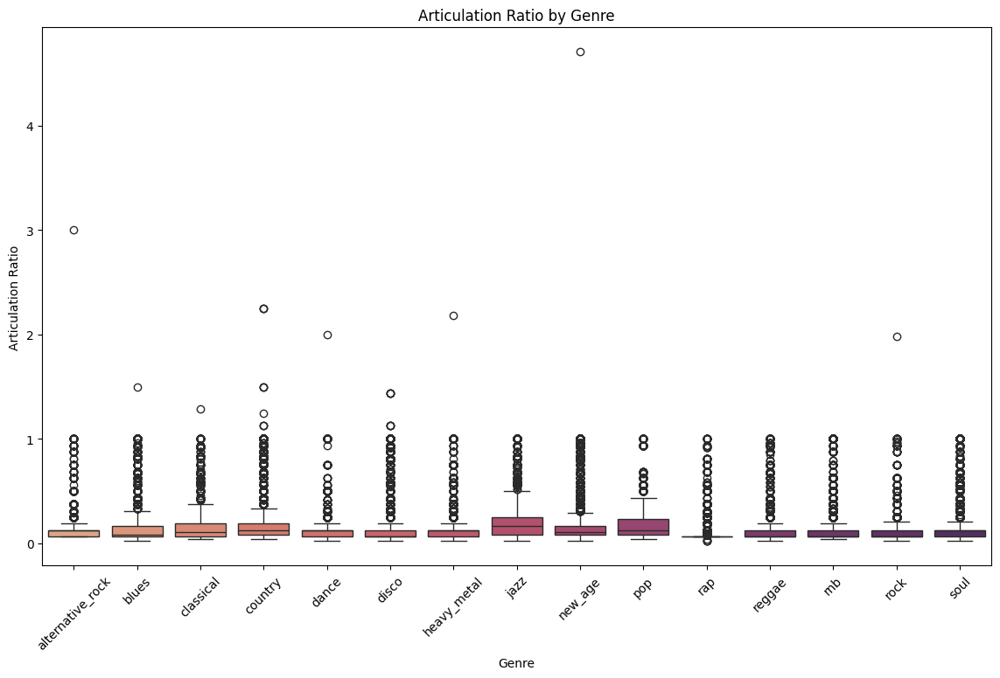

In [ ]:
plt.figure(figsize=(14,8))
sns.boxplot(data=df_notes_only, x='genre', y='articulation_ratio', palette='flare', order=genres_sorted)
plt.title('Articulation Ratio by Genre')
plt.xlabel('Genre')
plt.ylabel('Articulation Ratio')
plt.xticks(rotation=45)
plt.show()

##### 2.3.16.4 Articulation Ratio vs. Metric Weight and Chord Tone

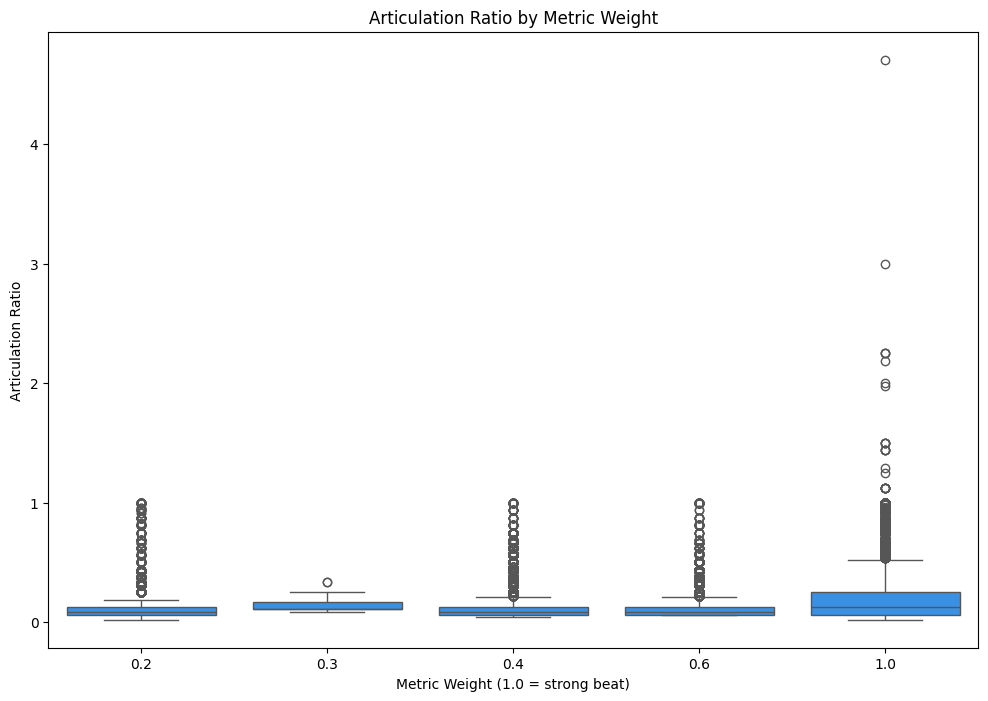

In [ ]:
# Set the figure size
plt.figure(figsize=(12, 8))

# Create a boxplot showing how beat position varies with metric weight
sns.boxplot(data=df_notes_only, x="metric_weight", y="articulation_ratio", color='dodgerblue')
plt.title("Articulation Ratio by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Articulation Ratio")
plt.show()

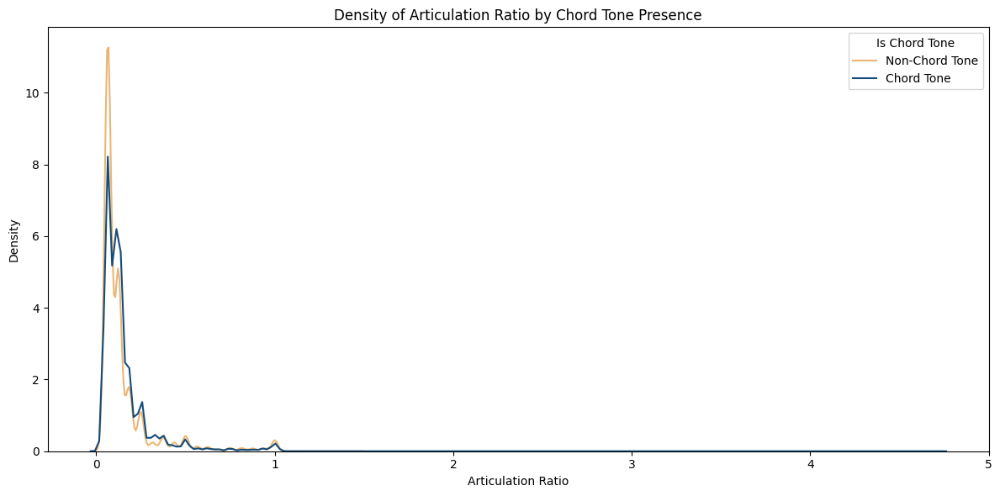

In [ ]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df_notes_only, x="articulation_ratio", hue="is_chord_tone", common_norm=False, palette=colors)
plt.title("Density of Articulation Ratio by Chord Tone Presence")
plt.xlabel("Articulation Ratio")
plt.ylabel("Density")
plt.legend(labels=custom_labels, title="Is Chord Tone")
plt.tight_layout()
plt.show()

##### 2.3.16.5 Feature Transformation and Outlier Tagging of Articulation Ratio for Downstream Processing

In [ ]:
# Compute the Interquartile Range (IQR)
Q1 = df_notes_only['articulation_ratio'].quantile(0.25) 
Q3 = df_notes_only['articulation_ratio'].quantile(0.75) 
IQR = Q3 - Q1                                 

# Define an upper bound for extreme outliers 
upper_extreme = Q3 + 3 * IQR  

# Tag outliers as boolean values in a new column
df_notes_only['is_articulation_outlier'] = df_notes_only['articulation_ratio'] > upper_extreme
df['is_articulation_outlier'] = ((df['is_rest'] == 0) & (df['articulation_ratio'] > upper_extreme))

# Report the number of extreme outliers
num_outliers = df_notes_only['is_articulation_outlier'].sum()
print(f"Number of extreme articulation ratio outliers: {num_outliers}")

# Inspect these outliers for further analysis
extreme_outliers = df_notes_only[df_notes_only['is_articulation_outlier'] == True]
print("\n", extreme_outliers[['filename', 'instrument', 'articulation_ratio']].sort_values(by='articulation_ratio', ascending=False).head(10))

Number of extreme articulation ratio outliers: 8431

                           filename       instrument  articulation_ratio
129332     The Memory of Trees.mid       Vibraphone            4.708333
55168                   Nookie.mid          Sampler            3.000000
183021  I'm Gonna Getcha Good!.mid          Sampler            2.250000
186621  I'm Gonna Getcha Good!.mid  Electric Guitar            2.250000
184899  I'm Gonna Getcha Good!.mid          Sampler            2.250000
21563               Das Modell.mid          Sampler            2.187500
142246             Be My Lover.mid          Sampler            2.000000
113790      We're Gonna Groove.mid            Piano            1.979167
182423  I'm Gonna Getcha Good!.mid          Sampler            1.500000
49978       Basin Street Blues.mid            Piano            1.500000


#### 2.3.17 Instrument

##### 2.3.17.1 Instrument Frequency and Temporal Behavior

In [ ]:
# Number of unique instruments
print("Number of unique instruments:", df['instrument'].nunique())

# Frequency of each instrument
instrument_counts = df['instrument'].value_counts()
print("\nTop 10 most frequent instruments:")
print(instrument_counts.head(10))

Number of unique instruments: 31

Top 10 most frequent instruments:
instrument
Piano               55255
Sampler             40007
Electric Guitar     21234
Acoustic Guitar     18986
Voice               17476
StringInstrument    10135
Trombone             7349
Bagpipes             6886
Unknown              6854
Electric Bass        6534
Name: count, dtype: int64


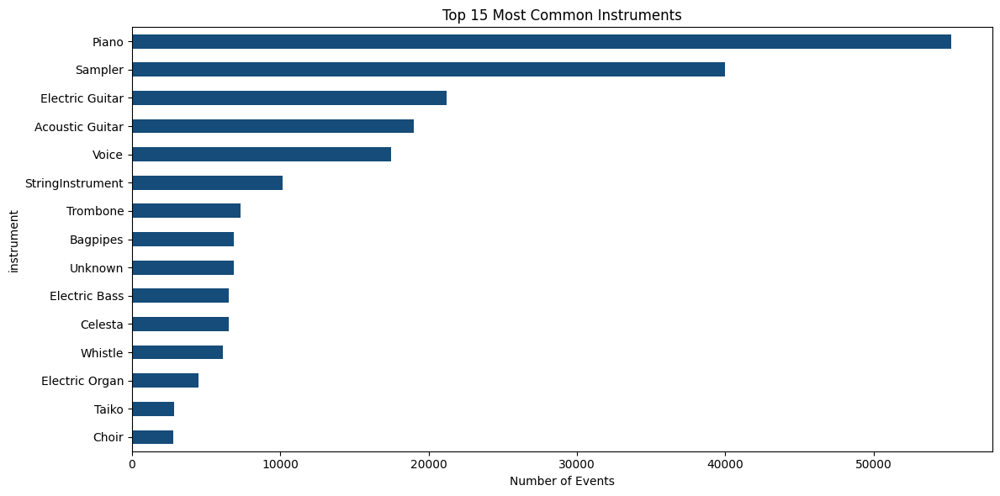

In [ ]:
# Plot top 15 most common instruments
top_n = 15
plt.figure(figsize=(12, 6))
instrument_counts.head(top_n).plot(kind='barh', color=colors[0])
plt.title(f'Top {top_n} Most Common Instruments')
plt.xlabel('Number of Events')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [ ]:
# Instruments with extreme articulation ratio values
extreme_instruments = df[df['articulation_ratio'] > 3]['instrument'].value_counts()
print("Instruments with articulation_ratio > 3:")
print(extreme_instruments.head(10))

Instruments with articulation_ratio > 3:
instrument
Vibraphone    1
Name: count, dtype: int64


In [ ]:
df[(df['filename'] == 'The Memory of Trees.mid') & (df['instrument'] == 'Vibraphone') & (df['articulation_ratio'] > 3)][['onset', 'duration', 'beat_fraction_float', 'articulation_ratio']]

,onset,duration,beat_fraction_float,articulation_ratio
129332,24.0,28.25,0.166667,4.708333


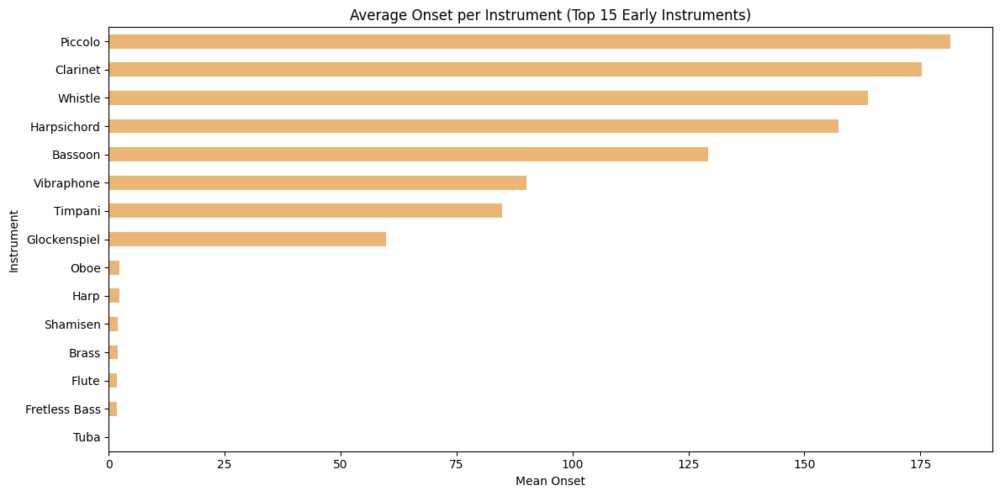

In [ ]:
# Average onset per instrument (Top 15)
onset_by_instrument = df.groupby('instrument')['onset'].mean().sort_values()
onset_by_instrument.head(15).plot(kind='barh', figsize=(12, 6), color=colors[1])
plt.title("Average Onset per Instrument (Top 15 Early Instruments)")
plt.xlabel("Mean Onset")
plt.ylabel("Instrument")
plt.tight_layout()
plt.show()

##### 2.3.17.2 Instrument Usage Across Genres

In [ ]:
# Crosstab genre vs instrument (top 15 instruments only)
top_instr = df['instrument'].value_counts().head(15).index
instrument_genre_crosstab = pd.crosstab(df[df['instrument'].isin(top_instr)]['genre'], 
                                        df[df['instrument'].isin(top_instr)]['instrument'])

# Normalize to get proportions per genre
instrument_genre_prop = instrument_genre_crosstab.div(instrument_genre_crosstab.sum(axis=1), axis=0)

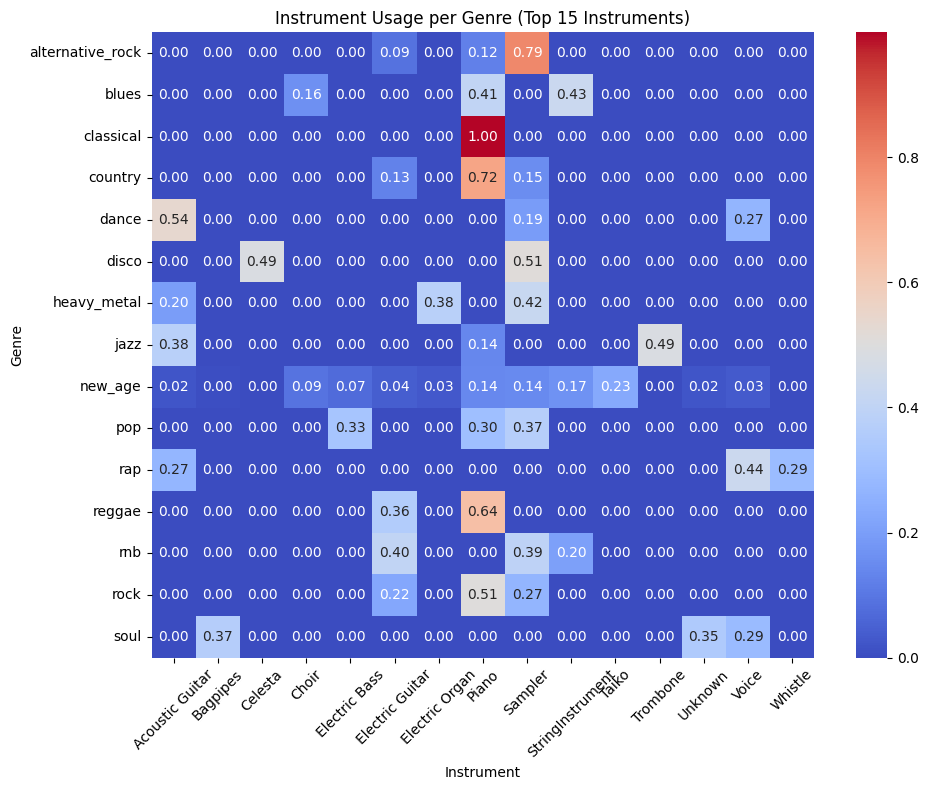

In [ ]:
# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(instrument_genre_prop, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Instrument Usage per Genre (Top 15 Instruments)")
plt.ylabel("Genre")
plt.xlabel("Instrument")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### 2.3.17.3 Instrumental Diversity per Track

In [ ]:
# Count number of distinct instruments per file
instrument_diversity = df.groupby('filename')['instrument'].nunique().reset_index(name='instrument_count')

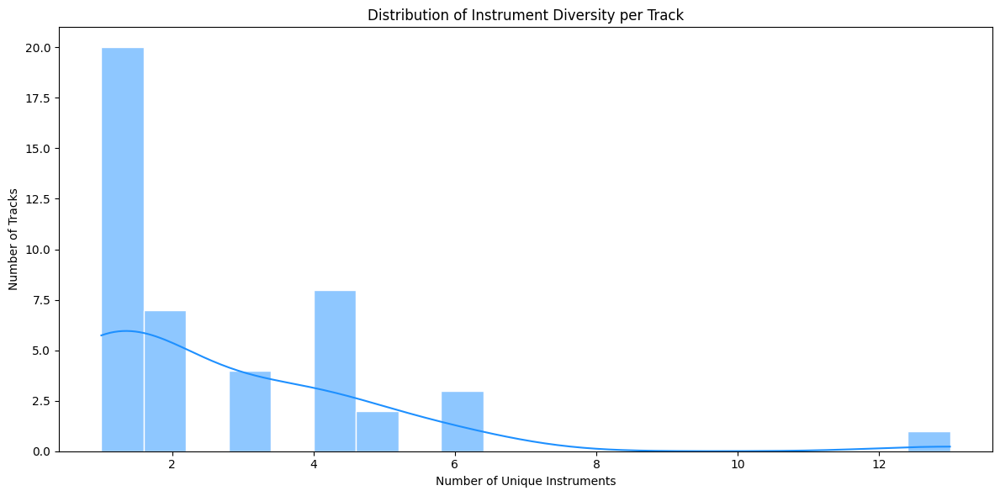

In [ ]:
# Histogram of instrumental diversity
plt.figure(figsize=(12, 6))
sns.histplot(instrument_diversity['instrument_count'], bins=20, kde=True, color='dodgerblue', edgecolor='white')
plt.title("Distribution of Instrument Diversity per Track")
plt.xlabel("Number of Unique Instruments")
plt.ylabel("Number of Tracks")
plt.tight_layout()
plt.show()

##### 2.3.17.4 Shannon Entropy of Instrument Usage

In [ ]:
# Compute normalized frequency of instruments per file and entropy
def compute_instrument_entropy(group):
    counts = group['instrument'].value_counts(normalize=True)
    return entropy(counts)

entropy_by_track = df.groupby('filename').apply(compute_instrument_entropy).reset_index(name='instrument_entropy')

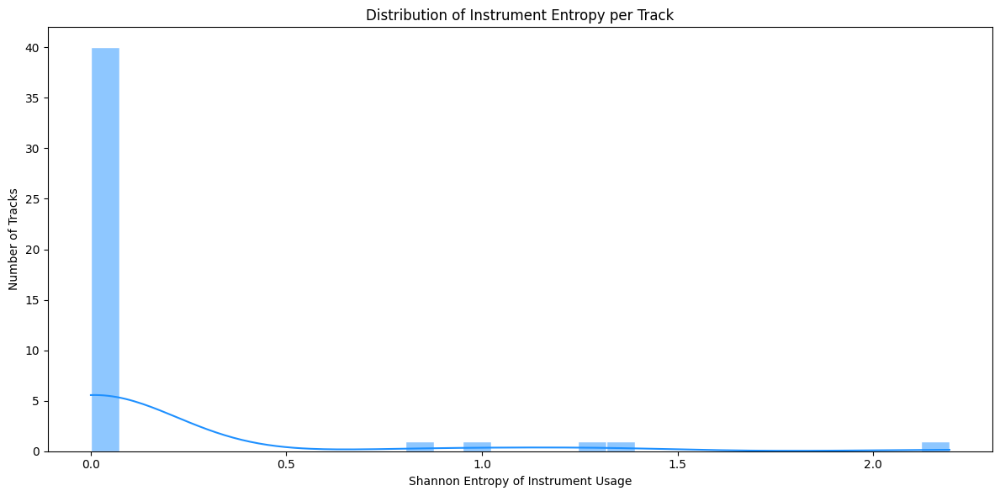

In [ ]:
# Histogram of Shannon entropy values
plt.figure(figsize=(12, 6))
sns.histplot(entropy_by_track['instrument_entropy'], bins=30, kde=True, color='dodgerblue', edgecolor='white')
plt.title("Distribution of Instrument Entropy per Track")
plt.xlabel("Shannon Entropy of Instrument Usage")
plt.ylabel("Number of Tracks")
plt.tight_layout()
plt.show()

##### 2.3.17.5 Polyphonic Instrument Ratio

In [ ]:
# Compute avg polyphony per instrument per track
avg_polyphony = df.groupby(['filename', 'instrument'])['polyphony'].mean().reset_index()

# Define instrument as polyphonic if average polyphony > 1.5
avg_polyphony['is_polyphonic'] = avg_polyphony['polyphony'] > 1.5

# Compute ratio of polyphonic instruments per track
polyphonic_ratio = avg_polyphony.groupby('filename')['is_polyphonic'].mean().reset_index(name='polyphonic_instr_ratio')

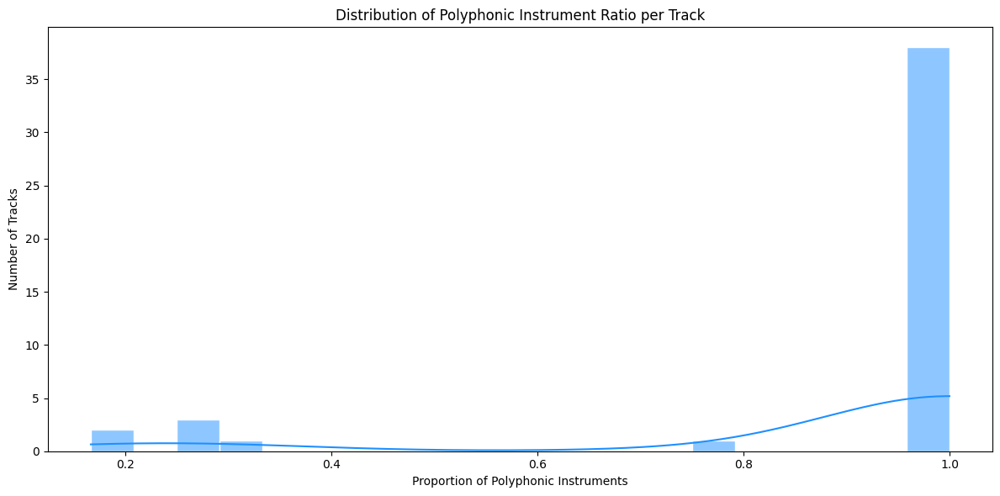

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(polyphonic_ratio['polyphonic_instr_ratio'], bins=20, kde=True, color='dodgerblue', edgecolor='white')
plt.title("Distribution of Polyphonic Instrument Ratio per Track")
plt.xlabel("Proportion of Polyphonic Instruments")
plt.ylabel("Number of Tracks")
plt.tight_layout()
plt.show()

#### 2.3.18 Instrument Family

##### 2.3.18.1 Instrument Family Frequency and Temporal Behavior

In [ ]:
# Number of unique instrument families
print("Number of unique instrument families:", df['instrument_family'].nunique())

# Frequency of each instrument family
instrument_family_counts = df['instrument_family'].value_counts()
print("\nMost frequent instrument families:")
print(instrument_family_counts)

Number of unique instrument families: 10

Most frequent instrument families:
instrument_family
Keyboard      66387
Guitar        40220
Electronic    40007
Voice         20281
Other         15707
Woodwind      11780
Strings       10598
Brass          7357
Bass           6535
Percussion     4958
Name: count, dtype: int64


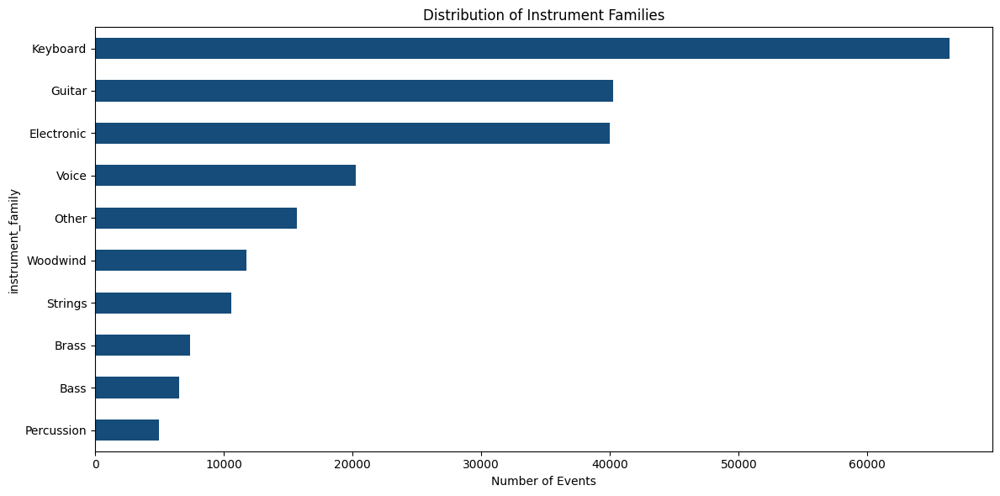

In [ ]:
plt.figure(figsize=(12, 6))
instrument_family_counts.plot(kind='barh', color=colors[0])
plt.title(f'Distribution of Instrument Families')
plt.xlabel('Number of Events')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [ ]:
# Instrument families with extreme articulation ratio values
extreme_instrument_families = df[df['articulation_ratio'] > 3]['instrument_family'].value_counts()
print("Instrument families with articulation_ratio > 3:")
print(extreme_instrument_families.head(10))

Instrument families with articulation_ratio > 3:
instrument_family
Other    1
Name: count, dtype: int64


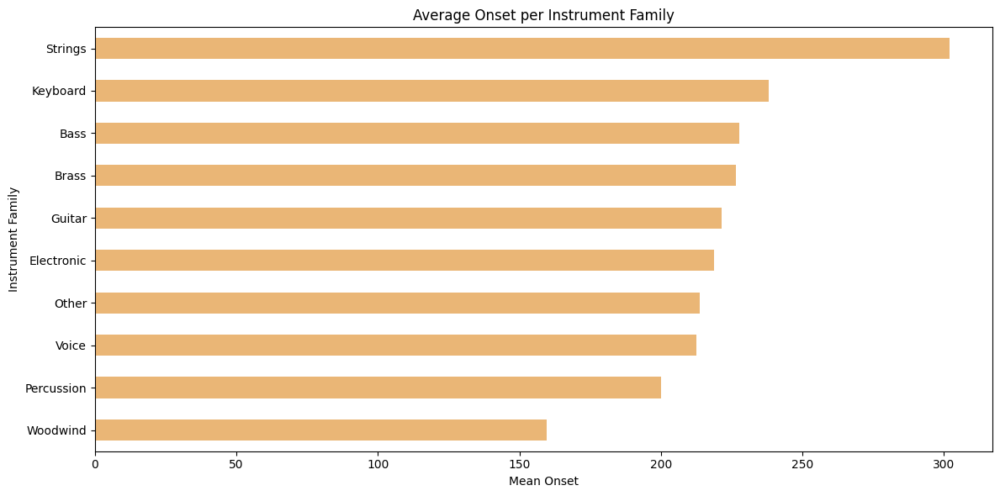

In [ ]:
# Average onset per instrument family 
onset_by_instrument_family = df.groupby('instrument_family')['onset'].mean().sort_values()
onset_by_instrument_family.plot(kind='barh', figsize=(12, 6), color=colors[1])
plt.title("Average Onset per Instrument Family")
plt.xlabel("Mean Onset")
plt.ylabel("Instrument Family")
plt.tight_layout()
plt.show()

##### 2.3.18.2 Instrument Family Usage Across Genres

In [ ]:
# Crosstab genre vs instrument family
top_instr_fam = df['instrument_family'].value_counts().index
instrument_family_genre_crosstab = pd.crosstab(df[df['instrument_family'].isin(top_instr_fam)]['genre'], 
                                        df[df['instrument_family'].isin(top_instr_fam)]['instrument_family'])

# Normalize to get proportions per genre
instrument_family_genre_prop = instrument_family_genre_crosstab.div(instrument_family_genre_crosstab.sum(axis=1), axis=0)

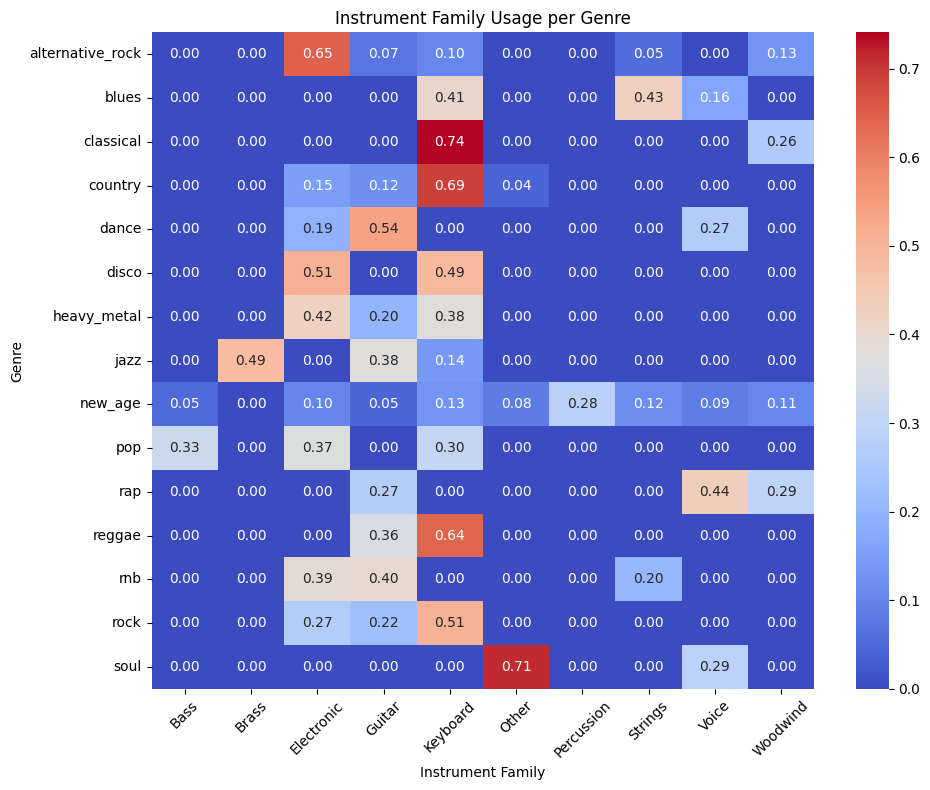

In [ ]:
# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(instrument_family_genre_prop, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Instrument Family Usage per Genre")
plt.ylabel("Genre")
plt.xlabel("Instrument Family")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### 2.3.18.3 Dominant Instrument Family per Track

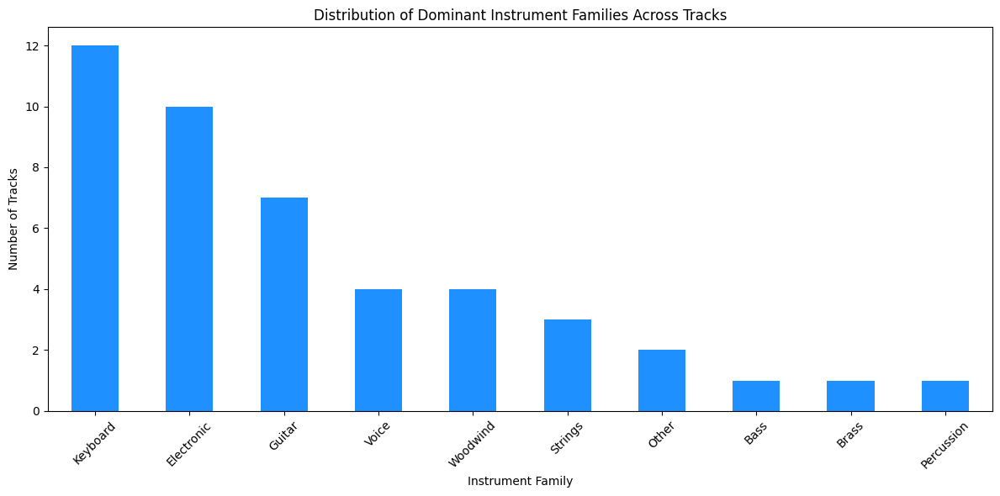

In [ ]:
dominant_family = df.groupby('filename')['instrument_family'].agg(lambda x: x.mode().iloc[0])
dominant_counts = dominant_family.value_counts()

plt.figure(figsize=(12, 6))
dominant_counts.plot(kind='bar', color='dodgerblue')
plt.title("Distribution of Dominant Instrument Families Across Tracks")
plt.xlabel("Instrument Family")
plt.ylabel("Number of Tracks")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### 2.3.18.4 Co-occurrence of Instrument Families

In [ ]:
# Create binary matrix: 1 if family appears in the track
binary_matrix = df.groupby(['filename', 'instrument_family']).size().unstack(fill_value=0)
binary_matrix[binary_matrix > 0] = 1

# Co-occurrence matrix
co_occurrence = binary_matrix.T.dot(binary_matrix)

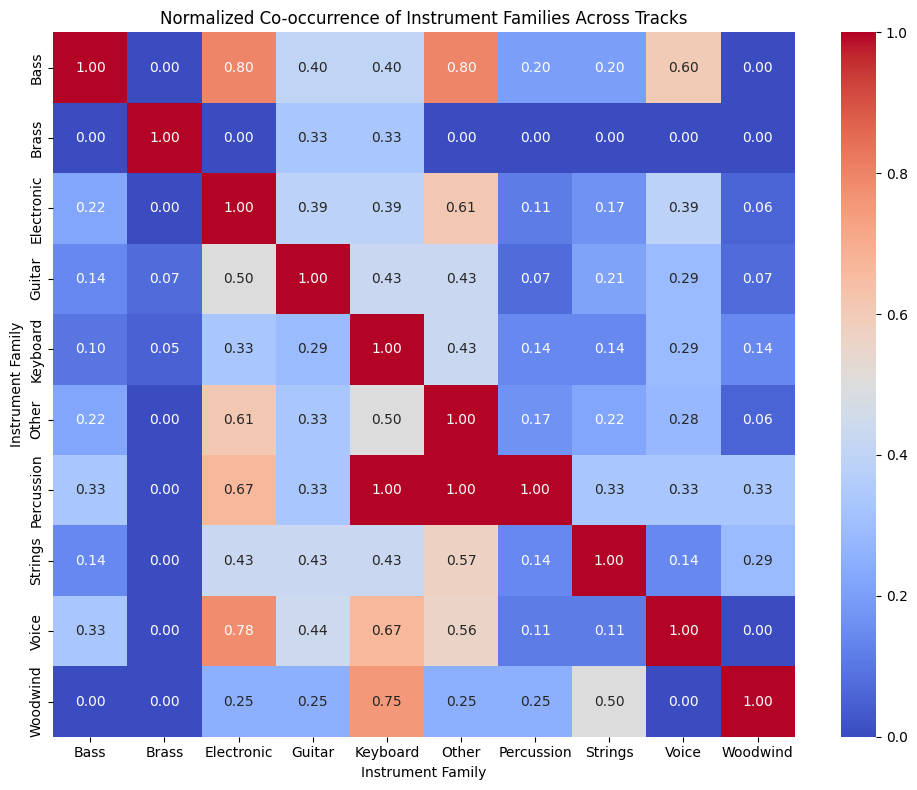

In [ ]:
# Normalize co-occurrence values to [0, 1] range (row-wise)
norm_co_occurrence = co_occurrence.div(co_occurrence.max(axis=1), axis=0)

plt.figure(figsize=(10, 8))
sns.heatmap(norm_co_occurrence, cmap="coolwarm", annot=True, fmt=".2f")
plt.title("Normalized Co-occurrence of Instrument Families Across Tracks")
plt.xlabel("Instrument Family")
plt.ylabel("Instrument Family")
plt.tight_layout()
plt.show()

##### 2.3.18.5 Standard Deviation of Articulation Ratio by Instrument Family

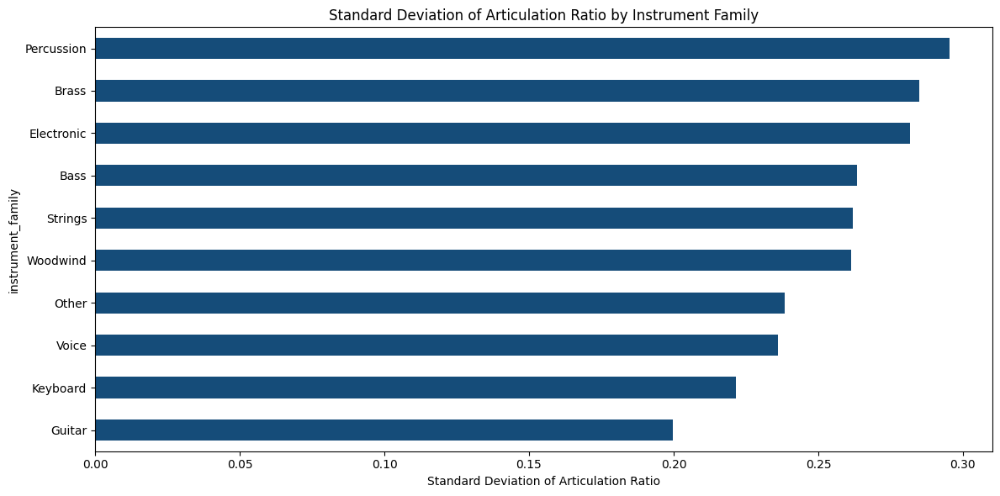

In [ ]:
# Compute standard deviation of articulation_ratio per instrument family
articulation_std = df.groupby('instrument_family')['articulation_ratio'].std().sort_values()

# Barplot of articulation variability
plt.figure(figsize=(12, 6))
articulation_std.plot(kind='barh', color=colors[0])
plt.title("Standard Deviation of Articulation Ratio by Instrument Family")
plt.xlabel("Standard Deviation of Articulation Ratio")
plt.tight_layout()
plt.show()

#### 2.3.19 Track

##### 2.3.19.1  Number and Distribution of Track Labels

In [ ]:
# Count total number of unique track labels
unique_tracks = df['track'].nunique()
print("Number of unique tracks across all files:", unique_tracks)

Number of unique tracks across all files: 35


In [ ]:
# Display the 20 most frequent track names
track_counts = df['track'].value_counts(dropna=True).head(20)
print("Top 20 most frequent track labels:")
print("\n", track_counts)

Top 20 most frequent track labels:

 track
DRUMS                                   35675
NL.net                                  13519
Percussion                              13305
Drums                                   11362
Chorus                                   9150
tk11                                     8087
Background Vocals Guide                  7364
Trombone                                 7347
Channel 16                               7221
Drums & Percussion                       6844
Unknown                                  6502
Shania Twain - I'm gonna getcha good     6411
I AM CANADIAN!                           6371
whistle                                  6144
drums                                    5695
Guitar                                   5690
Synth Bass                               5654
Voice Oohs                               5335
BRITNEY SPEARS - I'm A Slave For         5274
Sampler                                  5123
Name: count, dtype: int64


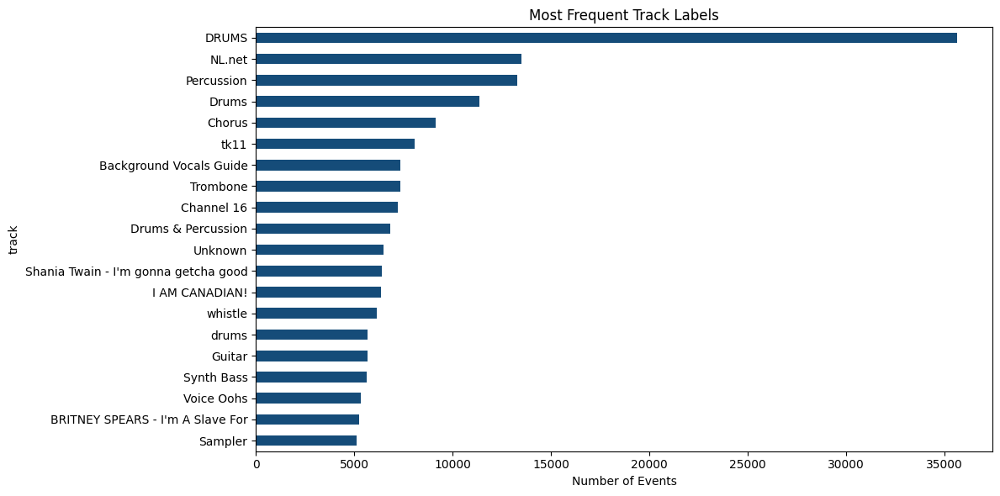

In [ ]:
# Barplot of top 20 track names
plt.figure(figsize=(12, 6))
track_counts.plot(kind='barh', color=colors[0])
plt.title("Most Frequent Track Labels")
plt.xlabel("Number of Events")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

##### 2.3.19.2 Dominant Instrument Family per Track

In [ ]:
# Compute the dominant instrument family (by proportion) for each track label
def compute_top_family(track_df):
    return track_df['instrument_family'].value_counts(normalize=True).head(1)

track_family_top = df.dropna(subset=['track']).groupby('track').apply(compute_top_family)
track_family_top = track_family_top.reset_index()
track_family_top.columns = ['track', 'rank', 'top_family_proportion']

print("Sample of top instrument families per track (10 examples):")
print("\n", track_family_top.head(10))

Sample of top instrument families per track (10 examples):

                               track        rank  top_family_proportion
0                         A.PIANO 1    Keyboard               1.000000
1                   Acoustic Guitar      Guitar               1.000000
2                          BASSSOON    Woodwind               0.998097
3                          BEMYLOVE  Electronic               0.997323
4  BRITNEY SPEARS - I'm A Slave For    Keyboard               0.998483
5           Background Vocals Guide      Guitar               1.000000
6                        CRASH CYMB    Keyboard               0.997560
7                        Channel 16  Electronic               0.996399
8                            Chorus       Voice               1.000000
9                             DRUMS    Keyboard               0.729783


##### 2.3.19.3 Detecting Semantic Inconsistencies in Track Labels

In [ ]:
# Check for semantic inconsistencies between track names and their dominant instrument families
inconsistent_tracks = track_family_top[
    ((track_family_top['track'].str.lower().str.contains("drum")) & 
     (~track_family_top['rank'].str.lower().str.contains("percussion|drums"))) |
    ((track_family_top['track'].str.lower().str.contains("guitar")) & 
     (~track_family_top['rank'].str.lower().str.contains("guitar"))) |
    ((track_family_top['track'].str.lower().str.contains("violin")) & 
     (~track_family_top['rank'].str.lower().str.contains("string")))
]

print(f"\nDetected {len(inconsistent_tracks)} semantically inconsistent tracks:")
print("\n", inconsistent_tracks[['track', 'rank', 'top_family_proportion']])


Detected 4 semantically inconsistent tracks:

                  track      rank  top_family_proportion
9                DRUMS  Keyboard               0.729783
11               Drums  Keyboard               1.000000
12  Drums & Percussion     Other               1.000000
30               drums    Guitar               1.000000


##### 2.3.19.4 Feature Engineering Decision: Removal of the ‘track’ Variable Due to Label Noise and Low Informative Value

In [ ]:
# Based on high inconsistency, duplicate meaning with 'instrument' or 'instrument_family', and unclear semantics across files, we decide to drop the 'track' feature.
df = df.drop(columns=['track'])
print("Column 'track' has been removed from the dataset due to semantic inconsistency and low informative value.")

Column 'track' has been removed from the dataset due to semantic inconsistency and low informative value.


#### 2.3.20. Velocity

##### 2.3.20.1 Central Tendency and Spread of Velocity


In [ ]:
# Descriptive stats: proportion and spread of velocity 
df['velocity'].describe()

count    223830.000000
mean         62.008024
std          48.032644
min          -1.000000
25%          -1.000000
50%          80.000000
75%         100.000000
max         127.000000
Name: velocity, dtype: float64

In [ ]:
# Descriptive stats: proportion and spread of velocity for notes only
df_notes_only['velocity'].describe()

count    150814.000000
mean         92.513109
std          23.905819
min           1.000000
25%          79.000000
50%          96.000000
75%         110.000000
max         127.000000
Name: velocity, dtype: float64

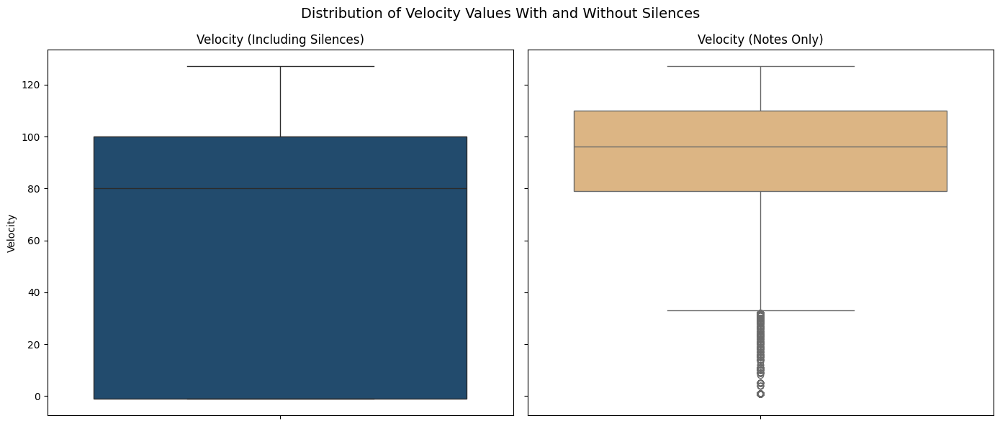

In [ ]:
# Distribution of velocity values with and without silences

fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

sns.boxplot(data=df, y='velocity', ax=axes[0], color=colors[0])
axes[0].set_title("Velocity (Including Silences)")
axes[0].set_ylabel("Velocity")

sns.boxplot(data=df[df['velocity'] > 0], y='velocity', ax=axes[1], color=colors[1])
axes[1].set_title("Velocity (Notes Only)")
axes[1].set_ylabel("")

plt.suptitle("Distribution of Velocity Values With and Without Silences", fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# Central tendency
mean_velocity = df_notes_only['velocity'].mean()
median_velocity = df_notes_only['velocity'].median()
mode_velocity = df_notes_only['velocity'].mode()[0]  

# Spread
std_velocity = df_notes_only['velocity'].std()

# Display results
print(f"Mean velocity: {mean_velocity:.2f}")
print(f"Median velocity: {median_velocity:.2f}")
print(f"Mode velocity: {mode_velocity:.2f}")
print(f"Standard velocity: {std_velocity:.2f}")

Mean velocity: 92.51
Median velocity: 96.00
Mode velocity: 100.00
Standard velocity: 23.91


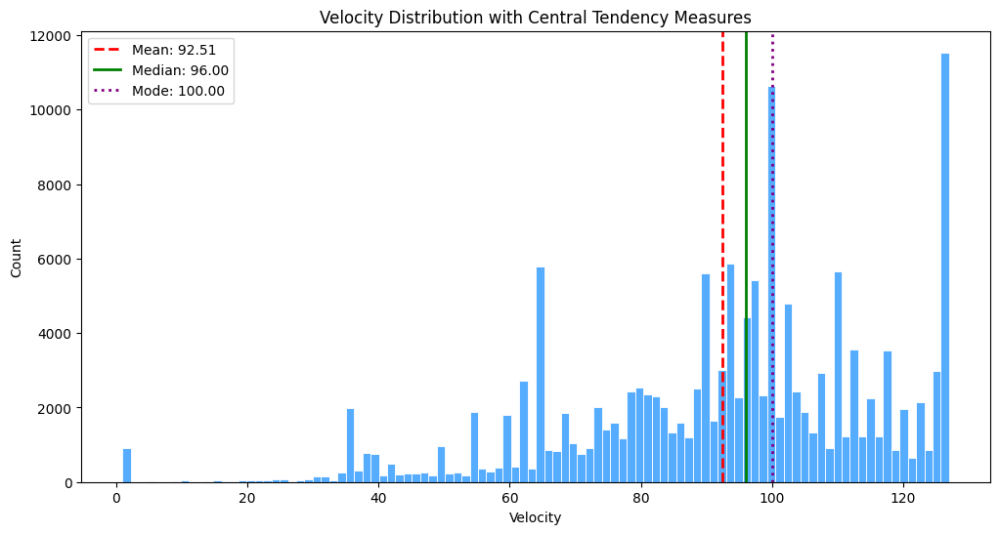

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(df_notes_only['velocity'], bins=100, color='dodgerblue', edgecolor='white')

# Add lines for mean, median, and mode
plt.axvline(mean_velocity, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_velocity:.2f}')
plt.axvline(median_velocity, color='green', linestyle='-', linewidth=2, label=f'Median: {median_velocity:.2f}')
plt.axvline(mode_velocity, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_velocity:.2f}')

plt.title('Velocity Distribution with Central Tendency Measures')
plt.xlabel('Velocity')
plt.ylabel('Count')
plt.legend()
plt.show()

##### 2.3.20.2 Temporal Distribution of Velocity (by Measure)

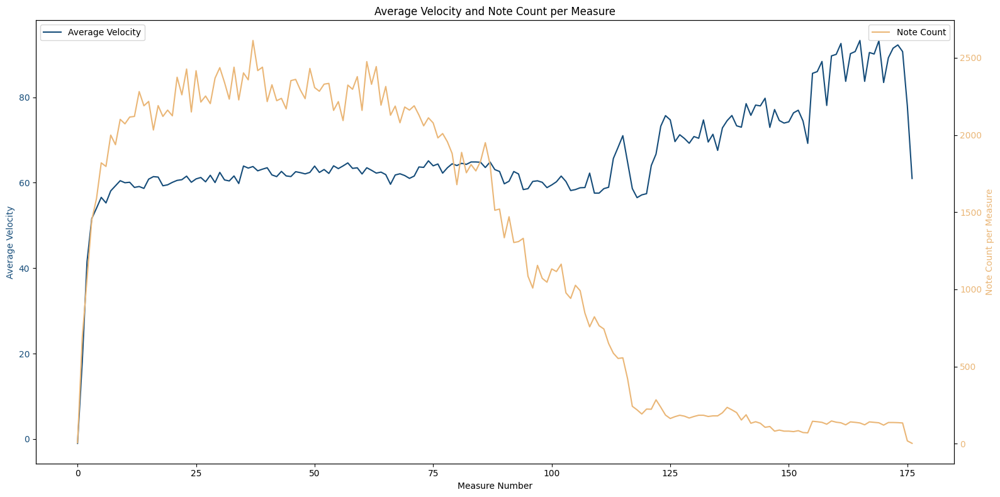

In [ ]:
# Group by measure number to compute average velocity and note count
measure_stats = df.groupby('measure').agg(
    average_velocity=('velocity', 'mean'),
    note_count=('velocity', 'count')
).reset_index()

fig, ax1 = plt.subplots(figsize=(16, 8))

sns.lineplot(data=measure_stats, x='measure', y='average_velocity', ax=ax1, color=colors[0], label='Average Velocity')
ax1.set_ylabel('Average Velocity', color=colors[0])
ax1.tick_params(axis='y', labelcolor=colors[0])

ax2 = ax1.twinx()
sns.lineplot(data=measure_stats, x='measure', y='note_count', ax=ax2, color=colors[1], label='Note Count')
ax2.set_ylabel('Note Count per Measure', color=colors[1])
ax2.tick_params(axis='y', labelcolor=colors[1])

plt.title('Average Velocity and Note Count per Measure')
ax1.set_xlabel('Measure Number')
plt.tight_layout()
plt.show()

##### 2.3.20.3 Outlier Detection in Velocity Values

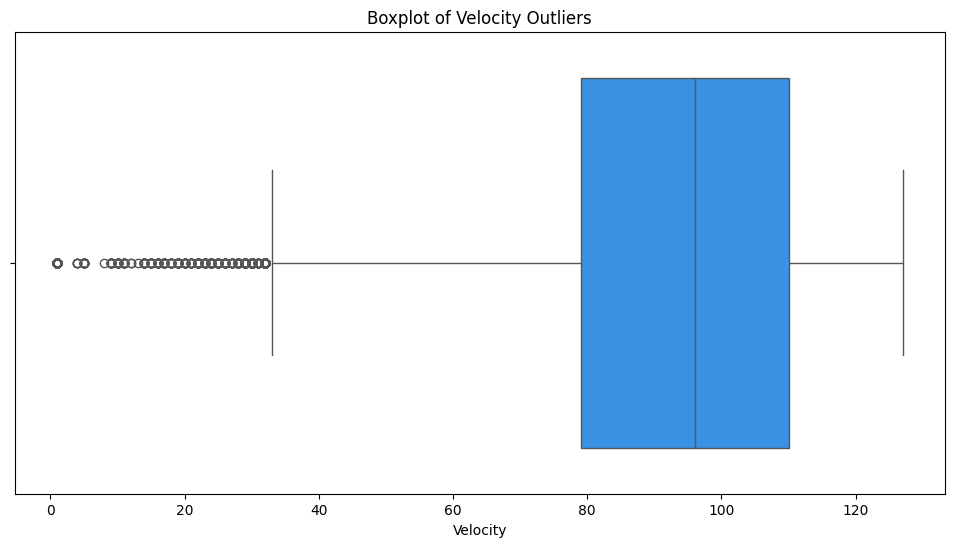

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_notes_only['velocity'], color='dodgerblue')
plt.title('Boxplot of Velocity Outliers')
plt.xlabel('Velocity')
plt.show()

##### 2.3.20.4 Velocity in Context: Key, Instrument, and Genre

In [ ]:
# Descriptive statistics of velocity values by key
print("Velocity statistics by Key:")
df_notes_only.groupby('key')['velocity'].describe().sort_index()

Velocity statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,7878.0,76.292968,15.493301,1.0,64.0,73.0,94.0,127.0
1,8535.0,94.454599,16.095138,66.0,80.0,95.0,106.0,127.0
2,5075.0,106.036256,10.793684,100.0,100.0,100.0,100.0,127.0
3,20526.0,95.848582,22.313518,4.0,77.0,100.0,110.0,127.0
4,12090.0,72.609760,26.947250,1.0,55.0,66.0,96.0,126.0
5,7353.0,97.282334,15.760741,8.0,87.0,99.0,110.0,127.0
6,4806.0,91.710778,18.341857,1.0,91.0,97.0,99.0,104.0
7,1729.0,78.921920,10.170720,38.0,74.0,80.0,86.0,102.0
9,3803.0,112.264791,29.907047,10.0,125.0,125.0,125.0,127.0


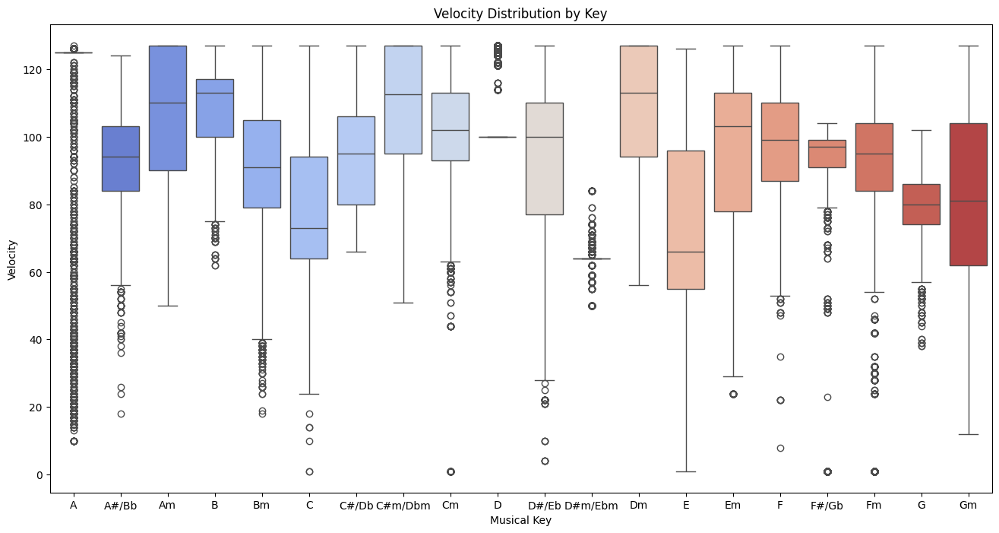

In [ ]:
# Velocity distribution across keys to show tonal variation
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='key_name', y='velocity', order=ordered_key_names, palette='coolwarm')
plt.title('Velocity Distribution by Key')
plt.xlabel('Musical Key')
plt.ylabel('Velocity')
plt.show()


In [ ]:
# Descriptive statistics of velocity values by instrument
print("Velocity statistics by Instrument:")
df_notes_only.groupby('instrument')['velocity'].describe()

Velocity statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,13103.0,89.490193,17.688498,50.0,79.0,90.0,100.0,127.0
Bagpipes,4865.0,95.078314,15.166437,45.0,91.0,96.0,102.0,127.0
Bassoon,1729.0,78.921920,10.170720,38.0,74.0,80.0,86.0,102.0
Celesta,4496.0,107.709297,17.789894,56.0,94.0,113.0,127.0,127.0
Choir,1537.0,86.207547,12.429928,39.0,82.0,86.0,94.0,127.0
Clarinet,998.0,75.295591,30.561837,17.0,40.0,96.0,96.0,115.0
Electric Bass,3903.0,94.036638,15.623401,42.0,84.0,95.0,104.0,127.0
Electric Guitar,15118.0,97.471623,18.431337,1.0,87.0,99.0,112.0,127.0
Electric Organ,2280.0,116.928070,12.147734,72.0,100.0,117.0,127.0,127.0


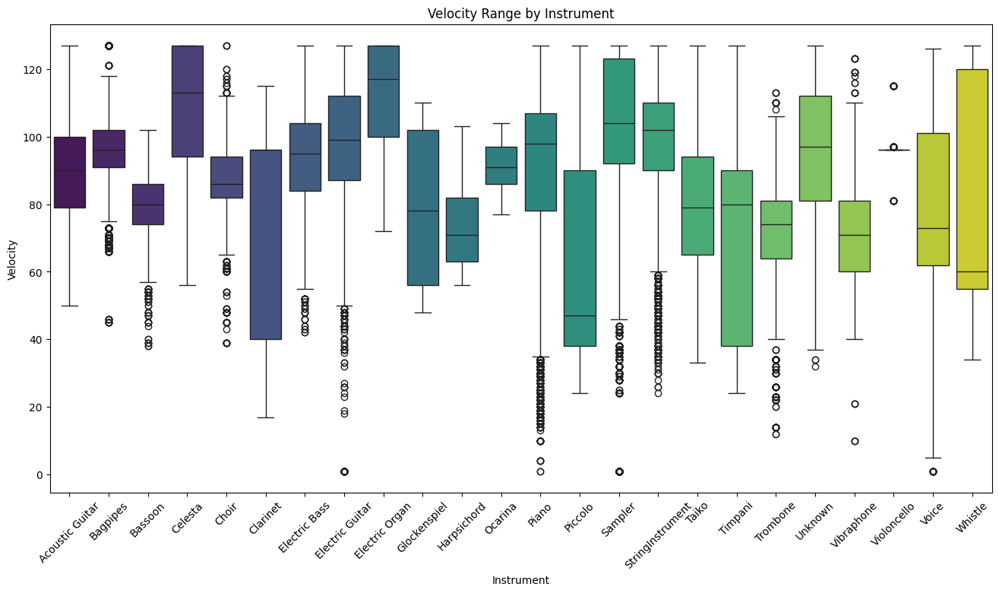

In [ ]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument', y='velocity', palette='viridis', order=alphabetic_order)
plt.xticks(rotation=45)
plt.title('Velocity Range by Instrument')
plt.xlabel('Instrument')
plt.ylabel('Velocity')
plt.show()

In [ ]:
# Descriptive statistics of velocity by instrument family
print("Velocity statistics by Instrument Family:")
df_notes_only.groupby('instrument_family')['velocity'].describe()

Velocity statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,3903.0,94.036638,15.623401,42.0,84.0,95.0,104.0,127.0
Brass,4529.0,72.843674,16.623848,12.0,64.0,74.0,81.0,113.0
Electronic,26781.0,101.421456,25.399378,1.0,92.0,104.0,123.0,127.0
Guitar,28221.0,93.765848,18.522692,1.0,81.0,96.0,106.0,127.0
Keyboard,45757.0,95.888957,23.155976,1.0,82.0,100.0,114.0,127.0
Other,10323.0,93.233459,17.614759,10.0,81.0,95.0,106.0,127.0
Percussion,3637.0,76.350564,24.535756,24.0,59.0,80.0,90.0,127.0
Strings,6812.0,97.636377,15.460856,24.0,90.0,101.0,110.0,127.0
Voice,13006.0,77.187990,26.473454,1.0,62.0,84.0,100.0,127.0


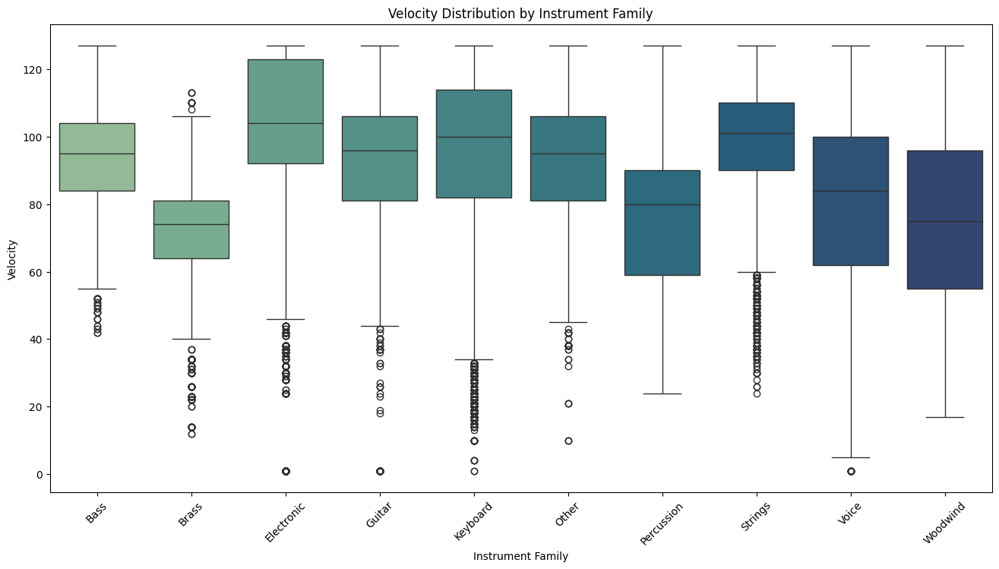

In [ ]:
# Filter and plot velocity distribution by instrument family
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='instrument_family', y='velocity', palette='crest', order=families)
plt.title('Velocity Distribution by Instrument Family')
plt.xlabel('Instrument Family')
plt.ylabel('Velocity')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Descriptive statistics of velocity by genre
print("Velocity statistics by Genre:")
df_notes_only.groupby('genre')['velocity'].describe()

Velocity statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,7460.0,105.880563,25.122786,17.0,96.0,115.0,127.0,127.0
blues,6788.0,89.926783,15.297514,18.0,81.0,91.0,101.0,127.0
classical,6371.0,101.924031,27.278157,10.0,82.0,111.0,125.0,127.0
country,14654.0,95.451686,24.291041,1.0,82.0,98.0,106.0,127.0
dance,6910.0,95.152388,16.162273,51.0,80.0,95.0,107.0,127.0
disco,9062.0,105.073604,16.613759,44.0,92.0,107.0,117.0,127.0
heavy_metal,6189.0,102.131039,26.603753,50.0,64.0,115.0,127.0,127.0
jazz,9756.0,78.093686,19.393919,1.0,64.0,81.0,90.0,127.0
new_age,12816.0,80.677278,24.964164,10.0,63.0,88.0,98.0,127.0


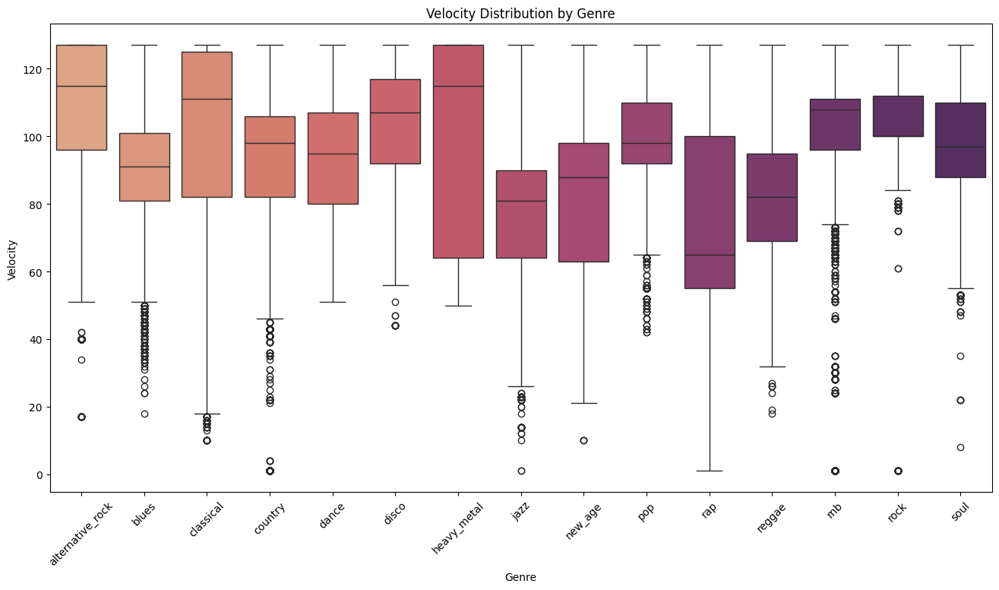

In [ ]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df_notes_only, x='genre', y='velocity', palette='flare', order=genres_sorted)
plt.title('Velocity Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Velocity')
plt.xticks(rotation=45)
plt.show()

##### 2.3.20.5 Correlation Between Velocity and Other Musical Features

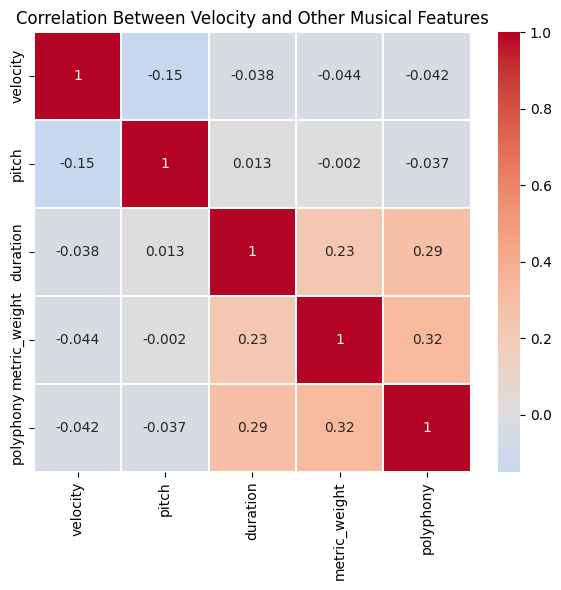

In [ ]:
# Select relevant numeric features to check correlations with velocity
velo_corr_matrix = df_notes_only[['velocity', 'pitch', 'duration', 'metric_weight', 'polyphony']].corr()

plt.figure(figsize=(6, 6))
sns.heatmap(velo_corr_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.2)
plt.title("Correlation Between Velocity and Other Musical Features")
plt.tight_layout()
plt.show()


##### 2.3.20.6 Metric Weight vs Note Velocity

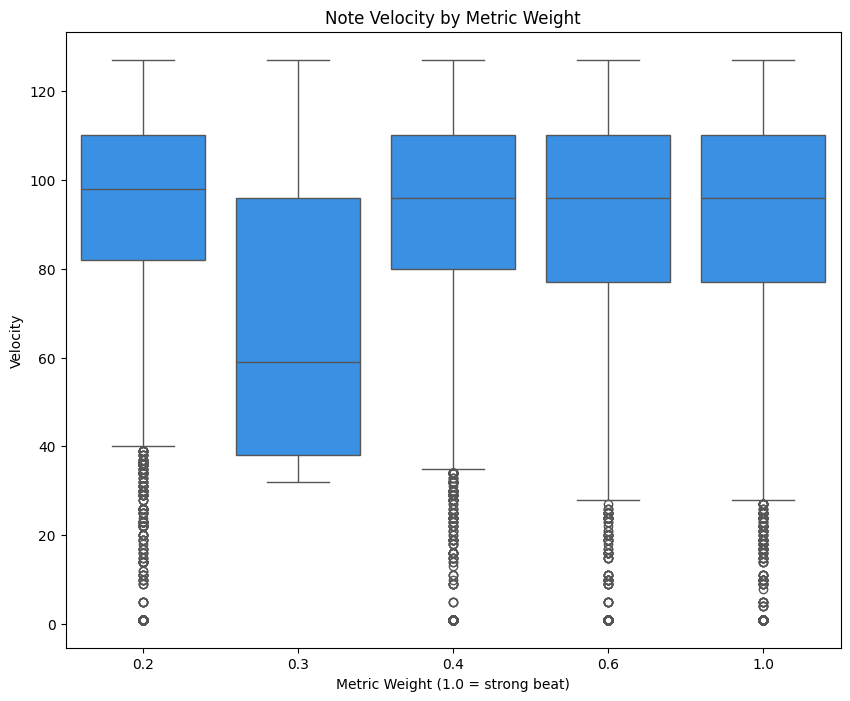

In [ ]:
# Create a boxplot showing how note velocity varies with metric weight
plt.figure(figsize=(10, 8))
sns.boxplot(data=df_notes_only, x="metric_weight", y="velocity", color='dodgerblue')
plt.title("Note Velocity by Metric Weight")
plt.xlabel("Metric Weight (1.0 = strong beat)")
plt.ylabel("Velocity")
plt.show()

##### 2.3.20.7 Average Note Velocity by Polyphony and Metric Weight

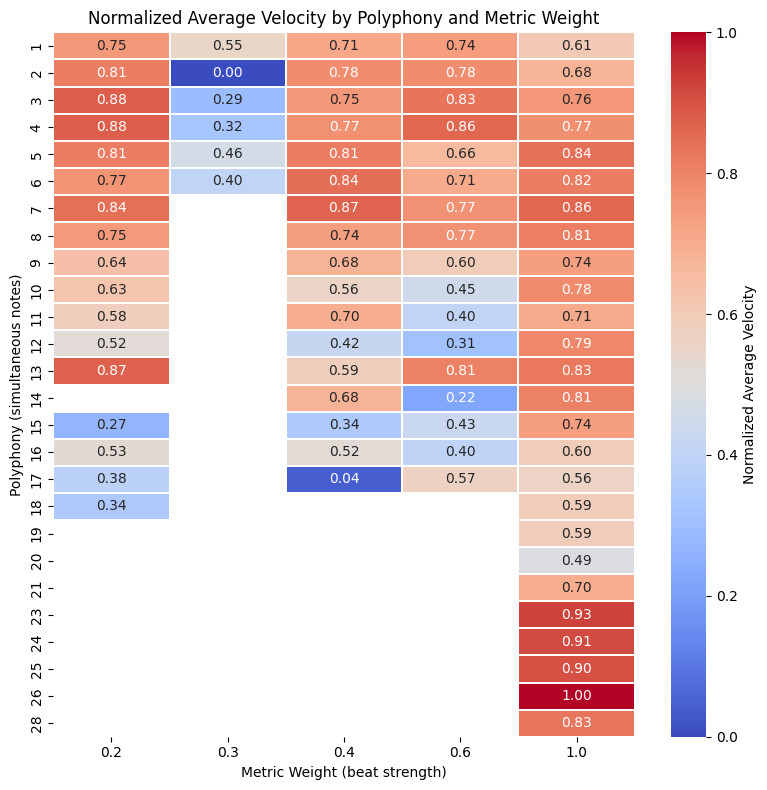

In [ ]:
# Create the pivot table
pivot = df_notes_only.pivot_table(
    values="velocity",
    index="polyphony",
    columns="metric_weight",
    aggfunc="mean"
)

# Apply global min-max normalization
normalized_pivot = (pivot - pivot.min().min()) / (pivot.max().max() - pivot.min().min())

# Plot the heatmap
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(normalized_pivot, cmap='coolwarm', annot=True, fmt=".2f", ax=ax, linewidths=0.2, cbar_kws={"label": "Normalized Average Velocity"})

# Add title and labels
plt.title("Normalized Average Velocity by Polyphony and Metric Weight")
plt.xlabel("Metric Weight (beat strength)")
plt.ylabel("Polyphony (simultaneous notes)")
plt.tight_layout()
plt.show()

#### 2.3.21. Rests

##### 2.3.21.1 Central Tendency and Spread of Rests


In [ ]:
# Descriptive stats: proportion and spread of rests
df['is_rest'].describe()

count    223830.000000
mean          0.326212
std           0.468827
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: is_rest, dtype: float64

In [ ]:
# Central tendency
mean_rest = df['is_rest'].mean()
median_rest = df['is_rest'].median()
mode_rest = df['is_rest'].mode()[0]  

# Spread
std_rest = df['is_rest'].std()

# Display results
print(f"Mean rest: {mean_rest:.2f}")
print(f"Median rest: {median_rest:.2f}")
print(f"Mode rest: {mode_rest:.2f}")
print(f"Standard rest: {std_rest:.2f}")

Mean rest: 0.33
Median rest: 0.00
Mode rest: 0.00
Standard rest: 0.47


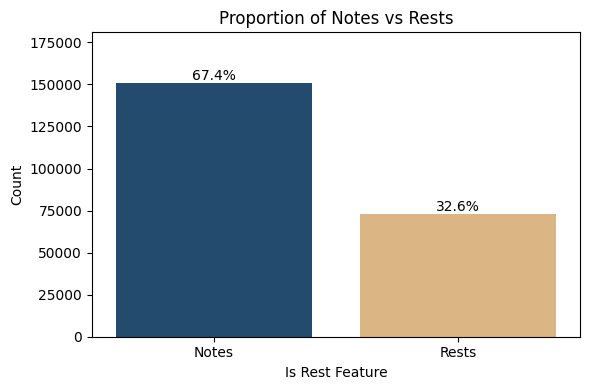

In [ ]:
# Count the number of occurrences for each mode
total_rest_values = df['is_rest'].value_counts().sum()
rest_custom_labels = ["Notes", "Rests"]

# Plot distribution of rests
plt.figure(figsize=(6, 4))
ax = sns.countplot(data=df, x='is_rest', palette=colors)
ax.set_xticklabels(rest_custom_labels)
plt.title("Proportion of Notes vs Rests")
plt.xlabel("Is Rest Feature")
plt.ylabel("Count")

# Annotate bars with percentage labels
for p in ax.patches:
    count = p.get_height()
    percentage = 100 * count / total_rest_values
    ax.annotate(f'{percentage:.1f}%', 
                (p.get_x() + p.get_width() / 2, count),
                ha='center', va='bottom', fontsize=10)
plt.ylim(0, max(df['is_rest'].value_counts()) * 1.2)
plt.tight_layout()
plt.show()

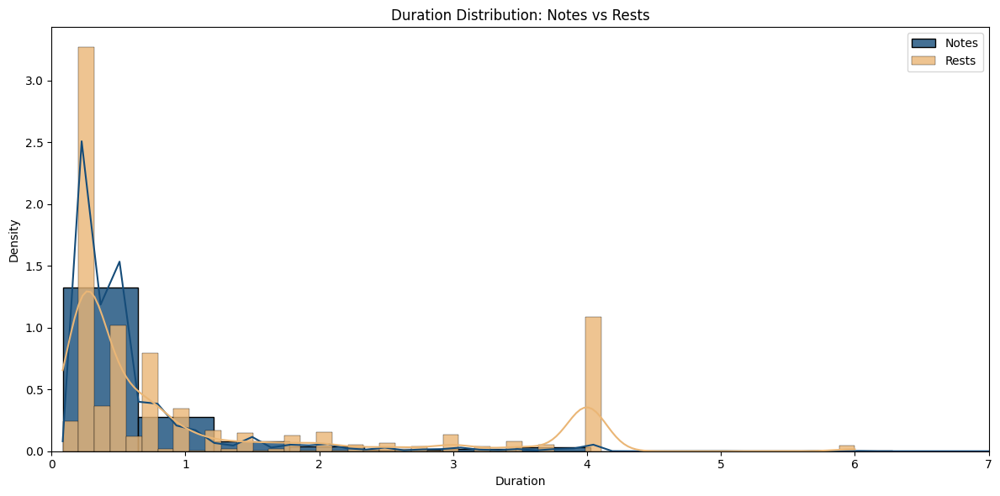

In [ ]:
plt.figure(figsize=(12, 6))

# Plot duration distribution for notes (is_rest == 0)
sns.histplot(
    df.loc[df['is_rest'] == 0, 'duration'],
    color=colors[0],
    label='Notes',
    bins=50,
    kde=True,
    stat='density',
    alpha=0.8
)

# Plot duration distribution for rests (is_rest == 1)
sns.histplot(
    df.loc[df['is_rest'] == 1, 'duration'],
    color=colors[1],
    label='Rests',
    bins=50,
    kde=True,
    stat='density',
    alpha=0.8
)

plt.title('Duration Distribution: Notes vs Rests')
plt.xlabel('Duration')
plt.ylabel('Density')
plt.xlim(0, 7)  # Limit x-axis to focus on relevant duration range
plt.legend()
plt.tight_layout()
plt.show()

##### 2.3.21.2 Temporal Distribution of Velocity (by Measure)

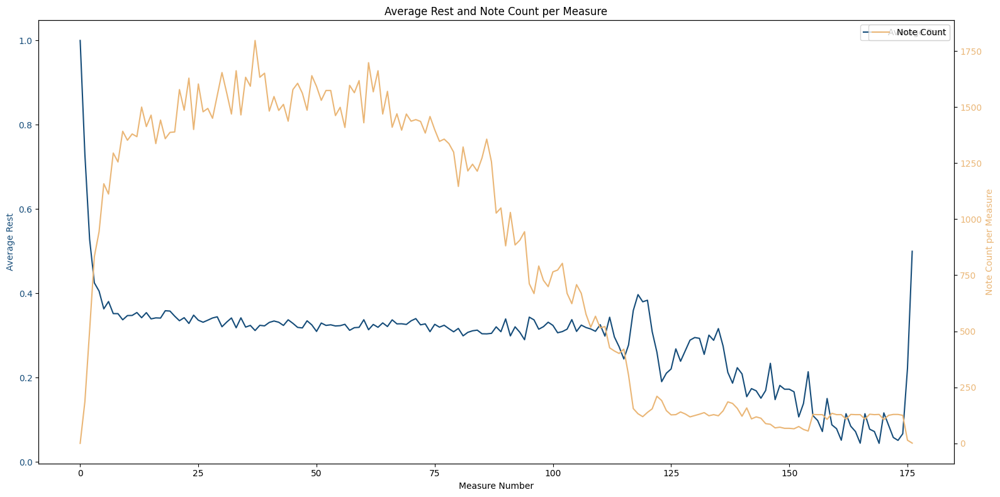

In [ ]:
# Group by measure number to compute average rest and note count
measure_stats = df.groupby('measure').agg(
    average_rest=('is_rest', 'mean'),
    note_count=('is_rest', lambda x: (x == 0).sum())
).reset_index()

fig, ax1 = plt.subplots(figsize=(16, 8))

sns.lineplot(data=measure_stats, x='measure', y='average_rest', ax=ax1, color=colors[0], label='Average Rest')
ax1.set_ylabel('Average Rest', color=colors[0])
ax1.tick_params(axis='y', labelcolor=colors[0])

ax2 = ax1.twinx()
sns.lineplot(data=measure_stats, x='measure', y='note_count', ax=ax2, color=colors[1], label='Note Count')
ax2.set_ylabel('Note Count per Measure', color=colors[1])
ax2.tick_params(axis='y', labelcolor=colors[1])

plt.title('Average Rest and Note Count per Measure')
ax1.set_xlabel('Measure Number')
plt.tight_layout()
plt.show()

##### 2.3.21.3 Rest in Context: Key, Instrument, and Genre

In [ ]:
# Descriptive statistics of rests by key
print("Rest statistics by Key:")
df.groupby('key')['is_rest'].describe().sort_index()

Rest statistics by Key:


,count,mean,std,min,25%,50%,75%,max
key,,,,,,,,
0,11652.0,0.323893,0.467980,0.0,0.0,0.0,1.0,1.0
1,12046.0,0.291466,0.454457,0.0,0.0,0.0,1.0,1.0
2,6587.0,0.229543,0.420571,0.0,0.0,0.0,0.0,1.0
3,32432.0,0.367107,0.482023,0.0,0.0,0.0,1.0,1.0
4,17937.0,0.325974,0.468751,0.0,0.0,0.0,1.0,1.0
5,11837.0,0.378812,0.485112,0.0,0.0,0.0,1.0,1.0
6,6411.0,0.250351,0.433249,0.0,0.0,0.0,1.0,1.0
7,2628.0,0.342085,0.474498,0.0,0.0,0.0,1.0,1.0
9,5482.0,0.306275,0.460987,0.0,0.0,0.0,1.0,1.0


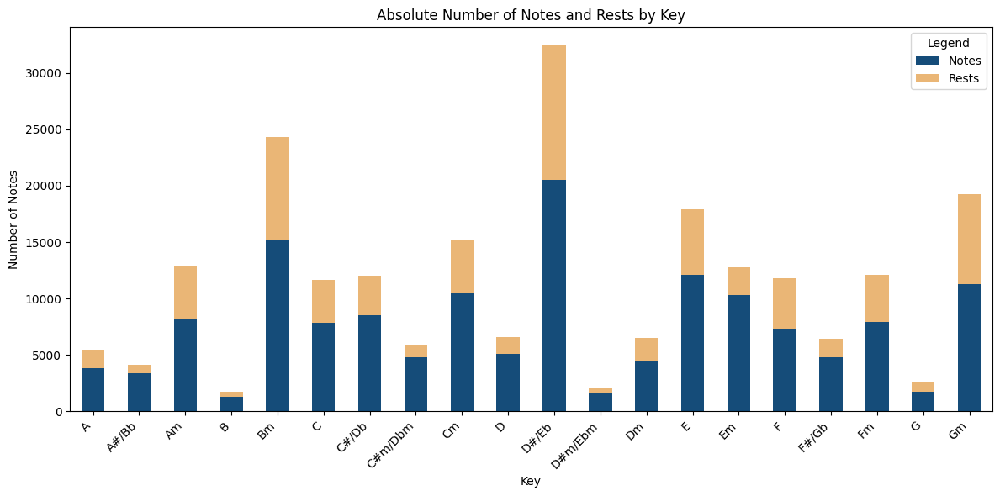

In [ ]:
# Count rests and normalize per key
key_rest_counts = df.groupby(["key_name", "is_rest"]).size().unstack(fill_value=0)
    
# Rest distribution across keys to show tonal variation
key_rest_counts.plot(kind="bar", stacked=True, figsize=(12, 6), color=colors)

plt.title("Absolute Number of Notes and Rests by Key")
plt.xlabel("Key")
plt.ylabel("Number of Notes")
plt.legend(title="Legend", labels=['Notes', 'Rests'], loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In [ ]:
# Descriptive statistics of rests by instrument
print("Rest statistics by Instrument:")
df.groupby('instrument')['is_rest'].describe()

Rest statistics by Instrument:


,count,mean,std,min,25%,50%,75%,max
instrument,,,,,,,,
Acoustic Guitar,18986.0,0.309860,0.462448,0.0,0.0,0.0,1.0,1.0
Bagpipes,6886.0,0.293494,0.455396,0.0,0.0,0.0,1.0,1.0
Bassoon,2605.0,0.336276,0.472525,0.0,0.0,0.0,1.0,1.0
Brass,3.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
Celesta,6501.0,0.308414,0.461874,0.0,0.0,0.0,1.0,1.0
Choir,2805.0,0.452050,0.497784,0.0,0.0,0.0,1.0,1.0
Clarinet,1134.0,0.119929,0.325022,0.0,0.0,0.0,0.0,1.0
Electric Bass,6534.0,0.402663,0.490472,0.0,0.0,0.0,1.0,1.0
Electric Guitar,21234.0,0.288029,0.452855,0.0,0.0,0.0,1.0,1.0


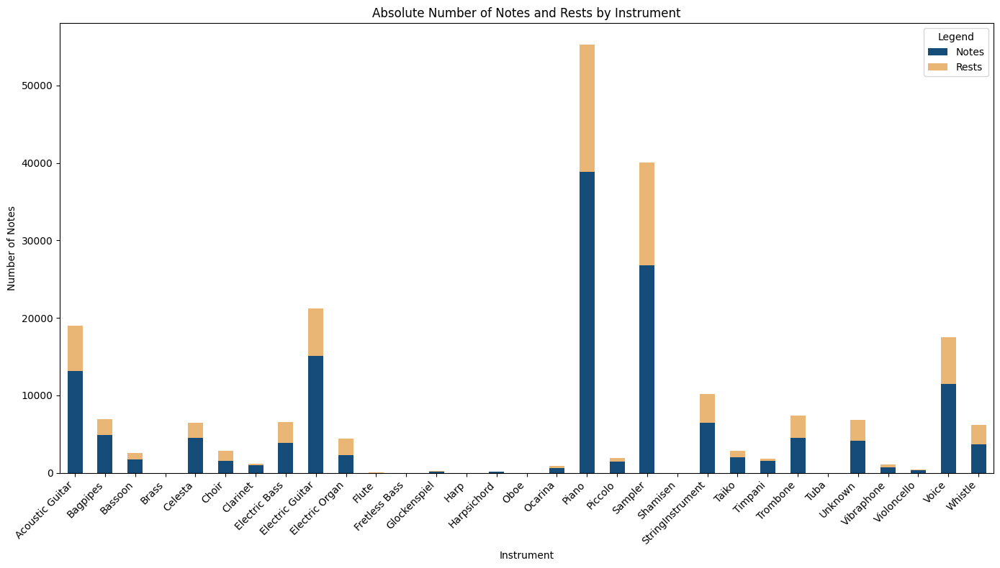

In [ ]:
# Count rests and normalize per instrument
instrument_rest_counts = df.groupby(["instrument", "is_rest"]).size().unstack(fill_value=0)
    
# Rest distribution across instruments to show tonal variation
instrument_rest_counts.plot(kind="bar", stacked=True, figsize=(14, 8), color=colors)

plt.title("Absolute Number of Notes and Rests by Instrument")
plt.xlabel("Instrument")
plt.ylabel("Number of Notes")
plt.legend(title="Legend", labels=['Notes', 'Rests'], loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In [ ]:
# Descriptive statistics of rests by instrument family
print("Rest statistics by Instrument Family:")
df.groupby('instrument_family')['is_rest'].describe()

Rest statistics by Instrument Family:


,count,mean,std,min,25%,50%,75%,max
instrument_family,,,,,,,,
Bass,6535.0,0.402754,0.490490,0.0,0.0,0.0,1.0,1.0
Brass,7357.0,0.384396,0.486485,0.0,0.0,0.0,1.0,1.0
Electronic,40007.0,0.330592,0.470432,0.0,0.0,0.0,1.0,1.0
Guitar,40220.0,0.298334,0.457533,0.0,0.0,0.0,1.0,1.0
Keyboard,66387.0,0.310754,0.462806,0.0,0.0,0.0,1.0,1.0
Other,15707.0,0.342777,0.474653,0.0,0.0,0.0,1.0,1.0
Percussion,4958.0,0.266438,0.442141,0.0,0.0,0.0,1.0,1.0
Strings,10598.0,0.357237,0.479208,0.0,0.0,0.0,1.0,1.0
Voice,20281.0,0.358710,0.479634,0.0,0.0,0.0,1.0,1.0


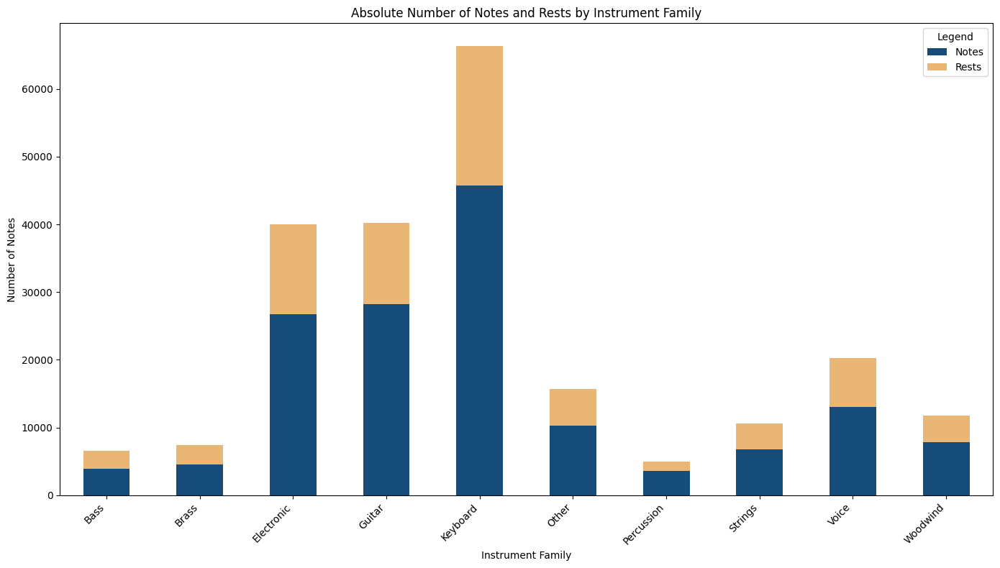

In [ ]:
# Count rests and normalize per instrument family
instrument_fam_rest_counts = df.groupby(["instrument_family", "is_rest"]).size().unstack(fill_value=0)
    
# Rest distribution across instruments to show tonal variation
instrument_fam_rest_counts.plot(kind="bar", stacked=True, figsize=(14, 8), color=colors)

plt.title("Absolute Number of Notes and Rests by Instrument Family")
plt.xlabel("Instrument Family")
plt.ylabel("Number of Notes")
plt.legend(title="Legend", labels=['Notes', 'Rests'], loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In [ ]:
# Descriptive statistics of rests by genre
print("Rest statistics by Genre:")
df.groupby('genre')['is_rest'].describe()

Rest statistics by Genre:


,count,mean,std,min,25%,50%,75%,max
genre,,,,,,,,
alternative_rock,8878.0,0.159721,0.366367,0.0,0.0,0.0,0.0,1.0
blues,10184.0,0.333464,0.471474,0.0,0.0,0.0,1.0,1.0
classical,10173.0,0.373734,0.483818,0.0,0.0,0.0,1.0,1.0
country,20690.0,0.291735,0.454572,0.0,0.0,0.0,1.0,1.0
dance,9658.0,0.284531,0.451214,0.0,0.0,0.0,1.0,1.0
disco,13343.0,0.320842,0.466818,0.0,0.0,0.0,1.0,1.0
heavy_metal,10838.0,0.428954,0.494950,0.0,0.0,0.0,1.0,1.0
jazz,15127.0,0.355060,0.478547,0.0,0.0,0.0,1.0,1.0
new_age,17543.0,0.269452,0.443688,0.0,0.0,0.0,1.0,1.0


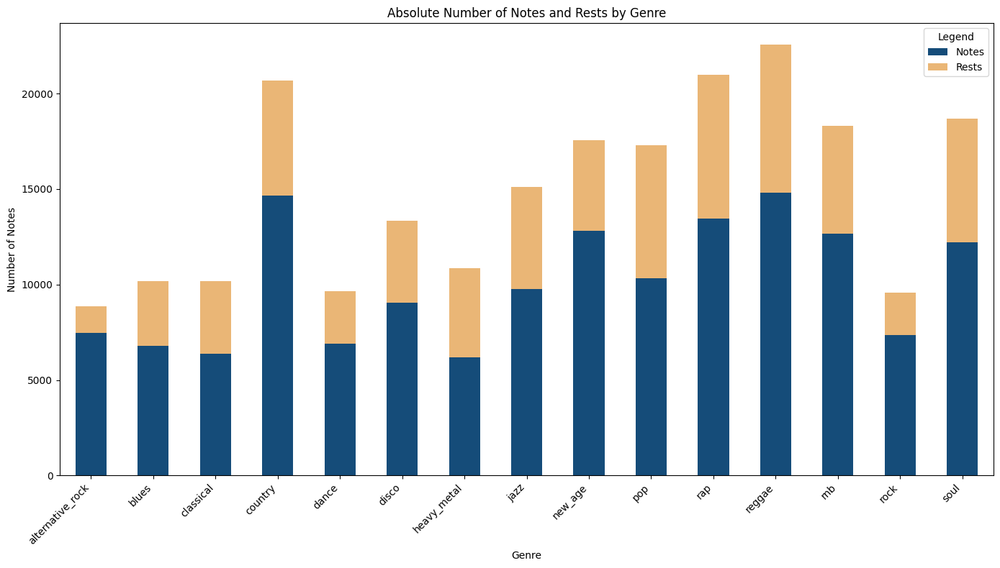

In [ ]:
# Count rests and normalize per genre
genre_rest_counts = df.groupby(["genre", "is_rest"]).size().unstack(fill_value=0)
    
# Rest distribution across instruments to show tonal variation
genre_rest_counts.plot(kind="bar", stacked=True, figsize=(14, 8), color=colors)

plt.title("Absolute Number of Notes and Rests by Genre")
plt.xlabel("Genre")
plt.ylabel("Number of Notes")
plt.legend(title="Legend", labels=['Notes', 'Rests'], loc="upper right")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


##### 2.3.21.4 Correlation Between Rests and Other Musical Features

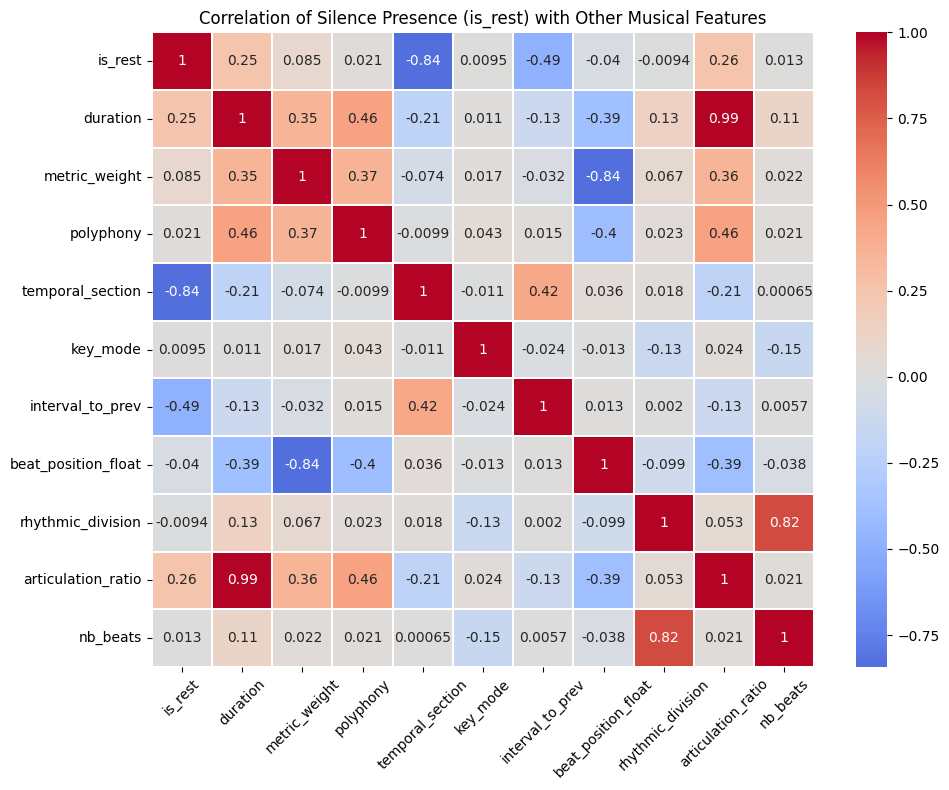

In [ ]:
# Select relevant numeric features to check correlations with velocity
df_corr = df[['is_rest', 'duration', 'metric_weight', 'polyphony', 
              'temporal_section', 'key_mode', 'interval_to_prev', 
              'beat_position_float', 'rhythmic_division', 'articulation_ratio', 'nb_beats']].copy()

# Encode categorical variables as numeric codes
for col in ['temporal_section', 'key_mode']:
    df_corr[col] = df_corr[col].astype('category').cat.codes

rest_corr_matrix = df_corr.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(rest_corr_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.2)
plt.title("Correlation of Silence Presence (is_rest) with Other Musical Features")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### 2.3.22 Genre

##### 2.3.22.1 Genre Frequency and Temporal Behavior

In [ ]:
# Number of genres
print("Number of genre:", df['genre'].nunique())

# Frequency of each genre
genre_counts = df['genre'].value_counts()
print("\n", genre_counts)

Number of genre: 15

 genre
reggae              22552
rap                 20989
country             20690
soul                18681
rnb                 18310
new_age             17543
pop                 17299
jazz                15127
disco               13343
heavy_metal         10838
blues               10184
classical           10173
dance                9658
rock                 9565
alternative_rock     8878
Name: count, dtype: int64


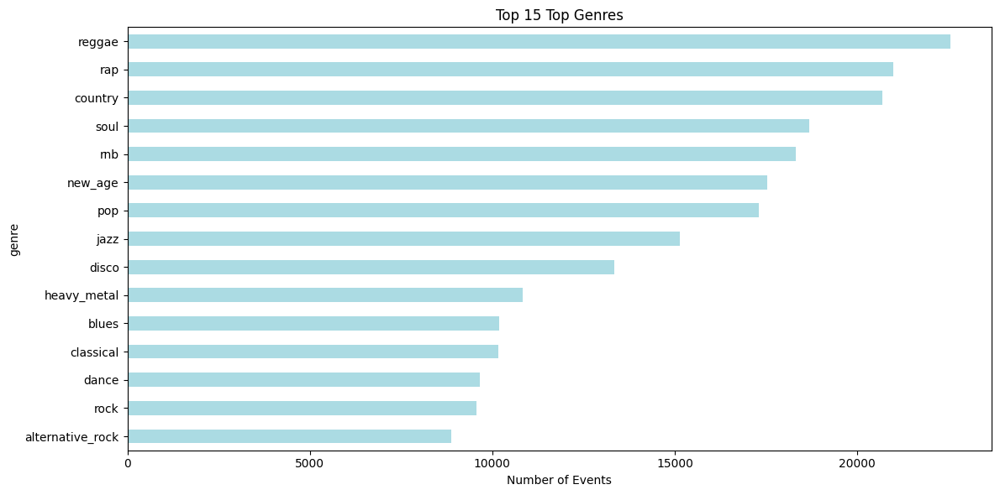

In [ ]:
# Plot top 15 genres
top_n = 15
plt.figure(figsize=(12, 6))
genre_counts.head(top_n).plot(kind='barh', color=colors[2])
plt.title(f'Top {top_n} Top Genres')
plt.xlabel('Number of Events')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

##### 2.3.22.2 Expressive Features by Genre


VELOCITY by Genre (mean):


genre
alternative_rock    88.809529
rock                81.437533
disco               71.040695
rnb                 68.260841
dance               67.794057
country             67.313340
classical           63.457780
soul                62.626358
blues               59.605951
pop                 58.917394
Name: velocity, dtype: float64

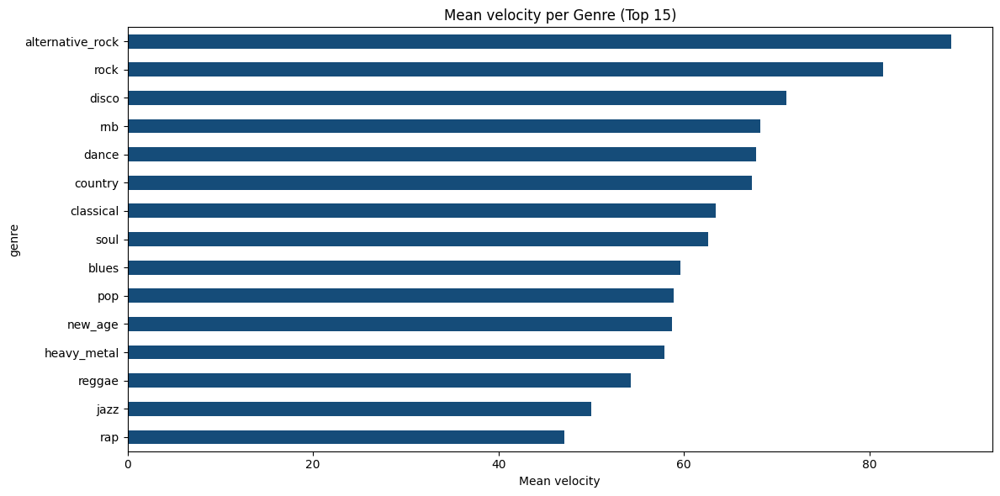


ARTICULATION_RATIO by Genre (mean):


genre
pop                 0.259622
new_age             0.258284
jazz                0.230902
disco               0.228895
rnb                 0.212180
heavy_metal         0.199076
soul                0.189282
classical           0.186322
country             0.180989
alternative_rock    0.178522
Name: articulation_ratio, dtype: float64

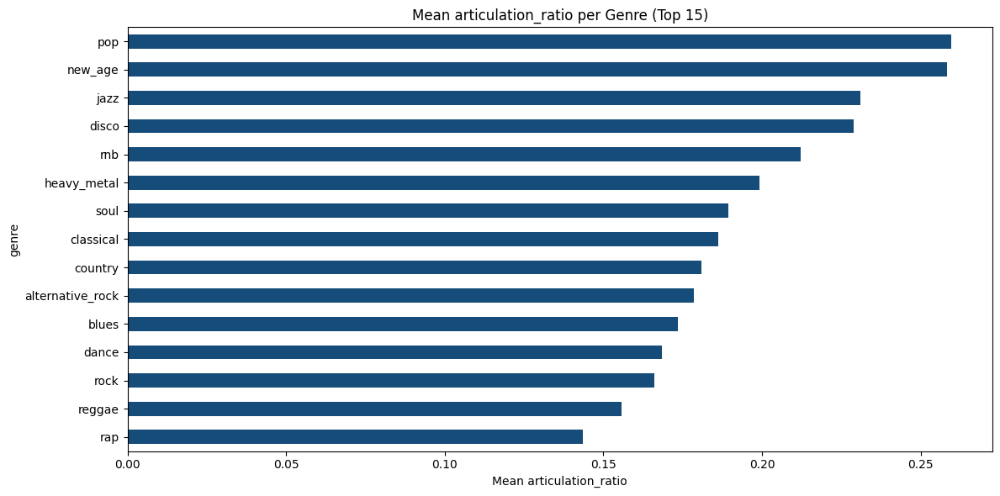


METRIC_WEIGHT by Genre (mean):


genre
new_age             0.674252
pop                 0.639447
disco               0.623338
classical           0.619365
rnb                 0.615216
rap                 0.612283
heavy_metal         0.609522
jazz                0.608422
rock                0.601924
alternative_rock    0.597905
Name: metric_weight, dtype: float64

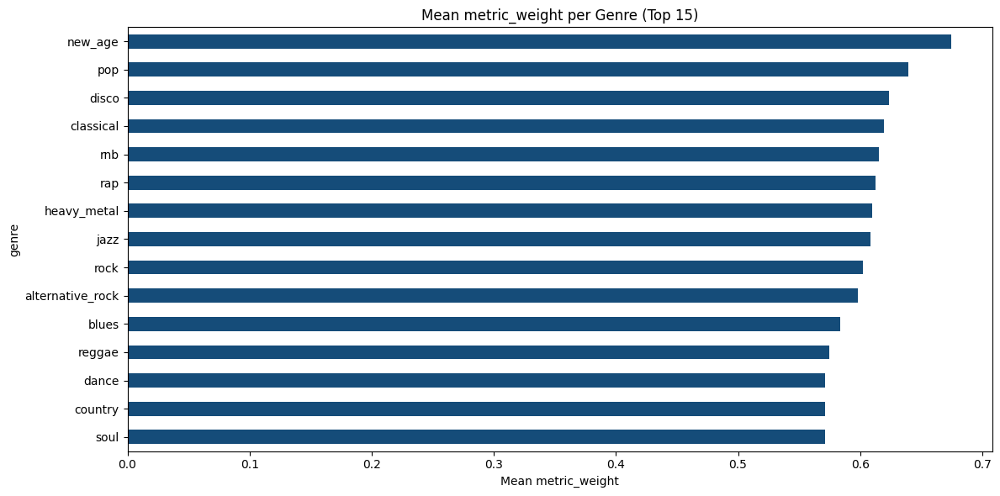


IS_CHORD_TONE by Genre (mean):


genre
country             0.493862
reggae              0.491265
soul                0.478293
rap                 0.465244
new_age             0.457561
alternative_rock    0.452692
dance               0.444916
rock                0.444328
disco               0.435809
blues               0.412804
Name: is_chord_tone, dtype: float64

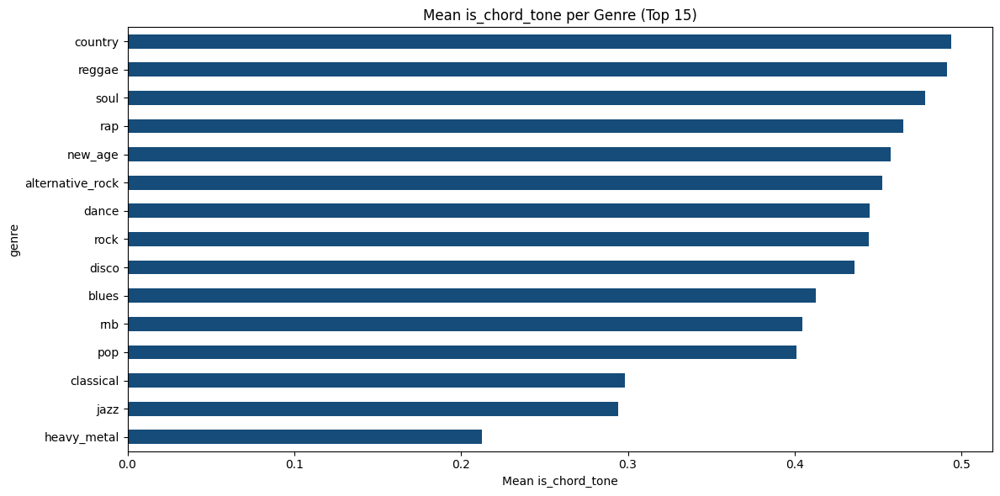

In [ ]:
# Define the relevant expressive features you already have
expressive_features = ['velocity', 'articulation_ratio', 'metric_weight', 'is_chord_tone']

for feature in expressive_features:
    print(f"\n{feature.upper()} by Genre (mean):")
    display(df.groupby('genre')[feature].mean().sort_values(ascending=False).head(10))

    # Barplot of top 15 genres by feature
    plt.figure(figsize=(12, 6))
    df.groupby('genre')[feature].mean().sort_values(ascending=False).head(15).plot(kind='barh', color=colors[0])
    plt.title(f'Mean {feature} per Genre (Top 15)')
    plt.xlabel(f'Mean {feature}')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

##### 2.3.22.3 Feature Variability by Genre


VELOCITY by Genre (STD):


genre
heavy_metal         54.860666
classical           54.274012
rnb                 51.394890
disco               51.374999
pop                 50.768940
country             48.375861
soul                48.051475
rock                46.703674
dance               45.488152
alternative_rock    45.427402
Name: velocity, dtype: float64

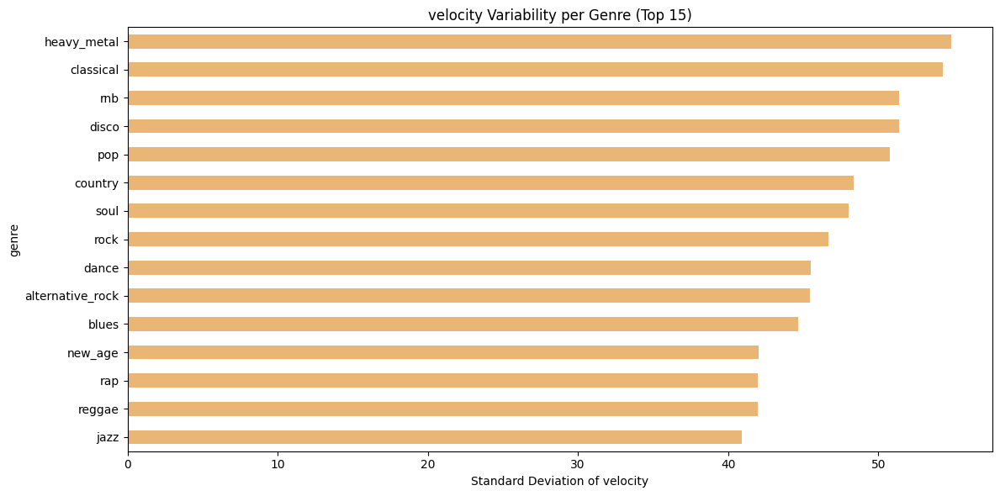


ARTICULATION_RATIO by Genre (STD):


genre
new_age        0.311435
disco          0.306829
pop            0.286607
rnb            0.271817
heavy_metal    0.235825
soul           0.229919
jazz           0.229874
classical      0.229113
rock           0.223733
rap            0.211593
Name: articulation_ratio, dtype: float64

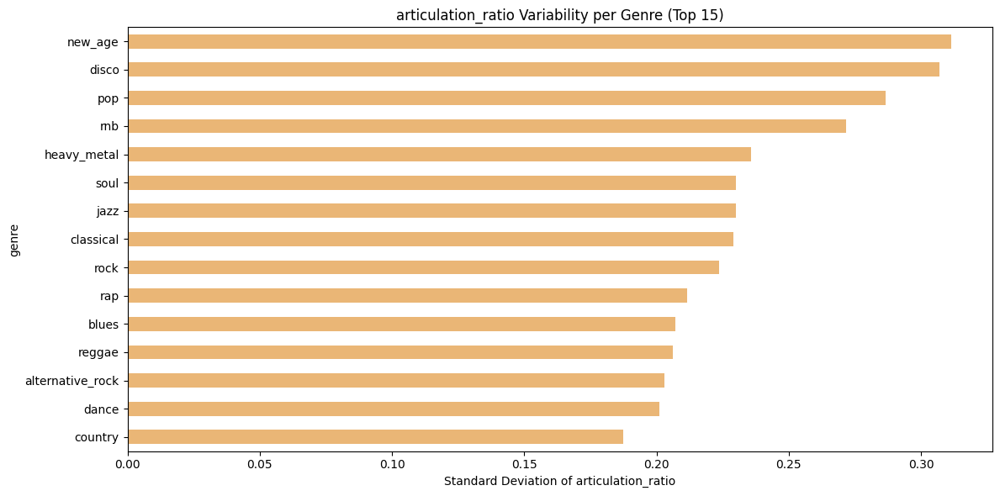


METRIC_WEIGHT by Genre (STD):


genre
pop                 0.322477
heavy_metal         0.320764
rnb                 0.318350
jazz                0.312388
disco               0.311847
reggae              0.311157
blues               0.311071
alternative_rock    0.309265
dance               0.309192
soul                0.308901
Name: metric_weight, dtype: float64

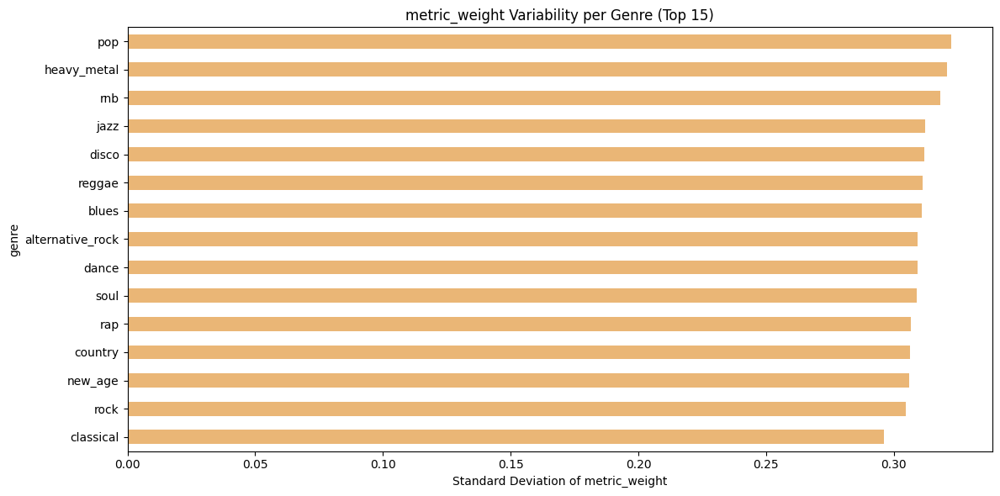


IS_CHORD_TONE by Genre (STD):


genre
country             0.499974
reggae              0.499935
soul                0.499542
rap                 0.498802
new_age             0.498210
alternative_rock    0.497785
dance               0.496982
rock                0.496917
disco               0.495881
blues               0.492362
Name: is_chord_tone, dtype: float64

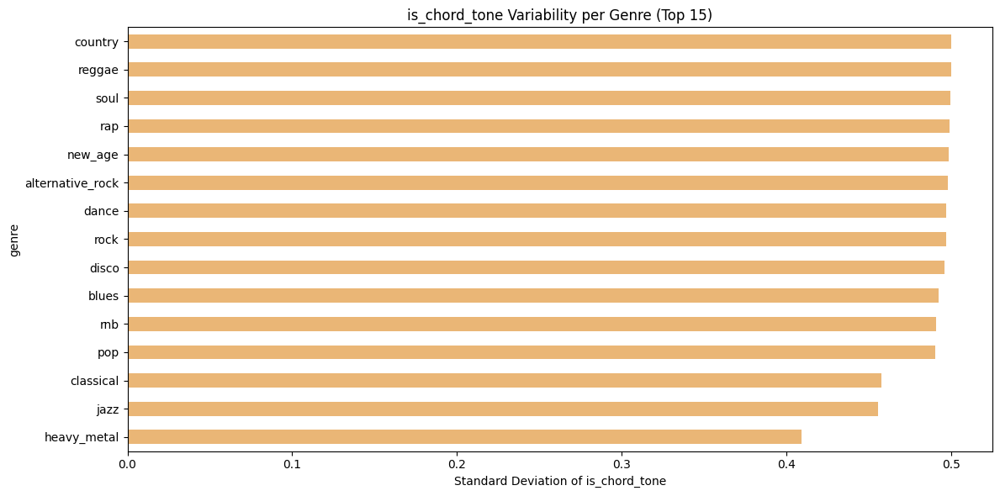

In [ ]:
for feature in expressive_features:
    print(f"\n{feature.upper()} by Genre (STD):")
    display(df.groupby('genre')[feature].std().sort_values(ascending=False).head(10))

    plt.figure(figsize=(12, 6))
    df.groupby('genre')[feature].std().sort_values(ascending=False).head(15).plot(kind='barh', color=colors[1])
    plt.title(f'{feature} Variability per Genre (Top 15)')
    plt.xlabel(f'Standard Deviation of {feature}')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()


##### 2.3.22.4 Rhythmic Placement by Genre


BEAT_POSITION_FLOAT by Genre (mean):


genre
new_age             2.204901
pop                 2.461284
disco               2.517075
rnb                 2.569889
classical           2.576395
alternative_rock    2.582789
heavy_metal         2.619256
jazz                2.626446
rock                2.649050
rap                 2.668382
Name: beat_position_float, dtype: float64

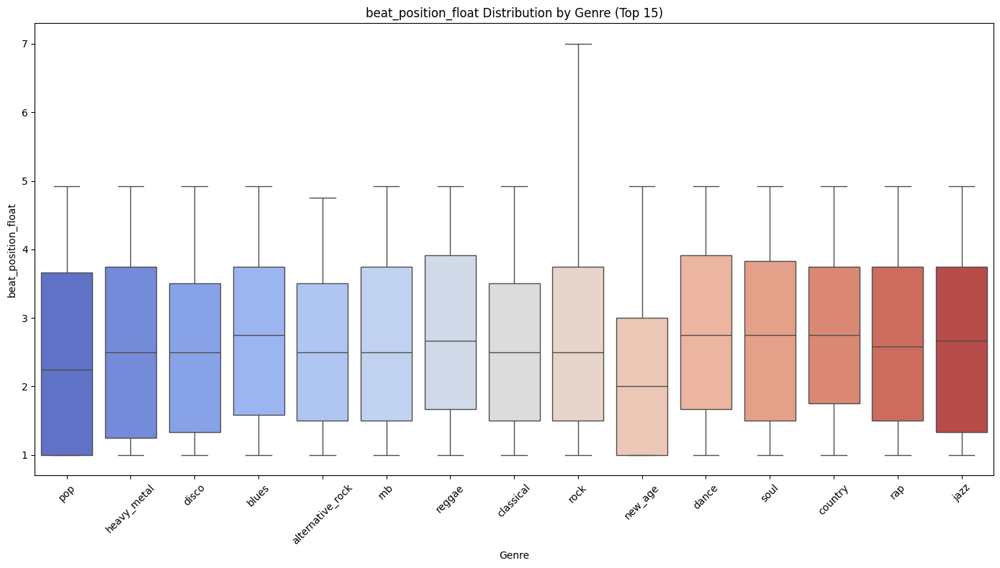


BEAT_FRACTION_FLOAT by Genre (mean):


genre
new_age             0.572884
pop                 0.615321
disco               0.629269
rnb                 0.642472
alternative_rock    0.645697
heavy_metal         0.654814
jazz                0.656612
rock                0.662263
rap                 0.667095
soul                0.674189
Name: beat_fraction_float, dtype: float64

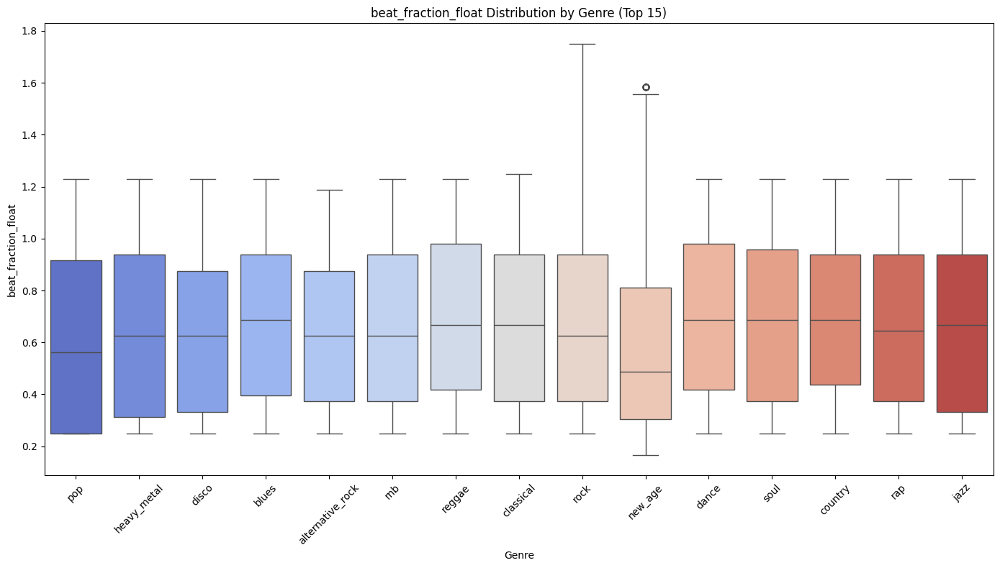

In [ ]:
# Variables related to rhythmic placement
beat_features = ['beat_position_float', 'beat_fraction_float']

for feature in beat_features:
    print(f"\n{feature.upper()} by Genre (mean):")
    display(df.groupby('genre')[feature].mean().sort_values().head(10))

    # Boxplot of beat features across top genres
    plt.figure(figsize=(14, 8))
    top_genres = df['genre'].value_counts().head(15).index
    sns.boxplot(data=df[df['genre'].isin(top_genres)], x='genre', y=feature, palette='coolwarm')
    plt.xticks(rotation=45)
    plt.title(f'{feature} Distribution by Genre (Top 15)')
    plt.xlabel('Genre')
    plt.ylabel(feature)
    plt.tight_layout()
    plt.show()

##### 2.3.22.5 Heatmap of feature averages per genre

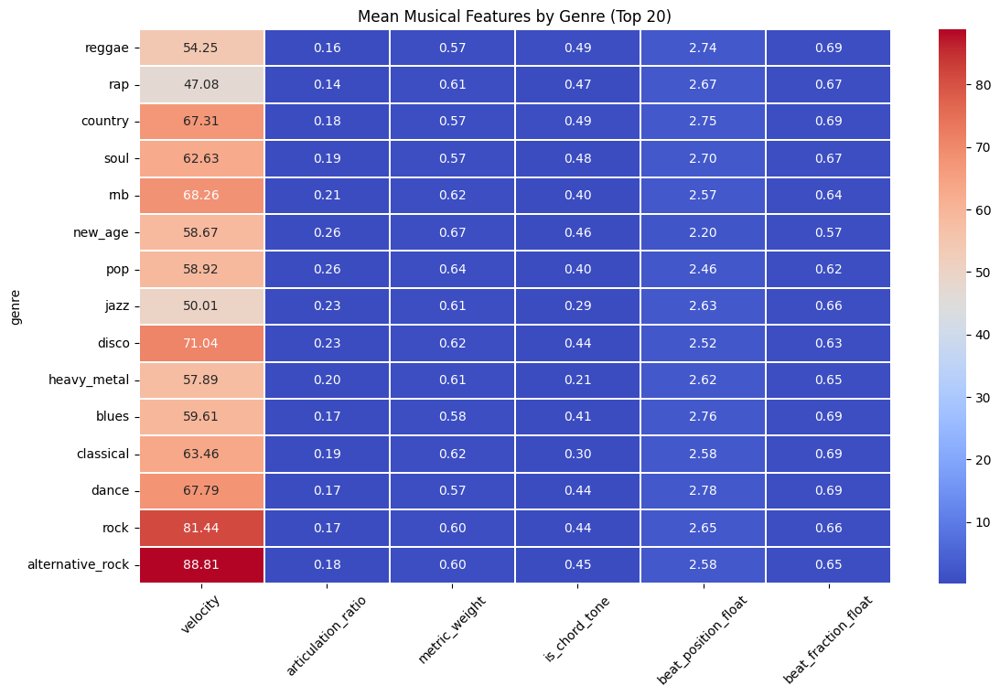

In [ ]:
# Combine all relevant features for heatmap
heatmap_features = expressive_features + beat_features
genre_means = df.groupby('genre')[heatmap_features].mean()

# Use top 20 genres for clarity
top_genres = df['genre'].value_counts().head(20).index
plt.figure(figsize=(12, 8))
sns.heatmap(genre_means.loc[top_genres], annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.2, linecolor='white')
plt.title("Mean Musical Features by Genre (Top 20)")
plt.tight_layout()
plt.xticks(rotation=45)
plt.show()

##### 2.3.22.6 Genres with Extreme Articulation Values

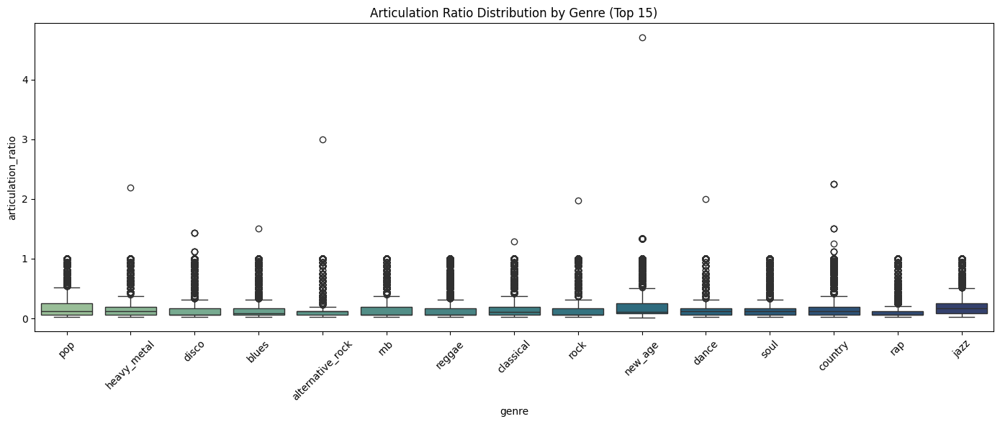

In [ ]:
plt.figure(figsize=(14, 6))
sns.boxplot(data=df[df['genre'].isin(top_genres)], x='genre', y='articulation_ratio', palette='crest')
plt.xticks(rotation=45)
plt.title('Articulation Ratio Distribution by Genre (Top 15)')
plt.tight_layout()
plt.show()

In [ ]:
# Genres with extreme articulation ratio values
extreme_genres = df[df['articulation_ratio'] > 3]['genre'].value_counts()
print("Genres with articulation_ratio > 3:")
print(extreme_genres.head(10))

Genres with articulation_ratio > 3:
genre
new_age    1
Name: count, dtype: int64


In [ ]:
df[(df['genre'] == 'new_age') & (df['articulation_ratio'] > 3)][['filename', 'onset', 'duration', 'beat_fraction_float', 'articulation_ratio']]

,filename,onset,duration,beat_fraction_float,articulation_ratio
129332,The Memory of Trees.mid,24.0,28.25,0.166667,4.708333


##### 2.3.22.7 Temporal Distribution of Events by Genre

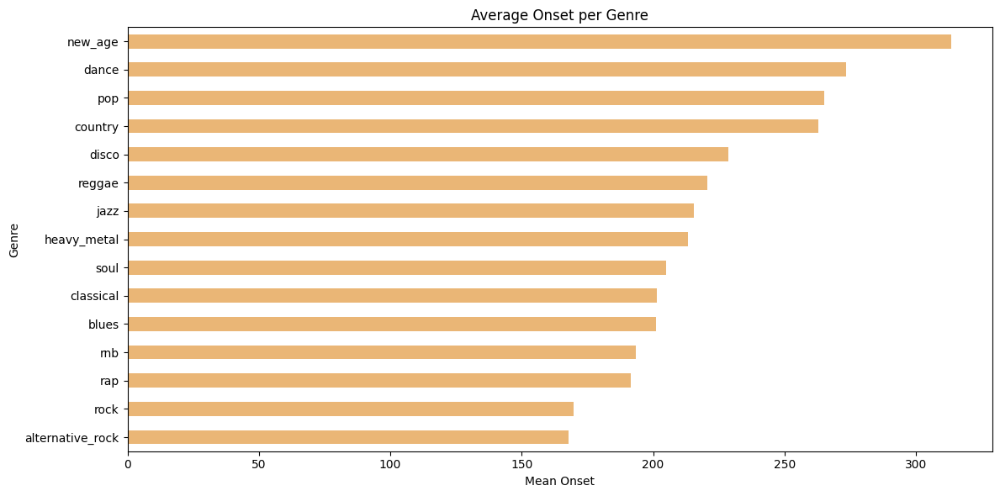

In [ ]:
# Average onset per genre
onset_by_genre = df.groupby('genre')['onset'].mean().sort_values()
onset_by_genre.plot(kind='barh', figsize=(12, 6), color=colors[1])
plt.title("Average Onset per Genre")
plt.xlabel("Mean Onset")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()

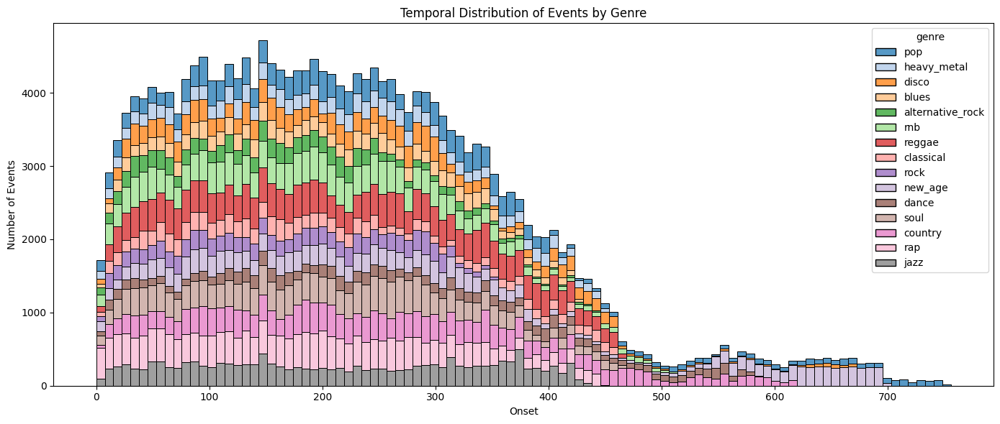

In [ ]:
plt.figure(figsize=(14, 6))
sns.histplot(data=df, x='onset', hue='genre', multiple='stack', palette='tab20', bins=100)
plt.title('Temporal Distribution of Events by Genre')
plt.xlabel('Onset')
plt.ylabel('Number of Events')
plt.tight_layout()
plt.show()

---

## 3. Export

In [ ]:
df.to_excel('datasets/processed_midi_data.xlsx', index=False)